<a href="https://colab.research.google.com/github/JESUSJEREZ/Trabajo-de-Grado_Hotel_Portoalegre/blob/main/Pronostico_Ocupacion_v12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Llegadas

## Carga Datos

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
import pandas as pd
import os

In [ ]:
path = "/content/drive/MyDrive/Tesis/Llegadas/"

In [ ]:
files = [f for f in os.listdir(path) if f.endswith(".json")]

In [ ]:
dfs = []

for file in files:

    with open(os.path.join(path, file)) as f:
        data = json.load(f)

    llegadas = data["data"]["llegadas"]

    df_temp = pd.DataFrame(llegadas)

    dfs.append(df_temp)

In [ ]:
df_llegadas = pd.concat(dfs, ignore_index=True)

In [ ]:
df_llegadas.head()

,id_reserva,id_establecimiento,id_cliente,fecha_creacion,estatus,fecha_ingreso,fecha_salida,total_a_pagar,impuesto,checkin_realizado,...,nombre_cuarto,nombre_categoria,nombre_completo,agencia,plan,agencia_online,id_grupo,id_cuarto,total_huespedes,faltan_datos_checkin
0,15140474,13918,12763835,2025-03-09 17:24:11,fin,2025-04-05 05:00:00,2025-04-09 05:00:00,948956.00,180302.00,1,...,Doble 12,Doble,Lobbybookings,17,None,Booking.com,None,667883,2,0
1,15212255,13918,12583713,2025-03-15 15:57:18,fin,2025-04-05 05:00:00,2025-04-06 05:00:00,493210.00,59395.00,1,...,Cuadruple 15\t\t\t+,Vista al mar,Recepción,WhatsApp Recepción,Alojamiento con desayuno,None,None,668018,4,0
2,15258696,13918,9264611,2025-03-19 14:58:06,fin,2025-04-05 05:00:00,2025-04-06 05:00:00,3359832.00,0.00,1,...,Apartamento 1,Apartamento,Recepción,Hotel Portoalegre,Noche Propietario,None,None,668059,1,0
3,15387097,13918,12724902,2025-03-29 23:18:55,fin,2025-04-05 05:00:00,2025-04-06 05:00:00,160000.00,30400.00,1,...,Doble 13,Doble,Booking Engine,Booking Engine,None,None,None,667884,1,0
4,15454386,13918,12773843,2025-04-05 01:18:12,fin,2025-04-05 05:00:00,2025-04-06 05:00:00,264739.00,50300.00,1,...,Doble 14,Doble,Lobbybookings,17,None,Booking.com,None,667885,2,0


## Limpia Datos

### Arregla Fecha y crea dias estadia

In [ ]:
df_llegadas["fecha_ingreso"] = pd.to_datetime(df_llegadas["fecha_ingreso"])
df_llegadas["fecha_salida"] = pd.to_datetime(df_llegadas["fecha_salida"])

In [ ]:
df_llegadas["dias_estadia"] = (
    df_llegadas["fecha_salida"] - df_llegadas["fecha_ingreso"]
).dt.days

In [ ]:
df_llegadas["fecha_ingreso"] = pd.to_datetime(df_llegadas["fecha_ingreso"]).dt.normalize()
df_llegadas["fecha_salida"] = pd.to_datetime(df_llegadas["fecha_salida"]).dt.normalize()

In [ ]:
df_llegadas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11520 entries, 0 to 11519
Data columns (total 87 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id_reserva                    11520 non-null  object        
 1   id_establecimiento            11520 non-null  object        
 2   id_cliente                    11520 non-null  object        
 3   fecha_creacion                11520 non-null  object        
 4   estatus                       11520 non-null  object        
 5   fecha_ingreso                 11520 non-null  datetime64[ns]
 6   fecha_salida                  11520 non-null  datetime64[ns]
 7   total_a_pagar                 11506 non-null  object        
 8   impuesto                      11494 non-null  object        
 9   checkin_realizado             11483 non-null  object        
 10  checkout_realizado            11353 non-null  object        
 11  nota                        

### Arregla Habitacion

In [ ]:
df_llegadas["nombre_cuarto"].value_counts()

,count
nombre_cuarto,
Doble 14,414
Doble 13,377
Doble 12,370
Doble 22,363
Doble 24,355
Cuadruple 15\t\t\t+,347
Doble 48+,340
Doble 11,336
Doble 25,326


In [ ]:
df_llegadas["nombre_cuarto"] = df_llegadas["nombre_cuarto"].replace({

    # Pasadía + Almuerzo
    "1": "Pasadia + Almuerzo",
    "Pasada día (incluye almuerzo)": "Pasadia + Almuerzo",

    # Pasadía + Almuerzo + Habitación
    "Habitación 47": "Pasadia + Almuerzo + Habitacion",
    "Cama 1": "Pasadia + Almuerzo + Habitacion",
    "Pasadia con almuerzo + Habitación": "Pasadia + Almuerzo + Habitacion"

})

In [ ]:
df_llegadas["nombre_cuarto"] = df_llegadas["nombre_cuarto"].str.replace(r"\+$", "", regex=True)

In [ ]:
df_llegadas["nombre_cuarto"] = df_llegadas["nombre_cuarto"].str.replace(r"\(2 camas\)", "", regex=True)

In [ ]:
df_llegadas["nombre_cuarto"] = df_llegadas["nombre_cuarto"].str.replace("\t", "", regex=False).str.strip()

In [ ]:
# Verifica

df_llegadas["nombre_cuarto"].value_counts()

,count
nombre_cuarto,
Doble 14,414
Doble 13,377
Doble 12,370
Doble 22,363
Doble 24,355
Cuadruple 15,347
Doble 48,340
Doble 11,336
Doble 25,326


In [ ]:
df_llegadas.to_excel("df_llegadas.xlsx", index=False)

# Ingresos Reserva

##Carga Datos

In [ ]:
path = "/content/drive/MyDrive/Tesis/Ingresos Reserva/Ingresos_Reserva_2023_2026.xlsx"

In [ ]:
import pandas as pd

file_path = "/content/drive/MyDrive/Tesis/Ingresos Reserva/Ingresos_Reserva_2023_2026.xlsx"

df = pd.read_excel(file_path)

df.head()

,ID de la reserva,Titular,Cliente,Tipo doc,Identificaci󮼯th>,Nacionalidad,Ocupaci󮼯th>,Ingreso-Salida,Habitaci󮠼/th>,Agencia,...,Transferencia bancaria,wompi,Nequi,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compa񭡼/th>,Abonos a񯠲025
0,#7066729,PAOLA ANDREA ORDOхS GARĆ,PAOLA ANDREA ORDOхS GARĆ,C餵la de ciudadan_xD87C_/td>,39451447,Colombia,NaN,01/01/2023 - 04/01/2023,Familiar 86,Venta pag web,...,1000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,#6816119,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,C餵la de ciudadan_xD87C_/td>,1023925636,Colombia,NaN,01/01/2023 - 02/01/2023,Cuadruple 37,Venta Directa x Vendedor,...,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,#6816120,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,C餵la de ciudadan_xD87C_/td>,1023925636,Colombia,NaN,01/01/2023 - 02/01/2023,Cuadruple 38,Venta Directa x Vendedor,...,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,#6816121,maira giraldo garcia,maira giraldo garcia,C餵la de ciudadan_xD87C_/td>,1120376694,Colombia,NaN,01/01/2023 - 02/01/2023,Doble 87,Booking Engine,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,#7053733,yenny restrepo,yenny restrepo,C餵la de ciudadan_xD87C_/td>,43909367,Colombia,NaN,01/01/2023 - 20/01/2023,Doble 39,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11835 entries, 0 to 11834
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID de la reserva            11835 non-null  object 
 1   Titular                     11835 non-null  object 
 2   Cliente                     11835 non-null  object 
 3   Tipo doc                    11817 non-null  object 
 4   Identificaci󮼯th>            11802 non-null  object 
 5   Nacionalidad                11820 non-null  object 
 6   Ocupaci󮼯th>                 861 non-null    object 
 7   Ingreso-Salida              11835 non-null  object 
 8   Habitaci󮠼/th>               11835 non-null  object 
 9   Agencia                     11321 non-null  object 
 10  Alojamiento                 11835 non-null  float64
 11  Usuario                     11835 non-null  object 
 12  Consumos y extras           11835 non-null  float64
 13  Subtotal                    118

## Limpia Datos

### Limpia Tipo Doc

In [ ]:
df["Tipo doc"].value_counts()

,count
Tipo doc,
C餵la de ciudadan_xD87C_/td>,11011
NIT,513
Tarjeta de identidad,129
Pasaporte,60
C餵la de extranjer_xD87C_/td>,60
Empresas,35
DNI,9


In [ ]:
#Limpia Columna

df["Tipo doc"] = df["Tipo doc"].replace({
    "C餵la de ciudadan_xD87C_/td>": "Cedula de ciudadania",
    "C餵la de extranjer_xD87C_/td>": "Cedula de extranjeria"
})

In [ ]:
# Verifica

df["Tipo doc"].value_counts()

,count
Tipo doc,
Cedula de ciudadania,11011
NIT,513
Tarjeta de identidad,129
Pasaporte,60
Cedula de extranjeria,60
Empresas,35
DNI,9


### Crea Fecha Ingreso, Salida y Dias Estadia

In [ ]:
# separar fechas
df[["Fecha_Ingreso","Fecha_Salida"]] = df["Ingreso-Salida"].str.split(" - ", expand=True)

# convertir a formato fecha
df["Fecha_Ingreso"] = pd.to_datetime(df["Fecha_Ingreso"], format="%d/%m/%Y")
df["Fecha_Salida"] = pd.to_datetime(df["Fecha_Salida"], format="%d/%m/%Y")

# calcular dias de hospedaje
df["Dias_Hospedaje"] = (df["Fecha_Salida"] - df["Fecha_Ingreso"]).dt.days

In [ ]:
# Verifica

df[["Fecha_Ingreso","Fecha_Salida","Dias_Hospedaje"]].head()

,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje
0,2023-01-01,2023-01-04,3
1,2023-01-01,2023-01-02,1
2,2023-01-01,2023-01-02,1
3,2023-01-01,2023-01-02,1
4,2023-01-01,2023-01-20,19


In [ ]:
df = df.drop(columns=["Ingreso-Salida"])

In [ ]:
df.head()

,ID de la reserva,Titular,Cliente,Tipo doc,Identificaci󮼯th>,Nacionalidad,Ocupaci󮼯th>,Habitaci󮠼/th>,Agencia,Alojamiento,...,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compa񭡼/th>,Abonos a񯠲025,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje
0,#7066729,PAOLA ANDREA ORDOхS GARĆ,PAOLA ANDREA ORDOхS GARĆ,Cedula de ciudadania,39451447,Colombia,NaN,Familiar 86,Venta pag web,2463300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-04,3
1,#6816119,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 37,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
2,#6816120,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 38,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
3,#6816121,maira giraldo garcia,maira giraldo garcia,Cedula de ciudadania,1120376694,Colombia,NaN,Doble 87,Booking Engine,360000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
4,#7053733,yenny restrepo,yenny restrepo,Cedula de ciudadania,43909367,Colombia,NaN,Doble 39,NaN,7140000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-20,19


### Arregla Habitacion

In [ ]:
df["Habitaci󮠼/th>"].value_counts()

,count
Habitaci󮠼/th>,
Doble 14,426
Doble 13,384
Doble 12,378
Doble 22,372
Doble 24,368
Cuadruple 15 +,348
Doble 11,346
Doble 48+,345
Doble 25,340


In [ ]:
df["Habitaci󮠼/th>"] = df["Habitaci󮠼/th>"].replace({

    # Pasadía + Almuerzo
    1: "Pasadia + Almuerzo",
    "Pasada d_xD860_(incluye almuerzo)": "Pasadia + Almuerzo",

    # Pasadía + Almuerzo + Habitación
    "Habitaci󮠴7": "Pasadia + Almuerzo + Habitacion",
    "Cama 1": "Pasadia + Almuerzo + Habitacion",
    "Pasadia con almuerzo + Habitaci󮼯td>": "Pasadia + Almuerzo + Habitacion"

})

In [ ]:
df["Habitaci󮠼/th>"] = df["Habitaci󮠼/th>"].str.replace(r"\+$", "", regex=True)

In [ ]:
df["Habitaci󮠼/th>"] = df["Habitaci󮠼/th>"].str.replace(r"\(2 camas\)", "", regex=True)

In [ ]:
df = df.rename(columns={"Habitaci󮠼/th>": "Habitacion"})

In [ ]:
# Verifica

df["Habitacion"].value_counts()

,count
Habitacion,
Doble 14,426
Doble 13,384
Doble 12,378
Doble 22,372
Doble 24,368
Cuadruple 15,348
Doble 11,346
Doble 48,345
Doble 25,340


In [ ]:
df.head()

,ID de la reserva,Titular,Cliente,Tipo doc,Identificaci󮼯th>,Nacionalidad,Ocupaci󮼯th>,Habitacion,Agencia,Alojamiento,...,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compa񭡼/th>,Abonos a񯠲025,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje
0,#7066729,PAOLA ANDREA ORDOхS GARĆ,PAOLA ANDREA ORDOхS GARĆ,Cedula de ciudadania,39451447,Colombia,NaN,Familiar 86,Venta pag web,2463300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-04,3
1,#6816119,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 37,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
2,#6816120,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 38,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
3,#6816121,maira giraldo garcia,maira giraldo garcia,Cedula de ciudadania,1120376694,Colombia,NaN,Doble 87,Booking Engine,360000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
4,#7053733,yenny restrepo,yenny restrepo,Cedula de ciudadania,43909367,Colombia,NaN,Doble 39,NaN,7140000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-20,19


### Arregla ID Reserva

In [ ]:
df["ID de la reserva"] = df["ID de la reserva"].str.replace("#", "", regex=False)

In [ ]:
df.rename(columns={"ID de la reserva": "ID_Reserva"}, inplace=True)

In [ ]:
df.head()

,ID_Reserva,Titular,Cliente,Tipo doc,Identificaci󮼯th>,Nacionalidad,Ocupaci󮼯th>,Habitacion,Agencia,Alojamiento,...,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compa񭡼/th>,Abonos a񯠲025,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje
0,7066729,PAOLA ANDREA ORDOхS GARĆ,PAOLA ANDREA ORDOхS GARĆ,Cedula de ciudadania,39451447,Colombia,NaN,Familiar 86,Venta pag web,2463300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-04,3
1,6816119,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 37,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
2,6816120,DEISY PAOLA BALLESTEROS REYES,DEISY PAOLA BALLESTEROS REYES,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 38,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
3,6816121,maira giraldo garcia,maira giraldo garcia,Cedula de ciudadania,1120376694,Colombia,NaN,Doble 87,Booking Engine,360000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
4,7053733,yenny restrepo,yenny restrepo,Cedula de ciudadania,43909367,Colombia,NaN,Doble 39,NaN,7140000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-20,19


### Arregla Nombre Cliente y Titular

In [ ]:
df["Titular"] = df["Titular"].str.strip().str.title()
df["Cliente"] = df["Cliente"].str.strip().str.title()

In [ ]:
df = df.rename(columns={"Identificaci󮼯th>": "Identificacion"})
df = df.rename(columns={"Ocupaci󮼯th>": "Ocupacion"})
df = df.rename(columns={"PENDIENTE": "Pendiente"})
df = df.rename(columns={"Tarjeta D颩to": "Tarjeta Debito"})
df = df.rename(columns={"Tarjeta Cr餩to": "Tarjeta Credito"})
df = df.rename(columns={"wompi": "Wompi"})
df = df.rename(columns={"Cta por cobrar compa񭡼/th>": "Cta por cobrar compania"})
df = df.rename(columns={"Abonos a񯠲025": "Abonos"})

In [ ]:
df.head()

,ID_Reserva,Titular,Cliente,Tipo doc,Identificacion,Nacionalidad,Ocupacion,Habitacion,Agencia,Alojamiento,...,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compania,Abonos,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje
0,7066729,Paola Andrea Ordoхs Garć,Paola Andrea Ordoхs Garć,Cedula de ciudadania,39451447,Colombia,NaN,Familiar 86,Venta pag web,2463300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-04,3
1,6816119,Deisy Paola Ballesteros Reyes,Deisy Paola Ballesteros Reyes,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 37,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
2,6816120,Deisy Paola Ballesteros Reyes,Deisy Paola Ballesteros Reyes,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 38,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
3,6816121,Maira Giraldo Garcia,Maira Giraldo Garcia,Cedula de ciudadania,1120376694,Colombia,NaN,Doble 87,Booking Engine,360000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1
4,7053733,Yenny Restrepo,Yenny Restrepo,Cedula de ciudadania,43909367,Colombia,NaN,Doble 39,NaN,7140000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-01,2023-01-20,19


### Arregla Agencia

In [ ]:
df["Agencia"] = df["Agencia"].replace("WhatsApp Recepci󮼯td>", "WhatsApp Recepcion")

In [ ]:
df["Agencia"].value_counts()

,count
Agencia,
Venta Puerta,4329
Venta Sandra Ospina,1063
Venta Directa x Vendedor,1023
Venta por agencia,963
WhatsApp Recepcion,854
Hotel Portoalegre,684
Booking.com,547
Booking Engine,417
Venta Libardo Melo,363


### Crea mes, dia y año

In [ ]:
df["Año"] = df["Fecha_Ingreso"].dt.year
df["Mes"] = df["Fecha_Ingreso"].dt.month
df["Dia"] = df["Fecha_Ingreso"].dt.day

In [ ]:
df[["Fecha_Ingreso","Año","Mes","Dia"]].head()

,Fecha_Ingreso,Año,Mes,Dia
0,2023-01-01,2023,1,1
1,2023-01-01,2023,1,1
2,2023-01-01,2023,1,1
3,2023-01-01,2023,1,1
4,2023-01-01,2023,1,1


In [ ]:
df.head()

,ID_Reserva,Titular,Cliente,Tipo doc,Identificacion,Nacionalidad,Ocupacion,Habitacion,Agencia,Alojamiento,...,Retefuente,Cta por cobrar propietario,Cta por cobrar compania,Abonos,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje,Año,Mes,Dia
0,7066729,Paola Andrea Ordoхs Garć,Paola Andrea Ordoхs Garć,Cedula de ciudadania,39451447,Colombia,NaN,Familiar 86,Venta pag web,2463300.0,...,0.0,0.0,0.0,0.0,2023-01-01,2023-01-04,3,2023,1,1
1,6816119,Deisy Paola Ballesteros Reyes,Deisy Paola Ballesteros Reyes,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 37,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1,2023,1,1
2,6816120,Deisy Paola Ballesteros Reyes,Deisy Paola Ballesteros Reyes,Cedula de ciudadania,1023925636,Colombia,NaN,Cuadruple 38,Venta Directa x Vendedor,580000.0,...,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1,2023,1,1
3,6816121,Maira Giraldo Garcia,Maira Giraldo Garcia,Cedula de ciudadania,1120376694,Colombia,NaN,Doble 87,Booking Engine,360000.0,...,0.0,0.0,0.0,0.0,2023-01-01,2023-01-02,1,2023,1,1
4,7053733,Yenny Restrepo,Yenny Restrepo,Cedula de ciudadania,43909367,Colombia,NaN,Doble 39,NaN,7140000.0,...,0.0,0.0,0.0,0.0,2023-01-01,2023-01-20,19,2023,1,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11835 entries, 0 to 11834
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID_Reserva                  11835 non-null  object        
 1   Titular                     11835 non-null  object        
 2   Cliente                     11835 non-null  object        
 3   Tipo doc                    11817 non-null  object        
 4   Identificacion              11802 non-null  object        
 5   Nacionalidad                11820 non-null  object        
 6   Ocupacion                   861 non-null    object        
 7   Habitacion                  11835 non-null  object        
 8   Agencia                     11321 non-null  object        
 9   Alojamiento                 11835 non-null  float64       
 10  Usuario                     11835 non-null  object        
 11  Consumos y extras           11835 non-null  float64   

##  Ingreso Por Año

In [ ]:
ingreso_por_año = df.groupby("Año")["Total"].sum().reset_index()

ingreso_por_año

,Año,Total
0,2023,2.411384e+09
1,2024,2.439849e+09
2,2025,3.116366e+09
3,2026,7.585340e+08


In [ ]:
ingreso_por_año["Total"] = ingreso_por_año["Total"].map(
    lambda x: f"{x:,.0f}".replace(",", ".")
)

ingreso_por_año

,Año,Total
0,2023,2.411.383.689
1,2024,2.439.848.590
2,2025,3.116.366.390
3,2026,758.534.041


## Forma de pago

In [ ]:
columnas_pago = [
    "Pendiente",
    "Efectivo",
    "Tarjeta Debito",
    "Tarjeta Credito",
    "Transferencia bancaria",
    "Wompi",
    "Nequi",
    "Corresponsal Bancario",
    "PSE",
    "Boton Pagos Bancolombia",
    "Retefuente",
    "Cta por cobrar propietario",
    "Cta por cobrar compania",
    "Abonos"
]

In [ ]:
df["Suma_Pagos"] = df[columnas_pago].sum(axis=1)

In [ ]:
import numpy as np

df_correctos = df[np.isclose(df["Total"], df["Suma_Pagos"])]

In [ ]:
# suma total por cada medio de pago
suma_pagos_correctos = df_correctos[columnas_pago].sum()

# total general de ingresos
total_correctos = df_correctos["Total"].sum()

# porcentaje que representa cada medio de pago
porcentajes_pago = suma_pagos_correctos / total_correctos

porcentajes_pago

,0
Pendiente,0.009034
Efectivo,0.202816
Tarjeta Debito,0.185141
Tarjeta Credito,0.116792
Transferencia bancaria,0.456849
Wompi,0.008218
Nequi,0.002675
Corresponsal Bancario,0.008991
PSE,0.002228
Boton Pagos Bancolombia,0.000141


In [ ]:
df_correctos = df_correctos.drop(columns=["Suma_Pagos"])

In [ ]:
df_correctos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11829 entries, 0 to 11834
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID_Reserva                  11829 non-null  object        
 1   Titular                     11829 non-null  object        
 2   Cliente                     11829 non-null  object        
 3   Tipo doc                    11813 non-null  object        
 4   Identificacion              11798 non-null  object        
 5   Nacionalidad                11816 non-null  object        
 6   Ocupacion                   861 non-null    object        
 7   Habitacion                  11829 non-null  object        
 8   Agencia                     11316 non-null  object        
 9   Alojamiento                 11829 non-null  float64       
 10  Usuario                     11829 non-null  object        
 11  Consumos y extras           11829 non-null  float64       


In [ ]:
df_incorrectos = df[~np.isclose(df["Total"], df["Suma_Pagos"])]

In [ ]:
df_incorrectos.shape

(6, 37)

In [ ]:
df_incorrectos.head(20)

,ID_Reserva,Titular,Cliente,Tipo doc,Identificacion,Nacionalidad,Ocupacion,Habitacion,Agencia,Alojamiento,...,Cta por cobrar propietario,Cta por cobrar compania,Abonos,Fecha_Ingreso,Fecha_Salida,Dias_Hospedaje,Año,Mes,Dia,Suma_Pagos
2147,9248155,Crisanto Curubo Duarte,Crisanto Curubo Duarte,Cedula de ciudadania,91292718,Colombia,NaN,Doble 74,Venta Puerta,896202.0,...,0.0,0.0,0.0,2023-08-23,2023-09-01,9,2023,8,23,0.0
2148,9248156,Robinson Almir Salamanca Molano,Robinson Almir Salamanca Molano,Cedula de ciudadania,91244748,Colombia,NaN,Doble 73,Venta Puerta,298734.0,...,0.0,0.0,0.0,2023-08-23,2023-08-26,3,2023,8,23,0.0
2157,9272324,Julieth Camila Maldonado Pava,Julieth Camila Maldonado Pava,Cedula de ciudadania,1095842321,Colombia,NaN,Triple 17,Venta Puerta,697046.0,...,0.0,0.0,0.0,2023-08-25,2023-09-01,7,2023,8,25,0.0
2203,9248154,Cic,Cic,NaN,NaN,NaN,NaN,Doble 11,Venta Puerta,99578.0,...,0.0,0.0,0.0,2023-08-27,2023-08-28,1,2023,8,27,0.0
2211,9299606,Cic,Cic,NaN,NaN,NaN,NaN,Doble 73,NaN,497890.0,...,0.0,0.0,0.0,2023-08-28,2023-09-02,5,2023,8,28,0.0
2432,8881186,Maria Nelfi Medina Ninco,Maria Nelfi Medina Ninco,Cedula de ciudadania,36159693,Colombia,NaN,Triple 44,Booking.com,1297318.0,...,0.0,0.0,0.0,2023-09-20,2023-09-22,2,2023,9,20,1177538.0


### Para los registros que no suman el total, se asume la distribución de la forma de pago de los clientes que sí suman el total

In [ ]:
df_estimados = df_incorrectos.copy()

for col in columnas_pago:
    df_estimados[col] = df_estimados["Total"] * porcentajes_pago[col]

In [ ]:
df_estimados[columnas_pago] = df_estimados[columnas_pago].round(0)

In [ ]:
df_estimados[["Total"] + columnas_pago].head()

,Total,Pendiente,Efectivo,Tarjeta Debito,Tarjeta Credito,Transferencia bancaria,Wompi,Nequi,Corresponsal Bancario,PSE,Boton Pagos Bancolombia,Retefuente,Cta por cobrar propietario,Cta por cobrar compania,Abonos
2147,968202.0,8746.0,196367.0,179254.0,113078.0,442322.0,7957.0,2590.0,8705.0,2157.0,137.0,1093.0,295.0,1905.0,3596.0
2148,322734.0,2915.0,65456.0,59751.0,37693.0,147441.0,2652.0,863.0,2902.0,719.0,46.0,364.0,98.0,635.0,1199.0
2157,753046.0,6803.0,152730.0,139420.0,87950.0,344028.0,6189.0,2014.0,6771.0,1678.0,106.0,850.0,229.0,1482.0,2797.0
2203,107578.0,972.0,21819.0,19917.0,12564.0,49147.0,884.0,288.0,967.0,240.0,15.0,121.0,33.0,212.0,400.0
2211,529890.0,4787.0,107470.0,98105.0,61887.0,242080.0,4355.0,1417.0,4764.0,1181.0,75.0,598.0,161.0,1043.0,1968.0


In [ ]:
df_estimados = df_estimados.drop(columns=["Suma_Pagos"])

In [ ]:
df_estimados.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6 entries, 2147 to 2432
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID_Reserva                  6 non-null      object        
 1   Titular                     6 non-null      object        
 2   Cliente                     6 non-null      object        
 3   Tipo doc                    4 non-null      object        
 4   Identificacion              4 non-null      object        
 5   Nacionalidad                4 non-null      object        
 6   Ocupacion                   0 non-null      object        
 7   Habitacion                  6 non-null      object        
 8   Agencia                     5 non-null      object        
 9   Alojamiento                 6 non-null      float64       
 10  Usuario                     6 non-null      object        
 11  Consumos y extras           6 non-null      float64       
 1

In [ ]:
df_final = pd.concat([df_correctos, df_estimados], ignore_index=True)

In [ ]:
df_final.shape

(11835, 36)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11835 entries, 0 to 11834
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID_Reserva                  11835 non-null  object        
 1   Titular                     11835 non-null  object        
 2   Cliente                     11835 non-null  object        
 3   Tipo doc                    11817 non-null  object        
 4   Identificacion              11802 non-null  object        
 5   Nacionalidad                11820 non-null  object        
 6   Ocupacion                   861 non-null    object        
 7   Habitacion                  11835 non-null  object        
 8   Agencia                     11321 non-null  object        
 9   Alojamiento                 11835 non-null  float64       
 10  Usuario                     11835 non-null  object        
 11  Consumos y extras           11835 non-null  float64   

In [ ]:
ingreso_por_año = df_final.groupby("Año")["Total"].sum().reset_index()

ingreso_por_año

,Año,Total
0,2023,2.411384e+09
1,2024,2.439849e+09
2,2025,3.116366e+09
3,2026,7.585340e+08


In [ ]:
ingreso_por_año["Total"] = ingreso_por_año["Total"].map(
    lambda x: f"{x:,.0f}".replace(",", ".")
)

ingreso_por_año

,Año,Total
0,2023,2.411.383.689
1,2024,2.439.848.590
2,2025,3.116.366.390
3,2026,758.534.041


In [ ]:
df_final.to_excel("df_final.xlsx", index=False)

# Construcción base reservas

In [ ]:
# Trae info necesaria de llegadas

df_dep = df_llegadas[["id_reserva", "fecha_ingreso","fecha_salida","ingresos","numero_personas","nombre_cuarto","id_grupo","agencia","nombre","primer_apellido","segundo_apellido","email","nombre_categoria","dias_estadia"]].copy()
cols = ["nombre", "primer_apellido", "segundo_apellido"]

df_dep[cols] = df_dep[cols].apply(lambda x: x.str.strip().str.title())
df_dep.head()

,id_reserva,fecha_ingreso,fecha_salida,ingresos,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,email,nombre_categoria,dias_estadia
0,15140474,2025-04-05,2025-04-09,1129258.00,2,Doble 12,None,17,Camila,Calderón,Otero,camicalot@gmail.com,Doble,4
1,15212255,2025-04-05,2025-04-06,422000.00,4,Cuadruple 15,None,WhatsApp Recepción,Angie Carolina,Bonilla,Bolivar,angiebonilla167@gmail.com,Vista al mar,1
2,15258696,2025-04-05,2025-04-06,0.00,1,Apartamento 1,None,Hotel Portoalegre,Asamblea,Potoalegre,,hotelportoalegre@gmail.com,Apartamento,1
3,15387097,2025-04-05,2025-04-06,176400.00,1,Doble 13,None,Booking Engine,Carolina,Arellano,Rosero,caojose2004@yahoo.com,Doble,1
4,15454386,2025-04-05,2025-04-06,315039.00,2,Doble 14,None,17,Andersson,Paternina Benítez,Benítez,ander-pave@hotmail.com,Doble,1


## Pone data en base diaria, no por rangos

In [ ]:
import pandas as pd

# asegurar que las fechas sean datetime
df_dep["fecha_ingreso"] = pd.to_datetime(df_dep["fecha_ingreso"])
df_dep["fecha_salida"] = pd.to_datetime(df_dep["fecha_salida"])

# crear lista de noches
df_dep["fecha_noche"] = df_dep.apply(
    lambda x: pd.date_range(start=x["fecha_ingreso"],
                            end=x["fecha_salida"] - pd.Timedelta(days=1)),
    axis=1
)

# expandir filas
df_noches = df_dep.explode("fecha_noche").reset_index(drop=True)

In [ ]:
##Verifica

df_noches[df_noches["id_reserva"] == "15258661"]

,id_reserva,fecha_ingreso,fecha_salida,ingresos,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,email,nombre_categoria,dias_estadia,fecha_noche
24525,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-04
24526,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-05
24527,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-06


## Calcula Capacidad total por habitacion

In [ ]:
capacidad_map = {
    "Doble": 2,
    "Triple": 3,
    "Cuádruple": 4,
    "Familiar": 5,
    "Vista al mar": 4,
    "Twin": 2,
    "Apartamento": 8,
    "Junior Suite": 2
}

df_noches["capacidad"] = df_noches["nombre_categoria"].map(capacidad_map).fillna(1)

In [ ]:
#Verifica

df_noches[["nombre_categoria","capacidad"]].drop_duplicates()

,nombre_categoria,capacidad
0,Doble,2.0
4,Vista al mar,4.0
5,Apartamento,8.0
8,Triple,3.0
17,Cuádruple,4.0
59,Twin,2.0
77,Junior Suite,2.0
84,Familiar,5.0
359,Pasadia con almuerzo + Habitación,1.0
361,Pasada día (incluye almuerzo),1.0


In [ ]:
#Verifica

df_noches[df_noches["id_reserva"] == "15258661"]

,id_reserva,fecha_ingreso,fecha_salida,ingresos,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,email,nombre_categoria,dias_estadia,fecha_noche,capacidad
24525,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-04,4.0
24526,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-05,4.0
24527,15258661,2025-04-04,2025-04-07,0.00,1,Cuadruple 38,None,Noche Propietarios,Mauricio,Matiz,,matizmauricio@gmail.com,Cuádruple,3,2025-04-06,4.0


## Trae id_reserva que paga

In [ ]:
idx = df_noches.groupby("id_grupo")["ingresos"].idxmax()

df_reserva_pago = df_noches.loc[idx, ["id_grupo", "id_reserva"]]
df_reserva_pago = df_reserva_pago.rename(columns={"id_reserva": "Reserva_pago"})

In [ ]:
df_noches = df_noches.merge(df_reserva_pago, on="id_grupo", how="left")

In [ ]:
df_noches["Reserva_pago"] = df_noches["Reserva_pago"].fillna(df_noches["id_reserva"])

## Trae info financiera

In [ ]:
df_noches = df_noches.merge(
    df_final[
        [
            "ID_Reserva",
            "Total",
            "Tipo doc",
            "Identificacion",
            "Nacionalidad",
            "Alojamiento",
            "Consumos y extras",
            "Pagado",
            "Pendiente",
            "Efectivo",
            "Tarjeta Debito",
            "Tarjeta Credito",
            "Transferencia bancaria",
            "Wompi",
            "Nequi",
            "Corresponsal Bancario",
            "PSE",
            "Boton Pagos Bancolombia",
            "Retefuente",
            "Cta por cobrar propietario",
            "Cta por cobrar compania",
            "Abonos"
        ]
    ],
    left_on="Reserva_pago",
    right_on="ID_Reserva",
    how="left"
)

In [ ]:
df_noches = df_noches.drop(columns=["ID_Reserva"])

## Distribuye pago en habitaciones

In [ ]:
import numpy as np

# convertir numero_personas a número
df_noches['numero_personas'] = pd.to_numeric(df_noches['numero_personas'], errors='coerce')

# suma de capacidad por reserva
capacidad_total = df_noches.groupby('Reserva_pago')['numero_personas'].transform('sum')

# evitar división por 0
capacidad_total = capacidad_total.replace(0, np.nan)

# distribución proporcional
df_noches['ingreso_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Total']
df_noches['alojamiento_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Alojamiento']
df_noches['consumos_y_extras_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Consumos y extras']
df_noches['pagado_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Pagado']
df_noches['pendiente_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Pendiente']
df_noches['efectivo_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Efectivo']
df_noches['tarjeta_debito_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Tarjeta Debito']
df_noches['tarjeta_credito_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Tarjeta Credito']
df_noches['transferencia_bancaria_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Transferencia bancaria']
df_noches['wompi_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Wompi']
df_noches['nequi_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Nequi']
df_noches['corresponsal_bancario_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Corresponsal Bancario']
df_noches['pse_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['PSE']
df_noches['boton_pagos_bancolombia_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Boton Pagos Bancolombia']
df_noches['retefuente_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Retefuente']
df_noches['cta_por_cobrar_propietario_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Cta por cobrar propietario']
df_noches['cta_por_cobrar_compania_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Cta por cobrar compania']
df_noches['abonos_distribuido'] = (df_noches['numero_personas'] / capacidad_total) * df_noches['Abonos']

In [ ]:
df_noches = df_noches.drop(columns=[
    'ingresos',
    'Total',
    'Alojamiento',
    'Consumos y extras',
    'Pagado',
    'Pendiente',
    'Efectivo',
    'Tarjeta Debito',
    'Tarjeta Credito',
    'Transferencia bancaria',
    'Wompi',
    'Nequi',
    'Corresponsal Bancario',
    'PSE',
    'Boton Pagos Bancolombia',
    'Retefuente',
    'Cta por cobrar propietario',
    'Cta por cobrar compania',
    'Abonos',
    'pagado_distribuido'
])

In [ ]:
df_noches.to_excel("df_noches.xlsx", index=False)

## Trae reservas que tienen ingresos pero no llegada asociada

In [ ]:
# merge para comparar
df_check = df_final.merge(
    df_noches[['Reserva_pago']],
    left_on='ID_Reserva',
    right_on='Reserva_pago',
    how='left',
    indicator=True
)

# registros que están en df_final pero NO en df_noches
df_no_en_noches = df_check[df_check['_merge'] == 'left_only'][[
    'ID_Reserva',
    'Fecha_Ingreso',
    'Fecha_Salida',
    'Total',
    'Habitacion',
    'Agencia',
    'Cliente',
    'Tipo doc',
    'Identificacion',
    'Nacionalidad',
    'Alojamiento',
    'Consumos y extras',
    'Pagado',
    'Pendiente',
    'Efectivo',
    'Tarjeta Debito',
    'Tarjeta Credito',
    'Transferencia bancaria',
    'Wompi',
    'Nequi',
    'Corresponsal Bancario',
    'PSE',
    'Boton Pagos Bancolombia',
    'Retefuente',
    'Cta por cobrar propietario',
    'Cta por cobrar compania',
    'Abonos'
]]

In [ ]:
df_no_en_noches = df_no_en_noches.rename(columns={
    'ID_Reserva': 'id_reserva',
    'Fecha_Ingreso': 'fecha_ingreso',
    'Fecha_Salida': 'fecha_salida',
    'Total': 'ingresos',
    'Agencia': 'agencia',
    'Cliente': 'nombre'
})

In [ ]:
cap_map = {
    'apartamento 1': 8,
    'cuadruple 15': 4, 'cuadruple 36': 4, 'cuadruple 37': 4, 'cuadruple 38': 4,
    'cuadruple 43': 4, 'cuadruple 46': 4, 'cuadruple 75': 4, 'cuadruple 76': 4,
    'cuadruple 77': 4, 'cuadruple 85': 4,
    'doble 11': 2, 'doble 12': 2, 'doble 13': 2, 'doble 14': 2, 'doble 22': 2,
    'doble 24': 2, 'doble 25': 2, 'doble 39': 2, 'doble 47': 2, 'doble 48': 2,
    'doble 73': 2, 'doble 74': 2, 'doble 84': 2, 'doble 87': 2,
    'familiar 16': 5, 'familiar 34': 5, 'familiar 71': 5, 'familiar 72': 5,
    'familiar 81': 5, 'familiar 82': 5, 'familiar 86': 5,
    'pasadia + almuerzo': 1,
    'pasadia + almuerzo + habitacion': 2,
    'triple 17': 3, 'triple 31': 3, 'triple 32': 3, 'triple 33': 3,
    'triple 35': 3, 'triple 41': 3, 'triple 42': 3, 'triple 44': 3,
    'triple 45': 3, 'triple 83': 3,
    'twin 21': 2
}

# normalizar texto
df_no_en_noches['Habitacion_key'] = (
    df_no_en_noches['Habitacion']
    .astype(str)
    .str.replace('\u00a0', ' ', regex=False)
    .str.replace(r'\s+', ' ', regex=True)
    .str.strip()
    .str.lower()
)

# asignar capacidad
df_no_en_noches['numero_personas'] = df_no_en_noches['Habitacion_key'].map(cap_map)

# crear nombre_cuarto con formato bonito
df_no_en_noches['nombre_cuarto'] = df_no_en_noches['Habitacion_key'].str.title()

# eliminar columna auxiliar si no la necesitas
df_no_en_noches = df_no_en_noches.drop(columns=['Habitacion_key'])

In [ ]:
# Calcular días de estadía
df_no_en_noches['dias_estadia'] = (
    df_no_en_noches['fecha_salida'] - df_no_en_noches['fecha_ingreso']
).dt.days

In [ ]:
# crear columna con todas las noches de la estadía
df_no_en_noches['fecha_noche'] = df_no_en_noches.apply(
    lambda x: pd.date_range(
        start=x['fecha_ingreso'],
        end=x['fecha_salida'] - pd.Timedelta(days=1),
        freq='D'
    ),
    axis=1
)

# expandir filas (una por noche)
df_no_en_noches = df_no_en_noches.explode('fecha_noche').reset_index(drop=True)

In [ ]:
# 1. Renombrar columna
df_no_en_noches = df_no_en_noches.rename(columns={'capacidad': 'numero_personas'})

# 2. Crear columna id_grupo vacía
df_no_en_noches['id_grupo'] = ""

In [ ]:
# 3. Crear columnas vacías
df_no_en_noches['primer_apellido'] = ""
df_no_en_noches['segundo_apellido'] = ""
df_no_en_noches['email'] = ""
df_no_en_noches['nombre_categoria'] = ""

In [ ]:
# contar cuántos registros tiene cada reserva
n_registros = df_no_en_noches.groupby('id_reserva')['id_reserva'].transform('count')

# distribuir variables
df_no_en_noches['ingreso_distribuido'] = df_no_en_noches['ingresos'] / n_registros
df_no_en_noches['alojamiento_distribuido'] = df_no_en_noches['Alojamiento'] / n_registros
df_no_en_noches['consumos_y_extras_distribuido'] = df_no_en_noches['Consumos y extras'] / n_registros
df_no_en_noches['pagado_distribuido'] = df_no_en_noches['Pagado'] / n_registros
df_no_en_noches['pendiente_distribuido'] = df_no_en_noches['Pendiente'] / n_registros
df_no_en_noches['efectivo_distribuido'] = df_no_en_noches['Efectivo'] / n_registros
df_no_en_noches['tarjeta_debito_distribuido'] = df_no_en_noches['Tarjeta Debito'] / n_registros
df_no_en_noches['tarjeta_credito_distribuido'] = df_no_en_noches['Tarjeta Credito'] / n_registros
df_no_en_noches['transferencia_bancaria_distribuido'] = df_no_en_noches['Transferencia bancaria'] / n_registros
df_no_en_noches['wompi_distribuido'] = df_no_en_noches['Wompi'] / n_registros
df_no_en_noches['nequi_distribuido'] = df_no_en_noches['Nequi'] / n_registros
df_no_en_noches['corresponsal_bancario_distribuido'] = df_no_en_noches['Corresponsal Bancario'] / n_registros
df_no_en_noches['pse_distribuido'] = df_no_en_noches['PSE'] / n_registros
df_no_en_noches['boton_pagos_bancolombia_distribuido'] = df_no_en_noches['Boton Pagos Bancolombia'] / n_registros
df_no_en_noches['retefuente_distribuido'] = df_no_en_noches['Retefuente'] / n_registros
df_no_en_noches['cta_por_cobrar_propietario_distribuido'] = df_no_en_noches['Cta por cobrar propietario'] / n_registros
df_no_en_noches['cta_por_cobrar_compania_distribuido'] = df_no_en_noches['Cta por cobrar compania'] / n_registros
df_no_en_noches['abonos_distribuido'] = df_no_en_noches['Abonos'] / n_registros

In [ ]:
import pandas as pd

# 1. Crear nuevas variables
df_no_en_noches['capacidad'] = pd.to_numeric(df_no_en_noches['numero_personas'], errors='coerce').astype('float64')
df_no_en_noches['Reserva_pago'] = df_no_en_noches['id_reserva']

# 2. Orden de columnas (sin pagado_distribuido)
cols_orden = [
    'id_reserva',
    'fecha_ingreso',
    'fecha_salida',
    'numero_personas',
    'nombre_cuarto',
    'id_grupo',
    'agencia',
    'nombre',
    'primer_apellido',
    'segundo_apellido',
    'email',
    'nombre_categoria',
    'dias_estadia',
    'fecha_noche',
    'capacidad',
    'Reserva_pago',
    'Tipo doc',
    'Identificacion',
    'Nacionalidad',
    'ingreso_distribuido',
    'alojamiento_distribuido',
    'consumos_y_extras_distribuido',
    'pendiente_distribuido',
    'efectivo_distribuido',
    'tarjeta_debito_distribuido',
    'tarjeta_credito_distribuido',
    'transferencia_bancaria_distribuido',
    'wompi_distribuido',
    'nequi_distribuido',
    'corresponsal_bancario_distribuido',
    'pse_distribuido',
    'boton_pagos_bancolombia_distribuido',
    'retefuente_distribuido',
    'cta_por_cobrar_propietario_distribuido',
    'cta_por_cobrar_compania_distribuido',
    'abonos_distribuido'
]

# 3. Aplicar orden y eliminar columnas no incluidas
df_no_en_noches = df_no_en_noches[[c for c in cols_orden if c in df_no_en_noches.columns]]

In [ ]:
df_no_en_noches[df_no_en_noches['id_reserva'] == "6880717"]

,id_reserva,fecha_ingreso,fecha_salida,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,...,transferencia_bancaria_distribuido,wompi_distribuido,nequi_distribuido,corresponsal_bancario_distribuido,pse_distribuido,boton_pagos_bancolombia_distribuido,retefuente_distribuido,cta_por_cobrar_propietario_distribuido,cta_por_cobrar_compania_distribuido,abonos_distribuido
0,6880717,2023-01-02,2023-01-04,2,Doble 22,,Venta Directa x Vendedor,Deisy Paola Ballesteros Reyes,,,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,6880717,2023-01-02,2023-01-04,2,Doble 22,,Venta Directa x Vendedor,Deisy Paola Ballesteros Reyes,,,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_no_en_noches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8297 entries, 0 to 8296
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              8297 non-null   object        
 1   fecha_ingreso                           8297 non-null   datetime64[ns]
 2   fecha_salida                            8297 non-null   datetime64[ns]
 3   numero_personas                         8297 non-null   int64         
 4   nombre_cuarto                           8297 non-null   object        
 5   id_grupo                                8297 non-null   object        
 6   agencia                                 7787 non-null   object        
 7   nombre                                  8297 non-null   object        
 8   primer_apellido                         8297 non-null   object        
 9   segundo_apellido                        8297 non-nul

In [ ]:
df_no_en_noches.to_excel("df_no_en_noches.xlsx", index=False)

## Une df_noches con df_no_en _noches

In [ ]:
df_noches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24548 entries, 0 to 24547
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              24548 non-null  object        
 1   fecha_ingreso                           24548 non-null  datetime64[ns]
 2   fecha_salida                            24548 non-null  datetime64[ns]
 3   numero_personas                         24548 non-null  int64         
 4   nombre_cuarto                           24548 non-null  object        
 5   id_grupo                                11272 non-null  object        
 6   agencia                                 23394 non-null  object        
 7   nombre                                  24548 non-null  object        
 8   primer_apellido                         24548 non-null  object        
 9   segundo_apellido                        24548 non-

In [ ]:
df_no_en_noches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8297 entries, 0 to 8296
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              8297 non-null   object        
 1   fecha_ingreso                           8297 non-null   datetime64[ns]
 2   fecha_salida                            8297 non-null   datetime64[ns]
 3   numero_personas                         8297 non-null   int64         
 4   nombre_cuarto                           8297 non-null   object        
 5   id_grupo                                8297 non-null   object        
 6   agencia                                 7787 non-null   object        
 7   nombre                                  8297 non-null   object        
 8   primer_apellido                         8297 non-null   object        
 9   segundo_apellido                        8297 non-nul

In [ ]:
df_no_en_noches = df_no_en_noches[df_noches.columns]

In [ ]:
df_reservas = pd.concat([df_noches, df_no_en_noches], ignore_index=True)

In [ ]:
df_reservas.shape

(32845, 36)

In [ ]:
df_reservas.head()

,id_reserva,fecha_ingreso,fecha_salida,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,...,transferencia_bancaria_distribuido,wompi_distribuido,nequi_distribuido,corresponsal_bancario_distribuido,pse_distribuido,boton_pagos_bancolombia_distribuido,retefuente_distribuido,cta_por_cobrar_propietario_distribuido,cta_por_cobrar_compania_distribuido,abonos_distribuido
0,15140474,2025-04-05,2025-04-09,2,Doble 12,None,17,Camila,Calderón,Otero,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,15140474,2025-04-05,2025-04-09,2,Doble 12,None,17,Camila,Calderón,Otero,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,15140474,2025-04-05,2025-04-09,2,Doble 12,None,17,Camila,Calderón,Otero,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,15140474,2025-04-05,2025-04-09,2,Doble 12,None,17,Camila,Calderón,Otero,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,15212255,2025-04-05,2025-04-06,4,Cuadruple 15,None,WhatsApp Recepción,Angie Carolina,Bonilla,Bolivar,...,165200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Ingreso por Año

In [ ]:
df_reservas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32845 entries, 0 to 32844
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              32845 non-null  object        
 1   fecha_ingreso                           32845 non-null  datetime64[ns]
 2   fecha_salida                            32845 non-null  datetime64[ns]
 3   numero_personas                         32845 non-null  int64         
 4   nombre_cuarto                           32845 non-null  object        
 5   id_grupo                                19569 non-null  object        
 6   agencia                                 31181 non-null  object        
 7   nombre                                  32845 non-null  object        
 8   primer_apellido                         32845 non-null  object        
 9   segundo_apellido                        32845 non-

In [ ]:
df_reservas['fecha_ingreso'] = pd.to_datetime(df_reservas['fecha_ingreso'], errors='coerce')
df_reservas['Año'] = df_reservas['fecha_ingreso'].dt.year

In [ ]:
df_reservas[['fecha_ingreso','Año']].head()

,fecha_ingreso,Año
0,2025-04-05,2025
1,2025-04-05,2025
2,2025-04-05,2025
3,2025-04-05,2025
4,2025-04-05,2025


## Limpia data

In [ ]:
# limpiar espacios múltiples
df_reservas['agencia'] = (
    df_reservas['agencia']
    .astype(str)
    .str.replace(r'\s+', ' ', regex=True)
    .str.strip()
)

# unificar categorías
df_reservas['agencia'] = df_reservas['agencia'].replace({
    'WhatsApp Recepcion': 'WhatsApp Recepción',
    'WhatsApp Recepción': 'WhatsApp Recepción'
})

In [ ]:
# 1. limpiar dobles espacios en nombre_cuarto
df_reservas['nombre_cuarto'] = (
    df_reservas['nombre_cuarto']
    .astype(str)
    .str.replace(r'\s+', ' ', regex=True)
    .str.strip()
)

# 2. limpiar también las llaves del mapping
mapping_categoria = {
    'Apartamento 1': 'Apartamento',
    'Cuadruple 36': 'Cuádruple',
    'Cuadruple 37': 'Cuádruple',
    'Cuadruple 38': 'Cuádruple',
    'Cuadruple 43': 'Cuádruple',
    'Cuadruple 46': 'Cuádruple',
    'Cuadruple 75': 'Cuádruple',
    'Cuadruple 76': 'Cuádruple',
    'Cuadruple 77': 'Cuádruple',
    'Cuadruple 85': 'Cuádruple',
    'Cuadruple 15': 'Vista al mar',
    'Doble 11': 'Doble',
    'Doble 12': 'Doble',
    'Doble 13': 'Doble',
    'Doble 14': 'Doble',
    'Doble 22': 'Doble',
    'Doble 24': 'Doble',
    'Doble 25': 'Doble',
    'Doble 39': 'Doble',
    'Doble 47': 'Doble',
    'Doble 48': 'Doble',
    'Doble 73': 'Doble',
    'Doble 74': 'Doble',
    'Doble 84': 'Doble',
    'Doble 87': 'Doble',
    'Familiar 16': 'Familiar',
    'Familiar 34': 'Familiar',
    'Familiar 71': 'Familiar',
    'Familiar 72': 'Familiar',
    'Familiar 81': 'Familiar',
    'Familiar 82': 'Familiar',
    'Familiar 86': 'Familiar',
    'Pasadia + Almuerzo': 'Pasadía',
    'Pasadia + Almuerzo + Habitacion': 'Junior Suite',
    'Triple 31': 'Triple',
    'Triple 32': 'Triple',
    'Triple 33': 'Triple',
    'Triple 35': 'Triple',
    'Triple 45': 'Triple',
    'Triple 83': 'Triple',
    'Triple 17': 'Triple',
    'Triple 41': 'Triple',
    'Triple 42': 'Triple',
    'Triple 44': 'Triple',
    'Twin 21': 'Twin'
}

# 3. aplicar mapping solo donde nombre_categoria esté vacío
mask = df_reservas['nombre_categoria'].isna() | (df_reservas['nombre_categoria'] == '')

df_reservas.loc[mask, 'nombre_categoria'] = (
    df_reservas.loc[mask, 'nombre_cuarto'].map(mapping_categoria)
)

In [ ]:
mapping_nacionalidad = {
    'B鬧ica': 'Bélgica',
    'Canadᠼ/td>': 'Canadá',
    'Espa񡠼/td>': 'España',
    'M鸩co': 'México',
    'Pa_xDCE5_s Bajos': 'Países Bajos'
}

df_reservas['Nacionalidad'] = df_reservas['Nacionalidad'].replace(mapping_nacionalidad)

In [ ]:
df_reservas.to_excel("df_reservas.xlsx", index=False)

In [ ]:
ingreso_por_anio = (
    df_reservas
    .groupby('Año', as_index=False)['ingreso_distribuido']
    .sum()
)

ingreso_por_anio

,Año,ingreso_distribuido
0,2023,2.408741e+09
1,2024,2.442491e+09
2,2025,3.116366e+09
3,2026,7.585340e+08


In [ ]:
ingreso_por_anio['ingreso_distribuido'] = ingreso_por_anio['ingreso_distribuido'].map('{:,.0f}'.format)

ingreso_por_anio

,Año,ingreso_distribuido
0,2023,"2,408,740,821"
1,2024,"2,442,491,458"
2,2025,"3,116,366,390"
3,2026,"758,534,041"


## Valida que no haya una reserva con dos registros en una sola noche en un solo cuarto

In [ ]:
import pandas as pd

# -----------------------------
# 1. Definir columnas numéricas a sumar
# -----------------------------
cols_sum = [
    "ingreso_distribuido",
    "alojamiento_distribuido",
    "consumos_y_extras_distribuido",
    "pendiente_distribuido",
    "efectivo_distribuido",
    "tarjeta_debito_distribuido",
    "tarjeta_credito_distribuido",
    "transferencia_bancaria_distribuido",
    "wompi_distribuido",
    "nequi_distribuido",
    "corresponsal_bancario_distribuido",
    "pse_distribuido",
    "boton_pagos_bancolombia_distribuido",
    "retefuente_distribuido",
    "cta_por_cobrar_propietario_distribuido",
    "cta_por_cobrar_compania_distribuido",
    "abonos_distribuido"
]

# -----------------------------
# 2. Asegurar formatos
# -----------------------------
# Fechas
df_reservas["fecha_ingreso"] = pd.to_datetime(df_reservas["fecha_ingreso"], errors="coerce")
df_reservas["fecha_salida"] = pd.to_datetime(df_reservas["fecha_salida"], errors="coerce")
df_reservas["fecha_noche"] = pd.to_datetime(df_reservas["fecha_noche"], errors="coerce")

# Numéricos
for c in cols_sum:
    df_reservas[c] = pd.to_numeric(df_reservas[c], errors="coerce").fillna(0)

# -----------------------------
# 3. Recomendación:
#    Si fecha_noche está vacía, usar fecha_ingreso
# -----------------------------
df_reservas.loc[
    df_reservas["fecha_noche"].isna(),
    "fecha_noche"
] = df_reservas.loc[
    df_reservas["fecha_noche"].isna(),
    "fecha_ingreso"
]

# -----------------------------
# 4. Función para escoger fila base
#    Prioriza la fila con email poblado
# -----------------------------
def escoger_fila_base(grupo):
    con_email = grupo[
        grupo["email"].notna() &
        (grupo["email"].astype(str).str.strip() != "")
    ]
    if len(con_email) > 0:
        return con_email.iloc[0]
    return grupo.iloc[0]

# -----------------------------
# 5. Llaves de agrupación
# -----------------------------
keys = ["id_reserva", "nombre_cuarto", "fecha_noche"]

# -----------------------------
# 6. Sumar variables numéricas
# -----------------------------
sumas = (
    df_reservas
    .groupby(keys, as_index=False, dropna=False)[cols_sum]
    .sum()
)

# -----------------------------
# 7. Tomar fila base para variables descriptivas
# -----------------------------
base = (
    df_reservas
    .groupby(keys, group_keys=False, dropna=False)
    .apply(escoger_fila_base)
    .reset_index(drop=True)
)

# -----------------------------
# 8. Quitar columnas numéricas de la base
#    para luego reemplazarlas por las sumadas
# -----------------------------
base_sin_sumas = base.drop(columns=cols_sum)

# -----------------------------
# 9. Unir base + sumas
# -----------------------------
df_reservas_dep = base_sin_sumas.merge(sumas, on=keys, how="left")

# -----------------------------
# 10. Orden opcional
# -----------------------------
df_reservas_dep = df_reservas_dep.sort_values(
    ["fecha_noche", "nombre_cuarto", "id_reserva"]
).reset_index(drop=True)

/tmp/ipykernel_17886/3670573004.py:83: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(escoger_fila_base)


In [ ]:
df_reservas_dep[df_reservas_dep["id_reserva"] == "16441311"]

,id_reserva,fecha_ingreso,fecha_salida,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,...,transferencia_bancaria_distribuido,wompi_distribuido,nequi_distribuido,corresponsal_bancario_distribuido,pse_distribuido,boton_pagos_bancolombia_distribuido,retefuente_distribuido,cta_por_cobrar_propietario_distribuido,cta_por_cobrar_compania_distribuido,abonos_distribuido
19477,16441311,2025-07-26,2025-07-26,1,Familiar 71,None,WhatsApp Recepción,Jose Jose,Perez,Redondo,...,1260000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_reservas_dep.to_excel("df_reservas_dep.xlsx", index=False)

In [ ]:
conteo = (
    df_reservas_dep
    .groupby(["fecha_noche", "nombre_cuarto"])["id_reserva"]
    .count()
    .reset_index(name="conteo_reservas")
)

resultado = conteo[conteo["conteo_reservas"] > 1]

In [ ]:
resultado.sort_values(["fecha_noche", "nombre_cuarto"])

,fecha_noche,nombre_cuarto,conteo_reservas
16379,2025-03-02,Pasadia + Almuerzo + Habitacion,2
19813,2025-08-10,Pasadia + Almuerzo + Habitacion,2
20207,2025-08-24,Pasadia + Almuerzo + Habitacion,2
20679,2025-09-14,Pasadia + Almuerzo + Habitacion,2
22215,2025-11-22,Pasadia + Almuerzo + Habitacion,2
23010,2025-12-21,Pasadia + Almuerzo + Habitacion,2
23694,2026-01-08,Pasadia + Almuerzo + Habitacion,2
24752,2026-02-11,Doble 22,2
24766,2026-02-12,Doble 22,2
24782,2026-02-13,Doble 22,2


## Ingresos por año

In [ ]:
ingreso_por_anio = (
    df_reservas_dep
    .groupby('Año', as_index=False)['ingreso_distribuido']
    .sum()
)

ingreso_por_anio

,Año,ingreso_distribuido
0,2023,2.408741e+09
1,2024,2.442491e+09
2,2025,3.116366e+09
3,2026,7.585340e+08


In [ ]:
ingreso_por_anio['ingreso_distribuido'] = ingreso_por_anio['ingreso_distribuido'].map('{:,.0f}'.format)

ingreso_por_anio

,Año,ingreso_distribuido
0,2023,"2,408,740,821"
1,2024,"2,442,491,458"
2,2025,"3,116,366,390"
3,2026,"758,534,041"


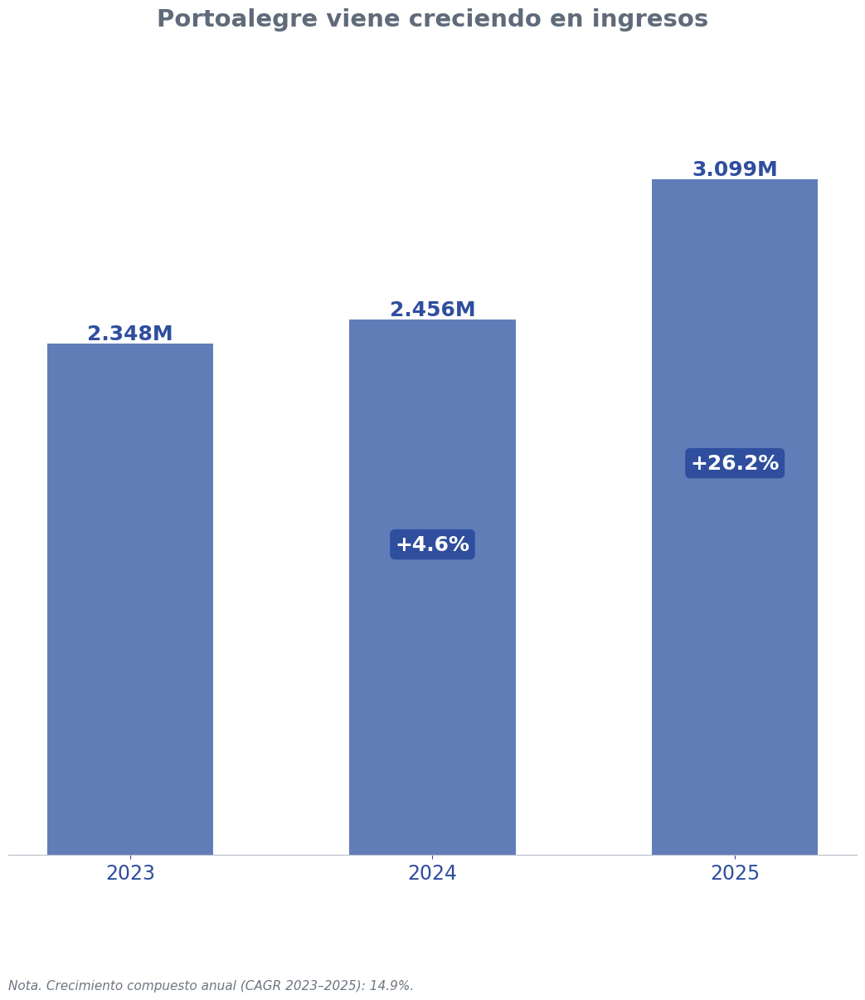

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. Copia y preparación de datos
# =========================================================
df = df_reservas_dep.copy()

df["fecha_noche"] = pd.to_datetime(df["fecha_noche"], errors="coerce")
df["ingreso_distribuido"] = pd.to_numeric(df["ingreso_distribuido"], errors="coerce")

df = df.dropna(subset=["fecha_noche", "ingreso_distribuido"])
df["anio"] = df["fecha_noche"].dt.year

# =========================================================
# 2. Agregación anual y filtro 2023-2025
# =========================================================
ingresos_anuales = (
    df.groupby("anio", as_index=False)["ingreso_distribuido"]
      .sum()
      .rename(columns={"ingreso_distribuido": "ingresos"})
      .sort_values("anio")
)

ingresos_anuales = ingresos_anuales[
    ingresos_anuales["anio"].isin([2023, 2024, 2025])
].copy()

# =========================================================
# 3. Crecimiento YoY
# =========================================================
ingresos_anuales["crecimiento_yoy_pct"] = ingresos_anuales["ingresos"].pct_change() * 100

# =========================================================
# 4. CAGR 2023-2025
# =========================================================
cagr = np.nan

if set([2023, 2025]).issubset(set(ingresos_anuales["anio"])):
    valor_inicial = ingresos_anuales.loc[ingresos_anuales["anio"] == 2023, "ingresos"].values[0]
    valor_final = ingresos_anuales.loc[ingresos_anuales["anio"] == 2025, "ingresos"].values[0]
    n_periodos = 2

    if valor_inicial > 0:
        cagr = ((valor_final / valor_inicial) ** (1 / n_periodos) - 1) * 100

# =========================================================
# 5. Función para formato en millones
# =========================================================
def formato_millones(x):
    valor_m = x / 1_000_000
    return f"{valor_m:,.0f}M".replace(",", ".")

# =========================================================
# 6. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
azul_medio = "#617DB8"
gris_texto = "#6E7681"
gris_titulo = "#5F6B7A"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(11, 15))

bars = ax.bar(
    ingresos_anuales["anio"].astype(str),
    ingresos_anuales["ingresos"],
    color=azul_medio,
    width=0.55,          # columnas más delgadas
    edgecolor="none",    # sin contorno azul oscuro
    linewidth=0
)

# Más aire arriba
ax.set_ylim(0, ingresos_anuales["ingresos"].max() * 1.18)

# Etiquetas superiores
for bar, valor in zip(bars, ingresos_anuales["ingresos"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        formato_millones(valor),
        ha="center",
        va="bottom",
        fontsize=18,
        fontweight="bold",
        color=azul_oscuro
    )

# Etiquetas YoY dentro de las barras
for i in range(1, len(ingresos_anuales)):
    valor = ingresos_anuales.iloc[i]["ingresos"]
    yoy = ingresos_anuales.iloc[i]["crecimiento_yoy_pct"]

    if pd.notnull(yoy):
        ax.text(
            i,
            valor * 0.58,
            f"+{yoy:.1f}%" if yoy >= 0 else f"{yoy:.1f}%",
            ha="center",
            va="center",
            fontsize=18,
            fontweight="bold",
            color="white",
            bbox=dict(
                boxstyle="round,pad=0.25",
                facecolor=azul_oscuro,
                edgecolor="none"
            )
        )

# =========================================================
# 8. Título centrado, más abajo y más sobrio
# =========================================================
ax.set_title(
    "Portoalegre viene creciendo en ingresos",
    fontsize=21,
    fontweight="bold",
    color=gris_titulo,
    pad=28,
    loc="center"
)

# =========================================================
# 9. Limpiar eje Y
# =========================================================
ax.set_ylabel("")
ax.set_yticks([])
ax.spines["left"].set_visible(False)

ax.set_xlabel("")
ax.tick_params(axis="x", labelsize=17, colors=azul_oscuro)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

# =========================================================
# 10. Nota al pie con CAGR
# =========================================================
if pd.notnull(cagr):
    nota = f"Nota. Crecimiento compuesto anual (CAGR 2023–2025): {cagr:.1f}%."
else:
    nota = "Nota. No fue posible calcular el crecimiento compuesto anual (CAGR 2023–2025)."

plt.subplots_adjust(left=0.06, right=0.99, top=0.78, bottom=0.14)

fig.text(
    0.06,
    0.03,
    nota,
    ha="left",
    va="bottom",
    fontsize=11,
    color=gris_texto,
    style="italic"
)

plt.show()

# Modelo pronóstico ocupación

## Clima

In [ ]:
!pip install pandas openpyxl requests

In [ ]:
import pandas as pd
import requests

# Coveñas aprox: 9.40, -75.68
url = (
    "https://archive-api.open-meteo.com/v1/archive"
    "?latitude=9.40"
    "&longitude=-75.68"
    "&start_date=2023-01-01"
    "&end_date=2026-01-31"
    "&daily=precipitation_sum,sunshine_duration"
    "&timezone=America/Bogota"
)

r = requests.get(url, timeout=60)
r.raise_for_status()
data = r.json()

clima = pd.DataFrame({
    "fecha": pd.to_datetime(data["daily"]["time"]),
    "precipitacion_mm": data["daily"]["precipitation_sum"],
    "sol_segundos": data["daily"]["sunshine_duration"],
})

clima["sol_horas"] = clima["sol_segundos"] / 3600
clima = clima[["fecha", "precipitacion_mm", "sol_horas"]]

clima.head()

,fecha,precipitacion_mm,sol_horas
0,2023-01-01,5.4,10.837633
1,2023-01-02,4.0,9.772928
2,2023-01-03,0.7,10.899886
3,2023-01-04,1.1,11.193842
4,2023-01-05,0.0,11.346292


In [ ]:
clima.to_excel("clima.xlsx", index=False)

## Temporada

In [ ]:
# -----------------------------
# 1. Crear calendario diario
# -----------------------------
calendario = pd.DataFrame({
    "fecha": pd.date_range("2023-01-01", "2026-01-31", freq="D")
})

calendario["año"] = calendario["fecha"].dt.year
calendario["mes"] = calendario["fecha"].dt.month
calendario["dia"] = calendario["fecha"].dt.day
calendario["dow"] = calendario["fecha"].dt.dayofweek  # lunes=0, domingo=6

# temporada base
calendario["temporada"] = "Baja"

# -----------------------------
# 2. Reglas base anteriores
# -----------------------------

# Alta: 15 dic - 15 ene
calendario.loc[
    ((calendario["mes"] == 12) & (calendario["dia"] >= 15)) |
    ((calendario["mes"] == 1) & (calendario["dia"] <= 15)),
    "temporada"
] = "Alta"

# Alta: 15 jun - 15 ago
calendario.loc[
    ((calendario["mes"] == 6) & (calendario["dia"] >= 15)) |
    (calendario["mes"] == 7) |
    ((calendario["mes"] == 8) & (calendario["dia"] <= 15)),
    "temporada"
] = "Alta"

# Si se quiere ver temporada Media hay que activar esta linea
#calendario.loc[calendario["temporada"] == "Baja", "temporada"] = "Media"

# Baja en meses flojos
calendario.loc[
    calendario["mes"].isin([2, 3, 4, 5, 9, 10, 11]),
    "temporada"
] = "Baja"

# -----------------------------
# 3. Semana Santa (Alta)
# -----------------------------
rangos_semana_santa = [
    ("2023-04-02", "2023-04-09"),
    ("2024-03-24", "2024-03-31"),
    ("2025-04-13", "2025-04-20"),
]

for inicio, fin in rangos_semana_santa:
    calendario.loc[
        (calendario["fecha"] >= inicio) & (calendario["fecha"] <= fin),
        "temporada"
    ] = "Alta"

# -----------------------------
# 4. Semana de receso (Alta)
# -----------------------------
rangos_receso = [
    ("2023-10-09", "2023-10-13"),
    ("2024-10-07", "2024-10-11"),
    ("2025-10-06", "2025-10-10"),
]

for inicio, fin in rangos_receso:
    calendario.loc[
        (calendario["fecha"] >= inicio) & (calendario["fecha"] <= fin),
        "temporada"
    ] = "Alta"

# -----------------------------
# 5. Puentes festivos (Alta)
#    sábado + domingo + lunes festivo
# -----------------------------
lunes_festivos = pd.to_datetime([
    # 2023
    "2023-01-09", "2023-03-20", "2023-05-01", "2023-05-22",
    "2023-06-12", "2023-06-19", "2023-07-03", "2023-08-07",
    "2023-08-21", "2023-10-16", "2023-11-06", "2023-11-13",
    "2023-12-25",

    # 2024
    "2024-01-08", "2024-03-25", "2024-05-13", "2024-06-03",
    "2024-06-10", "2024-07-01", "2024-08-19", "2024-10-14",
    "2024-11-04", "2024-11-11",

    # 2025
    "2025-01-06", "2025-03-24", "2025-06-02", "2025-06-23",
    "2025-06-30", "2025-08-18", "2025-10-13", "2025-11-03",
    "2025-11-17", "2025-12-08"
])

for lunes in lunes_festivos:
    sabado = lunes - pd.Timedelta(days=2)
    domingo = lunes - pd.Timedelta(days=1)

    calendario.loc[
        calendario["fecha"].isin([sabado, domingo, lunes]),
        "temporada"
    ] = "Alta"

# -----------------------------
# 6. Revisar
# -----------------------------
calendario[["fecha", "temporada"]].head(20)

,fecha,temporada
0,2023-01-01,Alta
1,2023-01-02,Alta
2,2023-01-03,Alta
3,2023-01-04,Alta
4,2023-01-05,Alta
5,2023-01-06,Alta
6,2023-01-07,Alta
7,2023-01-08,Alta
8,2023-01-09,Alta
9,2023-01-10,Alta


In [ ]:
calendario.to_excel("calendario.xlsx", index=False)

## PIB

In [ ]:
# =========================================================
# 1. Base mensual Golfo de Morrosquillo
# =========================================================
data = {
    "year": [2023]*12 + [2024]*12 + [2025]*12,
    "month": list(range(1, 13))*3,
    "ocupacion_mensual": [
        # 2023
        0.421, 0.391, 0.378, 0.376, 0.351, 0.419,
        0.388, 0.414, 0.424, 0.407, 0.432, 0.404,

        # 2024
        0.400, 0.369, 0.383, 0.371, 0.391, 0.412,
        0.384, 0.391, 0.370, 0.434, 0.428, 0.403,

        # 2025
        0.412, 0.381, 0.412, 0.425, 0.391, 0.473,
        0.443, 0.415, 0.401, 0.478, 0.431, 0.434
    ]
}

df_mensual = pd.DataFrame(data)
df_mensual.head(15)

,year,month,ocupacion_mensual
0,2023,1,0.421
1,2023,2,0.391
2,2023,3,0.378
3,2023,4,0.376
4,2023,5,0.351
5,2023,6,0.419
6,2023,7,0.388
7,2023,8,0.414
8,2023,9,0.424
9,2023,10,0.407


In [ ]:
# =========================================================
# 2. Calendario diario 2023-2025
# =========================================================
cal = pd.DataFrame({
    "fecha": pd.date_range("2023-01-01", "2025-12-31", freq="D")
})

cal["year"] = cal["fecha"].dt.year
cal["month"] = cal["fecha"].dt.month
cal["dia"] = cal["fecha"].dt.day
cal["dow"] = cal["fecha"].dt.dayofweek  # 0=lunes, 6=domingo

cal.head()

,fecha,year,month,dia,dow
0,2023-01-01,2023,1,1,6
1,2023-01-02,2023,1,2,0
2,2023-01-03,2023,1,3,1
3,2023-01-04,2023,1,4,2
4,2023-01-05,2023,1,5,3


In [ ]:
# =========================================================
# 3. Pesos por día de semana con base en RevPAR
# =========================================================
# Lun 29.0 | Mar 30.9 | Mié 33.6 | Jue 34.7 | Vie 47.1 | Sáb 71.1 | Dom 49.6

pesos_dow = {
    0: 29.0,  # lunes
    1: 30.9,  # martes
    2: 33.6,  # miércoles
    3: 34.7,  # jueves
    4: 47.1,  # viernes
    5: 71.1,  # sábado
    6: 49.6   # domingo
}

pesos = pd.Series(pesos_dow)
pesos_norm = pesos / pesos.mean()

print("Pesos normalizados:")
print(pesos_norm)

Pesos normalizados:
0    0.685811
1    0.730743
2    0.794595
3    0.820608
4    1.113851
5    1.681419
6    1.172973
dtype: float64


In [ ]:
# =========================================================
# 4. Asignar pesos al calendario diario
# =========================================================
cal["peso_base"] = cal["dow"].map(pesos_norm)

cal[["fecha", "dow", "peso_base"]].head(10)

,fecha,dow,peso_base
0,2023-01-01,6,1.172973
1,2023-01-02,0,0.685811
2,2023-01-03,1,0.730743
3,2023-01-04,2,0.794595
4,2023-01-05,3,0.820608
5,2023-01-06,4,1.113851
6,2023-01-07,5,1.681419
7,2023-01-08,6,1.172973
8,2023-01-09,0,0.685811
9,2023-01-10,1,0.730743


In [ ]:
# =========================================================
# 5. Pegar la ocupación mensual oficial
# =========================================================
cal = cal.merge(df_mensual, on=["year", "month"], how="left")

cal.head()

,fecha,year,month,dia,dow,peso_base,ocupacion_mensual
0,2023-01-01,2023,1,1,6,1.172973,0.421
1,2023-01-02,2023,1,2,0,0.685811,0.421
2,2023-01-03,2023,1,3,1,0.730743,0.421
3,2023-01-04,2023,1,4,2,0.794595,0.421
4,2023-01-05,2023,1,5,3,0.820608,0.421


In [ ]:
# =========================================================
# 6. Normalizar pesos dentro de cada mes
# =========================================================
cal["peso_norm_mes"] = cal.groupby(["year", "month"])["peso_base"].transform(
    lambda x: x / x.mean()
)

cal.head()

,fecha,year,month,dia,dow,peso_base,ocupacion_mensual,peso_norm_mes
0,2023-01-01,2023,1,1,6,1.172973,0.421,1.188713
1,2023-01-02,2023,1,2,0,0.685811,0.421,0.695014
2,2023-01-03,2023,1,3,1,0.730743,0.421,0.740549
3,2023-01-04,2023,1,4,2,0.794595,0.421,0.805257
4,2023-01-05,2023,1,5,3,0.820608,0.421,0.831620


In [ ]:
# =========================================================
# 7. Construir ocupación diaria del Golfo
# =========================================================
cal["ocupacion_diaria_golfo"] = cal["ocupacion_mensual"] * cal["peso_norm_mes"]

# Acotar entre 0 y 1 por seguridad
cal["ocupacion_diaria_golfo"] = cal["ocupacion_diaria_golfo"].clip(0, 1)

cal[["fecha", "ocupacion_mensual", "peso_norm_mes", "ocupacion_diaria_golfo"]].head(15)

,fecha,ocupacion_mensual,peso_norm_mes,ocupacion_diaria_golfo
0,2023-01-01,0.421,1.188713,0.500448
1,2023-01-02,0.421,0.695014,0.292601
2,2023-01-03,0.421,0.740549,0.311771
3,2023-01-04,0.421,0.805257,0.339013
4,2023-01-05,0.421,0.831620,0.350112
5,2023-01-06,0.421,1.128798,0.475224
6,2023-01-07,0.421,1.703981,0.717376
7,2023-01-08,0.421,1.188713,0.500448
8,2023-01-09,0.421,0.695014,0.292601
9,2023-01-10,0.421,0.740549,0.311771


In [ ]:
# =========================================================
# 8. Construir base final promedio de 365 días
# =========================================================
cal["mes_dia"] = cal["fecha"].dt.strftime("%m-%d")

# Eliminar 29 de febrero para quedarnos con 365 días
cal_365 = cal[cal["mes_dia"] != "02-29"].copy()

base_365 = (
    cal_365
    .groupby("mes_dia", as_index=False)
    .agg(
        ocupacion_golfo_promedio=("ocupacion_diaria_golfo", "mean")
    )
)

# Crear una fecha artificial de referencia
base_365["fecha_ref"] = pd.to_datetime("2025-" + base_365["mes_dia"])
base_365 = base_365.sort_values("fecha_ref").reset_index(drop=True)

# Número de día del año
base_365["dia_anio"] = np.arange(1, len(base_365) + 1)

base_365 = base_365[
    ["dia_anio", "fecha_ref", "mes_dia", "ocupacion_golfo_promedio"]
]

print(base_365.head())
print(base_365.tail())
print("Filas:", len(base_365))

   dia_anio  fecha_ref mes_dia  ocupacion_golfo_promedio
0         1 2025-01-01   01-01                  0.370732
1         2 2025-01-02   01-02                  0.311201
2         3 2025-01-03   01-03                  0.366954
3         4 2025-01-04   01-04                  0.458227
4         5 2025-01-05   01-05                  0.431604
     dia_anio  fecha_ref mes_dia  ocupacion_golfo_promedio
360       361 2025-12-27   12-27                  0.504996
361       362 2025-12-28   12-28                  0.510184
362       363 2025-12-29   12-29                  0.406944
363       364 2025-12-30   12-30                  0.421411
364       365 2025-12-31   12-31                  0.370609
Filas: 365


In [ ]:
# =========================================================
# 9. Validación: comparar promedio mensual original vs reconstruido
# =========================================================
validacion = cal.copy()
validacion["mes_periodo"] = validacion["fecha"].dt.to_period("M")

check = (
    validacion
    .groupby("mes_periodo", as_index=False)
    .agg(
        ocupacion_original=("ocupacion_mensual", "first"),
        ocupacion_reconstruida=("ocupacion_diaria_golfo", "mean")
    )
)

check["diferencia"] = check["ocupacion_reconstruida"] - check["ocupacion_original"]

check.head(15)

,mes_periodo,ocupacion_original,ocupacion_reconstruida,diferencia
0,2023-01,0.421,0.421,5.551115e-17
1,2023-02,0.391,0.391,0.000000e+00
2,2023-03,0.378,0.378,5.551115e-17
3,2023-04,0.376,0.376,5.551115e-17
4,2023-05,0.351,0.351,5.551115e-17
5,2023-06,0.419,0.419,-5.551115e-17
6,2023-07,0.388,0.388,0.000000e+00
7,2023-08,0.414,0.414,0.000000e+00
8,2023-09,0.424,0.424,5.551115e-17
9,2023-10,0.407,0.407,5.551115e-17


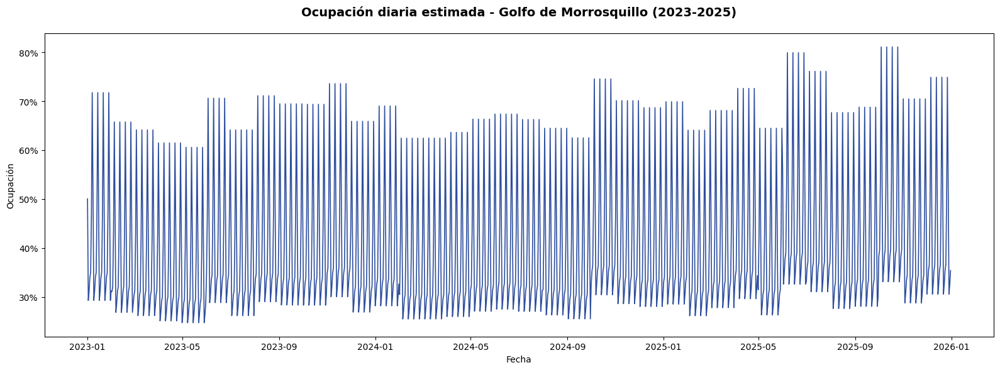

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# =========================================================
# 10. Gráfico de ocupación diaria regional 2023-2025
# =========================================================
plt.figure(figsize=(16, 6))

plt.plot(
    cal["fecha"],
    cal["ocupacion_diaria_golfo"],
    color="#2E4F9E",
    linewidth=1.2
)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

plt.title(
    "Ocupación diaria estimada - Golfo de Morrosquillo (2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.grid(False)
plt.tight_layout()
plt.show()

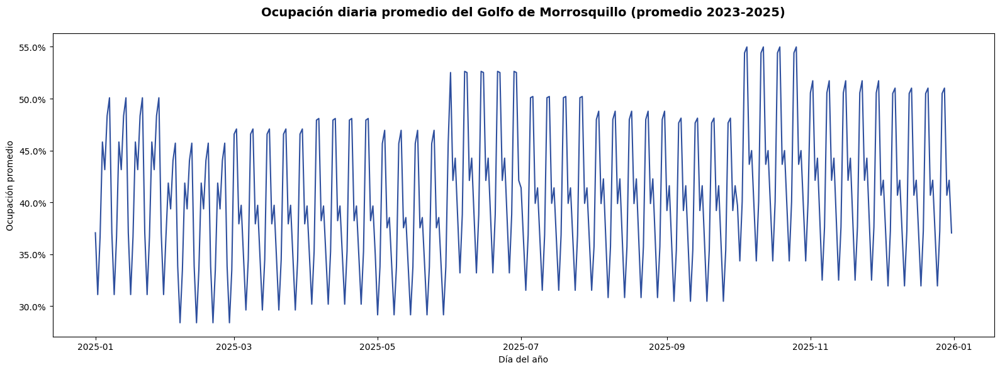

In [ ]:
# =========================================================
# 11. Gráfico de la serie promedio de 365 días
# =========================================================
plt.figure(figsize=(16, 6))

plt.plot(
    base_365["fecha_ref"],
    base_365["ocupacion_golfo_promedio"],
    color="#2E4F9E",
    linewidth=1.5
)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

plt.title(
    "Ocupación diaria promedio del Golfo de Morrosquillo (promedio 2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Día del año")
plt.ylabel("Ocupación promedio")
plt.grid(False)
plt.tight_layout()
plt.show()

In [ ]:
base_365 = base_365.drop(columns=["fecha_ref"])

In [ ]:
base_365.head()

,dia_anio,mes_dia,ocupacion_golfo_promedio
0,1,01-01,0.370732
1,2,01-02,0.311201
2,3,01-03,0.366954
3,4,01-04,0.458227
4,5,01-05,0.431604


In [ ]:
base_365.to_excel("base_365.xlsx", index=False)

In [ ]:
file_path = "/content/drive/MyDrive/Tesis/PIB/PIB Aalojamiento y Restaurantes.xlsx"
df_pib = pd.read_excel(file_path)

df_pib.head(20)

,Year,Quarter,Alojamiento y servicios de comida MMM
0,2023,I,9900.205760
1,2023,II,9825.995635
2,2023,III,9494.173572
3,2023,IV,9838.625033
4,2024,I,9993.403543
5,2024,II,10035.609815
6,2024,III,10022.559497
7,2024,IV,10392.427145
8,2025,I,10139.698194
9,2025,II,10139.195455


In [ ]:
# =========================================================
# 1. Copiar base
# =========================================================
df_ocup = base_365.copy()

# Crear fecha auxiliar (solo para identificar trimestre)
df_ocup["fecha_aux"] = pd.to_datetime("2025-" + df_ocup["mes_dia"])

df_ocup["Quarter_num"] = df_ocup["fecha_aux"].dt.quarter

map_quarter = {1:"I",2:"II",3:"III",4:"IV"}
df_ocup["Quarter"] = df_ocup["Quarter_num"].map(map_quarter)

df_ocup.head()

,dia_anio,mes_dia,ocupacion_golfo_promedio,fecha_aux,Quarter_num,Quarter
0,1,01-01,0.370732,2025-01-01,1,I
1,2,01-02,0.311201,2025-01-02,1,I
2,3,01-03,0.366954,2025-01-03,1,I
3,4,01-04,0.458227,2025-01-04,1,I
4,5,01-05,0.431604,2025-01-05,1,I


In [ ]:
# =========================================================
# 2. Peso de ocupación dentro del trimestre
# =========================================================
df_ocup["ocupacion_trim_total"] = df_ocup.groupby(
    "Quarter"
)["ocupacion_golfo_promedio"].transform("sum")

df_ocup["peso_ocupacion_trim"] = (
    df_ocup["ocupacion_golfo_promedio"] /
    df_ocup["ocupacion_trim_total"]
)

df_ocup.head()

,dia_anio,mes_dia,ocupacion_golfo_promedio,fecha_aux,Quarter_num,Quarter,ocupacion_trim_total,peso_ocupacion_trim
0,1,01-01,0.370732,2025-01-01,1,I,35.53277,0.010434
1,2,01-02,0.311201,2025-01-02,1,I,35.53277,0.008758
2,3,01-03,0.366954,2025-01-03,1,I,35.53277,0.010327
3,4,01-04,0.458227,2025-01-04,1,I,35.53277,0.012896
4,5,01-05,0.431604,2025-01-05,1,I,35.53277,0.012147


In [ ]:
# =========================================================
# 3. Copiar base PIB
# =========================================================
df_pib_trim = df_pib.copy()

df_pib_trim["Quarter"] = df_pib_trim["Quarter"].astype(str).str.strip()

df_pib_trim.head()

,Year,Quarter,Alojamiento y servicios de comida MMM
0,2023,I,9900.205760
1,2023,II,9825.995635
2,2023,III,9494.173572
3,2023,IV,9838.625033
4,2024,I,9993.403543


In [ ]:
# =========================================================
# 4. Cruzar bases
# =========================================================
df_pib_diario = df_pib_trim.merge(
    df_ocup,
    on="Quarter",
    how="left"
)

df_pib_diario.head()

,Year,Quarter,Alojamiento y servicios de comida MMM,dia_anio,mes_dia,ocupacion_golfo_promedio,fecha_aux,Quarter_num,ocupacion_trim_total,peso_ocupacion_trim
0,2023,I,9900.20576,1,01-01,0.370732,2025-01-01,1,35.53277,0.010434
1,2023,I,9900.20576,2,01-02,0.311201,2025-01-02,1,35.53277,0.008758
2,2023,I,9900.20576,3,01-03,0.366954,2025-01-03,1,35.53277,0.010327
3,2023,I,9900.20576,4,01-04,0.458227,2025-01-04,1,35.53277,0.012896
4,2023,I,9900.20576,5,01-05,0.431604,2025-01-05,1,35.53277,0.012147


In [ ]:
# =========================================================
# 5. Distribuir PIB diario
# =========================================================
df_pib_diario["PIB_diario_MMM"] = (
    df_pib_diario["peso_ocupacion_trim"] *
    df_pib_diario["Alojamiento y servicios de comida MMM"]
)

df_pib_diario.head()

,Year,Quarter,Alojamiento y servicios de comida MMM,dia_anio,mes_dia,ocupacion_golfo_promedio,fecha_aux,Quarter_num,ocupacion_trim_total,peso_ocupacion_trim,PIB_diario_MMM
0,2023,I,9900.20576,1,01-01,0.370732,2025-01-01,1,35.53277,0.010434,103.293926
1,2023,I,9900.20576,2,01-02,0.311201,2025-01-02,1,35.53277,0.008758,86.707285
2,2023,I,9900.20576,3,01-03,0.366954,2025-01-03,1,35.53277,0.010327,102.241317
3,2023,I,9900.20576,4,01-04,0.458227,2025-01-04,1,35.53277,0.012896,127.671957
4,2023,I,9900.20576,5,01-05,0.431604,2025-01-05,1,35.53277,0.012147,120.254297


In [ ]:
# =========================================================
# 6. Validación
# =========================================================
validacion = (
    df_pib_diario
    .groupby(["Year","Quarter"], as_index=False)
    .agg(
        PIB_original=("Alojamiento y servicios de comida MMM","first"),
        PIB_reconstruido=("PIB_diario_MMM","sum")
    )
)

validacion["diferencia"] = (
    validacion["PIB_reconstruido"] -
    validacion["PIB_original"]
)

validacion

,Year,Quarter,PIB_original,PIB_reconstruido,diferencia
0,2023,I,9900.205760,9900.205760,0.000000e+00
1,2023,II,9825.995635,9825.995635,0.000000e+00
2,2023,III,9494.173572,9494.173572,0.000000e+00
3,2023,IV,9838.625033,9838.625033,0.000000e+00
4,2024,I,9993.403543,9993.403543,0.000000e+00
5,2024,II,10035.609815,10035.609815,0.000000e+00
6,2024,III,10022.559497,10022.559497,0.000000e+00
7,2024,IV,10392.427145,10392.427145,0.000000e+00
8,2025,I,10139.698194,10139.698194,0.000000e+00
9,2025,II,10139.195455,10139.195455,0.000000e+00


In [ ]:
# =========================================================
# 7. Base final
# =========================================================
pib_diario = df_pib_diario[
    [
        "Year",
        "Quarter",
        "dia_anio",
        "mes_dia",
        "ocupacion_golfo_promedio",
        "PIB_diario_MMM"
    ]
].copy()

# Crear fecha_noche
pib_diario["fecha_noche"] = pd.to_datetime(
    pib_diario["Year"].astype(str) + "-" + pib_diario["mes_dia"]
)

# Ordenar por fecha
pib_diario = pib_diario.sort_values("fecha_noche").reset_index(drop=True)

pib_diario.head()

,Year,Quarter,dia_anio,mes_dia,ocupacion_golfo_promedio,PIB_diario_MMM,fecha_noche
0,2023,I,1,01-01,0.370732,103.293926,2023-01-01
1,2023,I,2,01-02,0.311201,86.707285,2023-01-02
2,2023,I,3,01-03,0.366954,102.241317,2023-01-03
3,2023,I,4,01-04,0.458227,127.671957,2023-01-04
4,2023,I,5,01-05,0.431604,120.254297,2023-01-05


In [ ]:
pib_diario.to_excel("pib_diario.xlsx", index=False)

## Crea base para pronosticar ocupacion

In [ ]:
base_ocupacion_diaria = (
    df_reservas_dep
    .groupby("fecha_noche", as_index=False)
    .agg(
        personas=("numero_personas", "sum"),
        ingresos=("ingreso_distribuido", "sum"),
        ingresos_alojamiento=("alojamiento_distribuido", "sum"),
        ingresos_consumos_extra=("consumos_y_extras_distribuido", "sum"),
        cuartos_ocupados=("nombre_cuarto", "count")
    )
)

In [ ]:
base_ocupacion_diaria["ingreso_por_huesped"] = (
    base_ocupacion_diaria["ingresos"] /
    base_ocupacion_diaria["personas"]
)

base_ocupacion_diaria["ingreso_alojamiento_por_huesped"] = (
    base_ocupacion_diaria["ingresos_alojamiento"] /
    base_ocupacion_diaria["personas"]
)

base_ocupacion_diaria["ingreso_consumo_extra_por_huesped"] = (
    base_ocupacion_diaria["ingresos_consumos_extra"] /
    base_ocupacion_diaria["personas"]
)

base_ocupacion_diaria["ingreso_por_cuarto"] = (
    base_ocupacion_diaria["ingresos"] /
    base_ocupacion_diaria["cuartos_ocupados"]
)

base_ocupacion_diaria["ocupacion"] = (
    base_ocupacion_diaria["personas"] / 146
)

In [ ]:
base_ocupacion_diaria["fecha_noche"] = pd.to_datetime(base_ocupacion_diaria["fecha_noche"])

base_ocupacion_diaria = base_ocupacion_diaria[
    base_ocupacion_diaria["fecha_noche"] >= "2023-02-01"
]

base_ocupacion_diaria.head(20)

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion
31,2023-02-01,44,4.416740e+06,4.037205e+06,3.795354e+05,20,100380.465220,91754.661731,8625.803489,220837.023485,0.301370
32,2023-02-02,54,5.598111e+06,5.148687e+06,4.494242e+05,24,103668.718575,95346.047419,8322.671156,233254.616793,0.369863
33,2023-02-03,93,8.838389e+06,8.017965e+06,8.204242e+05,31,95036.441430,86214.675383,8821.766048,285109.324291,0.636986
34,2023-02-04,120,1.134276e+07,1.045304e+07,8.897273e+05,40,94523.036174,87108.642235,7414.393939,283569.108523,0.821918
35,2023-02-05,67,6.788844e+06,6.560844e+06,2.280000e+05,29,101326.026119,97923.041045,3402.985075,234098.060345,0.458904
36,2023-02-06,94,8.777350e+06,8.327350e+06,4.500000e+05,33,93376.065248,88588.831206,4787.234043,265980.307071,0.643836
37,2023-02-07,68,6.688893e+06,6.236893e+06,4.520000e+05,24,98366.071814,91719.012990,6647.058824,278703.870139,0.465753
38,2023-02-08,64,6.603937e+06,6.062604e+06,5.413330e+05,26,103186.513802,94728.185677,8458.328125,253997.572436,0.438356
39,2023-02-09,48,4.925649e+06,4.635649e+06,2.899997e+05,20,102617.681597,96576.021875,6041.659722,246282.435833,0.328767
40,2023-02-10,44,4.212566e+06,3.987899e+06,2.246667e+05,15,95740.135606,90634.075000,5106.060606,280837.731111,0.301370


In [ ]:
base_ocupacion_diaria["fecha_noche"] = pd.to_datetime(base_ocupacion_diaria["fecha_noche"])
clima["fecha"] = pd.to_datetime(clima["fecha"])

base_ocupacion_diaria = base_ocupacion_diaria.merge(
    clima,
    left_on="fecha_noche",
    right_on="fecha",
    how="left"
)

base_ocupacion_diaria.head()

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion,fecha,precipitacion_mm,sol_horas
0,2023-02-01,44,4.416740e+06,4.037205e+06,379535.353535,20,100380.465220,91754.661731,8625.803489,220837.023485,0.301370,2023-02-01,0.0,11.207181
1,2023-02-02,54,5.598111e+06,5.148687e+06,449424.242424,24,103668.718575,95346.047419,8322.671156,233254.616793,0.369863,2023-02-02,0.0,11.273575
2,2023-02-03,93,8.838389e+06,8.017965e+06,820424.242424,31,95036.441430,86214.675383,8821.766048,285109.324291,0.636986,2023-02-03,0.0,11.271989
3,2023-02-04,120,1.134276e+07,1.045304e+07,889727.272727,40,94523.036174,87108.642235,7414.393939,283569.108523,0.821918,2023-02-04,0.0,11.135200
4,2023-02-05,67,6.788844e+06,6.560844e+06,228000.000000,29,101326.026119,97923.041045,3402.985075,234098.060345,0.458904,2023-02-05,0.0,10.970661


In [ ]:
base_ocupacion_diaria = base_ocupacion_diaria.drop(columns=["fecha"])
base_ocupacion_diaria.head()

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion,precipitacion_mm,sol_horas
0,2023-02-01,44,4.416740e+06,4.037205e+06,379535.353535,20,100380.465220,91754.661731,8625.803489,220837.023485,0.301370,0.0,11.207181
1,2023-02-02,54,5.598111e+06,5.148687e+06,449424.242424,24,103668.718575,95346.047419,8322.671156,233254.616793,0.369863,0.0,11.273575
2,2023-02-03,93,8.838389e+06,8.017965e+06,820424.242424,31,95036.441430,86214.675383,8821.766048,285109.324291,0.636986,0.0,11.271989
3,2023-02-04,120,1.134276e+07,1.045304e+07,889727.272727,40,94523.036174,87108.642235,7414.393939,283569.108523,0.821918,0.0,11.135200
4,2023-02-05,67,6.788844e+06,6.560844e+06,228000.000000,29,101326.026119,97923.041045,3402.985075,234098.060345,0.458904,0.0,10.970661


In [ ]:
base_ocupacion_diaria["fecha_noche"] = pd.to_datetime(base_ocupacion_diaria["fecha_noche"])
calendario["fecha"] = pd.to_datetime(calendario["fecha"])

base_ocupacion_diaria = base_ocupacion_diaria.merge(
    calendario[["fecha", "temporada"]],
    left_on="fecha_noche",
    right_on="fecha",
    how="left"
)

In [ ]:
base_ocupacion_diaria = base_ocupacion_diaria.drop(columns=["fecha"])

In [ ]:
base_ocupacion_diaria["fecha_noche"] = pd.to_datetime(base_ocupacion_diaria["fecha_noche"])
pib_diario["fecha_noche"] = pd.to_datetime(pib_diario["fecha_noche"])

base_ocupacion_diaria = base_ocupacion_diaria.merge(
    pib_diario[["fecha_noche", "PIB_diario_MMM"]],
    on="fecha_noche",
    how="left"
)

base_ocupacion_diaria.head()

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion,precipitacion_mm,sol_horas,temporada,PIB_diario_MMM
0,2023-02-01,44,4.416740e+06,4.037205e+06,379535.353535,20,100380.465220,91754.661731,8625.803489,220837.023485,0.301370,0.0,11.207181,Baja,116.649330
1,2023-02-02,54,5.598111e+06,5.148687e+06,449424.242424,24,103668.718575,95346.047419,8322.671156,233254.616793,0.369863,0.0,11.273575,Baja,109.714772
2,2023-02-03,93,8.838389e+06,8.017965e+06,820424.242424,31,95036.441430,86214.675383,8821.766048,285109.324291,0.636986,0.0,11.271989,Baja,122.697190
3,2023-02-04,120,1.134276e+07,1.045304e+07,889727.272727,40,94523.036174,87108.642235,7414.393939,283569.108523,0.821918,0.0,11.135200,Baja,127.364460
4,2023-02-05,67,6.788844e+06,6.560844e+06,228000.000000,29,101326.026119,97923.041045,3402.985075,234098.060345,0.458904,0.0,10.970661,Baja,94.361075


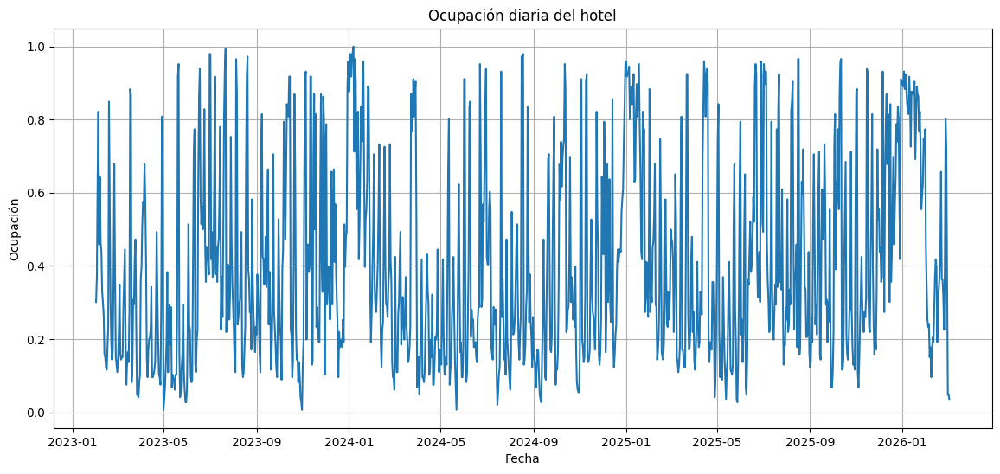

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14,6))

plt.plot(
    base_ocupacion_diaria["fecha_noche"],
    base_ocupacion_diaria["ocupacion"]
)

plt.title("Ocupación diaria del hotel")
plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.grid(True)

plt.show()

In [ ]:
df_model = base_ocupacion_diaria.copy()

df_model["fecha_noche"] = pd.to_datetime(df_model["fecha_noche"], errors="coerce")
df_model = df_model.sort_values("fecha_noche").reset_index(drop=True)

# variables de calendario
df_model["dow"] = df_model["fecha_noche"].dt.dayofweek
df_model["mes"] = df_model["fecha_noche"].dt.month
df_model["año"] = df_model["fecha_noche"].dt.year
df_model["dia_mes"] = df_model["fecha_noche"].dt.day
df_model["fin_semana"] = df_model["dow"].isin([4, 5, 6]).astype(int)

# codificar temporada
map_temporada = {"Baja": 0, "Media": 1, "Alta": 2}
df_model["temporada_num"] = df_model["temporada"].map(map_temporada)

# lags de ocupación e ingresos
df_model["ocupacion_lag1"] = df_model["ocupacion"].shift(1)
df_model["ocupacion_lag7"] = df_model["ocupacion"].shift(7)
df_model["ingresos_lag1"] = df_model["ingresos"].shift(1)
df_model["ingresos_lag7"] = df_model["ingresos"].shift(7)

# medias móviles históricas
df_model["ocupacion_ma7"] = df_model["ocupacion"].shift(1).rolling(7).mean()
df_model["ingresos_ma7"] = df_model["ingresos"].shift(1).rolling(7).mean()

# variables cíclicas
df_model["dow_sin"] = np.sin(2 * np.pi * df_model["dow"] / 7)
df_model["dow_cos"] = np.cos(2 * np.pi * df_model["dow"] / 7)
df_model["mes_sin"] = np.sin(2 * np.pi * df_model["mes"] / 12)
df_model["mes_cos"] = np.cos(2 * np.pi * df_model["mes"] / 12)

# limpiar nulos generados por lags
df_model = df_model.dropna().reset_index(drop=True)

In [ ]:
df_model.to_excel("df_model.xlsx", index=False)

# Análisis exploratorio e insights

# df_Model


══════════════════════════════════════════════════════════════
  2. EDA — RevPAR
══════════════════════════════════════════════════════════════
  ✓ 01_eda_revpar_focus.png

══════════════════════════════════════════════════════════════
  3. ESTACIONALIDAD
══════════════════════════════════════════════════════════════
  ✓ 02_estacionalidad_revpar.png


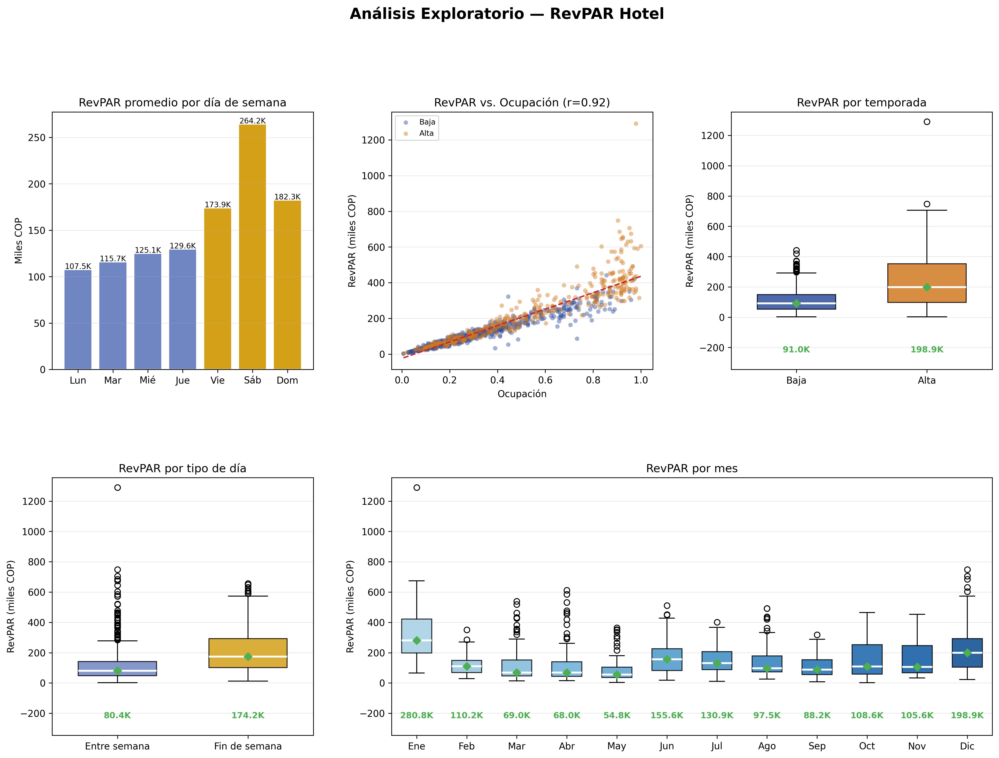

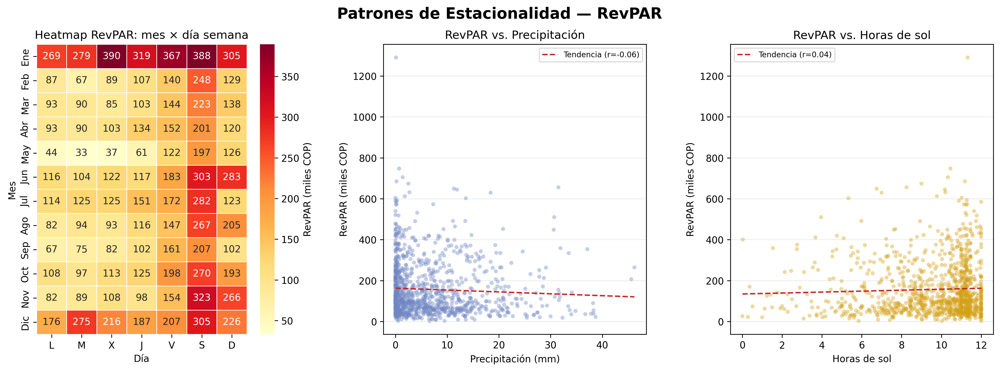

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from IPython.display import display, Image

# ══════════════════════════════════════════════════════════════════
# 1. Preparar base diaria desde df_model
# ══════════════════════════════════════════════════════════════════
df_base = df_model.copy()

df_base["fecha_noche"] = pd.to_datetime(df_base["fecha_noche"], errors="coerce")
df_base["ingresos"] = pd.to_numeric(df_base["ingresos"], errors="coerce")
df_base["ocupacion"] = pd.to_numeric(df_base["ocupacion"], errors="coerce")
df_base["ingreso_por_cuarto"] = pd.to_numeric(df_base["ingreso_por_cuarto"], errors="coerce")
df_base["dow"] = pd.to_numeric(df_base["dow"], errors="coerce")
df_base["mes"] = pd.to_numeric(df_base["mes"], errors="coerce")
df_base["precipitacion_mm"] = pd.to_numeric(df_base["precipitacion_mm"], errors="coerce")
df_base["sol_horas"] = pd.to_numeric(df_base["sol_horas"], errors="coerce")

if "fin_semana" not in df_base.columns:
    # Viernes, sábado y domingo como fin de semana
    df_base["fin_semana"] = df_base["dow"].isin([4, 5, 6]).astype(int)
else:
    df_base["fin_semana"] = pd.to_numeric(df_base["fin_semana"], errors="coerce")

# Construcción diaria
df = (
    df_base
    .groupby("fecha_noche", as_index=False)
    .agg(
        ingresos=("ingresos", "sum"),
        ocupacion=("ocupacion", "mean"),
        adr=("ingreso_por_cuarto", "mean"),
        temporada=("temporada", "first"),
        dow=("dow", "first"),
        mes=("mes", "first"),
        fin_semana=("fin_semana", "first"),
        precipitacion_mm=("precipitacion_mm", "mean"),
        sol_horas=("sol_horas", "mean")
    )
)

# RevPAR = ingresos diarios totales / 45 habitaciones disponibles
df["revpar"] = df["ingresos"] / 45
df["año"] = df["fecha_noche"].dt.year
df["trimestre"] = df["fecha_noche"].dt.quarter

# Filtrar años de interés
df = df[df["año"].isin([2023, 2024, 2025])].copy()

# ══════════════════════════════════════════════════════════════════
# 1.1 Colores
# ══════════════════════════════════════════════════════════════════
AZUL = "#2E4F9E"
AZUL_MED = "#6F86C3"
AZUL_CLARO = "#A9B8E6"
VERDE = "#4CAF50"
DORADO = "#D4A017"
ROJO = "#C62828"
GRIS = "#8A8F98"

TEMP_PAL = {
    "Alta": "#D17A22",
    "Media": "#8A8F98",
    "Baja": "#2E4F9E"
}

MES_PAL = plt.cm.Blues(np.linspace(0.35, 0.9, 12))
mes_lbl = ["Ene", "Feb", "Mar", "Abr", "May", "Jun", "Jul", "Ago", "Sep", "Oct", "Nov", "Dic"]

# ══════════════════════════════════════════════════════════════════
# 2. Función boxplot con mediana debajo de la etiqueta
# ══════════════════════════════════════════════════════════════════
def boxplot_categorico(ax, data, cat_col, y_col, order, palette, title, xlabels=None):
    data = data[[cat_col, y_col]].dropna().copy()
    y_data = [data.loc[data[cat_col] == cat, y_col].values / 1e3 for cat in order]
    labels = xlabels if xlabels is not None else order

    bp = ax.boxplot(
        y_data,
        patch_artist=True,
        tick_labels=labels,
        medianprops={"color": "white", "linewidth": 2},
        widths=0.6
    )

    for patch, cat in zip(bp["boxes"], order):
        color = palette.get(cat, AZUL_MED) if isinstance(palette, dict) else palette
        patch.set_facecolor(color)
        patch.set_alpha(0.85)

    medianas = []
    for cat in order:
        sub = data.loc[data[cat_col] == cat, y_col].dropna() / 1e3
        medianas.append(sub.median() if len(sub) > 0 else np.nan)

    ymin, ymax = ax.get_ylim()
    rango = ymax - ymin
    ax.set_ylim(ymin - rango * 0.20, ymax)

    for i, mediana in enumerate(medianas, start=1):
        if pd.isna(mediana):
            continue
        ax.scatter(i, mediana, color=VERDE, s=35, marker="D", zorder=4)
        ax.text(
            i,
            ymin - rango * 0.11,
            f"{mediana:.1f}K",
            ha="center",
            va="center",
            fontsize=9,
            color=VERDE,
            fontweight="bold"
        )

    ax.set_title(title)
    ax.set_ylabel("RevPAR (miles COP)")
    ax.grid(axis="y", alpha=0.25)

# ══════════════════════════════════════════════════════════════════
# 3. EDA — RevPAR
# ══════════════════════════════════════════════════════════════════
print("\n" + "═"*62)
print("  2. EDA — RevPAR")
print("═"*62)

fig = plt.figure(figsize=(18, 12))
fig.suptitle("Análisis Exploratorio — RevPAR Hotel", fontsize=16, fontweight="bold", y=1.01)
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.42, wspace=0.30)

# ── 3a. RevPAR promedio por día de semana ────────────────────────
ax = fig.add_subplot(gs[0, 0])

dow_lbl = ["Lun", "Mar", "Mié", "Jue", "Vie", "Sáb", "Dom"]
revpar_dow = df.groupby("dow")["revpar"].mean().reindex(range(7)) / 1e3

# Viernes, sábado y domingo en dorado
colors_dow = [DORADO if i >= 4 else AZUL_MED for i in range(7)]

bars = ax.bar(dow_lbl, revpar_dow.values, color=colors_dow, edgecolor="white")
ax.set_title("RevPAR promedio por día de semana")
ax.set_ylabel("Miles COP")
ax.grid(axis="y", alpha=0.25)

for b in bars:
    if pd.notnull(b.get_height()):
        ax.text(
            b.get_x() + b.get_width() / 2,
            b.get_height() + 0.8,
            f"{b.get_height():.1f}K",
            ha="center",
            fontsize=8
        )

# ── 3b. RevPAR vs Ocupación ──────────────────────────────────────
ax = fig.add_subplot(gs[0, 1])

temp_order = [t for t in ["Baja", "Media", "Alta"] if t in df["temporada"].dropna().unique()]

for t in temp_order:
    sub = df[df["temporada"] == t]
    ax.scatter(
        sub["ocupacion"],
        sub["revpar"] / 1e3,
        color=TEMP_PAL[t],
        alpha=0.45,
        s=22,
        label=t,
        edgecolors="none"
    )

df_scatter = df[["ocupacion", "revpar"]].dropna()
if len(df_scatter) > 1:
    z = np.polyfit(df_scatter["ocupacion"], df_scatter["revpar"] / 1e3, 1)
    xline = np.linspace(df_scatter["ocupacion"].min(), df_scatter["ocupacion"].max(), 100)
    ax.plot(xline, np.poly1d(z)(xline), color=ROJO, linewidth=1.5, linestyle="--")
    corr = df_scatter["ocupacion"].corr(df_scatter["revpar"])
else:
    corr = np.nan

ax.set_title(f"RevPAR vs. Ocupación (r={corr:.2f})")
ax.set_xlabel("Ocupación")
ax.set_ylabel("RevPAR (miles COP)")
ax.legend(fontsize=8)
ax.grid(axis="y", alpha=0.25)

# ── 3c. RevPAR por temporada (boxplot) ───────────────────────────
ax = fig.add_subplot(gs[0, 2])
boxplot_categorico(
    ax=ax,
    data=df,
    cat_col="temporada",
    y_col="revpar",
    order=temp_order,
    palette=TEMP_PAL,
    title="RevPAR por temporada",
    xlabels=temp_order
)

# ── 3d. RevPAR por fin de semana (boxplot) ───────────────────────
ax = fig.add_subplot(gs[1, 0])

fs_order = [0, 1]
fs_labels = ["Entre semana", "Fin de semana"]
fs_pal = {0: AZUL_MED, 1: DORADO}

boxplot_categorico(
    ax=ax,
    data=df,
    cat_col="fin_semana",
    y_col="revpar",
    order=fs_order,
    palette=fs_pal,
    title="RevPAR por tipo de día",
    xlabels=fs_labels
)

# ── 3e. RevPAR por mes (boxplot) ─────────────────────────────────
ax = fig.add_subplot(gs[1, 1:])

mes_order = list(range(1, 13))
mes_pal = {m: MES_PAL[m-1] for m in mes_order}

boxplot_categorico(
    ax=ax,
    data=df,
    cat_col="mes",
    y_col="revpar",
    order=mes_order,
    palette=mes_pal,
    title="RevPAR por mes",
    xlabels=mes_lbl
)

plt.savefig("01_eda_revpar_focus.png", dpi=300, bbox_inches="tight")
plt.close()
print("  ✓ 01_eda_revpar_focus.png")

# ══════════════════════════════════════════════════════════════════
# 4. ESTACIONALIDAD ADICIONAL
# ══════════════════════════════════════════════════════════════════
print("\n" + "═"*62)
print("  3. ESTACIONALIDAD")
print("═"*62)

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))
fig.suptitle("Patrones de Estacionalidad — RevPAR", fontsize=16, fontweight="bold")
plt.subplots_adjust(hspace=0.35, wspace=0.32)

# ── 4a. Heatmap RevPAR: mes × día semana ─────────────────────────
ax = axes[0]
pivot = df.pivot_table(values="revpar", index="mes", columns="dow", aggfunc="mean") / 1e3
pivot = pivot.reindex(index=range(1, 13), columns=range(7))

sns.heatmap(
    pivot,
    ax=ax,
    cmap="YlOrRd",
    annot=True,
    fmt=".0f",
    xticklabels=["L", "M", "X", "J", "V", "S", "D"],
    yticklabels=mes_lbl,
    linewidths=0.3,
    linecolor="white",
    cbar_kws={"label": "RevPAR (miles COP)"}
)
ax.set_title("Heatmap RevPAR: mes × día semana")
ax.set_xlabel("Día")
ax.set_ylabel("Mes")

# ── 4b. RevPAR vs Precipitación ──────────────────────────────────
ax = axes[1]
df_p = df[["precipitacion_mm", "revpar"]].dropna()

ax.scatter(
    df_p["precipitacion_mm"],
    df_p["revpar"] / 1e3,
    color=AZUL_MED,
    alpha=0.4,
    s=18,
    edgecolors="none"
)

if len(df_p) > 1:
    corr_p = df_p["precipitacion_mm"].corr(df_p["revpar"])
    z = np.polyfit(df_p["precipitacion_mm"], df_p["revpar"] / 1e3, 1)
    xline = np.linspace(df_p["precipitacion_mm"].min(), df_p["precipitacion_mm"].max(), 100)
    ax.plot(
        xline,
        np.poly1d(z)(xline),
        color=ROJO,
        linewidth=1.5,
        linestyle="--",
        label=f"Tendencia (r={corr_p:.2f})"
    )
else:
    corr_p = np.nan

ax.set_title("RevPAR vs. Precipitación")
ax.set_xlabel("Precipitación (mm)")
ax.set_ylabel("RevPAR (miles COP)")
ax.legend(fontsize=8)
ax.grid(axis="y", alpha=0.25)

# ── 4c. RevPAR vs Horas de sol ───────────────────────────────────
ax = axes[2]
df_s = df[["sol_horas", "revpar"]].dropna()

ax.scatter(
    df_s["sol_horas"],
    df_s["revpar"] / 1e3,
    color=DORADO,
    alpha=0.4,
    s=18,
    edgecolors="none"
)

if len(df_s) > 1:
    corr_s = df_s["sol_horas"].corr(df_s["revpar"])
    z2 = np.polyfit(df_s["sol_horas"], df_s["revpar"] / 1e3, 1)
    xline2 = np.linspace(df_s["sol_horas"].min(), df_s["sol_horas"].max(), 100)
    ax.plot(
        xline2,
        np.poly1d(z2)(xline2),
        color=ROJO,
        linewidth=1.5,
        linestyle="--",
        label=f"Tendencia (r={corr_s:.2f})"
    )
else:
    corr_s = np.nan

ax.set_title("RevPAR vs. Horas de sol")
ax.set_xlabel("Horas de sol")
ax.set_ylabel("RevPAR (miles COP)")
ax.legend(fontsize=8)
ax.grid(axis="y", alpha=0.25)

plt.savefig("02_estacionalidad_revpar.png", dpi=300, bbox_inches="tight")
plt.close()
print("  ✓ 02_estacionalidad_revpar.png")

# ══════════════════════════════════════════════════════════════════
# 5. Mostrar ambos gráficos
# ══════════════════════════════════════════════════════════════════
display(Image("01_eda_revpar_focus.png"))
display(Image("02_estacionalidad_revpar.png"))

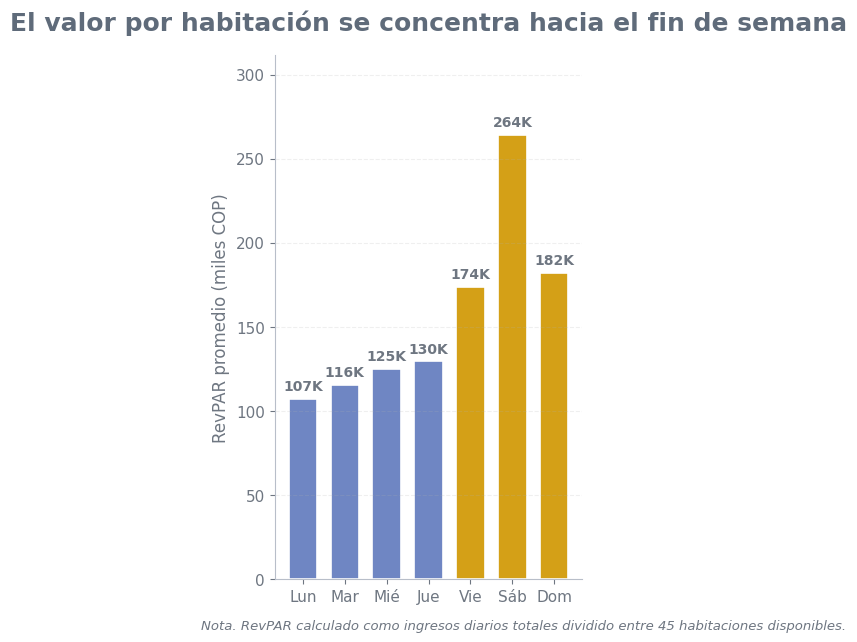

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar base diaria
# =========================================================
df_base = df_model.copy()

df_base["fecha_noche"] = pd.to_datetime(df_base["fecha_noche"], errors="coerce")
df_base["ingresos"] = pd.to_numeric(df_base["ingresos"], errors="coerce")
df_base["dow"] = pd.to_numeric(df_base["dow"], errors="coerce")

# Construcción diaria
df_revpar = (
    df_base
    .groupby("fecha_noche", as_index=False)
    .agg(
        ingresos=("ingresos", "sum"),
        dow=("dow", "first")
    )
)

# RevPAR = ingresos diarios totales / 45 habitaciones
df_revpar["revpar"] = df_revpar["ingresos"] / 45

# =========================================================
# 2. Calcular RevPAR promedio por día de semana
# =========================================================
revpar_dow = (
    df_revpar
    .groupby("dow", as_index=False)["revpar"]
    .mean()
    .set_index("dow")
    .reindex(range(7))
    .reset_index()
)

# Etiquetas
dias_lbl = ["Lun", "Mar", "Mié", "Jue", "Vie", "Sáb", "Dom"]
revpar_dow["dia"] = dias_lbl
revpar_dow["revpar_k"] = revpar_dow["revpar"] / 1e3

# =========================================================
# 3. Colores
# =========================================================
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
azul = "#6F86C3"
dorado = "#D4A017"

# Viernes, sábado y domingo en dorado
colors = [dorado if i >= 4 else azul for i in revpar_dow["dow"]]

# =========================================================
# 4. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(4, 6.44))

bars = ax.bar(
    revpar_dow["dia"],
    revpar_dow["revpar_k"],
    color=colors,
    edgecolor="white",
    linewidth=1.2,
    width=0.68
)

# Etiquetas sobre barras
for bar, value in zip(bars, revpar_dow["revpar_k"]):
    if pd.notnull(value):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + (revpar_dow["revpar_k"].max() * 0.012),
            f"{value:,.0f}K".replace(",", "."),
            ha="center",
            va="bottom",
            fontsize=10,
            color=gris_texto,
            fontweight="bold"
        )

# =========================================================
# 5. Estilo
# =========================================================
ax.set_title(
    "El valor por habitación se concentra hacia el fin de semana",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_ylabel("RevPAR promedio (miles COP)", fontsize=12, color=gris_texto)
ax.set_xlabel("")

ax.tick_params(axis="x", labelsize=11, colors=gris_texto)
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# Quitar bordes innecesarios
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

# Grid suave
ax.grid(axis="y", linestyle="--", alpha=0.20)

# Ajustar límite superior para dar espacio a etiquetas
ax.set_ylim(0, revpar_dow["revpar_k"].max() * 1.18)

# Nota
fig.text(
    0.01,
    0.01,
    "Nota. RevPAR calculado como ingresos diarios totales dividido entre 45 habitaciones disponibles.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

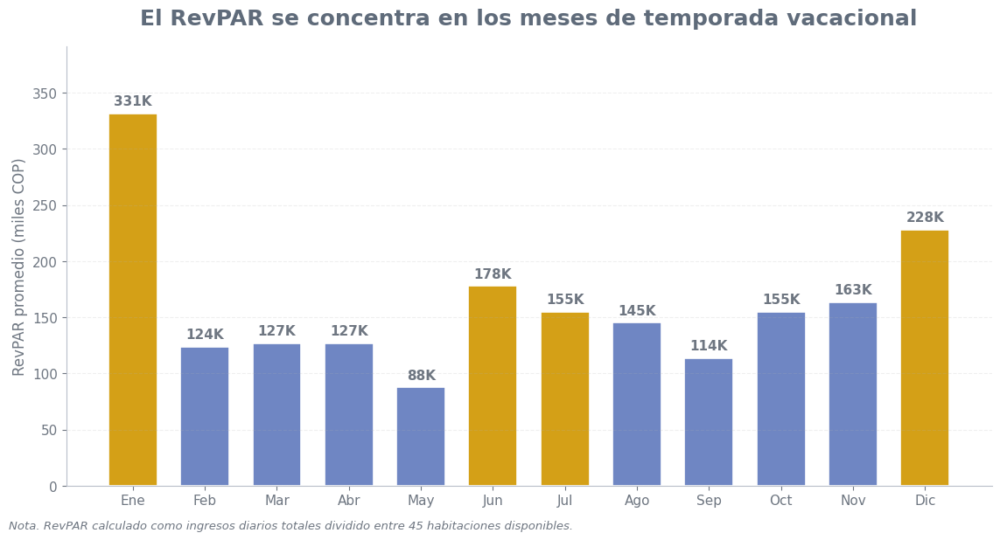

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar base diaria
# =========================================================
df_base = df_model.copy()

df_base["fecha_noche"] = pd.to_datetime(df_base["fecha_noche"], errors="coerce")
df_base["ingresos"] = pd.to_numeric(df_base["ingresos"], errors="coerce")

# Construcción diaria
df_revpar = (
    df_base
    .groupby("fecha_noche", as_index=False)
    .agg(
        ingresos=("ingresos", "sum")
    )
)

# RevPAR = ingresos diarios totales / 45 habitaciones
df_revpar["revpar"] = df_revpar["ingresos"] / 45
df_revpar["mes"] = df_revpar["fecha_noche"].dt.month

# =========================================================
# 2. Calcular RevPAR promedio por mes
# =========================================================
revpar_mes = (
    df_revpar
    .groupby("mes", as_index=False)["revpar"]
    .mean()
)

# Asegurar orden completo de meses
revpar_mes = (
    pd.DataFrame({"mes": range(1, 13)})
    .merge(revpar_mes, on="mes", how="left")
)

meses_lbl = ["Ene", "Feb", "Mar", "Abr", "May", "Jun",
             "Jul", "Ago", "Sep", "Oct", "Nov", "Dic"]

revpar_mes["mes_lbl"] = meses_lbl
revpar_mes["revpar_k"] = revpar_mes["revpar"] / 1e3

# =========================================================
# 3. Colores
# =========================================================
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
azul = "#6F86C3"
dorado = "#D4A017"

# Diciembre, enero, junio y julio en amarillo
meses_dorados = [1, 6, 7, 12]
colors = [dorado if m in meses_dorados else azul for m in revpar_mes["mes"]]

# =========================================================
# 4. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(11.5, 6.2))

bars = ax.bar(
    revpar_mes["mes_lbl"],
    revpar_mes["revpar_k"],
    color=colors,
    edgecolor="white",
    linewidth=1.2,
    width=0.68
)

# Etiquetas sobre barras
max_val = revpar_mes["revpar_k"].max()

for bar, value in zip(bars, revpar_mes["revpar_k"]):
    if pd.notnull(value):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + max_val * 0.015,
            f"{value:,.0f}K".replace(",", "."),
            ha="center",
            va="bottom",
            fontsize=11,
            color=gris_texto,
            fontweight="bold"
        )

# =========================================================
# 5. Estilo
# =========================================================
ax.set_title(
    "El RevPAR se concentra en los meses de temporada vacacional",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_ylabel("RevPAR promedio (miles COP)", fontsize=12, color=gris_texto)
ax.set_xlabel("")

ax.tick_params(axis="x", labelsize=11, colors=gris_texto)
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

# Grid suave
ax.grid(axis="y", linestyle="--", alpha=0.20)

# Espacio superior para etiquetas
ax.set_ylim(0, max_val * 1.18)

# Nota
fig.text(
    0.01,
    0.01,
    "Nota. RevPAR calculado como ingresos diarios totales dividido entre 45 habitaciones disponibles.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

/tmp/ipykernel_17886/832955066.py:22: FutureWarning: A grouping was used that is not in the columns of the DataFrame and so was excluded from the result. This grouping will be included in a future version of pandas. Add the grouping as a column of the DataFrame to silence this warning.
  .agg(


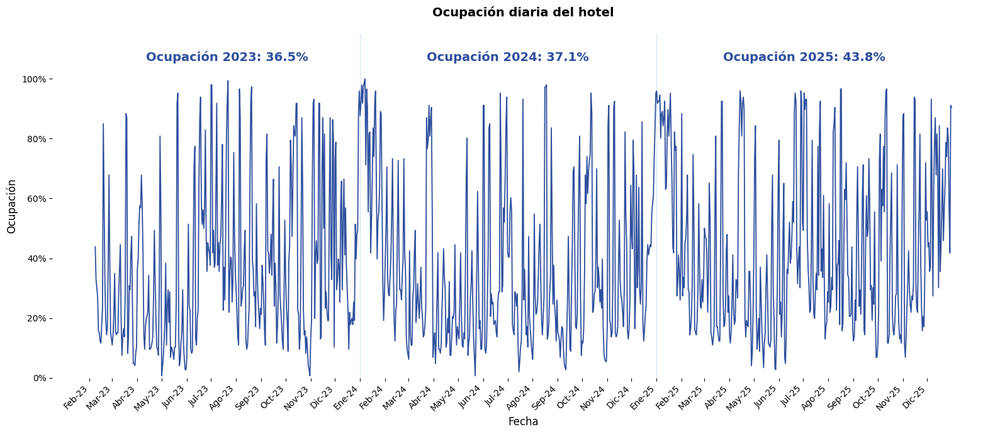

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# -----------------------------
# 1. Preparar base
# -----------------------------
df_plot = df_model.copy()
df_plot["fecha_noche"] = pd.to_datetime(df_plot["fecha_noche"], errors="coerce")
df_plot["personas"] = pd.to_numeric(df_plot["personas"], errors="coerce").fillna(0)
df_plot["ocupacion"] = pd.to_numeric(df_plot["ocupacion"], errors="coerce")
df_plot = df_plot.sort_values("fecha_noche").reset_index(drop=True)

# -----------------------------
# 2. Calcular ocupación anual
# -----------------------------
capacidad_personas = 146

anual = (
    df_plot
    .groupby(df_plot["fecha_noche"].dt.year, as_index=False)
    .agg(
        personas_anuales=("personas", "sum"),
        fecha_min=("fecha_noche", "min"),
        fecha_max=("fecha_noche", "max")
    )
)

anual["dias_anio"] = (anual["fecha_max"] - anual["fecha_min"]).dt.days + 1
anual["ocupacion_anual"] = anual["personas_anuales"] / (anual["dias_anio"] * capacidad_personas)
anual["fecha_mid"] = anual["fecha_min"] + (anual["fecha_max"] - anual["fecha_min"]) / 2

# -----------------------------
# 3. Formato eje X
# -----------------------------
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}

ticks_mensuales = pd.date_range(
    df_plot["fecha_noche"].min().replace(day=1),
    df_plot["fecha_noche"].max().replace(day=1),
    freq="MS"
)

labels_mensuales = [
    f"{meses_es[d.month]}-{str(d.year)[-2:]}"
    for d in ticks_mensuales
]

# -----------------------------
# 4. Gráfico
# -----------------------------
fig, ax = plt.subplots(figsize=(16, 7))

ax.plot(
    df_plot["fecha_noche"],
    df_plot["ocupacion"],
    linewidth=1.3,
    color="#2E4F9E"
)

for year in sorted(df_plot["fecha_noche"].dt.year.unique()):
    fecha_inicio = pd.Timestamp(f"{year}-01-01")
    if df_plot["fecha_noche"].min() <= fecha_inicio <= df_plot["fecha_noche"].max():
        ax.axvline(fecha_inicio, linewidth=0.8, alpha=0.2)

y_top = df_plot["ocupacion"].max() * 1.05

for _, row in anual.iterrows():
    ax.text(
        row["fecha_mid"],
        y_top,
        f"Ocupación {int(row['fecha_min'].year)}: {row['ocupacion_anual']:.1%}",
        ha="center",
        va="bottom",
        fontsize=14,
        fontweight="bold",
        color="#2E4F9E",
        zorder=5
    )

ax.set_xticks(ticks_mensuales)
ax.set_xticklabels(labels_mensuales, rotation=45, ha="right")

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# 🔹 Quitar bordes
for spine in ax.spines.values():
    spine.set_visible(False)

ax.set_title(
    "Ocupación diaria del hotel",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Fecha", fontsize=12)
ax.set_ylabel("Ocupación", fontsize=12)

ax.grid(False)
ax.set_ylim(0, df_plot["ocupacion"].max() * 1.15)

plt.tight_layout()
plt.show()

/tmp/ipykernel_17886/707455222.py:24: FutureWarning: A grouping was used that is not in the columns of the DataFrame and so was excluded from the result. This grouping will be included in a future version of pandas. Add the grouping as a column of the DataFrame to silence this warning.
  .agg(


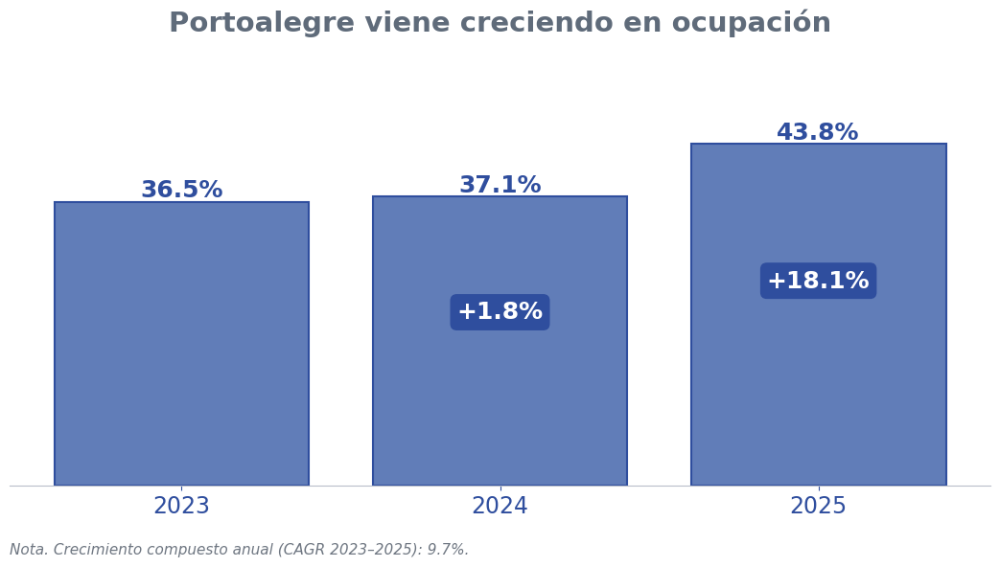

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar base
# =========================================================
df_plot = df_model.copy()

df_plot["fecha_noche"] = pd.to_datetime(df_plot["fecha_noche"], errors="coerce")
df_plot["personas"] = pd.to_numeric(df_plot["personas"], errors="coerce").fillna(0)

df_plot = df_plot.dropna(subset=["fecha_noche"]).copy()
df_plot = df_plot.sort_values("fecha_noche").reset_index(drop=True)

# =========================================================
# 2. Calcular ocupación anual
# =========================================================
capacidad_personas = 146

anual = (
    df_plot
    .groupby(df_plot["fecha_noche"].dt.year, as_index=False)
    .agg(
        personas_anuales=("personas", "sum"),
        fecha_min=("fecha_noche", "min"),
        fecha_max=("fecha_noche", "max")
    )
)

anual["dias_anio"] = (anual["fecha_max"] - anual["fecha_min"]).dt.days + 1
anual["ocupacion_anual"] = anual["personas_anuales"] / (anual["dias_anio"] * capacidad_personas)

# Filtrar años comparables
anual = anual[anual["fecha_min"].dt.year.isin([2023, 2024, 2025])].copy()
anual["anio"] = anual["fecha_min"].dt.year

# =========================================================
# 3. Crecimiento YoY de ocupación
# =========================================================
anual["crecimiento_yoy_pct"] = anual["ocupacion_anual"].pct_change() * 100

# =========================================================
# 4. CAGR 2023-2025 de ocupación
# =========================================================
cagr_ocup = np.nan

if set([2023, 2025]).issubset(set(anual["anio"])):
    valor_inicial = anual.loc[anual["anio"] == 2023, "ocupacion_anual"].values[0]
    valor_final = anual.loc[anual["anio"] == 2025, "ocupacion_anual"].values[0]
    n_periodos = 2

    if valor_inicial > 0:
        cagr_ocup = ((valor_final / valor_inicial) ** (1 / n_periodos) - 1) * 100

# =========================================================
# 5. Formatos
# =========================================================
def formato_pct(x):
    return f"{x*100:.1f}%"

# =========================================================
# 6. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
azul_medio = "#617DB8"
gris_texto = "#6E7681"
gris_titulo = "#5F6B7A"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(11, 6.8))

bars = ax.bar(
    anual["anio"].astype(str),
    anual["ocupacion_anual"],
    color=azul_medio,
    edgecolor=azul_oscuro,
    linewidth=1.5
)

# Dar aire arriba
ax.set_ylim(0, anual["ocupacion_anual"].max() * 1.22)

# Etiquetas superiores
for bar, valor in zip(bars, anual["ocupacion_anual"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        formato_pct(valor),
        ha="center",
        va="bottom",
        fontsize=18,
        fontweight="bold",
        color=azul_oscuro
    )

# Etiquetas YoY dentro de las barras
for i in range(1, len(anual)):
    valor = anual.iloc[i]["ocupacion_anual"]
    yoy = anual.iloc[i]["crecimiento_yoy_pct"]

    if pd.notnull(yoy):
        ax.text(
            i,
            valor * 0.60,
            f"+{yoy:.1f}%" if yoy >= 0 else f"{yoy:.1f}%",
            ha="center",
            va="center",
            fontsize=18,
            fontweight="bold",
            color="white",
            bbox=dict(
                boxstyle="round,pad=0.25",
                facecolor=azul_oscuro,
                edgecolor=azul_oscuro
            )
        )

# =========================================================
# 8. Título
# =========================================================
ax.set_title(
    "Portoalegre viene creciendo en ocupación",
    fontsize=21,
    fontweight="bold",
    color=gris_titulo,
    pad=28,
    loc="center"
)

# =========================================================
# 9. Limpiar eje Y
# =========================================================
ax.set_ylabel("")
ax.set_yticks([])
ax.spines["left"].set_visible(False)

ax.set_xlabel("")
ax.tick_params(axis="x", labelsize=17, colors=azul_oscuro)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

# =========================================================
# 10. Nota al pie con CAGR
# =========================================================
if pd.notnull(cagr_ocup):
    nota = f"Nota. Crecimiento compuesto anual (CAGR 2023–2025): {cagr_ocup:.1f}%."
else:
    nota = "Nota. No fue posible calcular el crecimiento compuesto anual (CAGR 2023–2025)."

plt.subplots_adjust(left=0.06, right=0.99, top=0.78, bottom=0.14)

fig.text(
    0.06,
    0.03,
    nota,
    ha="left",
    va="bottom",
    fontsize=11,
    color=gris_texto,
    style="italic"
)

plt.show()

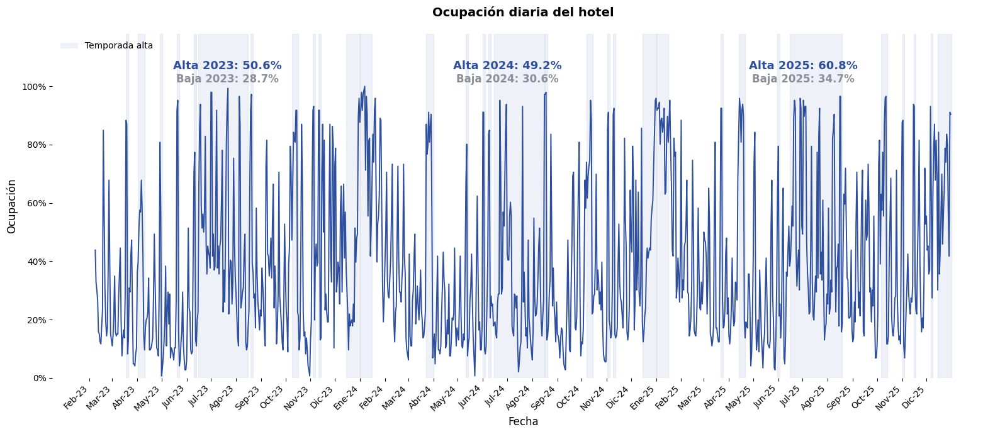

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.patches import Patch

# -----------------------------
# 1. Preparar base para gráfico
# -----------------------------
df_plot = df_model.copy()

df_plot["fecha_noche"] = pd.to_datetime(df_plot["fecha_noche"], errors="coerce")
df_plot["personas"] = pd.to_numeric(df_plot["personas"], errors="coerce").fillna(0)
df_plot["ocupacion"] = pd.to_numeric(df_plot["ocupacion"], errors="coerce")

df_plot = df_plot.sort_values("fecha_noche").reset_index(drop=True)

# -----------------------------
# 2. Calcular ocupación alta y baja por año
# -----------------------------
capacidad_personas = 146

df_plot["año"] = df_plot["fecha_noche"].dt.year

resumen_temp = (
    df_plot
    .groupby(["año", "temporada"], as_index=False)
    .agg(
        personas=("personas", "sum"),
        dias=("fecha_noche", "nunique")
    )
)

resumen_temp["ocupacion_temp"] = (
    resumen_temp["personas"] / (resumen_temp["dias"] * capacidad_personas)
)

alta = resumen_temp[resumen_temp["temporada"] == "Alta"][["año", "ocupacion_temp"]].rename(
    columns={"ocupacion_temp": "ocupacion_alta"}
)

baja = resumen_temp[resumen_temp["temporada"] == "Baja"][["año", "ocupacion_temp"]].rename(
    columns={"ocupacion_temp": "ocupacion_baja"}
)

resumen_anual_temp = alta.merge(baja, on="año", how="outer")

# fechas medias para ubicar textos
fechas_anuales = (
    df_plot
    .groupby("año", as_index=False)
    .agg(
        fecha_min=("fecha_noche", "min"),
        fecha_max=("fecha_noche", "max")
    )
)

fechas_anuales["fecha_mid"] = fechas_anuales["fecha_min"] + (
    fechas_anuales["fecha_max"] - fechas_anuales["fecha_min"]
) / 2

resumen_anual_temp = resumen_anual_temp.merge(
    fechas_anuales[["año", "fecha_mid"]],
    on="año",
    how="left"
)

# -----------------------------
# 3. Detectar bloques continuos de temporada alta
# -----------------------------
df_shade = (
    df_plot[["fecha_noche", "temporada"]]
    .drop_duplicates()
    .sort_values("fecha_noche")
    .copy()
)

df_shade["alta"] = (df_shade["temporada"] == "Alta").astype(int)
df_shade["grupo"] = (df_shade["alta"].ne(df_shade["alta"].shift())).cumsum()

bloques_alta = (
    df_shade[df_shade["alta"] == 1]
    .groupby("grupo", as_index=False)
    .agg(
        inicio=("fecha_noche", "min"),
        fin=("fecha_noche", "max")
    )
)

# -----------------------------
# 4. Formato de meses en español
# -----------------------------
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}

ticks_mensuales = pd.date_range(
    df_plot["fecha_noche"].min().replace(day=1),
    df_plot["fecha_noche"].max().replace(day=1),
    freq="MS"
)

labels_mensuales = [f"{meses_es[d.month]}-{str(d.year)[-2:]}" for d in ticks_mensuales]

# -----------------------------
# 5. Graficar
# -----------------------------
fig, ax = plt.subplots(figsize=(16, 7))

# sombreado de temporada alta
for _, row in bloques_alta.iterrows():
    ax.axvspan(
        row["inicio"],
        row["fin"] + pd.Timedelta(days=1),
        color="#2E4F9E",
        alpha=0.08
    )

# línea principal
ax.plot(
    df_plot["fecha_noche"],
    df_plot["ocupacion"],
    linewidth=1.4,
    color="#2E4F9E"
)

# líneas verticales por año
for year in sorted(df_plot["fecha_noche"].dt.year.unique()):
    fecha_inicio = pd.Timestamp(f"{year}-01-01")
    if df_plot["fecha_noche"].min() <= fecha_inicio <= df_plot["fecha_noche"].max():
        ax.axvline(fecha_inicio, linewidth=0.8, alpha=0.2, color="#999999")

# textos de ocupación alta y baja por año
y_top = df_plot["ocupacion"].max() * 1.05

for _, row in resumen_anual_temp.iterrows():
    # Alta
    ax.text(
        row["fecha_mid"],
        y_top,
        f"Alta {int(row['año'])}: {row['ocupacion_alta']:.1%}",
        ha="center",
        va="bottom",
        fontsize=13,
        fontweight="bold",
        color="#2E4F9E",
        zorder=5
    )

    # Baja
    ax.text(
        row["fecha_mid"],
        y_top - 0.045,
        f"Baja {int(row['año'])}: {row['ocupacion_baja']:.1%}",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
        color="#8A8F98",
        zorder=5
    )

# leyenda para sombreado
legend_patch = Patch(facecolor="#2E4F9E", alpha=0.08, edgecolor="none", label="Temporada alta")
ax.legend(handles=[legend_patch], loc="upper left", frameon=False)

# ejes
ax.set_xticks(ticks_mensuales)
ax.set_xticklabels(labels_mensuales, rotation=45, ha="right")
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.set_title(
    "Ocupación diaria del hotel",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Fecha", fontsize=12)
ax.set_ylabel("Ocupación", fontsize=12)

ax.grid(False)
ax.set_ylim(0, df_plot["ocupacion"].max() * 1.18)

plt.tight_layout()
plt.show()

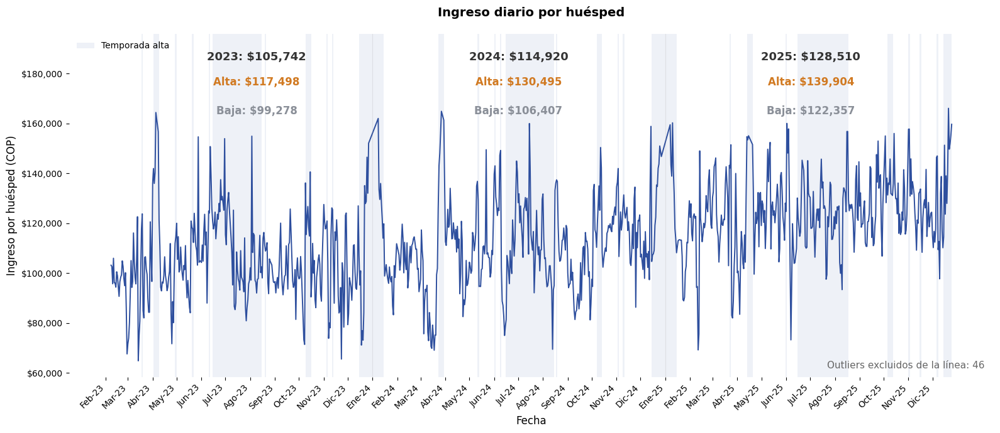

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from matplotlib.patches import Patch

# -----------------------------
# 1 Preparar datos
# -----------------------------
df_plot = df_model.copy()

df_plot["fecha_noche"] = pd.to_datetime(df_plot["fecha_noche"], errors="coerce")
df_plot["ingreso_por_huesped"] = pd.to_numeric(df_plot["ingreso_por_huesped"], errors="coerce")

df_plot = df_plot.sort_values("fecha_noche").reset_index(drop=True)
df_plot["año"] = df_plot["fecha_noche"].dt.year

# -----------------------------
# 2 Excluir outliers con IQR SOLO para la línea
# -----------------------------
q1 = df_plot["ingreso_por_huesped"].quantile(0.25)
q3 = df_plot["ingreso_por_huesped"].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

df_plot_clean = df_plot[
    (df_plot["ingreso_por_huesped"] >= lower_bound) &
    (df_plot["ingreso_por_huesped"] <= upper_bound)
].copy()

puntos_excluidos = len(df_plot) - len(df_plot_clean)

# -----------------------------
# 3 Promedio anual por temporada
# -----------------------------
promedio_anual_temp = (
    df_plot
    .groupby(["año", "temporada"], as_index=False)
    .agg(
        ingreso_promedio=("ingreso_por_huesped", "mean"),
        fecha_min=("fecha_noche", "min"),
        fecha_max=("fecha_noche", "max")
    )
)

promedio_anual_temp["fecha_mid"] = promedio_anual_temp["fecha_min"] + (
    promedio_anual_temp["fecha_max"] - promedio_anual_temp["fecha_min"]
) / 2

prom_alta = promedio_anual_temp[promedio_anual_temp["temporada"] == "Alta"].copy()
prom_baja = promedio_anual_temp[promedio_anual_temp["temporada"] == "Baja"].copy()

prom_labels = prom_alta[["año", "fecha_mid", "ingreso_promedio"]].rename(
    columns={"ingreso_promedio": "ingreso_alta"}
).merge(
    prom_baja[["año", "ingreso_promedio"]].rename(columns={"ingreso_promedio": "ingreso_baja"}),
    on="año",
    how="left"
)

# -----------------------------
# 4 Formato meses eje X
# -----------------------------
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}

ticks_mensuales = pd.date_range(
    df_plot_clean["fecha_noche"].min().replace(day=1),
    df_plot_clean["fecha_noche"].max().replace(day=1),
    freq="MS"
)

labels_mensuales = [
    f"{meses_es[d.month]}-{str(d.year)[-2:]}"
    for d in ticks_mensuales
]

# -----------------------------
# 5 Graficar
# -----------------------------
fig, ax = plt.subplots(figsize=(16, 7))

ax.plot(
    df_plot_clean["fecha_noche"],
    df_plot_clean["ingreso_por_huesped"],
    linewidth=1.4,
    color="#2E4F9E"
)

# sombreado temporada alta
df_shade = (
    df_plot_clean[["fecha_noche", "temporada"]]
    .drop_duplicates()
    .sort_values("fecha_noche")
    .copy()
)

df_shade["alta_flag"] = df_shade["temporada"] == "Alta"
df_shade["grupo"] = (df_shade["alta_flag"] != df_shade["alta_flag"].shift()).cumsum()

for _, g in df_shade.groupby("grupo"):
    if g["alta_flag"].iloc[0]:
        ax.axvspan(
            g["fecha_noche"].min(),
            g["fecha_noche"].max(),
            color="#2E4F9E",
            alpha=0.08,
            linewidth=0
        )

# líneas verticales por año
for year in sorted(df_plot_clean["año"].unique()):
    fecha_inicio = pd.Timestamp(f"{year}-01-01")
    if df_plot_clean["fecha_noche"].min() <= fecha_inicio <= df_plot_clean["fecha_noche"].max():
        ax.axvline(fecha_inicio, linewidth=0.8, alpha=0.2, color="#999999")

# -----------------------------
# 6 Anotaciones anuales
# -----------------------------
y_max = df_plot_clean["ingreso_por_huesped"].max()

y_year = y_max * 1.11
y_alta = y_max * 1.05
y_baja = y_max * 0.98

for _, row in prom_labels.iterrows():
    ingreso_anual = df_plot[df_plot["año"] == row["año"]]["ingreso_por_huesped"].mean()

    ax.text(
        row["fecha_mid"],
        y_year,
        f"{int(row['año'])}: ${ingreso_anual:,.0f}",
        ha="center",
        va="bottom",
        fontsize=13,
        fontweight="bold",
        color="#333333"
    )

    ax.text(
        row["fecha_mid"],
        y_alta,
        f"Alta: ${row['ingreso_alta']:,.0f}",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
        color="#D17A22"
    )

    ax.text(
        row["fecha_mid"],
        y_baja,
        f"Baja: ${row['ingreso_baja']:,.0f}",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
        color="#8A8F98"
    )

# nota outliers
ax.text(
    0.99,
    0.02,
    f"Outliers excluidos de la línea: {puntos_excluidos}",
    transform=ax.transAxes,
    ha="right",
    va="bottom",
    fontsize=11,
    color="#666666"
)

# ejes
ax.set_xticks(ticks_mensuales)
ax.set_xticklabels(labels_mensuales, rotation=45, ha="right")

ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))

# quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.set_title(
    "Ingreso diario por huésped",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Fecha", fontsize=12)
ax.set_ylabel("Ingreso por huésped (COP)", fontsize=12)

ax.grid(False)

ax.set_ylim(
    df_plot_clean["ingreso_por_huesped"].min() * 0.9,
    y_max * 1.18
)

# leyenda
legend_patch = Patch(
    facecolor="#2E4F9E",
    alpha=0.08,
    edgecolor="none",
    label="Temporada alta"
)

ax.legend(
    handles=[legend_patch],
    loc="upper left",
    frameon=False
)

plt.tight_layout()
plt.show()

La extraccion ha pasado de 0,59 - 0,61 - 0,76 bps

## Grafico Ocupacion por habitacion

In [ ]:
df_reservas_dep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25151 entries, 0 to 25150
Data columns (total 37 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              25151 non-null  object        
 1   fecha_ingreso                           25151 non-null  datetime64[ns]
 2   fecha_salida                            25151 non-null  datetime64[ns]
 3   numero_personas                         25151 non-null  int64         
 4   nombre_cuarto                           25151 non-null  object        
 5   id_grupo                                11875 non-null  object        
 6   agencia                                 25151 non-null  object        
 7   nombre                                  25151 non-null  object        
 8   primer_apellido                         25151 non-null  object        
 9   segundo_apellido                        25151 non-

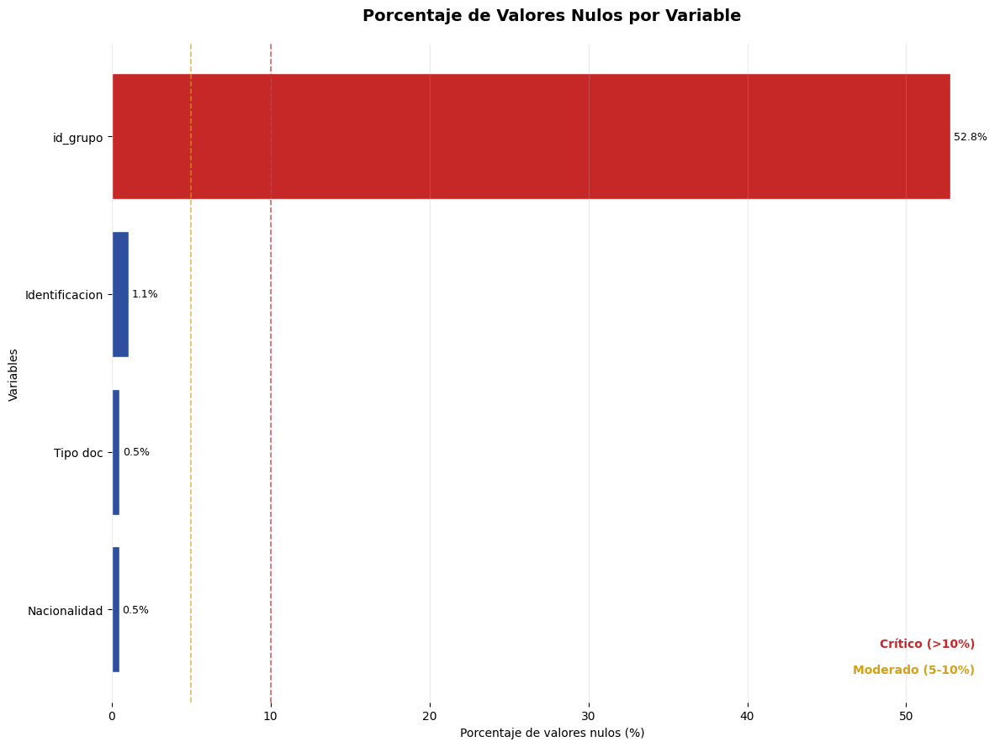

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Colores del proyecto
AZUL = "#2E4F9E"
DORADO = "#D4A017"
ROJO = "#C62828"

# ════════════════════════════════════════════════════════════════
# Calcular porcentaje de nulos
# ════════════════════════════════════════════════════════════════
missing = df_reservas_dep.isnull().mean() * 100
missing = missing.sort_values(ascending=False)
missing = missing[missing > 0]

# Colores según criticidad
colors = [
    ROJO if x > 10 else
    DORADO if x > 5 else
    AZUL
    for x in missing.values
]

# ════════════════════════════════════════════════════════════════
# Gráfica
# ════════════════════════════════════════════════════════════════
fig, ax = plt.subplots(figsize=(12, 9))

bars = ax.barh(
    missing.index,
    missing.values,
    color=colors,
    edgecolor="white"
)

ax.invert_yaxis()

# Etiquetas de porcentaje
for bar in bars:
    width = bar.get_width()
    ax.text(
        width + 0.2,
        bar.get_y() + bar.get_height()/2,
        f"{width:.1f}%",
        va="center",
        fontsize=9
    )

# Líneas de referencia
ax.axvline(10, color=ROJO, linestyle="--", linewidth=1.2, alpha=0.7)
ax.axvline(5, color=DORADO, linestyle="--", linewidth=1.2, alpha=0.7)

# Leyenda inferior derecha
ax.text(
    0.98, 0.08,
    "Crítico (>10%)",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=ROJO,
    fontweight="bold"
)

ax.text(
    0.98, 0.04,
    "Moderado (5-10%)",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=DORADO,
    fontweight="bold"
)

# Quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

# Título
ax.set_title(
    "Porcentaje de Valores Nulos por Variable",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Porcentaje de valores nulos (%)")
ax.set_ylabel("Variables")

ax.grid(axis="x", alpha=0.25)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import re

df_heat = df_reservas_dep.copy()

df_heat["fecha_noche"] = pd.to_datetime(df_heat["fecha_noche"], errors="coerce")
df_heat["numero_personas"] = pd.to_numeric(df_heat["numero_personas"], errors="coerce").fillna(0)
df_heat["capacidad"] = pd.to_numeric(df_heat["capacidad"], errors="coerce")

df_heat_2025 = df_heat[df_heat["fecha_noche"].dt.year == 2025].copy()

In [ ]:
#Clasifica habitaciones en grupos

def clasificar_grupo(nombre):
    n = str(nombre).strip().lower()

    if "cuadruple" in n or "cuádruple" in n:
        return "Cuádruple"
    elif "doble" in n or "twin" in n or "pasadia + almuerzo + habitacion" in n or "pasadía + almuerzo + habitación" in n:
        return "Doble"
    elif "triple" in n:
        return "Triple"
    elif "familiar" in n:
        return "Familiar"
    elif n == "apartamento 1":
        return "Apartamento"
    elif "pasadia + almuerzo" in n or "pasadía + almuerzo" in n:
        return "Pasadía"
    else:
        return "Otros"

df_heat_2025["grupo_habitacion"] = df_heat_2025["nombre_cuarto"].apply(clasificar_grupo)

In [ ]:
#Ocupacion por habitacion

room_stats = (
    df_heat_2025
    .groupby(["grupo_habitacion", "nombre_cuarto"], as_index=False)
    .agg(
        personas_anuales=("numero_personas", "sum"),
        capacidad_promedio=("capacidad", "mean")
    )
)

room_stats["ocupacion_2025"] = (
    room_stats["personas_anuales"] / (room_stats["capacidad_promedio"] * 365)
)

In [ ]:
def extraer_numero(nombre):
    nombre = str(nombre)
    nums = re.findall(r"\d+", nombre)
    return int(nums[-1]) if nums else 9999

room_stats["orden_num"] = room_stats["nombre_cuarto"].apply(extraer_numero)

orden_grupos = {
    "Doble": 1,
    "Triple": 2,
    "Cuádruple": 3,
    "Familiar": 4,
    "Apartamento": 5,
    "Pasadía": 6,
    "Otros": 7
}

room_stats["orden_grupo"] = room_stats["grupo_habitacion"].map(orden_grupos).fillna(99)

room_stats = room_stats.sort_values(
    ["orden_grupo", "orden_num", "nombre_cuarto"]
).reset_index(drop=True)

room_stats.head()

,grupo_habitacion,nombre_cuarto,personas_anuales,capacidad_promedio,ocupacion_2025,orden_num,orden_grupo
0,Doble,Doble 11,432,2.0,0.591781,11,1
1,Doble,Doble 12,471,2.0,0.645205,12,1
2,Doble,Doble 13,482,2.0,0.660274,13,1
3,Doble,Doble 14,538,2.0,0.736986,14,1
4,Doble,Twin 21,368,2.0,0.504110,21,1


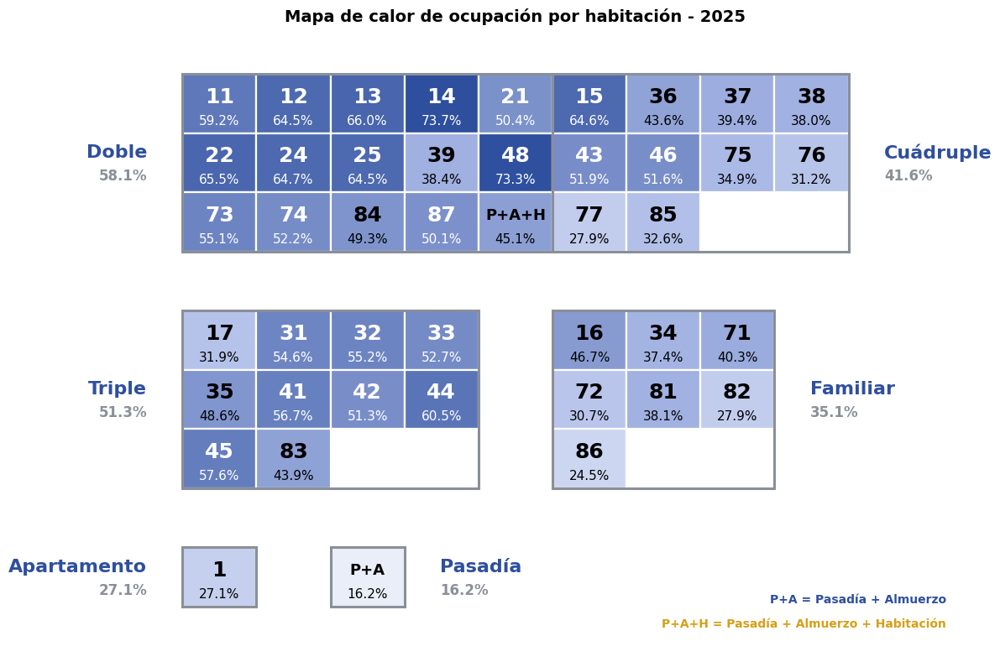

In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Rectangle
from matplotlib.colors import LinearSegmentedColormap

# =========================================================
# 0) Colores del proyecto
# =========================================================
AZUL = "#2E4F9E"
AZUL_MED = "#6F86C3"
AZUL_CLARO = "#A9B8E6"
DORADO = "#D4A017"
ROJO = "#C62828"
GRIS = "#8A8F98"

# cmap estilo proyecto
cmap_proyecto = LinearSegmentedColormap.from_list(
    "ocupacion_proyecto",
    ["#E9EEF9", AZUL_CLARO, AZUL_MED, AZUL]
)

# =========================================================
# 1) Copiar base
# =========================================================
tiles_df = room_stats.copy()

# =========================================================
# 2) Texto visible dentro de la celda
# =========================================================
def etiqueta_visible(nombre):
    n = str(nombre).strip()
    n_low = n.lower()

    if "pasadia + almuerzo + habitacion" in n_low or "pasadía + almuerzo + habitación" in n_low:
        return "P+A+H"
    elif "pasadia + almuerzo" in n_low or "pasadía + almuerzo" in n_low:
        return "P+A"
    else:
        nums = re.findall(r"\d+", n)
        return nums[-1] if nums else n

tiles_df["habitacion_num"] = tiles_df["nombre_cuarto"].apply(etiqueta_visible)

# =========================================================
# 3) Definir layout tipo matriz/plano
# =========================================================
group_ncols = {
    "Doble": 5,
    "Triple": 4,
    "Cuádruple": 4,
    "Cuadruple": 4,
    "Familiar": 3,
    "Apartamento": 2,
    "Pasadía": 2,
    "Pasadia": 2,
    "Otros": 2
}

group_start = {
    "Doble": (0, 0),
    "Triple": (4, 0),
    "Cuádruple": (0, 5),
    "Cuadruple": (0, 5),
    "Familiar": (4, 5),
    "Apartamento": (8, 0),
    "Pasadía": (8, 2),
    "Pasadia": (8, 2),
    "Otros": (8, 4)
}

tile_w = 1.25
tile_h = 1.0

# =========================================================
# 4) Crear coordenadas
# =========================================================
tiles = []

for grupo in tiles_df["grupo_habitacion"].drop_duplicates():
    df_g = tiles_df[tiles_df["grupo_habitacion"] == grupo].copy()

    ncols = group_ncols.get(grupo, 3)
    start_row, start_col = group_start.get(grupo, (0, 0))

    if "orden_num" in df_g.columns:
        df_g = df_g.sort_values("orden_num")
    else:
        df_g = df_g.sort_values("nombre_cuarto")

    for i, (_, row) in enumerate(df_g.iterrows()):
        r = i // ncols
        c = i % ncols

        tiles.append({
            "grupo_habitacion": grupo,
            "nombre_cuarto": row["nombre_cuarto"],
            "habitacion_num": row["habitacion_num"],
            "ocupacion_2025": row["ocupacion_2025"],
            "grid_row": start_row + r,
            "grid_col": start_col + c
        })

tiles_plot = pd.DataFrame(tiles)

# =========================================================
# 5) Dimensiones globales
# =========================================================
max_row = tiles_plot["grid_row"].max() + 1
max_col = tiles_plot["grid_col"].max() + 1

# =========================================================
# 6) Escala de color
# =========================================================
vmin = tiles_plot["ocupacion_2025"].min()
vmax = tiles_plot["ocupacion_2025"].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cmap_proyecto

# =========================================================
# 7) Promedio de ocupación por tipo
# =========================================================
group_occ = (
    tiles_df.groupby("grupo_habitacion", as_index=False)["ocupacion_2025"]
    .mean()
    .rename(columns={"ocupacion_2025": "ocupacion_promedio_tipo"})
)

# =========================================================
# 8) Graficar
# =========================================================
fig, ax = plt.subplots(figsize=(14, 8))

for _, row in tiles_plot.iterrows():
    x = row["grid_col"] * tile_w
    y = (max_row - 1 - row["grid_row"]) * tile_h

    color = cmap(norm(row["ocupacion_2025"]))

    rect = Rectangle(
        (x, y),
        tile_w,
        tile_h,
        facecolor=color,
        edgecolor="white",
        linewidth=1.6
    )
    ax.add_patch(rect)

    # color de texto dinámico
    text_color = "white" if row["ocupacion_2025"] >= tiles_plot["ocupacion_2025"].median() else "black"

    fs_num = 18
    if row["habitacion_num"] in ["P+A", "P+A+H"]:
        fs_num = 13

    ax.text(
        x + tile_w / 2,
        y + tile_h * 0.62,
        str(row["habitacion_num"]),
        ha="center",
        va="center",
        fontsize=fs_num,
        fontweight="bold",
        color=text_color
    )

    ax.text(
        x + tile_w / 2,
        y + tile_h * 0.22,
        f"{row['ocupacion_2025']:.1%}",
        ha="center",
        va="center",
        fontsize=11,
        color=text_color
    )

# =========================================================
# 9) Bordes por bloque
# =========================================================
group_boxes = (
    tiles_plot.groupby("grupo_habitacion", as_index=False)
    .agg(
        row_min=("grid_row", "min"),
        row_max=("grid_row", "max"),
        col_min=("grid_col", "min"),
        col_max=("grid_col", "max")
    )
).merge(group_occ, on="grupo_habitacion", how="left")

for _, row in group_boxes.iterrows():
    x = row["col_min"] * tile_w
    y = (max_row - 1 - row["row_max"]) * tile_h
    w = (row["col_max"] - row["col_min"] + 1) * tile_w
    h = (row["row_max"] - row["row_min"] + 1) * tile_h

    outer = Rectangle(
        (x, y),
        w,
        h,
        fill=False,
        edgecolor=GRIS,
        linewidth=2.2
    )
    ax.add_patch(outer)

# =========================================================
# 10) Etiquetas externas + ocupación promedio del tipo
# =========================================================
for _, row in group_boxes.iterrows():
    grupo = row["grupo_habitacion"]

    x = row["col_min"] * tile_w
    y = (max_row - 1 - row["row_max"]) * tile_h
    w = (row["col_max"] - row["col_min"] + 1) * tile_w
    h = (row["row_max"] - row["row_min"] + 1) * tile_h

    x_center = x + w / 2
    y_center = y + h / 2

    if grupo in ["Pasadía", "Pasadia"]:
        x_text = x + w + 0.6
        ha = "left"
    else:
        if x_center < (max_col * tile_w) / 2:
            x_text = x - 0.6
            ha = "right"
        else:
            x_text = x + w + 0.6
            ha = "left"

    ax.text(
        x_text,
        y_center + 0.18,
        grupo,
        ha=ha,
        va="center",
        fontsize=16,
        fontweight="bold",
        color=AZUL
    )

    ax.text(
        x_text,
        y_center - 0.22,
        f"{row['ocupacion_promedio_tipo']:.1%}",
        ha=ha,
        va="center",
        fontsize=12,
        color=GRIS,
        fontweight="bold"
    )

# =========================================================
# 11) Nota explicativa de siglas
# =========================================================
ax.text(
    0.99,
    0.08,
    "P+A = Pasadía + Almuerzo",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=AZUL,
    fontweight="bold"
)

ax.text(
    0.99,
    0.04,
    "P+A+H = Pasadía + Almuerzo + Habitación",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=DORADO,
    fontweight="bold"
)

# =========================================================
# 12) Estética final
# =========================================================
ax.set_title(
    "Mapa de calor de ocupación por habitación - 2025",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.axis("off")
ax.set_aspect("equal")

ax.set_xlim(-1.8, max_col * tile_w + 1.8)
ax.set_ylim(-0.8, max_row * tile_h + 0.5)

plt.tight_layout()
plt.show()

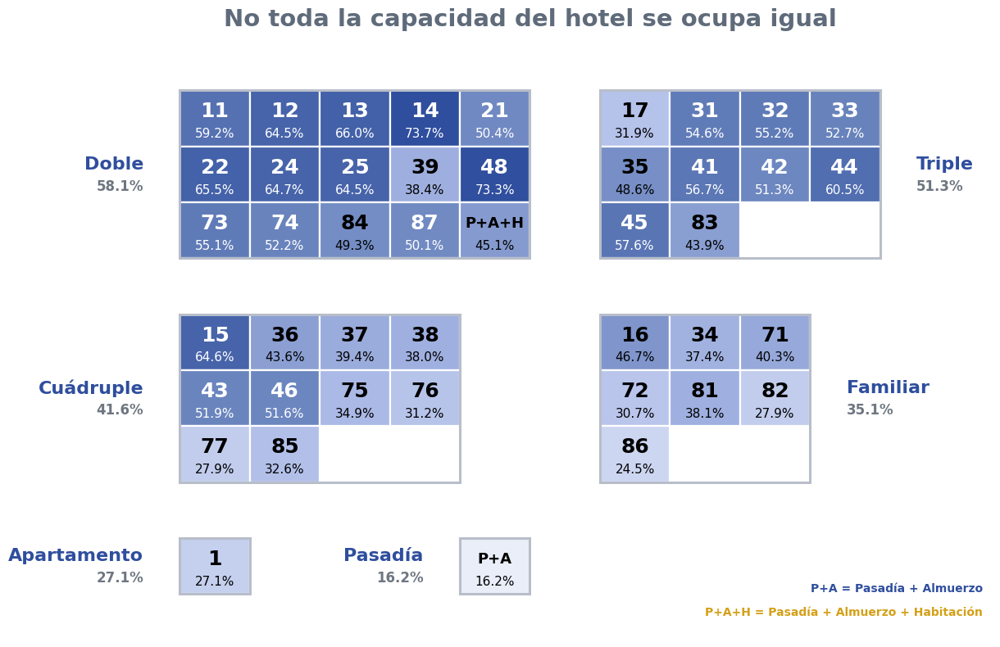

In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Rectangle
from matplotlib.colors import LinearSegmentedColormap

# =========================================================
# 0) Colores y estilo alineados con slide 1
# =========================================================
AZUL_OSCURO = "#2F4E9E"
AZUL_MEDIO = "#617DB8"
AZUL_CLARO = "#A9B8E6"
GRIS_TITULO = "#5F6B7A"
GRIS_TEXTO = "#6E7681"
GRIS_BORDE = "#B8BEC9"
DORADO = "#D4A017"

cmap_proyecto = LinearSegmentedColormap.from_list(
    "ocupacion_proyecto",
    ["#E9EEF9", AZUL_CLARO, AZUL_MEDIO, AZUL_OSCURO]
)

# =========================================================
# 1) Copiar base
# =========================================================
tiles_df = room_stats.copy()

# =========================================================
# 2) Texto visible dentro de la celda
# =========================================================
def etiqueta_visible(nombre):
    n = str(nombre).strip()
    n_low = n.lower()

    if "pasadia + almuerzo + habitacion" in n_low or "pasadía + almuerzo + habitación" in n_low:
        return "P+A+H"
    elif "pasadia + almuerzo" in n_low or "pasadía + almuerzo" in n_low:
        return "P+A"
    else:
        nums = re.findall(r"\d+", n)
        return nums[-1] if nums else n

tiles_df["habitacion_num"] = tiles_df["nombre_cuarto"].apply(etiqueta_visible)

# =========================================================
# 3) Layout NUEVO solicitado
#    Arriba: Doble | Triple
#    Medio : Cuádruple | Familiar
#    Abajo : Apartamento | Pasadía
# =========================================================
group_ncols = {
    "Doble": 5,
    "Triple": 4,
    "Cuádruple": 4,
    "Cuadruple": 4,
    "Familiar": 3,
    "Apartamento": 2,
    "Pasadía": 2,
    "Pasadia": 2,
    "Otros": 2
}

# (row, col)
group_start = {
    "Doble": (0, 0),
    "Triple": (0, 6),
    "Cuádruple": (4, 0),
    "Cuadruple": (4, 0),
    "Familiar": (4, 6),
    "Apartamento": (8, 0),
    "Pasadía": (8, 4),
    "Pasadia": (8, 4),
    "Otros": (8, 8)
}

tile_w = 1.25
tile_h = 1.0

# =========================================================
# 4) Crear coordenadas
# =========================================================
tiles = []

for grupo in tiles_df["grupo_habitacion"].drop_duplicates():
    df_g = tiles_df[tiles_df["grupo_habitacion"] == grupo].copy()

    ncols = group_ncols.get(grupo, 3)
    start_row, start_col = group_start.get(grupo, (0, 0))

    if "orden_num" in df_g.columns:
        df_g = df_g.sort_values("orden_num")
    else:
        df_g = df_g.sort_values("nombre_cuarto")

    for i, (_, row) in enumerate(df_g.iterrows()):
        r = i // ncols
        c = i % ncols

        tiles.append({
            "grupo_habitacion": grupo,
            "nombre_cuarto": row["nombre_cuarto"],
            "habitacion_num": row["habitacion_num"],
            "ocupacion_2025": row["ocupacion_2025"],
            "grid_row": start_row + r,
            "grid_col": start_col + c
        })

tiles_plot = pd.DataFrame(tiles)

# =========================================================
# 5) Dimensiones globales
# =========================================================
max_row = tiles_plot["grid_row"].max() + 1
max_col = tiles_plot["grid_col"].max() + 1

# =========================================================
# 6) Escala de color
# =========================================================
vmin = tiles_plot["ocupacion_2025"].min()
vmax = tiles_plot["ocupacion_2025"].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cmap = cmap_proyecto

# =========================================================
# 7) Promedio de ocupación por tipo
# =========================================================
group_occ = (
    tiles_df.groupby("grupo_habitacion", as_index=False)["ocupacion_2025"]
    .mean()
    .rename(columns={"ocupacion_2025": "ocupacion_promedio_tipo"})
)

# =========================================================
# 8) Graficar
# =========================================================
fig, ax = plt.subplots(figsize=(14, 8))

for _, row in tiles_plot.iterrows():
    x = row["grid_col"] * tile_w
    y = (max_row - 1 - row["grid_row"]) * tile_h

    color = cmap(norm(row["ocupacion_2025"]))

    rect = Rectangle(
        (x, y),
        tile_w,
        tile_h,
        facecolor=color,
        edgecolor="white",
        linewidth=1.6
    )
    ax.add_patch(rect)

    # texto dinámico
    text_color = "white" if row["ocupacion_2025"] >= tiles_plot["ocupacion_2025"].median() else "black"

    fs_num = 18
    if row["habitacion_num"] in ["P+A", "P+A+H"]:
        fs_num = 13

    ax.text(
        x + tile_w / 2,
        y + tile_h * 0.62,
        str(row["habitacion_num"]),
        ha="center",
        va="center",
        fontsize=fs_num,
        fontweight="bold",
        color=text_color
    )

    ax.text(
        x + tile_w / 2,
        y + tile_h * 0.22,
        f"{row['ocupacion_2025']:.1%}",
        ha="center",
        va="center",
        fontsize=11,
        color=text_color
    )

# =========================================================
# 9) Bordes por bloque
# =========================================================
group_boxes = (
    tiles_plot.groupby("grupo_habitacion", as_index=False)
    .agg(
        row_min=("grid_row", "min"),
        row_max=("grid_row", "max"),
        col_min=("grid_col", "min"),
        col_max=("grid_col", "max")
    )
).merge(group_occ, on="grupo_habitacion", how="left")

for _, row in group_boxes.iterrows():
    x = row["col_min"] * tile_w
    y = (max_row - 1 - row["row_max"]) * tile_h
    w = (row["col_max"] - row["col_min"] + 1) * tile_w
    h = (row["row_max"] - row["row_min"] + 1) * tile_h

    outer = Rectangle(
        (x, y),
        w,
        h,
        fill=False,
        edgecolor=GRIS_BORDE,
        linewidth=2.2
    )
    ax.add_patch(outer)

# =========================================================
# 10) Etiquetas externas
# =========================================================
for _, row in group_boxes.iterrows():
    grupo = row["grupo_habitacion"]

    x = row["col_min"] * tile_w
    y = (max_row - 1 - row["row_max"]) * tile_h
    w = (row["col_max"] - row["col_min"] + 1) * tile_w
    h = (row["row_max"] - row["row_min"] + 1) * tile_h

    x_center = x + w / 2
    y_center = y + h / 2

    # Etiquetas a izquierda para bloques de la izquierda,
    # a derecha para bloques de la derecha
    if x_center < (max_col * tile_w) / 2:
        x_text = x - 0.65
        ha = "right"
    else:
        x_text = x + w + 0.65
        ha = "left"

    ax.text(
        x_text,
        y_center + 0.18,
        grupo,
        ha=ha,
        va="center",
        fontsize=16,
        fontweight="bold",
        color=AZUL_OSCURO
    )

    ax.text(
        x_text,
        y_center - 0.22,
        f"{row['ocupacion_promedio_tipo']:.1%}",
        ha=ha,
        va="center",
        fontsize=12,
        color=GRIS_TEXTO,
        fontweight="bold"
    )

# =========================================================
# 11) Nota explicativa de siglas
# =========================================================
ax.text(
    0.99,
    0.075,
    "P+A = Pasadía + Almuerzo",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=AZUL_OSCURO,
    fontweight="bold"
)

ax.text(
    0.99,
    0.035,
    "P+A+H = Pasadía + Almuerzo + Habitación",
    transform=ax.transAxes,
    fontsize=10,
    ha="right",
    va="bottom",
    color=DORADO,
    fontweight="bold"
)

# =========================================================
# 12) Estética final alineada con slide 1
# =========================================================
ax.set_title(
    "No toda la capacidad del hotel se ocupa igual",
    fontsize=21,
    fontweight="bold",
    color=GRIS_TITULO,
    pad=22,
    loc="center"
)

ax.axis("off")
ax.set_aspect("equal")

ax.set_xlim(-2.0, max_col * tile_w + 2.0)
ax.set_ylim(-0.8, max_row * tile_h + 0.7)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# =========================================================
# 1. Copia y limpieza básica
# =========================================================
df_occ = df_reservas_dep.copy()

col_fecha = "fecha_noche"
col_personas = "numero_personas"
col_capacidad = "capacidad"
col_cuarto = "nombre_cuarto"
col_categoria = "nombre_categoria"

# Convertir tipos
df_occ[col_fecha] = pd.to_datetime(df_occ[col_fecha], errors="coerce")
df_occ[col_personas] = pd.to_numeric(df_occ[col_personas], errors="coerce")
df_occ[col_capacidad] = pd.to_numeric(df_occ[col_capacidad], errors="coerce")

# Filtrar registros válidos
df_occ = df_occ.dropna(subset=[col_fecha, col_personas, col_capacidad, col_cuarto]).copy()

# Si nombre_categoria tiene nulos, preservarlos
if col_categoria in df_occ.columns:
    df_occ[col_categoria] = df_occ[col_categoria].fillna("Sin categoría")
else:
    df_occ[col_categoria] = "Sin categoría"

# Normalizar texto
df_occ[col_cuarto] = df_occ[col_cuarto].astype(str).str.strip()
df_occ[col_categoria] = df_occ[col_categoria].astype(str).str.strip()

# =========================================================
# 2. Ajustes manuales de categoría
# =========================================================
ajustes_categoria = {
    "Twin 21": "Doble",
    "Cuadruple 15": "Cuádruple",
    "Cuádruple 15": "Cuádruple",
    "Pasadia + Almuerzo + Habitacion": "Doble",
    "Pasadía + Almuerzo + Habitación": "Doble"
}

df_occ[col_categoria] = df_occ.apply(
    lambda row: ajustes_categoria.get(row[col_cuarto], row[col_categoria]),
    axis=1
)

# =========================================================
# 3. Crear campos temporales
# =========================================================
df_occ["anio"] = df_occ[col_fecha].dt.year
df_occ["mes"] = df_occ[col_fecha].dt.month
df_occ["periodo_mes"] = df_occ[col_fecha].dt.to_period("M").astype(str)
df_occ["dias_mes"] = df_occ[col_fecha].dt.days_in_month

# =========================================================
# 4. Agregación mensual por habitación
# =========================================================
ocupacion_mensual_habitacion = (
    df_occ
    .groupby(
        ["anio", "mes", "periodo_mes", col_cuarto, col_categoria],
        as_index=False
    )
    .agg(
        numero_personas_mes=(col_personas, "sum"),
        capacidad_promedio_mes=(col_capacidad, "mean"),
        dias_mes=("dias_mes", "max")
    )
)

# =========================================================
# 5. Capacidad total del mes y ocupación mensual
# =========================================================
ocupacion_mensual_habitacion["capacidad_total_mes"] = (
    ocupacion_mensual_habitacion["capacidad_promedio_mes"]
    * ocupacion_mensual_habitacion["dias_mes"]
)

ocupacion_mensual_habitacion["ocupacion_mensual"] = (
    ocupacion_mensual_habitacion["numero_personas_mes"]
    / ocupacion_mensual_habitacion["capacidad_total_mes"]
)

# =========================================================
# 6. Orden final
# =========================================================
ocupacion_mensual_habitacion = ocupacion_mensual_habitacion.sort_values(
    ["anio", "mes", col_categoria, col_cuarto]
).reset_index(drop=True)

print(ocupacion_mensual_habitacion.head())
print(ocupacion_mensual_habitacion.shape)

   anio  mes periodo_mes  nombre_cuarto nombre_categoria  numero_personas_mes  \
0  2023    1     2023-01  Apartamento 1      Apartamento                  151   
1  2023    1     2023-01   Cuadruple 15        Cuádruple                   95   
2  2023    1     2023-01   Cuadruple 36        Cuádruple                   87   
3  2023    1     2023-01   Cuadruple 37        Cuádruple                   85   
4  2023    1     2023-01   Cuadruple 38        Cuádruple                   84   

   capacidad_promedio_mes  dias_mes  capacidad_total_mes  ocupacion_mensual  
0                     8.0        31                248.0           0.608871  
1                     4.0        31                124.0           0.766129  
2                     4.0        31                124.0           0.701613  
3                     4.0        31                124.0           0.685484  
4                     4.0        31                124.0           0.677419  
(1682, 10)


In [ ]:
ocupacion_mensual_habitacion.to_excel("ocupacion_mensual_habitacion.xlsx", index=False)

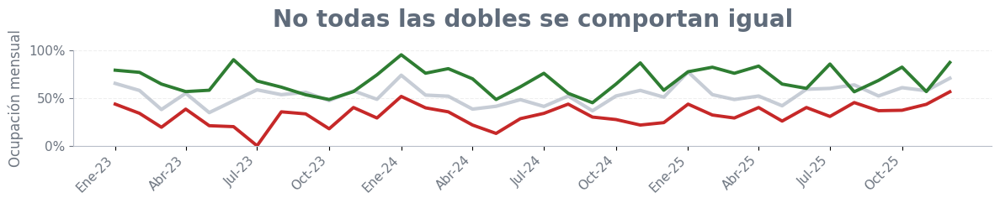

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# =========================================================
# 1. Copiar base
# =========================================================
df_plot = ocupacion_mensual_habitacion.copy()

# Asegurar tipos
df_plot["anio"] = pd.to_numeric(df_plot["anio"], errors="coerce")
df_plot["mes"] = pd.to_numeric(df_plot["mes"], errors="coerce")
df_plot["ocupacion_mensual"] = pd.to_numeric(df_plot["ocupacion_mensual"], errors="coerce")

# Crear fecha mensual
df_plot["fecha_mes"] = pd.to_datetime(
    dict(year=df_plot["anio"], month=df_plot["mes"], day=1),
    errors="coerce"
)

# Filtrar periodo
fecha_inicio = pd.Timestamp("2023-01-01")
fecha_fin = pd.Timestamp("2025-12-01")

df_plot = df_plot[
    (df_plot["fecha_mes"] >= fecha_inicio) &
    (df_plot["fecha_mes"] <= fecha_fin)
].copy()

# =========================================================
# 2. Serie categoría Doble (promedio mensual)
# =========================================================
serie_doble = (
    df_plot[df_plot["nombre_categoria"] == "Doble"]
    .groupby("fecha_mes", as_index=False)["ocupacion_mensual"]
    .mean()
    .rename(columns={"ocupacion_mensual": "ocupacion_doble_promedio"})
)

# =========================================================
# 3. Serie Doble 48
# =========================================================
serie_doble_48 = (
    df_plot[df_plot["nombre_cuarto"] == "Doble 48"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_doble_48"})
)

# =========================================================
# 4. Serie Doble 39
# =========================================================
serie_doble_39 = (
    df_plot[df_plot["nombre_cuarto"] == "Doble 39"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_doble_39"})
)

# =========================================================
# 5. Unir series sobre calendario mensual completo
# =========================================================
calendario = pd.DataFrame({
    "fecha_mes": pd.date_range(start=fecha_inicio, end=fecha_fin, freq="MS")
})

plot_df = (
    calendario
    .merge(serie_doble, on="fecha_mes", how="left")
    .merge(serie_doble_48, on="fecha_mes", how="left")
    .merge(serie_doble_39, on="fecha_mes", how="left")
)

# Rellenar vacíos con 0
plot_df["ocupacion_doble_promedio"] = plot_df["ocupacion_doble_promedio"].fillna(0)
plot_df["ocupacion_doble_48"] = plot_df["ocupacion_doble_48"].fillna(0)
plot_df["ocupacion_doble_39"] = plot_df["ocupacion_doble_39"].fillna(0)

# =========================================================
# 6. Colores
# =========================================================
verde = "#2E7D32"
rojo = "#C62828"
gris_claro = "#C7CDD6"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(11.98, 2.52))

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_doble_promedio"],
    color=gris_claro,
    linewidth=3,
    label="Promedio Doble",
    zorder=1
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_doble_48"],
    color=verde,
    linewidth=2.8,
    label="Doble 48",
    zorder=3
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_doble_39"],
    color=rojo,
    linewidth=2.8,
    label="Doble 39",
    zorder=3
)

# =========================================================
# 8. Estilo del eje X
# =========================================================
ticks = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="3MS")
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}
labels = [f"{meses_es[d.month]}-{str(d.year)[-2:]}" for d in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=11, color=gris_texto)

# =========================================================
# 9. Estilo del eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# =========================================================
# 10. Título y leyenda
# =========================================================
ax.set_title(
    "No todas las dobles se comportan igual",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

#legend = ax.legend(
#    loc="upper left",
#    frameon=False,
#    fontsize=11
#)
#for text in legend.get_texts():
#    text.set_color(gris_texto)

# =========================================================
# 11. Estética final
# =========================================================
ax.set_xlabel("")
ax.set_ylabel("Ocupación mensual", fontsize=12, color=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.20)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

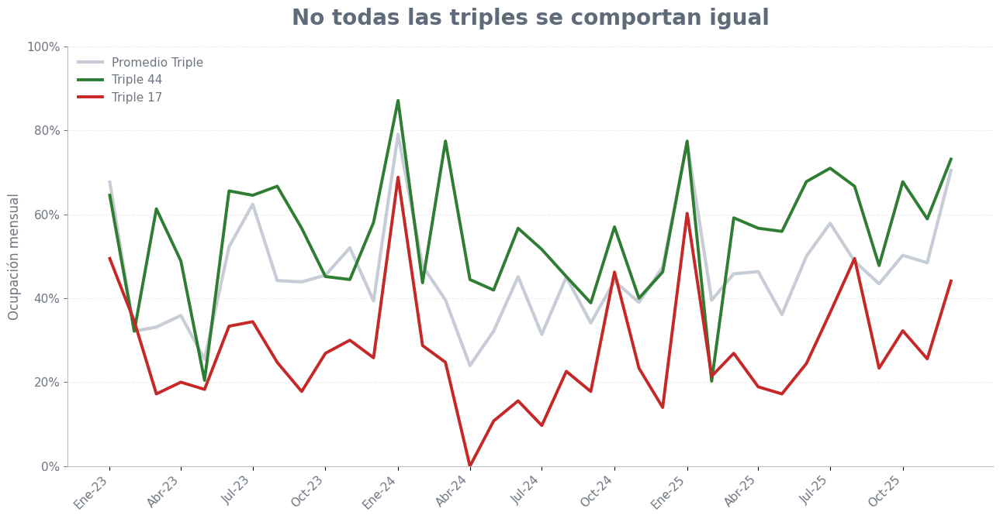

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# =========================================================
# 1. Copiar base
# =========================================================
df_plot = ocupacion_mensual_habitacion.copy()

# Asegurar tipos
df_plot["anio"] = pd.to_numeric(df_plot["anio"], errors="coerce")
df_plot["mes"] = pd.to_numeric(df_plot["mes"], errors="coerce")
df_plot["ocupacion_mensual"] = pd.to_numeric(df_plot["ocupacion_mensual"], errors="coerce")

# Crear fecha mensual
df_plot["fecha_mes"] = pd.to_datetime(
    dict(year=df_plot["anio"], month=df_plot["mes"], day=1),
    errors="coerce"
)

# Filtrar periodo
fecha_inicio = pd.Timestamp("2023-01-01")
fecha_fin = pd.Timestamp("2025-12-01")

df_plot = df_plot[
    (df_plot["fecha_mes"] >= fecha_inicio) &
    (df_plot["fecha_mes"] <= fecha_fin)
].copy()

# =========================================================
# 2. Serie categoría Triple (promedio mensual)
# =========================================================
serie_triple = (
    df_plot[df_plot["nombre_categoria"] == "Triple"]
    .groupby("fecha_mes", as_index=False)["ocupacion_mensual"]
    .mean()
    .rename(columns={"ocupacion_mensual": "ocupacion_triple_promedio"})
)

# =========================================================
# 3. Serie Triple 44
# =========================================================
serie_triple_44 = (
    df_plot[df_plot["nombre_cuarto"] == "Triple 44"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_triple_44"})
)

# =========================================================
# 4. Serie Triple 17
# =========================================================
serie_triple_17 = (
    df_plot[df_plot["nombre_cuarto"] == "Triple 17"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_triple_17"})
)

# =========================================================
# 5. Unir series sobre calendario mensual completo
# =========================================================
calendario = pd.DataFrame({
    "fecha_mes": pd.date_range(start=fecha_inicio, end=fecha_fin, freq="MS")
})

plot_df = (
    calendario
    .merge(serie_triple, on="fecha_mes", how="left")
    .merge(serie_triple_44, on="fecha_mes", how="left")
    .merge(serie_triple_17, on="fecha_mes", how="left")
)

# Rellenar vacíos con 0
plot_df["ocupacion_triple_promedio"] = plot_df["ocupacion_triple_promedio"].fillna(0)
plot_df["ocupacion_triple_44"] = plot_df["ocupacion_triple_44"].fillna(0)
plot_df["ocupacion_triple_17"] = plot_df["ocupacion_triple_17"].fillna(0)

# =========================================================
# 6. Colores
# =========================================================
verde = "#2E7D32"
rojo = "#C62828"
gris_claro = "#C7CDD6"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(13, 6.8))

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_triple_promedio"],
    color=gris_claro,
    linewidth=3,
    label="Promedio Triple",
    zorder=1
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_triple_44"],
    color=verde,
    linewidth=2.8,
    label="Triple 44",
    zorder=3
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_triple_17"],
    color=rojo,
    linewidth=2.8,
    label="Triple 17",
    zorder=3
)

# =========================================================
# 8. Estilo del eje X
# =========================================================
ticks = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="3MS")
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}
labels = [f"{meses_es[d.month]}-{str(d.year)[-2:]}" for d in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=11, color=gris_texto)

# =========================================================
# 9. Estilo del eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# =========================================================
# 10. Título y leyenda
# =========================================================
ax.set_title(
    "No todas las triples se comportan igual",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

legend = ax.legend(
    loc="upper left",
    frameon=False,
    fontsize=11
)
for text in legend.get_texts():
    text.set_color(gris_texto)

# =========================================================
# 11. Estética final
# =========================================================
ax.set_xlabel("")
ax.set_ylabel("Ocupación mensual", fontsize=12, color=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.20)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

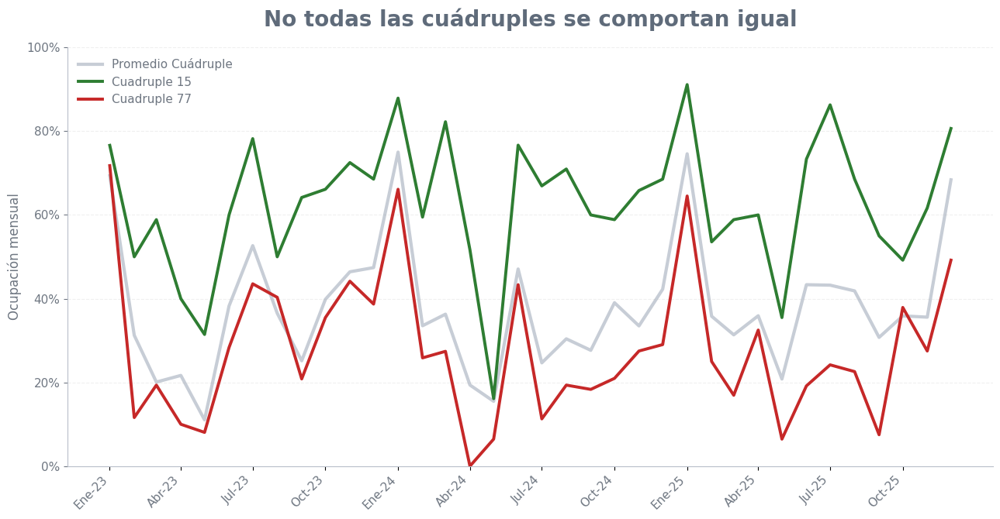

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# =========================================================
# 1. Copiar base
# =========================================================
df_plot = ocupacion_mensual_habitacion.copy()

# Asegurar tipos
df_plot["anio"] = pd.to_numeric(df_plot["anio"], errors="coerce")
df_plot["mes"] = pd.to_numeric(df_plot["mes"], errors="coerce")
df_plot["ocupacion_mensual"] = pd.to_numeric(df_plot["ocupacion_mensual"], errors="coerce")

# Crear fecha mensual
df_plot["fecha_mes"] = pd.to_datetime(
    dict(year=df_plot["anio"], month=df_plot["mes"], day=1),
    errors="coerce"
)

# Filtrar periodo
fecha_inicio = pd.Timestamp("2023-01-01")
fecha_fin = pd.Timestamp("2025-12-01")

df_plot = df_plot[
    (df_plot["fecha_mes"] >= fecha_inicio) &
    (df_plot["fecha_mes"] <= fecha_fin)
].copy()

# =========================================================
# 2. Serie categoría Cuádruple (promedio mensual)
# =========================================================
serie_cuadruple = (
    df_plot[df_plot["nombre_categoria"] == "Cuádruple"]
    .groupby("fecha_mes", as_index=False)["ocupacion_mensual"]
    .mean()
    .rename(columns={"ocupacion_mensual": "ocupacion_cuadruple_promedio"})
)

# =========================================================
# 3. Serie Cuadruple 15
# =========================================================
serie_cuadruple_15 = (
    df_plot[df_plot["nombre_cuarto"] == "Cuadruple 15"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_cuadruple_15"})
)

# =========================================================
# 4. Serie Cuadruple 77
# =========================================================
serie_cuadruple_77 = (
    df_plot[df_plot["nombre_cuarto"] == "Cuadruple 77"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_cuadruple_77"})
)

# =========================================================
# 5. Unir series sobre calendario mensual completo
# =========================================================
calendario = pd.DataFrame({
    "fecha_mes": pd.date_range(start=fecha_inicio, end=fecha_fin, freq="MS")
})

plot_df = (
    calendario
    .merge(serie_cuadruple, on="fecha_mes", how="left")
    .merge(serie_cuadruple_15, on="fecha_mes", how="left")
    .merge(serie_cuadruple_77, on="fecha_mes", how="left")
)

# Rellenar vacíos con 0
plot_df["ocupacion_cuadruple_promedio"] = plot_df["ocupacion_cuadruple_promedio"].fillna(0)
plot_df["ocupacion_cuadruple_15"] = plot_df["ocupacion_cuadruple_15"].fillna(0)
plot_df["ocupacion_cuadruple_77"] = plot_df["ocupacion_cuadruple_77"].fillna(0)

# =========================================================
# 6. Colores
# =========================================================
verde = "#2E7D32"
rojo = "#C62828"
gris_claro = "#C7CDD6"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(13, 6.8))

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_cuadruple_promedio"],
    color=gris_claro,
    linewidth=3,
    label="Promedio Cuádruple",
    zorder=1
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_cuadruple_15"],
    color=verde,
    linewidth=2.8,
    label="Cuadruple 15",
    zorder=3
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_cuadruple_77"],
    color=rojo,
    linewidth=2.8,
    label="Cuadruple 77",
    zorder=3
)

# =========================================================
# 8. Estilo del eje X
# =========================================================
ticks = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="3MS")
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}
labels = [f"{meses_es[d.month]}-{str(d.year)[-2:]}" for d in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=11, color=gris_texto)

# =========================================================
# 9. Estilo del eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# =========================================================
# 10. Título y leyenda
# =========================================================
ax.set_title(
    "No todas las cuádruples se comportan igual",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

legend = ax.legend(
    loc="upper left",
    frameon=False,
    fontsize=11
)
for text in legend.get_texts():
    text.set_color(gris_texto)

# =========================================================
# 11. Estética final
# =========================================================
ax.set_xlabel("")
ax.set_ylabel("Ocupación mensual", fontsize=12, color=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.20)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

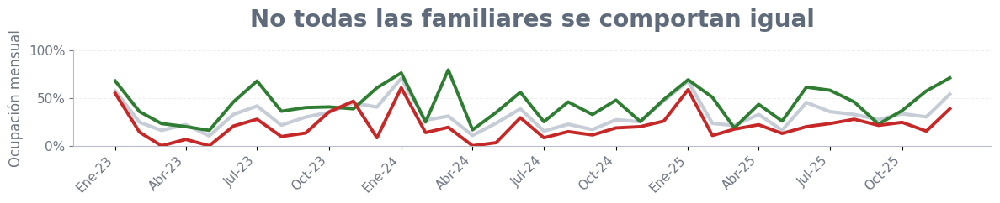

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# =========================================================
# 1. Copiar base
# =========================================================
df_plot = ocupacion_mensual_habitacion.copy()

# Asegurar tipos
df_plot["anio"] = pd.to_numeric(df_plot["anio"], errors="coerce")
df_plot["mes"] = pd.to_numeric(df_plot["mes"], errors="coerce")
df_plot["ocupacion_mensual"] = pd.to_numeric(df_plot["ocupacion_mensual"], errors="coerce")

# Crear fecha mensual
df_plot["fecha_mes"] = pd.to_datetime(
    dict(year=df_plot["anio"], month=df_plot["mes"], day=1),
    errors="coerce"
)

# Filtrar periodo
fecha_inicio = pd.Timestamp("2023-01-01")
fecha_fin = pd.Timestamp("2025-12-01")

df_plot = df_plot[
    (df_plot["fecha_mes"] >= fecha_inicio) &
    (df_plot["fecha_mes"] <= fecha_fin)
].copy()

# =========================================================
# 2. Serie categoría Familiar (promedio mensual)
# =========================================================
serie_familiar = (
    df_plot[df_plot["nombre_categoria"] == "Familiar"]
    .groupby("fecha_mes", as_index=False)["ocupacion_mensual"]
    .mean()
    .rename(columns={"ocupacion_mensual": "ocupacion_familiar_promedio"})
)

# =========================================================
# 3. Serie Familiar 16
# =========================================================
serie_familiar_16 = (
    df_plot[df_plot["nombre_cuarto"] == "Familiar 16"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_familiar_16"})
)

# =========================================================
# 4. Serie Familiar 86
# =========================================================
serie_familiar_86 = (
    df_plot[df_plot["nombre_cuarto"] == "Familiar 86"]
    [["fecha_mes", "ocupacion_mensual"]]
    .drop_duplicates()
    .rename(columns={"ocupacion_mensual": "ocupacion_familiar_86"})
)

# =========================================================
# 5. Unir series sobre calendario mensual completo
# =========================================================
calendario = pd.DataFrame({
    "fecha_mes": pd.date_range(start=fecha_inicio, end=fecha_fin, freq="MS")
})

plot_df = (
    calendario
    .merge(serie_familiar, on="fecha_mes", how="left")
    .merge(serie_familiar_16, on="fecha_mes", how="left")
    .merge(serie_familiar_86, on="fecha_mes", how="left")
)

# Rellenar vacíos con 0
plot_df["ocupacion_familiar_promedio"] = plot_df["ocupacion_familiar_promedio"].fillna(0)
plot_df["ocupacion_familiar_16"] = plot_df["ocupacion_familiar_16"].fillna(0)
plot_df["ocupacion_familiar_86"] = plot_df["ocupacion_familiar_86"].fillna(0)

# =========================================================
# 6. Colores
# =========================================================
verde = "#2E7D32"
rojo = "#C62828"
gris_claro = "#C7CDD6"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 7. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(11.98, 2.52))

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_familiar_promedio"],
    color=gris_claro,
    linewidth=3,
    label="Promedio Familiar",
    zorder=1
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_familiar_16"],
    color=verde,
    linewidth=2.8,
    label="Familiar 16",
    zorder=3
)

ax.plot(
    plot_df["fecha_mes"],
    plot_df["ocupacion_familiar_86"],
    color=rojo,
    linewidth=2.8,
    label="Familiar 86",
    zorder=3
)

# =========================================================
# 8. Estilo del eje X
# =========================================================
ticks = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="3MS")
meses_es = {
    1: "Ene", 2: "Feb", 3: "Mar", 4: "Abr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Ago", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dic"
}
labels = [f"{meses_es[d.month]}-{str(d.year)[-2:]}" for d in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=11, color=gris_texto)

# =========================================================
# 9. Estilo del eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# =========================================================
# 10. Título y leyenda
# =========================================================
ax.set_title(
    "No todas las familiares se comportan igual",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

#legend = ax.legend(
#    loc="upper left",
#    frameon=False,
#    fontsize=11
#)
#for text in legend.get_texts():
#    text.set_color(gris_texto)

# =========================================================
# 11. Estética final
# =========================================================
ax.set_xlabel("")
ax.set_ylabel("Ocupación mensual", fontsize=12, color=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.20)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

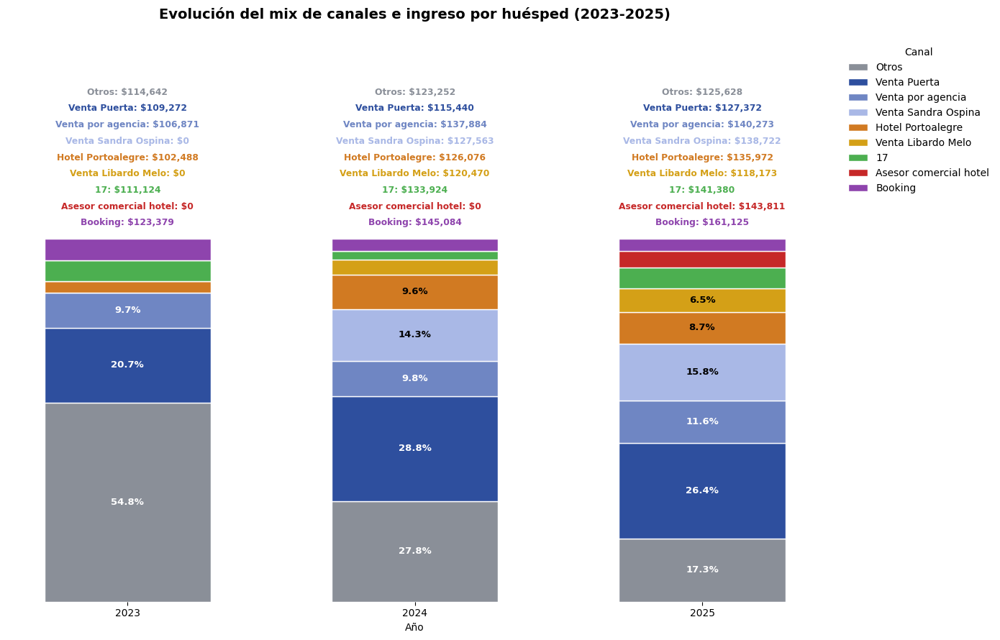

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1) Preparar base
# =========================================================
df_canales = df_reservas_dep.copy()

df_canales["fecha_noche"] = pd.to_datetime(df_canales["fecha_noche"], errors="coerce")
df_canales["ingreso_distribuido"] = pd.to_numeric(df_canales["ingreso_distribuido"], errors="coerce")
df_canales["numero_personas"] = pd.to_numeric(df_canales["numero_personas"], errors="coerce")

df_canales["año"] = df_canales["fecha_noche"].dt.year
df_canales = df_canales[df_canales["año"].isin([2023, 2024, 2025])].copy()

# =========================================================
# 2) Clasificar canales
# =========================================================
otros = [
    "Venta Catalina Restrepo",
    "Venta Directa x Vendedor",
    "Redes sociales",
    "Noche Propietarios",
    "WhatsApp pag web",
    "18",
    "26",
    "Price Travel",
    "Convenio con persona natural",
    "Correo Reservas",
    "Venta pag web",
    "Venta Edward Quintero",
    "Convenio con empresa",
    None
]

def clasificar_agencia(x):
    x_str = str(x).strip()
    x_low = x_str.lower()

    # unir Booking Engine + Booking.com
    if x_low in ["booking engine", "booking.com"]:
        return "Booking"

    if pd.isna(x) or x_str in otros or x_low in ["nan", "none"]:
        return "Otros"

    return x_str

df_canales["agencia_clean"] = df_canales["agencia"].apply(clasificar_agencia)

# =========================================================
# 3) Definir canales que quiero ver siempre
# =========================================================
canales_fijos = [
    "Otros",
    "Venta Puerta",
    "Venta por agencia",
    "Venta Sandra Ospina",
    "Hotel Portoalegre",
    "Venta Libardo Melo",
    "17",
    "Asesor comercial hotel",
    "Booking"
]

df_canales["canal_final"] = df_canales["agencia_clean"].apply(
    lambda x: x if x in canales_fijos else "Otros"
)

# =========================================================
# 4) Agregar métricas por año y canal
# =========================================================
df_year = (
    df_canales
    .groupby(["año", "canal_final"], as_index=False)
    .agg(
        ingreso_total=("ingreso_distribuido", "sum"),
        personas_total=("numero_personas", "sum")
    )
)

df_year["ingreso_por_huesped"] = np.where(
    df_year["personas_total"] > 0,
    df_year["ingreso_total"] / df_year["personas_total"],
    0
)

df_year["participacion"] = df_year.groupby("año")["ingreso_total"].transform(
    lambda x: x / x.sum() if x.sum() > 0 else 0
)

# =========================================================
# 5) Completar canales faltantes por año
# =========================================================
años = [2023, 2024, 2025]
base_full = pd.MultiIndex.from_product(
    [años, canales_fijos],
    names=["año", "canal_final"]
).to_frame(index=False)

df_year = base_full.merge(
    df_year,
    on=["año", "canal_final"],
    how="left"
).fillna(0)

df_year["participacion"] = df_year.groupby("año")["ingreso_total"].transform(
    lambda x: x / x.sum() if x.sum() > 0 else 0
)

# =========================================================
# 6) Pivot para gráfico
# =========================================================
orden_canales = canales_fijos

pivot_part = df_year.pivot(index="año", columns="canal_final", values="participacion").fillna(0)
pivot_iph = df_year.pivot(index="año", columns="canal_final", values="ingreso_por_huesped").fillna(0)

pivot_part = pivot_part.reindex(columns=orden_canales)
pivot_iph = pivot_iph.reindex(columns=orden_canales)

# =========================================================
# 7) Colores
# =========================================================
color_map = {
    "Otros": "#8A8F98",
    "Venta Puerta": "#2E4F9E",
    "Venta por agencia": "#6F86C3",
    "Venta Sandra Ospina": "#A9B8E6",
    "Hotel Portoalegre": "#D17A22",
    "Venta Libardo Melo": "#D4A017",
    "17": "#4CAF50",
    "Asesor comercial hotel": "#C62828",
    "Booking": "#8E44AD"
}

# =========================================================
# 8) Gráfico: columnas apiladas 100%
# =========================================================
fig, ax = plt.subplots(figsize=(14, 9))

x = np.arange(len(pivot_part.index))
width = 0.58
bottom = np.zeros(len(pivot_part.index))

for canal in orden_canales:
    vals = pivot_part[canal].values

    ax.bar(
        x,
        vals,
        width=width,
        bottom=bottom,
        color=color_map[canal],
        edgecolor="white",
        label=canal
    )

    for i, v in enumerate(vals):
        if v >= 0.06:
            ax.text(
                x[i],
                bottom[i] + v / 2,
                f"{v:.1%}",
                ha="center",
                va="center",
                fontsize=9.5,
                fontweight="bold",
                color="white" if canal in ["Venta Puerta", "Venta por agencia", "Otros", "Asesor comercial hotel", "Booking"] else "black"
            )

    bottom += vals

# =========================================================
# 9) Etiquetas superiores: mismo orden y color por categoría
# =========================================================
line_spacing = 0.045   # separación vertical entre líneas
start_y = 1.03         # punto de inicio del primer texto

for i, año in enumerate(pivot_part.index):
    filas = df_year[df_year["año"] == año].set_index("canal_final")

    for j, canal in enumerate(orden_canales):
        valor = filas.loc[canal, "ingreso_por_huesped"]

        ax.text(
            x[i],
            start_y + (len(orden_canales)-1-j) * line_spacing,
            f"{canal}: ${valor:,.0f}",
            ha="center",
            va="bottom",
            fontsize=8.8,
            color=color_map[canal],
            fontweight="bold"
        )

# =========================================================
# 10) Formato
# =========================================================
ax.set_xticks(x)
ax.set_xticklabels(pivot_part.index)

ax.set_ylim(0, 1.55)

# Eliminar eje Y
ax.set_yticks([])
ax.set_ylabel("")

# Eliminar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.set_title(
    "Evolución del mix de canales e ingreso por huésped (2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Año")

ax.legend(
    frameon=False,
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    title="Canal"
)

ax.grid(False)

plt.tight_layout()
plt.show()

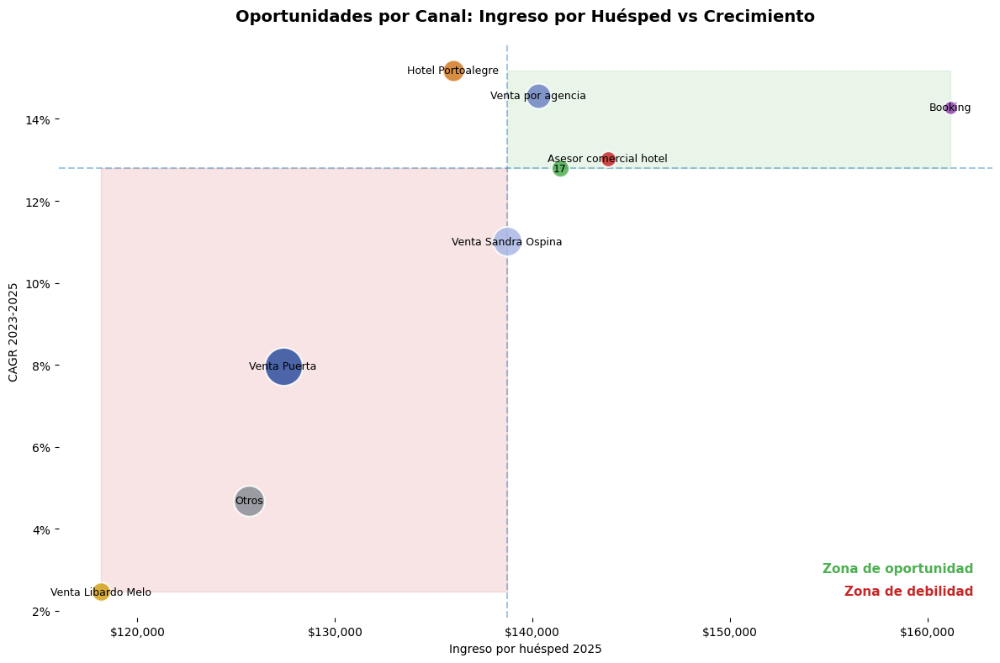

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar datos
# =========================================================
df_scatter = df_year.copy()

pivot_iph = df_scatter.pivot(
    index="canal_final",
    columns="año",
    values="ingreso_por_huesped"
).reset_index()

pivot_part = df_scatter[df_scatter["año"] == 2025][
    ["canal_final", "participacion"]
]

df_plot = pivot_iph.merge(
    pivot_part,
    on="canal_final",
    how="left"
)

# =========================================================
# 2. Calcular ingreso por huésped total del hotel en 2023
# =========================================================
iph_total_2023 = (
    df_scatter[df_scatter["año"] == 2023]["ingreso_total"].sum() /
    df_scatter[df_scatter["año"] == 2023]["personas_total"].sum()
)

# =========================================================
# 3. Base ajustada 2023 para CAGR
#    Si 2023 es 0, usar ingreso por huésped total 2023
# =========================================================
df_plot["base_2023"] = np.where(
    df_plot[2023] > 0,
    df_plot[2023],
    iph_total_2023
)

# CAGR 2023-2025
df_plot["CAGR"] = (df_plot[2025] / df_plot["base_2023"]) ** (1/2) - 1

# limpiar
df_plot = df_plot.replace([np.inf, -np.inf], np.nan).dropna(subset=["CAGR", 2025, "participacion"])

# =========================================================
# 4. Colores
# =========================================================
color_map = {
    "Otros": "#8A8F98",
    "Venta Puerta": "#2E4F9E",
    "Venta por agencia": "#6F86C3",
    "Venta Sandra Ospina": "#A9B8E6",
    "Hotel Portoalegre": "#D17A22",
    "Venta Libardo Melo": "#D4A017",
    "17": "#4CAF50",
    "Asesor comercial hotel": "#C62828",
    "Booking": "#8E44AD"
}

# =========================================================
# 5. Crear gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(12, 8))

x_med = df_plot[2025].median()
y_med = df_plot["CAGR"].median()

x_min = df_plot[2025].min()
x_max = df_plot[2025].max()
y_min = df_plot["CAGR"].min()
y_max = df_plot["CAGR"].max()

# =========================================================
# 6. Zonas sombreadas
# =========================================================
ax.add_patch(
    patches.Rectangle(
        (x_med, y_med),
        x_max - x_med,
        y_max - y_med,
        alpha=0.12,
        color="#4CAF50"
    )
)

ax.add_patch(
    patches.Rectangle(
        (x_min, y_min),
        x_med - x_min,
        y_med - y_min,
        alpha=0.12,
        color="#C62828"
    )
)

# =========================================================
# 7. Scatter
# =========================================================
for _, row in df_plot.iterrows():
    ax.scatter(
        row[2025],
        row["CAGR"],
        s=row["participacion"] * 4000,
        color=color_map.get(row["canal_final"], "#999999"),
        alpha=0.85,
        edgecolors="white",
        linewidth=1.5,
        zorder=3
    )

    ax.text(
        row[2025],
        row["CAGR"],
        row["canal_final"],
        fontsize=9,
        ha="center",
        va="center",
        zorder=4
    )

# =========================================================
# 8. Líneas medianas
# =========================================================
ax.axhline(y_med, linestyle="--", alpha=0.4)
ax.axvline(x_med, linestyle="--", alpha=0.4)

# =========================================================
# 9. Formato ejes
# =========================================================
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.0%}"))

# =========================================================
# 10. Leyenda abajo derecha
# =========================================================
ax.text(
    0.98,
    0.08,
    "Zona de oportunidad",
    transform=ax.transAxes,
    fontsize=11,
    color="#4CAF50",
    fontweight="bold",
    ha="right"
)

ax.text(
    0.98,
    0.04,
    "Zona de debilidad",
    transform=ax.transAxes,
    fontsize=11,
    color="#C62828",
    fontweight="bold",
    ha="right"
)

# =========================================================
# 11. Título y estilo
# =========================================================
ax.set_title(
    "Oportunidades por Canal: Ingreso por Huésped vs Crecimiento",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_xlabel("Ingreso por huésped 2025")
ax.set_ylabel("CAGR 2023-2025")

for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.grid(False)

plt.tight_layout()
plt.show()

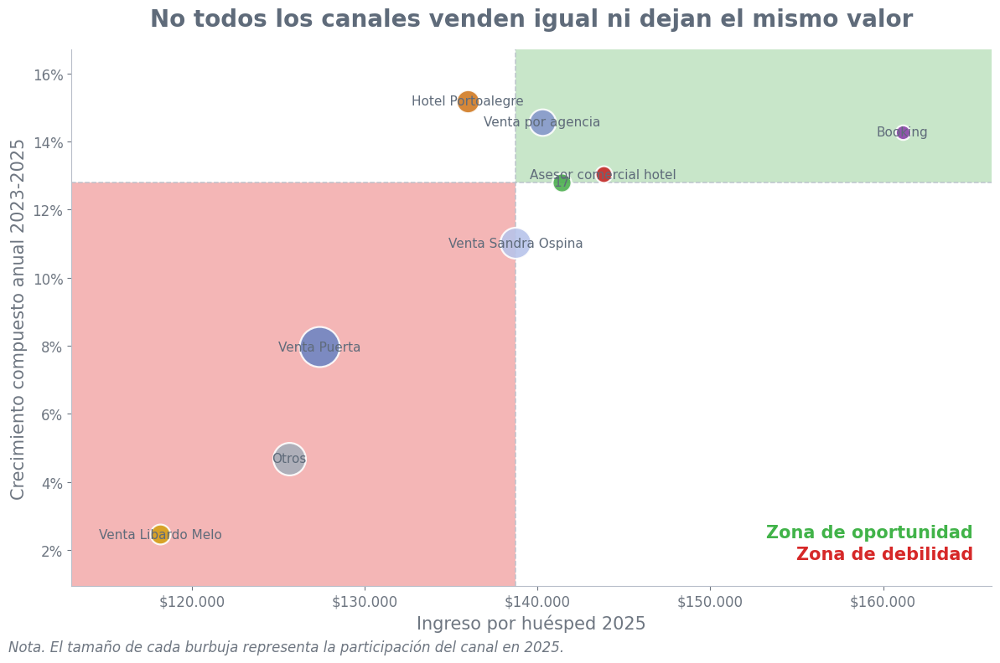

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar datos
# =========================================================
df_scatter = df_year.copy()

pivot_iph = df_scatter.pivot(
    index="canal_final",
    columns="año",
    values="ingreso_por_huesped"
).reset_index()

pivot_part = df_scatter[df_scatter["año"] == 2025][
    ["canal_final", "participacion"]
]

df_plot = pivot_iph.merge(
    pivot_part,
    on="canal_final",
    how="left"
)

# =========================================================
# 2. Calcular ingreso por huésped total del hotel en 2023
# =========================================================
iph_total_2023 = (
    df_scatter[df_scatter["año"] == 2023]["ingreso_total"].sum() /
    df_scatter[df_scatter["año"] == 2023]["personas_total"].sum()
)

# =========================================================
# 3. Base ajustada 2023 para CAGR
# =========================================================
df_plot["base_2023"] = np.where(
    df_plot[2023] > 0,
    df_plot[2023],
    iph_total_2023
)

df_plot["CAGR"] = (df_plot[2025] / df_plot["base_2023"]) ** (1 / 2) - 1

df_plot = (
    df_plot
    .replace([np.inf, -np.inf], np.nan)
    .dropna(subset=["CAGR", 2025, "participacion"])
    .copy()
)

# =========================================================
# 4. Colores
# =========================================================
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# tonos pastel transparentes para cuadrantes
verde_pastel = "#CFE8CF"
rojo_pastel = "#F3D6D6"

color_map = {
    "Otros": "#A7AFBA",
    "Venta Puerta": "#6F86C3",          # <-- azul más claro
    "Venta por agencia": "#8799CC",
    "Venta Sandra Ospina": "#B7C4EA",
    "Hotel Portoalegre": "#D17A22",
    "Venta Libardo Melo": "#D4A017",
    "17": "#4CAF50",
    "Asesor comercial hotel": "#C62828",
    "Booking": "#8E44AD"
}

# =========================================================
# 5. Calcular medianas y rangos
# =========================================================
x_med = df_plot[2025].median()
y_med = df_plot["CAGR"].median()

x_min = df_plot[2025].min()
x_max = df_plot[2025].max()
y_min = df_plot["CAGR"].min()
y_max = df_plot["CAGR"].max()

# márgenes
x_pad = (x_max - x_min) * 0.12
y_pad = (y_max - y_min) * 0.12

# =========================================================
# 6. Crear gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(12, 8))

# =========================================================
# 7. Zonas sombreadas
# =========================================================

# Fondo blanco del área del gráfico
ax.set_facecolor("white")

# Colores más evidentes
verde_oportunidad = "#C8E6C9"   # verde pastel claro, pero claramente verde
rojo_debilidad = "#F4B6B6"      # rojo pastel claro

# Zona de debilidad: abajo izquierda
ax.add_patch(
    patches.Rectangle(
        (x_min - x_pad, y_min - y_pad),
        x_med - (x_min - x_pad),
        y_med - (y_min - y_pad),
        facecolor=rojo_debilidad,
        edgecolor="none",
        alpha=1.0,
        zorder=0
    )
)

# Zona de oportunidad: arriba derecha
ax.add_patch(
    patches.Rectangle(
        (x_med, y_med),
        (x_max + x_pad) - x_med,
        (y_max + y_pad) - y_med,
        facecolor=verde_oportunidad,
        edgecolor="none",
        alpha=1.0,
        zorder=0
    )
)

# =========================================================
# 8. Scatter
# =========================================================
for _, row in df_plot.iterrows():
    ax.scatter(
        row[2025],
        row["CAGR"],
        s=row["participacion"] * 4500,
        color=color_map.get(row["canal_final"], "#999999"),
        alpha=0.90,
        edgecolors="white",
        linewidth=1.6,
        zorder=3
    )

    ax.text(
        row[2025],
        row["CAGR"],
        row["canal_final"],
        fontsize=11,
        color=gris_titulo,
        ha="center",
        va="center",
        zorder=4
    )

# =========================================================
# 9. Líneas medianas
# =========================================================
ax.axhline(y_med, linestyle="--", linewidth=1.1, color=gris_eje, alpha=0.9, zorder=1)
ax.axvline(x_med, linestyle="--", linewidth=1.1, color=gris_eje, alpha=0.9, zorder=1)

# =========================================================
# 10. Formato de ejes
# =========================================================
def formato_cop(x, pos):
    return f"${x:,.0f}".replace(",", ".")

def formato_pct(y, pos):
    return f"{y:.0%}"

ax.xaxis.set_major_formatter(FuncFormatter(formato_cop))
ax.yaxis.set_major_formatter(FuncFormatter(formato_pct))

# =========================================================
# 11. Título y etiquetas
# =========================================================
ax.set_title(
    "No todos los canales venden igual ni dejan el mismo valor",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel(
    "Ingreso por huésped 2025",
    fontsize=15,
    color=gris_texto
)

ax.set_ylabel(
    "Crecimiento compuesto anual 2023-2025",
    fontsize=15,
    color=gris_texto
)

# =========================================================
# 12. Estilo general
# =========================================================
ax.tick_params(axis="x", labelsize=12, colors=gris_texto)
ax.tick_params(axis="y", labelsize=12, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

ax.set_xlim(x_min - x_pad, x_max + x_pad)
ax.set_ylim(y_min - y_pad, y_max + y_pad)

# =========================================================
# 13. Etiquetas de cuadrantes
# =========================================================
ax.text(
    0.98,
    0.09,
    "Zona de oportunidad",
    transform=ax.transAxes,
    fontsize=15,
    color="#41B349",
    fontweight="bold",
    ha="right"
)

ax.text(
    0.98,
    0.05,
    "Zona de debilidad",
    transform=ax.transAxes,
    fontsize=15,
    color="#D62828",
    fontweight="bold",
    ha="right"
)

# =========================================================
# 14. Nota al pie
# =========================================================
fig.text(
    0.01,
    0.015,
    "Nota. El tamaño de cada burbuja representa la participación del canal en 2025.",
    ha="left",
    va="bottom",
    fontsize=12,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

In [ ]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans

In [ ]:
# =========================================================
# 1. Preparar base
# =========================================================
df_cluster = df_reservas_dep.copy()

df_cluster["ingreso_por_huesped"] = np.where(
    df_cluster["numero_personas"] > 0,
    df_cluster["ingreso_distribuido"] / df_cluster["numero_personas"],
    np.nan
)

df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25151 entries, 0 to 25150
Data columns (total 38 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id_reserva                              25151 non-null  object        
 1   fecha_ingreso                           25151 non-null  datetime64[ns]
 2   fecha_salida                            25151 non-null  datetime64[ns]
 3   numero_personas                         25151 non-null  int64         
 4   nombre_cuarto                           25151 non-null  object        
 5   id_grupo                                11875 non-null  object        
 6   agencia                                 25151 non-null  object        
 7   nombre                                  25151 non-null  object        
 8   primer_apellido                         25151 non-null  object        
 9   segundo_apellido                        25151 non-

In [ ]:
# =========================================================
# 1.1 Calcular atípicos de ingreso_distribuido (1.5 IQR)
# =========================================================
q1 = df_cluster["ingreso_distribuido"].quantile(0.25)
q3 = df_cluster["ingreso_distribuido"].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

print(f"Límite inferior: {lower_bound:,.2f}")
print(f"Límite superior: {upper_bound:,.2f}")

Límite inferior: -99,266.67
Límite superior: 745,000.00


In [ ]:
df_cluster = df_cluster[
    (df_cluster["ingreso_distribuido"] >= lower_bound) &
    (df_cluster["ingreso_distribuido"] <= upper_bound)
].copy()

print(f"Observaciones restantes: {len(df_cluster):,}")

Observaciones restantes: 24,062


In [ ]:
# =========================================================
# 2. Crear variables % medios de pago
# =========================================================
medios_pago = [
    "pendiente_distribuido",
    "efectivo_distribuido",
    "tarjeta_debito_distribuido",
    "tarjeta_credito_distribuido",
    "transferencia_bancaria_distribuido",
    "wompi_distribuido",
    "nequi_distribuido",
    "corresponsal_bancario_distribuido",
    "pse_distribuido",
    "boton_pagos_bancolombia_distribuido",
    "retefuente_distribuido",
    "cta_por_cobrar_propietario_distribuido",
    "cta_por_cobrar_compania_distribuido",
    "abonos_distribuido"
]

In [ ]:
for col in medios_pago:
    df_cluster[f"pct_{col}"] = np.where(
        df_cluster["ingreso_distribuido"] > 0,
        df_cluster[col] / df_cluster["ingreso_distribuido"],
        0
    )

In [ ]:
df_cluster["pct_consumos_extras"] = np.where(
    df_cluster["ingreso_distribuido"] > 0,
    df_cluster["consumos_y_extras_distribuido"] / df_cluster["ingreso_distribuido"],
    0
)

pd.set_option('display.max_columns', None)

df_cluster.head()

,id_reserva,fecha_ingreso,fecha_salida,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,email,nombre_categoria,dias_estadia,fecha_noche,capacidad,Reserva_pago,Tipo doc,Identificacion,Nacionalidad,Año,ingreso_distribuido,alojamiento_distribuido,consumos_y_extras_distribuido,pendiente_distribuido,efectivo_distribuido,tarjeta_debito_distribuido,tarjeta_credito_distribuido,transferencia_bancaria_distribuido,wompi_distribuido,nequi_distribuido,corresponsal_bancario_distribuido,pse_distribuido,boton_pagos_bancolombia_distribuido,retefuente_distribuido,cta_por_cobrar_propietario_distribuido,cta_por_cobrar_compania_distribuido,abonos_distribuido,ingreso_por_huesped,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras
0,6816119,2023-01-01,2023-01-02,4,Cuadruple 37,None,Venta Directa x Vendedor,Deisy Paola,Ballesteros,Reyes,monimolinasalas@hotmail.com,Cuádruple,1,2023-01-01,4.0,6816119,Cedula de ciudadania,1023925636,Colombia,2023,580000.000000,580000.000000,0.0,0.000000,0.0,348000.0,0.0,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,145000.000000,0.0,0.0,0.6,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,6816120,2023-01-01,2023-01-02,4,Cuadruple 38,None,Venta Directa x Vendedor,Deisy Paola,Ballesteros,Reyes,monimolinasalas@hotmail.com,Cuádruple,1,2023-01-01,4.0,6816120,Cedula de ciudadania,1023925636,Colombia,2023,580000.000000,580000.000000,0.0,0.000000,174000.0,174000.0,0.0,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,145000.000000,0.0,0.3,0.3,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7053733,2023-01-01,2023-01-20,1,Doble 39,None,None,Yenny,Restrepo,,yerestre@gmail.com,Doble,19,2023-01-01,2.0,7053733,Cedula de ciudadania,43909367,Colombia,2023,375789.473684,375789.473684,0.0,375789.473684,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,375789.473684,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6816121,2023-01-01,2023-01-02,2,Doble 87,None,Booking Engine,Maira,Giraldo,Garcia,maiva-benavides.ospina@gmail.com,Doble,1,2023-01-01,2.0,6816121,Cedula de ciudadania,1120376694,Colombia,2023,360000.000000,360000.000000,0.0,0.000000,0.0,0.0,360000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,180000.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,6816132,2023-01-02,2023-01-04,4,Cuadruple 36,None,Venta Puerta,Paula,Hernandez,Porra,andrea0527@gmail.com,Cuádruple,2,2023-01-02,4.0,6816132,Cedula de ciudadania,1018343497,Colombia,2023,722000.000000,722000.000000,0.0,0.000000,0.0,0.0,0.0,722000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,180500.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# =========================================================
# 3. Variables para clustering
# =========================================================
variables_numericas = [
    "numero_personas",
    "dias_estadia",
    "capacidad"
] + [f"pct_{x}" for x in medios_pago] + ["pct_consumos_extras"]

variables_categoricas = [
    "nombre_cuarto",
    "agencia",
    "nombre_categoria",
    "Nacionalidad"
]

print("Variables numéricas:")
print(variables_numericas)

print("\nVariables categóricas:")
print(variables_categoricas)

Variables numéricas:
['numero_personas', 'dias_estadia', 'capacidad', 'pct_pendiente_distribuido', 'pct_efectivo_distribuido', 'pct_tarjeta_debito_distribuido', 'pct_tarjeta_credito_distribuido', 'pct_transferencia_bancaria_distribuido', 'pct_wompi_distribuido', 'pct_nequi_distribuido', 'pct_corresponsal_bancario_distribuido', 'pct_pse_distribuido', 'pct_boton_pagos_bancolombia_distribuido', 'pct_retefuente_distribuido', 'pct_cta_por_cobrar_propietario_distribuido', 'pct_cta_por_cobrar_compania_distribuido', 'pct_abonos_distribuido', 'pct_consumos_extras']

Variables categóricas:
['nombre_cuarto', 'agencia', 'nombre_categoria', 'Nacionalidad']


In [ ]:
# =========================================================
# 4. Limpiar tipos
# =========================================================
for col in variables_numericas:
    df_cluster[col] = pd.to_numeric(df_cluster[col], errors="coerce")

In [ ]:
for col in variables_categoricas:
    df_cluster[col] = df_cluster[col].fillna("Sin dato").astype(str)

In [ ]:
df_cluster = df_cluster.replace([np.inf, -np.inf], np.nan)

df_cluster_model = df_cluster[
    variables_numericas + variables_categoricas + ["ingreso_por_huesped", "id_reserva"]
].dropna(subset=variables_numericas + variables_categoricas).copy()

print(df_cluster_model.shape)
df_cluster_model.head()

(24062, 24)


,numero_personas,dias_estadia,capacidad,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras,nombre_cuarto,agencia,nombre_categoria,Nacionalidad,ingreso_por_huesped,id_reserva
0,4,1,4.0,0.0,0.0,0.6,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 37,Venta Directa x Vendedor,Cuádruple,Colombia,145000.000000,6816119
1,4,1,4.0,0.0,0.3,0.3,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 38,Venta Directa x Vendedor,Cuádruple,Colombia,145000.000000,6816120
2,1,19,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Doble 39,None,Doble,Colombia,375789.473684,7053733
3,2,1,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Doble 87,Booking Engine,Doble,Colombia,180000.000000,6816121
5,4,2,4.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 36,Venta Puerta,Cuádruple,Colombia,180500.000000,6816132


In [ ]:
df_cluster_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24062 entries, 0 to 25150
Data columns (total 24 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   numero_personas                             24062 non-null  int64  
 1   dias_estadia                                24062 non-null  int64  
 2   capacidad                                   24062 non-null  float64
 3   pct_pendiente_distribuido                   24062 non-null  float64
 4   pct_efectivo_distribuido                    24062 non-null  float64
 5   pct_tarjeta_debito_distribuido              24062 non-null  float64
 6   pct_tarjeta_credito_distribuido             24062 non-null  float64
 7   pct_transferencia_bancaria_distribuido      24062 non-null  float64
 8   pct_wompi_distribuido                       24062 non-null  float64
 9   pct_nequi_distribuido                       24062 non-null  float64
 10  pct_corresponsa

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_num = pd.DataFrame(
    scaler.fit_transform(df_cluster_model[variables_numericas]),
    columns=variables_numericas,
    index=df_cluster_model.index
)

X_num.head()

,numero_personas,dias_estadia,capacidad,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras
0,1.167151,-0.771343,0.972226,-0.148998,-0.577403,1.238356,-0.400375,-0.029416,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892
1,1.167151,-0.771343,0.972226,-0.148998,0.290401,0.349847,-0.400375,-0.029416,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892
2,-1.417185,5.792523,-0.895907,6.916427,-0.577403,-0.538662,-0.400375,-0.993167,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892
3,-0.555740,-0.771343,-0.895907,-0.148998,-0.577403,-0.538662,3.179467,-0.993167,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892
5,1.167151,-0.406684,0.972226,-0.148998,-0.577403,-0.538662,-0.400375,1.416210,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892


In [ ]:
X_cat = pd.get_dummies(
    df_cluster_model[variables_categoricas],
    drop_first=False,
    dtype=int
)

X_cat.head()

,nombre_cuarto_Apartamento 1,nombre_cuarto_Cuadruple 15,nombre_cuarto_Cuadruple 36,nombre_cuarto_Cuadruple 37,nombre_cuarto_Cuadruple 38,nombre_cuarto_Cuadruple 43,nombre_cuarto_Cuadruple 46,nombre_cuarto_Cuadruple 75,nombre_cuarto_Cuadruple 76,nombre_cuarto_Cuadruple 77,nombre_cuarto_Cuadruple 85,nombre_cuarto_Doble 11,nombre_cuarto_Doble 12,nombre_cuarto_Doble 13,nombre_cuarto_Doble 14,nombre_cuarto_Doble 22,nombre_cuarto_Doble 24,nombre_cuarto_Doble 25,nombre_cuarto_Doble 39,nombre_cuarto_Doble 47,nombre_cuarto_Doble 48,nombre_cuarto_Doble 73,nombre_cuarto_Doble 74,nombre_cuarto_Doble 84,nombre_cuarto_Doble 87,nombre_cuarto_Familiar 16,nombre_cuarto_Familiar 34,nombre_cuarto_Familiar 71,nombre_cuarto_Familiar 72,nombre_cuarto_Familiar 81,nombre_cuarto_Familiar 82,nombre_cuarto_Familiar 86,nombre_cuarto_Pasadia + Almuerzo,nombre_cuarto_Pasadia + Almuerzo + Habitacion,nombre_cuarto_Triple 17,nombre_cuarto_Triple 31,nombre_cuarto_Triple 32,nombre_cuarto_Triple 33,nombre_cuarto_Triple 35,nombre_cuarto_Triple 41,nombre_cuarto_Triple 42,nombre_cuarto_Triple 44,nombre_cuarto_Triple 45,nombre_cuarto_Triple 83,nombre_cuarto_Twin 21,agencia_17,agencia_18,agencia_26,agencia_Asesor comercial hotel,agencia_Booking Engine,agencia_Booking.com,agencia_Convenio con empresa,agencia_Convenio con persona natural,agencia_Correo Reservas,agencia_Hotel Portoalegre,agencia_Noche Propietarios,agencia_None,agencia_Price Travel,agencia_Redes sociales,agencia_Venta Catalina Restrepo,agencia_Venta Directa x Vendedor,agencia_Venta Edward Quintero,agencia_Venta Libardo Melo,agencia_Venta Puerta,agencia_Venta Sandra Ospina,agencia_Venta pag web,agencia_Venta por agencia,agencia_WhatsApp Recepción,agencia_WhatsApp pag web,agencia_nan,nombre_categoria_Apartamento,nombre_categoria_Cuádruple,nombre_categoria_Doble,nombre_categoria_Familiar,nombre_categoria_Junior Suite,nombre_categoria_Pasada día (incluye almuerzo),nombre_categoria_Pasadia con almuerzo + Habitación,nombre_categoria_Pasadía,nombre_categoria_Triple,nombre_categoria_Twin,nombre_categoria_Vista al mar,Nacionalidad_Alemania,Nacionalidad_Brasil,Nacionalidad_Bélgica,Nacionalidad_Canadá,Nacionalidad_Chile,Nacionalidad_Colombia,Nacionalidad_Cuba,Nacionalidad_Dinamarca,Nacionalidad_Ecuador,Nacionalidad_El Salvador,Nacionalidad_España,Nacionalidad_Estados Unidos,Nacionalidad_Filipinas,Nacionalidad_Francia,Nacionalidad_Israel,Nacionalidad_Italia,Nacionalidad_México,Nacionalidad_Per,Nacionalidad_Sin dato,Nacionalidad_Suiza,Nacionalidad_Venezuela
0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
X_cluster = pd.concat([X_num, X_cat], axis=1)

print(X_cluster.shape)
X_cluster.head()

(24062, 120)


,numero_personas,dias_estadia,capacidad,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras,nombre_cuarto_Apartamento 1,nombre_cuarto_Cuadruple 15,nombre_cuarto_Cuadruple 36,nombre_cuarto_Cuadruple 37,nombre_cuarto_Cuadruple 38,nombre_cuarto_Cuadruple 43,nombre_cuarto_Cuadruple 46,nombre_cuarto_Cuadruple 75,nombre_cuarto_Cuadruple 76,nombre_cuarto_Cuadruple 77,nombre_cuarto_Cuadruple 85,nombre_cuarto_Doble 11,nombre_cuarto_Doble 12,nombre_cuarto_Doble 13,nombre_cuarto_Doble 14,nombre_cuarto_Doble 22,nombre_cuarto_Doble 24,nombre_cuarto_Doble 25,nombre_cuarto_Doble 39,nombre_cuarto_Doble 47,nombre_cuarto_Doble 48,nombre_cuarto_Doble 73,nombre_cuarto_Doble 74,nombre_cuarto_Doble 84,nombre_cuarto_Doble 87,nombre_cuarto_Familiar 16,nombre_cuarto_Familiar 34,nombre_cuarto_Familiar 71,nombre_cuarto_Familiar 72,nombre_cuarto_Familiar 81,nombre_cuarto_Familiar 82,nombre_cuarto_Familiar 86,nombre_cuarto_Pasadia + Almuerzo,nombre_cuarto_Pasadia + Almuerzo + Habitacion,nombre_cuarto_Triple 17,nombre_cuarto_Triple 31,nombre_cuarto_Triple 32,nombre_cuarto_Triple 33,nombre_cuarto_Triple 35,nombre_cuarto_Triple 41,nombre_cuarto_Triple 42,nombre_cuarto_Triple 44,nombre_cuarto_Triple 45,nombre_cuarto_Triple 83,nombre_cuarto_Twin 21,agencia_17,agencia_18,agencia_26,agencia_Asesor comercial hotel,agencia_Booking Engine,agencia_Booking.com,agencia_Convenio con empresa,agencia_Convenio con persona natural,agencia_Correo Reservas,agencia_Hotel Portoalegre,agencia_Noche Propietarios,agencia_None,agencia_Price Travel,agencia_Redes sociales,agencia_Venta Catalina Restrepo,agencia_Venta Directa x Vendedor,agencia_Venta Edward Quintero,agencia_Venta Libardo Melo,agencia_Venta Puerta,agencia_Venta Sandra Ospina,agencia_Venta pag web,agencia_Venta por agencia,agencia_WhatsApp Recepción,agencia_WhatsApp pag web,agencia_nan,nombre_categoria_Apartamento,nombre_categoria_Cuádruple,nombre_categoria_Doble,nombre_categoria_Familiar,nombre_categoria_Junior Suite,nombre_categoria_Pasada día (incluye almuerzo),nombre_categoria_Pasadia con almuerzo + Habitación,nombre_categoria_Pasadía,nombre_categoria_Triple,nombre_categoria_Twin,nombre_categoria_Vista al mar,Nacionalidad_Alemania,Nacionalidad_Brasil,Nacionalidad_Bélgica,Nacionalidad_Canadá,Nacionalidad_Chile,Nacionalidad_Colombia,Nacionalidad_Cuba,Nacionalidad_Dinamarca,Nacionalidad_Ecuador,Nacionalidad_El Salvador,Nacionalidad_España,Nacionalidad_Estados Unidos,Nacionalidad_Filipinas,Nacionalidad_Francia,Nacionalidad_Israel,Nacionalidad_Italia,Nacionalidad_México,Nacionalidad_Per,Nacionalidad_Sin dato,Nacionalidad_Suiza,Nacionalidad_Venezuela
0,1.167151,-0.771343,0.972226,-0.148998,-0.577403,1.238356,-0.400375,-0.029416,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.167151,-0.771343,0.972226,-0.148998,0.290401,0.349847,-0.400375,-0.029416,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,-1.417185,5.792523,-0.895907,6.916427,-0.577403,-0.538662,-0.400375,-0.993167,-0.114859,-0.067156,-0.107826,-0.065125,-0.018175,-0.186019,-0.056602,-0.059534,-0.035772,-0.930892,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    n_clusters=3,
    random_state=42,
    n_init=20
)

In [ ]:
kmeans.fit(X_cluster)

KMeans(n_clusters=3, n_init=20, random_state=42)

In [ ]:
df_cluster_model["cluster"] = kmeans.predict(X_cluster)

df_cluster_model[["id_reserva", "cluster"]].head()

,id_reserva,cluster
0,6816119,1
1,6816120,1
2,7053733,0
3,6816121,0
5,6816132,1


In [ ]:
df_cluster = df_cluster.merge(
    df_cluster_model[["id_reserva", "cluster"]],
    on="id_reserva",
    how="left"
)

df_cluster.head()

,id_reserva,fecha_ingreso,fecha_salida,numero_personas,nombre_cuarto,id_grupo,agencia,nombre,primer_apellido,segundo_apellido,email,nombre_categoria,dias_estadia,fecha_noche,capacidad,Reserva_pago,Tipo doc,Identificacion,Nacionalidad,Año,ingreso_distribuido,alojamiento_distribuido,consumos_y_extras_distribuido,pendiente_distribuido,efectivo_distribuido,tarjeta_debito_distribuido,tarjeta_credito_distribuido,transferencia_bancaria_distribuido,wompi_distribuido,nequi_distribuido,corresponsal_bancario_distribuido,pse_distribuido,boton_pagos_bancolombia_distribuido,retefuente_distribuido,cta_por_cobrar_propietario_distribuido,cta_por_cobrar_compania_distribuido,abonos_distribuido,ingreso_por_huesped,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras,cluster
0,6816119,2023-01-01,2023-01-02,4,Cuadruple 37,None,Venta Directa x Vendedor,Deisy Paola,Ballesteros,Reyes,monimolinasalas@hotmail.com,Cuádruple,1,2023-01-01,4.0,6816119,Cedula de ciudadania,1023925636,Colombia,2023,580000.000000,580000.000000,0.0,0.000000,0.0,348000.0,0.0,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,145000.000000,0.0,0.0,0.6,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,6816120,2023-01-01,2023-01-02,4,Cuadruple 38,None,Venta Directa x Vendedor,Deisy Paola,Ballesteros,Reyes,monimolinasalas@hotmail.com,Cuádruple,1,2023-01-01,4.0,6816120,Cedula de ciudadania,1023925636,Colombia,2023,580000.000000,580000.000000,0.0,0.000000,174000.0,174000.0,0.0,232000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,145000.000000,0.0,0.3,0.3,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,7053733,2023-01-01,2023-01-20,1,Doble 39,None,None,Yenny,Restrepo,,yerestre@gmail.com,Doble,19,2023-01-01,2.0,7053733,Cedula de ciudadania,43909367,Colombia,2023,375789.473684,375789.473684,0.0,375789.473684,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,375789.473684,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,7053733,2023-01-01,2023-01-20,1,Doble 39,None,None,Yenny,Restrepo,,yerestre@gmail.com,Doble,19,2023-01-01,2.0,7053733,Cedula de ciudadania,43909367,Colombia,2023,375789.473684,375789.473684,0.0,375789.473684,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,375789.473684,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,7053733,2023-01-01,2023-01-20,1,Doble 39,None,None,Yenny,Restrepo,,yerestre@gmail.com,Doble,19,2023-01-01,2.0,7053733,Cedula de ciudadania,43909367,Colombia,2023,375789.473684,375789.473684,0.0,375789.473684,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,375789.473684,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
df_cluster_model.head()

,numero_personas,dias_estadia,capacidad,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras,nombre_cuarto,agencia,nombre_categoria,Nacionalidad,ingreso_por_huesped,id_reserva,cluster
0,4,1,4.0,0.0,0.0,0.6,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 37,Venta Directa x Vendedor,Cuádruple,Colombia,145000.000000,6816119,1
1,4,1,4.0,0.0,0.3,0.3,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 38,Venta Directa x Vendedor,Cuádruple,Colombia,145000.000000,6816120,1
2,1,19,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Doble 39,None,Doble,Colombia,375789.473684,7053733,0
3,2,1,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Doble 87,Booking Engine,Doble,Colombia,180000.000000,6816121,0
5,4,2,4.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cuadruple 36,Venta Puerta,Cuádruple,Colombia,180500.000000,6816132,1


In [ ]:
df_cluster_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24062 entries, 0 to 25150
Data columns (total 25 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   numero_personas                             24062 non-null  int64  
 1   dias_estadia                                24062 non-null  int64  
 2   capacidad                                   24062 non-null  float64
 3   pct_pendiente_distribuido                   24062 non-null  float64
 4   pct_efectivo_distribuido                    24062 non-null  float64
 5   pct_tarjeta_debito_distribuido              24062 non-null  float64
 6   pct_tarjeta_credito_distribuido             24062 non-null  float64
 7   pct_transferencia_bancaria_distribuido      24062 non-null  float64
 8   pct_wompi_distribuido                       24062 non-null  float64
 9   pct_nequi_distribuido                       24062 non-null  float64
 10  pct_corresponsa

In [ ]:
# seleccionar variables numéricas
vars_numericas_cluster = df_cluster_model.select_dtypes(include="number").columns.tolist()

# remover cluster si aparece
vars_numericas_cluster = [v for v in vars_numericas_cluster if v != "cluster"]

# construir resumen
cluster_summary = (
    df_cluster_model
    .groupby("cluster")[vars_numericas_cluster]
    .mean()
    .assign(reservas=df_cluster_model.groupby("cluster")["id_reserva"].count())
    .sort_values("ingreso_por_huesped", ascending=False)
)

cluster_summary.round(2)

,numero_personas,dias_estadia,capacidad,pct_pendiente_distribuido,pct_efectivo_distribuido,pct_tarjeta_debito_distribuido,pct_tarjeta_credito_distribuido,pct_transferencia_bancaria_distribuido,pct_wompi_distribuido,pct_nequi_distribuido,pct_corresponsal_bancario_distribuido,pct_pse_distribuido,pct_boton_pagos_bancolombia_distribuido,pct_retefuente_distribuido,pct_cta_por_cobrar_propietario_distribuido,pct_cta_por_cobrar_compania_distribuido,pct_abonos_distribuido,pct_consumos_extras,ingreso_por_huesped,reservas
cluster,,,,,,,,,,,,,,,,,,,,
2,2.06,3.52,2.44,0.00,0.03,0.01,0.01,0.94,0.00,0.0,0.00,0.0,0.0,0.01,0.0,0.00,0.0,0.15,141135.26,6265
0,2.08,3.09,2.40,0.03,0.28,0.27,0.17,0.14,0.01,0.0,0.01,0.0,0.0,0.00,0.0,0.01,0.0,0.08,124751.05,11185
1,4.15,2.79,4.40,0.03,0.22,0.19,0.11,0.37,0.01,0.0,0.02,0.0,0.0,0.00,0.0,0.00,0.0,0.11,104289.72,6612


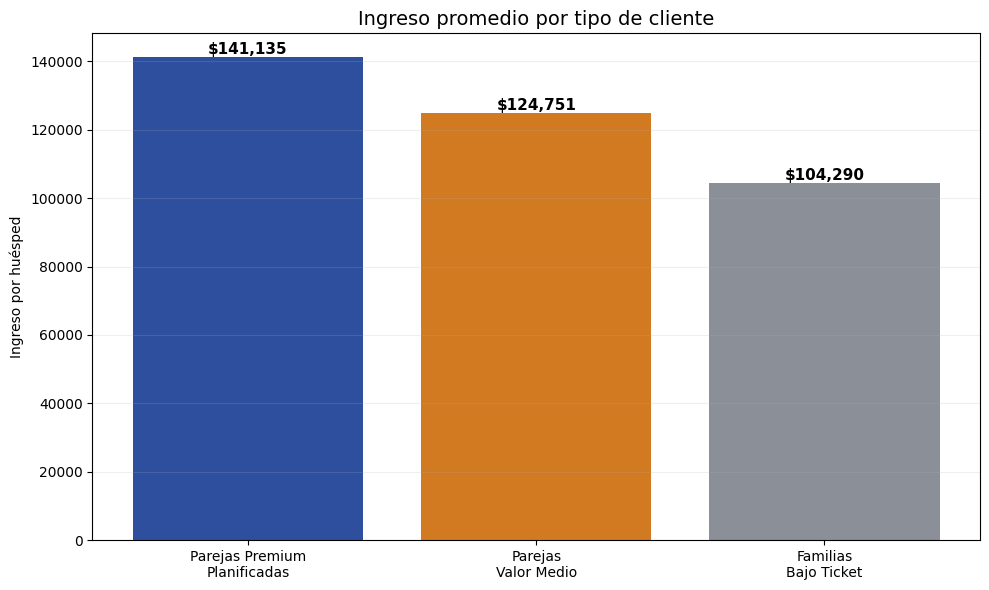

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# =========================================================
# 1. Definir nombres de segmentos
# =========================================================
segmentos = {
    2: "Parejas Premium\nPlanificadas",
    0: "Parejas\nValor Medio",
    1: "Familias\nBajo Ticket"
}

df_cluster_model["segmento"] = df_cluster_model["cluster"].map(segmentos)

# =========================================================
# 2. Calcular ingreso promedio por segmento
# =========================================================
df_bar = (
    df_cluster_model
    .groupby("segmento")["ingreso_por_huesped"]
    .mean()
    .sort_values(ascending=False)
)

# =========================================================
# 3. Colores
# =========================================================
colors = [
    "#2E4F9E",  # azul
    "#D17A22",  # naranja
    "#8A8F98"   # gris
]

# =========================================================
# 4. Gráfico
# =========================================================
plt.figure(figsize=(10,6))

bars = plt.bar(
    df_bar.index,
    df_bar.values,
    color=colors
)

# etiquetas de valores
for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        y + 1000,
        f"${y:,.0f}",
        ha="center",
        fontsize=11,
        fontweight="bold"
    )

plt.title("Ingreso promedio por tipo de cliente", fontsize=14)
plt.ylabel("Ingreso por huésped")
plt.grid(axis="y", alpha=0.2)

plt.tight_layout()
plt.show()

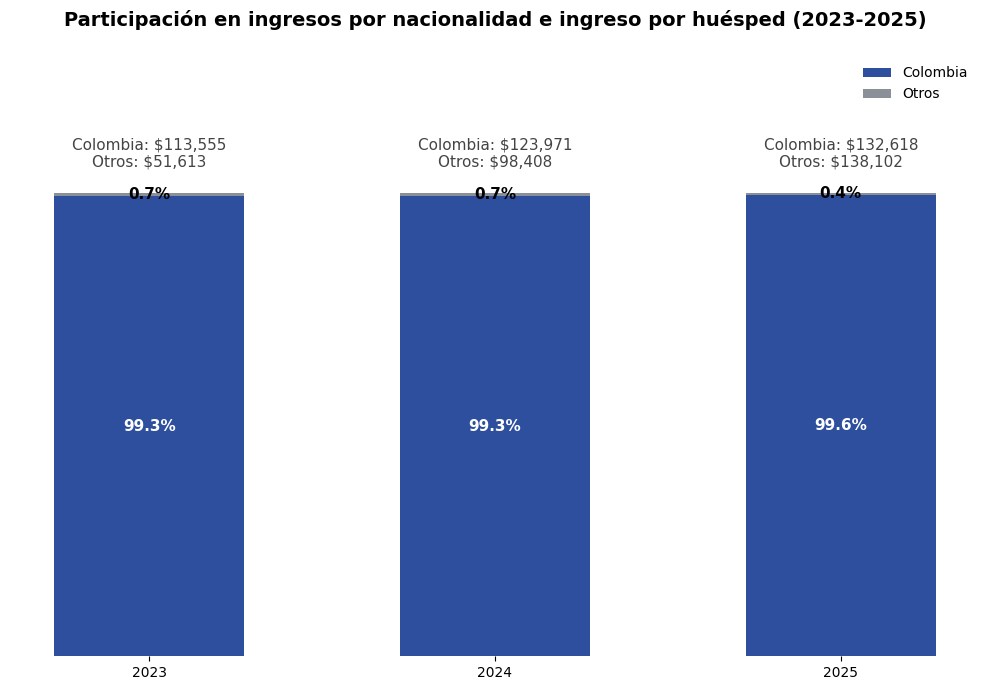

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1) Preparar base
# =========================================================
df_nac = df_reservas_dep.copy()

df_nac["fecha_noche"] = pd.to_datetime(df_nac["fecha_noche"], errors="coerce")
df_nac["ingreso_distribuido"] = pd.to_numeric(df_nac["ingreso_distribuido"], errors="coerce")
df_nac["numero_personas"] = pd.to_numeric(df_nac["numero_personas"], errors="coerce")

df_nac["año"] = df_nac["fecha_noche"].dt.year
df_nac = df_nac[df_nac["año"].isin([2023, 2024, 2025])].copy()

# =========================================================
# 2) Clasificación
# =========================================================
def clasificar_nacionalidad(x):
    if pd.isna(x):
        return "Otros"

    x_str = str(x).strip().lower()

    if x_str in ["colombia", "colombiano", "colombiana"]:
        return "Colombia"
    return "Otros"

df_nac["grupo_nacionalidad"] = df_nac["Nacionalidad"].apply(clasificar_nacionalidad)

# =========================================================
# 3) Métricas
# =========================================================
df_group = (
    df_nac
    .groupby(["año", "grupo_nacionalidad"], as_index=False)
    .agg(
        ingreso_total=("ingreso_distribuido", "sum"),
        personas_total=("numero_personas", "sum")
    )
)

df_group["ingreso_por_huesped"] = df_group["ingreso_total"] / df_group["personas_total"]
df_group["participacion"] = df_group.groupby("año")["ingreso_total"].transform(lambda x: x / x.sum())

# =========================================================
# 4) Pivot
# =========================================================
participacion = df_group.pivot(index="año", columns="grupo_nacionalidad", values="participacion").fillna(0)
ingreso_huesped = df_group.pivot(index="año", columns="grupo_nacionalidad", values="ingreso_por_huesped").fillna(0)

participacion = participacion[["Colombia", "Otros"]]
ingreso_huesped = ingreso_huesped[["Colombia", "Otros"]]

# =========================================================
# 5) Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(10, 7))

x = np.arange(len(participacion.index))
width = 0.55

color_colombia = "#2E4F9E"
color_otros = "#8A8F98"

bars1 = ax.bar(x, participacion["Colombia"], width, color=color_colombia, label="Colombia")
bars2 = ax.bar(x, participacion["Otros"], width, bottom=participacion["Colombia"], color=color_otros, label="Otros")

# =========================================================
# 6) Etiquetas internas
# =========================================================
for i, año in enumerate(participacion.index):
    val_col = participacion.loc[año, "Colombia"]
    val_otr = participacion.loc[año, "Otros"]

    if val_col > 0:
        ax.text(
            x[i], val_col / 2, f"{val_col:.1%}",
            ha="center", va="center",
            fontsize=11, fontweight="bold", color="white"
        )

    if val_otr > 0:
        ax.text(
            x[i], val_col + val_otr / 2, f"{val_otr:.1%}",
            ha="center", va="center",
            fontsize=11, fontweight="bold", color="black"
        )

# =========================================================
# 7) Etiquetas superiores
# =========================================================
for i, año in enumerate(participacion.index):
    col = ingreso_huesped.loc[año, "Colombia"]
    otr = ingreso_huesped.loc[año, "Otros"]

    ax.text(
        x[i],
        1.05,
        f"Colombia: ${col:,.0f}\nOtros: ${otr:,.0f}",
        ha="center",
        va="bottom",
        fontsize=11,
        color="#444444"
    )

# =========================================================
# 8) Formato visual
# =========================================================
ax.set_xticks(x)
ax.set_xticklabels(participacion.index)

ax.set_ylim(0, 1.30)

# quitar eje Y
ax.set_yticks([])
ax.set_ylabel("")

# quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

# leyenda
ax.legend(
    loc="upper right",
    frameon=False
)

ax.set_title(
    "Participación en ingresos por nacionalidad e ingreso por huésped (2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.grid(False)

plt.tight_layout()
plt.show()

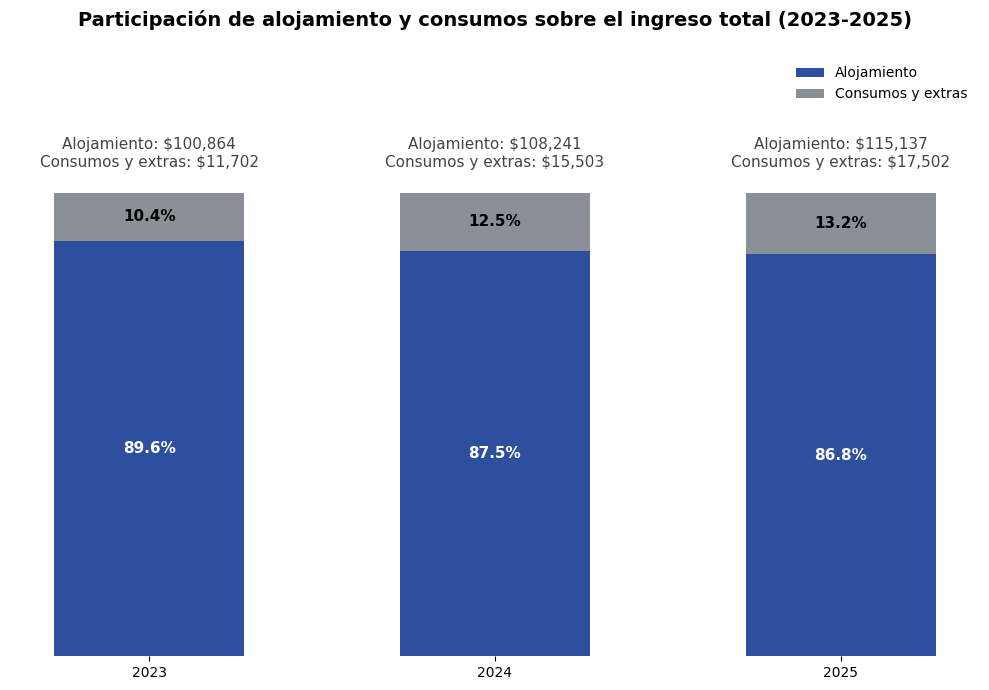

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# =========================================================
# 1) Preparar base
# =========================================================
df_mix = df_reservas_dep.copy()

df_mix["fecha_noche"] = pd.to_datetime(df_mix["fecha_noche"], errors="coerce")
df_mix["alojamiento_distribuido"] = pd.to_numeric(df_mix["alojamiento_distribuido"], errors="coerce")
df_mix["consumos_y_extras_distribuido"] = pd.to_numeric(df_mix["consumos_y_extras_distribuido"], errors="coerce")
df_mix["numero_personas"] = pd.to_numeric(df_mix["numero_personas"], errors="coerce")

df_mix["año"] = df_mix["fecha_noche"].dt.year
df_mix = df_mix[df_mix["año"].isin([2023, 2024, 2025])].copy()

# =========================================================
# 2) Agregar por año
# =========================================================
df_year = (
    df_mix
    .groupby("año", as_index=False)
    .agg(
        alojamiento_total=("alojamiento_distribuido", "sum"),
        consumos_total=("consumos_y_extras_distribuido", "sum"),
        personas_total=("numero_personas", "sum")
    )
)

# total
df_year["ingreso_total"] = df_year["alojamiento_total"] + df_year["consumos_total"]

# participaciones
df_year["part_alojamiento"] = df_year["alojamiento_total"] / df_year["ingreso_total"]
df_year["part_consumos"] = df_year["consumos_total"] / df_year["ingreso_total"]

# ingreso por huésped
df_year["alojamiento_por_huesped"] = df_year["alojamiento_total"] / df_year["personas_total"]
df_year["consumos_por_huesped"] = df_year["consumos_total"] / df_year["personas_total"]

# =========================================================
# 3) Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(10, 7))

x = np.arange(len(df_year))
width = 0.55

color_aloj = "#2E4F9E"
color_cons = "#8A8F98"

ax.bar(
    x,
    df_year["part_alojamiento"],
    width=width,
    color=color_aloj,
    label="Alojamiento"
)

ax.bar(
    x,
    df_year["part_consumos"],
    width=width,
    bottom=df_year["part_alojamiento"],
    color=color_cons,
    label="Consumos y extras"
)

# =========================================================
# 4) Etiquetas internas (%)
# =========================================================
for i, row in df_year.iterrows():
    val_aloj = row["part_alojamiento"]
    val_cons = row["part_consumos"]

    if val_aloj > 0:
        ax.text(
            x[i],
            val_aloj / 2,
            f"{val_aloj:.1%}",
            ha="center",
            va="center",
            fontsize=11,
            fontweight="bold",
            color="white"
        )

    if val_cons > 0:
        ax.text(
            x[i],
            val_aloj + val_cons / 2,
            f"{val_cons:.1%}",
            ha="center",
            va="center",
            fontsize=11,
            fontweight="bold",
            color="black"
        )

# =========================================================
# 5) Etiquetas superiores
# =========================================================
for i, row in df_year.iterrows():
    ax.text(
        x[i],
        1.05,
        f"Alojamiento: ${row['alojamiento_por_huesped']:,.0f}\nConsumos y extras: ${row['consumos_por_huesped']:,.0f}",
        ha="center",
        va="bottom",
        fontsize=11,
        color="#444444"
    )

# =========================================================
# 6) Formato visual
# =========================================================
ax.set_xticks(x)
ax.set_xticklabels(df_year["año"])

ax.set_ylim(0, 1.30)

# quitar eje Y
ax.set_yticks([])
ax.set_ylabel("")

# quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

# leyenda
ax.legend(
    loc="upper right",
    frameon=False
)

ax.set_title(
    "Participación de alojamiento y consumos sobre el ingreso total (2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.grid(False)

plt.tight_layout()
plt.show()

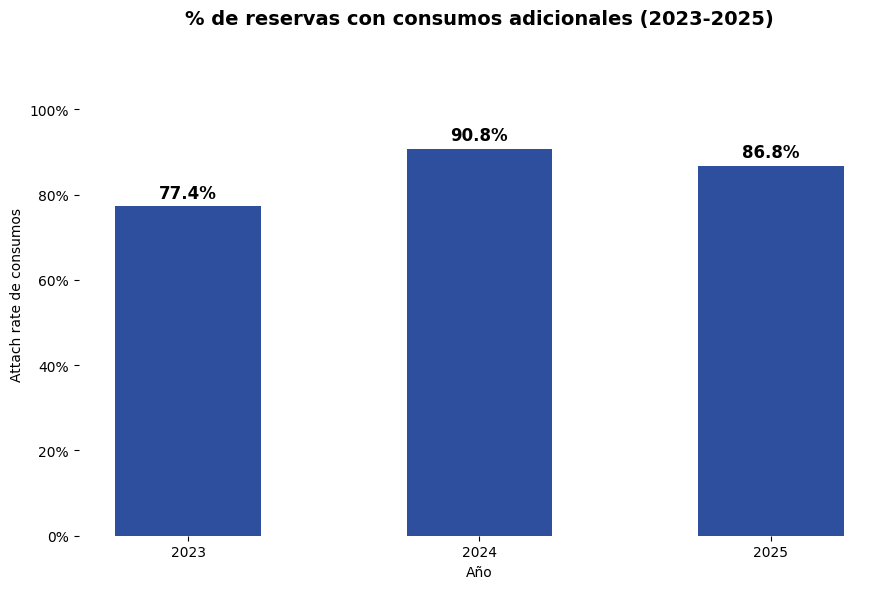

In [ ]:
# =========================================================
# 1) Preparar base
# =========================================================
df_aux = df_reservas_dep.copy()

df_aux["fecha_noche"] = pd.to_datetime(df_aux["fecha_noche"], errors="coerce")
df_aux["ingreso_distribuido"] = pd.to_numeric(df_aux["ingreso_distribuido"], errors="coerce")
df_aux["consumos_y_extras_distribuido"] = pd.to_numeric(df_aux["consumos_y_extras_distribuido"], errors="coerce")

df_aux["año"] = df_aux["fecha_noche"].dt.year
df_aux = df_aux[df_aux["año"].isin([2023, 2024, 2025])].copy()

# =========================================================
# 2) Consolidar por reserva
# =========================================================
df_reserva = (
    df_aux
    .groupby("id_reserva", as_index=False)
    .agg(
        año=("año", "first"),
        ingreso_total=("ingreso_distribuido", "sum"),
        consumo_total=("consumos_y_extras_distribuido", "sum")
    )
)

# =========================================================
# 3) Flags correctos
# =========================================================
df_reserva["reserva_valida"] = df_reserva["ingreso_total"] > 0
df_reserva["con_consumo"] = df_reserva["consumo_total"] > 0

# =========================================================
# 4) Agregación por año
# =========================================================
df_attach = (
    df_reserva
    .groupby("año", as_index=False)
    .agg(
        reservas_total=("reserva_valida", "sum"),
        reservas_con_consumo=("con_consumo", "sum")
    )
)

df_attach["attach_rate"] = df_attach["reservas_con_consumo"] / df_attach["reservas_total"]

# =========================================================
# 5) Gráfico
# =========================================================
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import PercentFormatter

fig, ax = plt.subplots(figsize=(9, 6))

x = np.arange(len(df_attach))

bars = ax.bar(
    x,
    df_attach["attach_rate"],
    width=0.5,
    color="#2E4F9E"
)

# etiquetas %
for i, row in df_attach.iterrows():
    ax.text(
        x[i],
        row["attach_rate"] + 0.01,
        f"{row['attach_rate']:.1%}",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold"
    )

# formato
ax.set_xticks(x)
ax.set_xticklabels(df_attach["año"])

ax.set_ylim(0, df_attach["attach_rate"].max() * 1.25)
ax.yaxis.set_major_formatter(PercentFormatter(1.0))

# quitar bordes
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

ax.set_title(
    "% de reservas con consumos adicionales (2023-2025)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

ax.set_ylabel("Attach rate de consumos")
ax.set_xlabel("Año")

ax.grid(False)

plt.tight_layout()
plt.show()

## Outliers

In [ ]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1057 entries, 0 to 1056
Data columns (total 31 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   fecha_noche                        1057 non-null   datetime64[ns]
 1   personas                           1057 non-null   int64         
 2   ingresos                           1057 non-null   float64       
 3   ingresos_alojamiento               1057 non-null   float64       
 4   ingresos_consumos_extra            1057 non-null   float64       
 5   cuartos_ocupados                   1057 non-null   int64         
 6   ingreso_por_huesped                1057 non-null   float64       
 7   ingreso_alojamiento_por_huesped    1057 non-null   float64       
 8   ingreso_consumo_extra_por_huesped  1057 non-null   float64       
 9   ingreso_por_cuarto                 1057 non-null   float64       
 10  ocupacion                          1

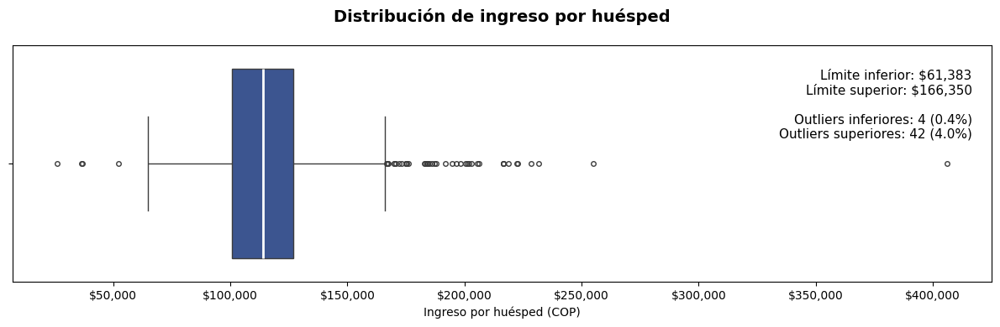

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular outliers (IQR)
# =========================================================
data = df_model["ingreso_por_huesped"].dropna()

q1 = data.quantile(0.25)
q3 = data.quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Límite inferior: ${lower_bound:,.0f}\n"
    f"Límite superior: ${upper_bound:,.0f}\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Separador de miles
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"${x:,.0f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución de ingreso por huésped",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Ingreso por huésped (COP)")
plt.grid(False)

plt.tight_layout()
plt.show()

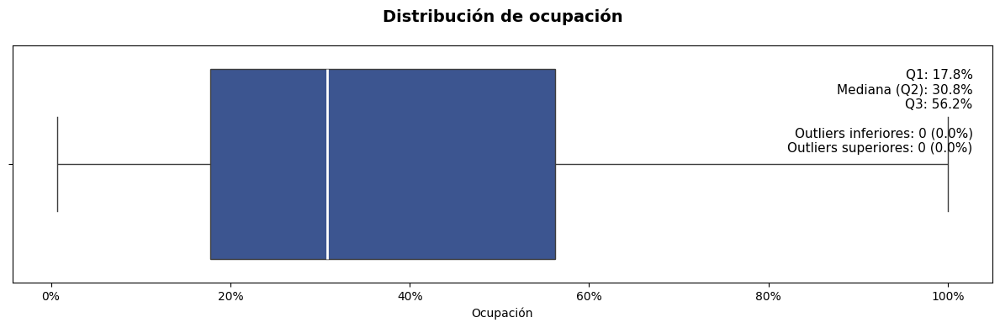

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["ocupacion"].dropna()

q1 = data.quantile(0.25)
q2 = data.quantile(0.50)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Q1: {q1:.1%}\n"
    f"Mediana (Q2): {q2:.1%}\n"
    f"Q3: {q3:.1%}\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Formato eje X
# =========================================================
plt.gca().xaxis.set_major_formatter(PercentFormatter(1.0))

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución de ocupación",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Ocupación")
plt.grid(False)

plt.tight_layout()
plt.show()

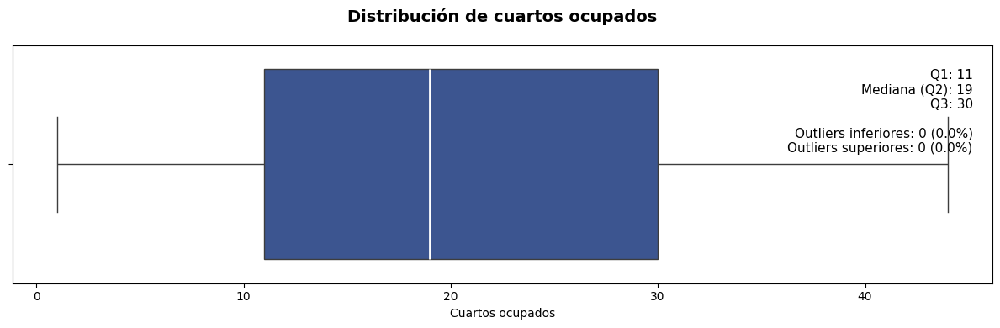

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["cuartos_ocupados"].dropna()

q1 = data.quantile(0.25)
q2 = data.quantile(0.50)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Q1: {q1:,.0f}\n"
    f"Mediana (Q2): {q2:,.0f}\n"
    f"Q3: {q3:,.0f}\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Separador de miles
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"{x:,.0f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución de cuartos ocupados",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Cuartos ocupados")
plt.grid(False)

plt.tight_layout()
plt.show()

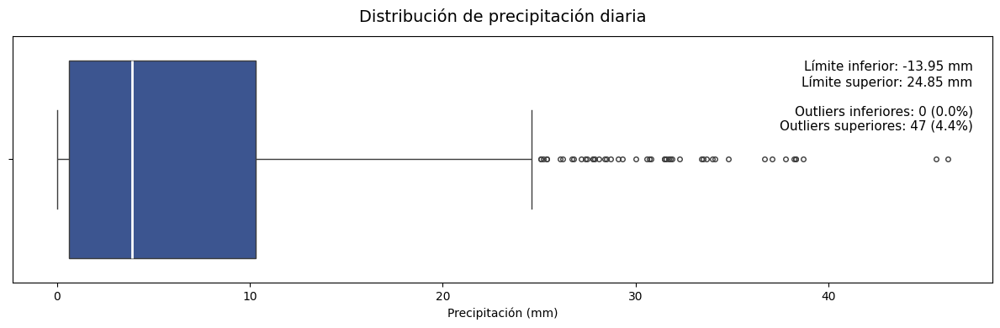

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["precipitacion_mm"].dropna()

q1 = data.quantile(0.25)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta
# =========================================================
texto = (
    f"Límite inferior: {lower_bound:,.2f} mm\n"
    f"Límite superior: {upper_bound:,.2f} mm\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        alpha=0.85,
        edgecolor="none"
    )
)

# =========================================================
# 4 Separador de miles
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"{x:,.0f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title("Distribución de precipitación diaria", fontsize=14, pad=12)
plt.xlabel("Precipitación (mm)")
plt.grid(False)

plt.tight_layout()
plt.show()

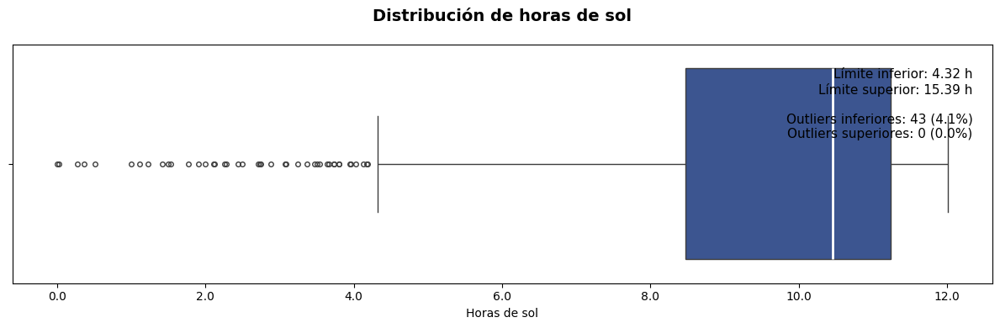

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["sol_horas"].dropna()

q1 = data.quantile(0.25)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Límite inferior: {lower_bound:,.2f} h\n"
    f"Límite superior: {upper_bound:,.2f} h\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Formato eje X
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"{x:,.1f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución de horas de sol",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Horas de sol")
plt.grid(False)

plt.tight_layout()
plt.show()

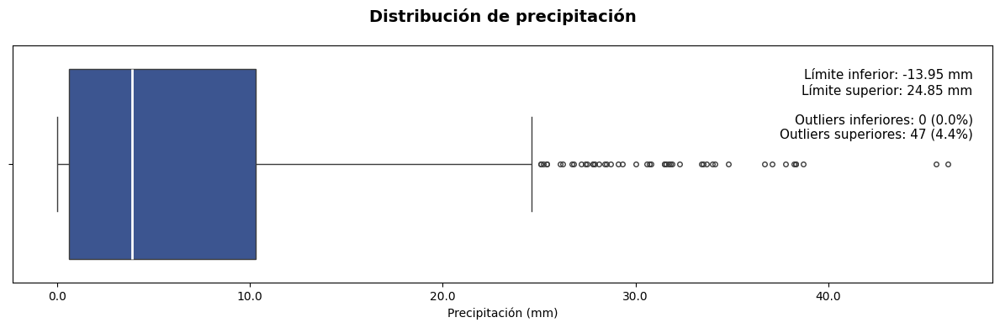

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["precipitacion_mm"].dropna()

q1 = data.quantile(0.25)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Límite inferior: {lower_bound:,.2f} mm\n"
    f"Límite superior: {upper_bound:,.2f} mm\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Formato eje X
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"{x:,.1f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución de precipitación",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Precipitación (mm)")
plt.grid(False)

plt.tight_layout()
plt.show()

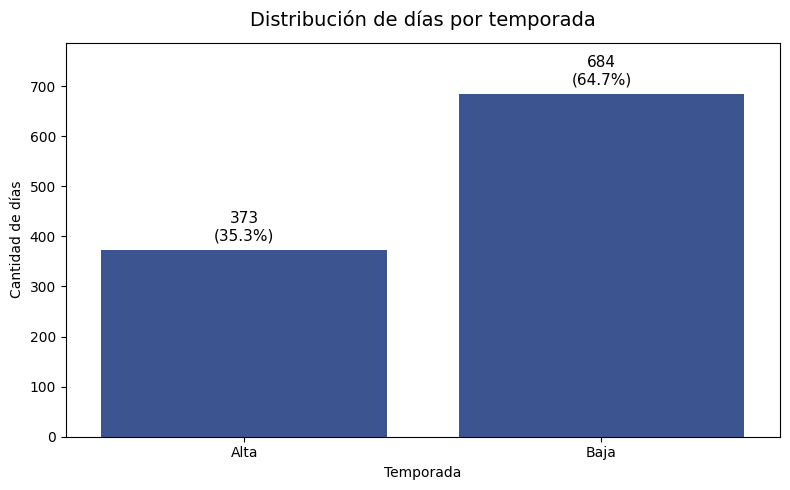

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator, FuncFormatter

# =========================================================
# 1 Datos
# =========================================================
df_plot = df_model.copy()

orden = ["Alta", "Baja"]  # ajusta si no usas Media

conteo = df_plot["temporada"].value_counts().reindex(orden)
total = conteo.sum()

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(8,5))

ax = sns.countplot(
    x="temporada",
    data=df_plot,
    order=orden,
    color="#2E4F9E"
)

# =========================================================
# 3 Etiquetas cantidad y %
# =========================================================
max_val = conteo.max()

for p in ax.patches:

    altura = p.get_height()
    porcentaje = altura / total

    ax.text(
        p.get_x() + p.get_width()/2,
        altura + max_val*0.02,
        f"{int(altura):,}\n({porcentaje:.1%})",
        ha="center",
        va="bottom",
        fontsize=11
    )

# =========================================================
# 4 Ajustar eje Y (para evitar que se salgan etiquetas)
# =========================================================
ax.set_ylim(0, max_val * 1.15)

# =========================================================
# 5 Eje Y cada 1000 + separador miles
# =========================================================
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))

# =========================================================
# 6 Estética
# =========================================================
plt.title("Distribución de días por temporada", fontsize=14, pad=12)
plt.xlabel("Temporada")
plt.ylabel("Cantidad de días")

plt.grid(False)

plt.tight_layout()
plt.show()

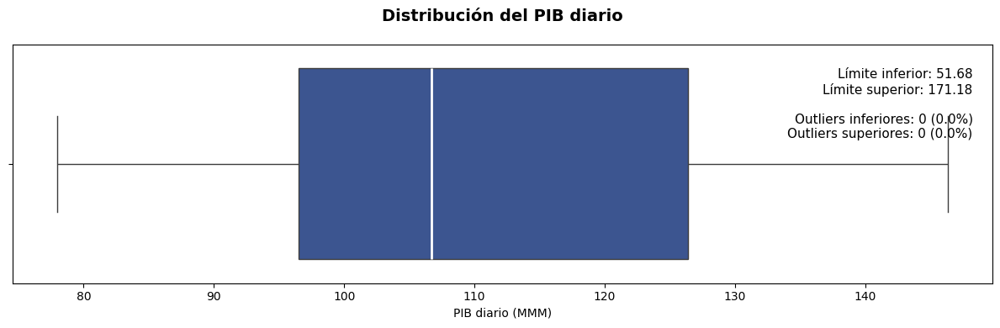

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# =========================================================
# 1 Calcular estadísticas
# =========================================================
data = df_model["PIB_diario_MMM"].dropna()

q1 = data.quantile(0.25)
q3 = data.quantile(0.75)

iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers_bajos = data[data < lower_bound]
outliers_altos = data[data > upper_bound]

total = len(data)

n_bajos = len(outliers_bajos)
n_altos = len(outliers_altos)

pct_bajos = n_bajos / total
pct_altos = n_altos / total

# =========================================================
# 2 Gráfico
# =========================================================
plt.figure(figsize=(12, 4))

sns.boxplot(
    x=data,
    color="#2E4F9E",
    fliersize=4,
    medianprops=dict(color="white", linewidth=2)
)

# =========================================================
# 3 Etiqueta (sin borde)
# =========================================================
texto = (
    f"Límite inferior: {lower_bound:,.2f}\n"
    f"Límite superior: {upper_bound:,.2f}\n\n"
    f"Outliers inferiores: {n_bajos} ({pct_bajos:.1%})\n"
    f"Outliers superiores: {n_altos} ({pct_altos:.1%})"
)

plt.text(
    0.98,
    0.90,
    texto,
    transform=plt.gca().transAxes,
    ha="right",
    va="top",
    fontsize=11
)

# =========================================================
# 4 Separador de miles
# =========================================================
plt.gca().xaxis.set_major_formatter(
    FuncFormatter(lambda x, _: f"{x:,.0f}")
)

# =========================================================
# 5 Estética
# =========================================================
plt.title(
    "Distribución del PIB diario",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("PIB diario (MMM)")
plt.grid(False)

plt.tight_layout()
plt.show()

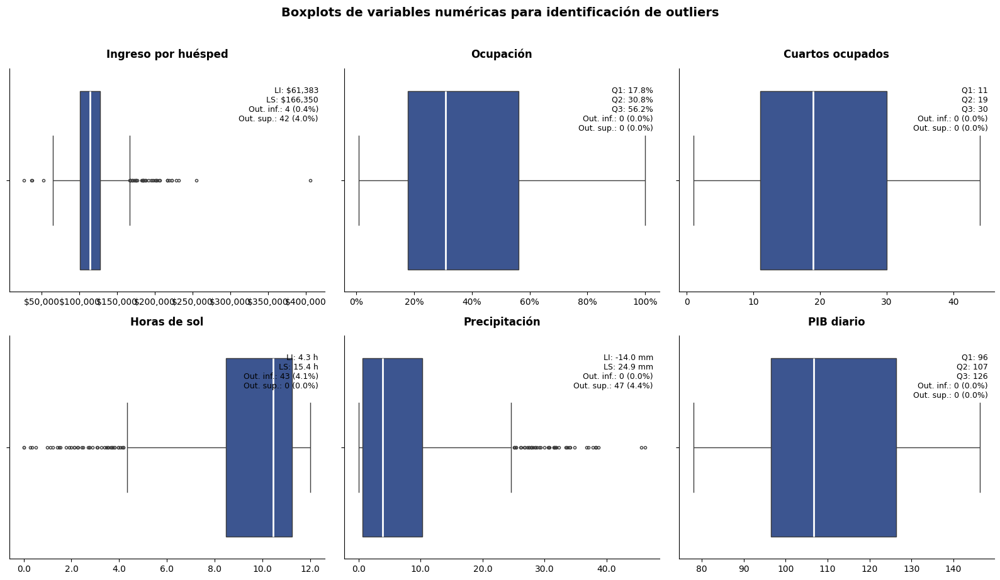

In [ ]:
import math
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter, FuncFormatter

# =========================================================
# 1) Variables a graficar
# =========================================================
variables_box = [
    "ingreso_por_huesped",
    "ocupacion",
    "cuartos_ocupados",
    "sol_horas",
    "precipitacion_mm",
    "PIB_diario_MMM"
]

# títulos visibles
titulos = {
    "ingreso_por_huesped": "Ingreso por huésped",
    "ocupacion": "Ocupación",
    "cuartos_ocupados": "Cuartos ocupados",
    "sol_horas": "Horas de sol",
    "precipitacion_mm": "Precipitación",
    "PIB_diario_MMM": "PIB diario"
}

# variables que van en porcentaje
vars_pct = {"ocupacion"}

# variables monetarias
vars_money = {"ingreso_por_huesped"}

# variables con decimales
vars_dec = {"sol_horas", "precipitacion_mm"}

# =========================================================
# 2) Layout
# =========================================================
n = len(variables_box)
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4.5 * nrows))
axes = axes.flatten()

# =========================================================
# 3) Graficar cada boxplot
# =========================================================
for i, var in enumerate(variables_box):
    ax = axes[i]
    data = df_model[var].dropna()

    # estadísticas
    q1 = data.quantile(0.25)
    q2 = data.quantile(0.50)
    q3 = data.quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outliers_bajos = data[data < lower_bound]
    outliers_altos = data[data > upper_bound]

    total = len(data)
    n_bajos = len(outliers_bajos)
    n_altos = len(outliers_altos)

    pct_bajos = n_bajos / total if total > 0 else 0
    pct_altos = n_altos / total if total > 0 else 0

    # boxplot
    sns.boxplot(
        x=data,
        ax=ax,
        color="#2E4F9E",
        fliersize=3,
        medianprops=dict(color="white", linewidth=2)
    )

    # título
    ax.set_title(
        titulos.get(var, var),
        fontsize=12,
        fontweight="bold",
        pad=12
    )

    # formato eje X
    if var in vars_pct:
        ax.xaxis.set_major_formatter(PercentFormatter(1.0))
        texto = (
            f"Q1: {q1:.1%}\n"
            f"Q2: {q2:.1%}\n"
            f"Q3: {q3:.1%}\n"
            f"Out. inf.: {n_bajos} ({pct_bajos:.1%})\n"
            f"Out. sup.: {n_altos} ({pct_altos:.1%})"
        )
    elif var in vars_money:
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}"))
        texto = (
            f"LI: ${lower_bound:,.0f}\n"
            f"LS: ${upper_bound:,.0f}\n"
            f"Out. inf.: {n_bajos} ({pct_bajos:.1%})\n"
            f"Out. sup.: {n_altos} ({pct_altos:.1%})"
        )
    elif var in vars_dec:
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,.1f}"))
        unidad = "h" if var == "sol_horas" else "mm"
        texto = (
            f"LI: {lower_bound:,.1f} {unidad}\n"
            f"LS: {upper_bound:,.1f} {unidad}\n"
            f"Out. inf.: {n_bajos} ({pct_bajos:.1%})\n"
            f"Out. sup.: {n_altos} ({pct_altos:.1%})"
        )
    else:
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,.0f}"))
        texto = (
            f"Q1: {q1:,.0f}\n"
            f"Q2: {q2:,.0f}\n"
            f"Q3: {q3:,.0f}\n"
            f"Out. inf.: {n_bajos} ({pct_bajos:.1%})\n"
            f"Out. sup.: {n_altos} ({pct_altos:.1%})"
        )

    # etiqueta interna
    ax.text(
        0.98,
        0.92,
        texto,
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=9
    )

    # estética
    ax.set_xlabel("")
    ax.grid(False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# =========================================================
# 4) Apagar ejes sobrantes
# =========================================================
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

# =========================================================
# 5) Título general
# =========================================================
fig.suptitle(
    "Boxplots de variables numéricas para identificación de outliers",
    fontsize=14,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()
plt.show()

# Regresion Lineal (Ingenuo)

Evaluar hacer un metalgoritmo (union de los algoritmos)

In [ ]:
#Filtrar variables base

vars_keep = [
    "fecha_noche",
    "precipitacion_mm",
    "sol_horas",
    "PIB_diario_MMM",
    "dow",
    "dia_mes",
    "fin_semana",
    "temporada",
    "ocupacion"
]

df_linear_regression = df_model[vars_keep].copy()
df_linear_regression["fecha_noche"] = pd.to_datetime(df_linear_regression["fecha_noche"], errors="coerce")

df_linear_regression.head()

,fecha_noche,precipitacion_mm,sol_horas,PIB_diario_MMM,dow,dia_mes,fin_semana,temporada,ocupacion
0,2023-02-08,0.0,11.195083,116.649330,2,8,0,Baja,0.438356
1,2023-02-09,0.0,11.192797,109.714772,3,9,0,Baja,0.328767
2,2023-02-10,0.0,11.257283,122.697190,4,10,1,Baja,0.301370
3,2023-02-11,0.0,11.187792,127.364460,5,11,1,Baja,0.267123
4,2023-02-12,0.2,11.251803,94.361075,6,12,1,Baja,0.157534


In [ ]:
# Test: junio a diciembre de 2025
df_train = df_linear_regression[df_linear_regression["fecha_noche"] < "2025-06-01"].copy()
df_test  = df_linear_regression[
    (df_linear_regression["fecha_noche"] >= "2025-06-01") &
    (df_linear_regression["fecha_noche"] <= "2025-12-31")
].copy()

print("Train:", df_train["fecha_noche"].min(), "a", df_train["fecha_noche"].max(), "| filas:", len(df_train))
print("Test :", df_test["fecha_noche"].min(), "a", df_test["fecha_noche"].max(), "| filas:", len(df_test))

Train: 2023-02-08 00:00:00 a 2025-05-31 00:00:00 | filas: 843
Test : 2025-06-01 00:00:00 a 2025-12-31 00:00:00 | filas: 214


In [ ]:
#Definir variables continuas y categoricas

vars_cont = [
    "precipitacion_mm",
    "sol_horas",
    "PIB_diario_MMM"
]

vars_cat = [
    "dow",
    "dia_mes",
    "fin_semana",
    "temporada"
]

In [ ]:
#Estandarizar variables continuas de train

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df_train[vars_cont] = scaler.fit_transform(df_train[vars_cont])
df_test[vars_cont] = scaler.transform(df_test[vars_cont])

In [ ]:
#Dumifica variables categoricas

df_train_dummies = pd.get_dummies(
    df_train[vars_cat],
    columns=vars_cat,
    drop_first=True,
    dtype=int
)

df_test_dummies = pd.get_dummies(
    df_test[vars_cat],
    columns=vars_cat,
    drop_first=True,
    dtype=int
)

# Alinear columnas entre train y test
df_train_dummies, df_test_dummies = df_train_dummies.align(df_test_dummies, join="left", axis=1, fill_value=0)

In [ ]:
#Crear X_train, X_test, y_train, y_test

import pandas as pd
import numpy as np

X_train = pd.concat(
    [
        df_train[vars_cont].reset_index(drop=True),
        df_train_dummies.reset_index(drop=True)
    ],
    axis=1
)

X_test = pd.concat(
    [
        df_test[vars_cont].reset_index(drop=True),
        df_test_dummies.reset_index(drop=True)
    ],
    axis=1
)

y_train = df_train["ocupacion"].reset_index(drop=True)
y_test = df_test["ocupacion"].reset_index(drop=True)

# Limpiar por si hubiera nulos
train_data = pd.concat([y_train, X_train], axis=1).dropna()
test_data = pd.concat([y_test, X_test], axis=1).dropna()

y_train = train_data["ocupacion"]
X_train = train_data.drop(columns=["ocupacion"])

y_test = test_data["ocupacion"]
X_test = test_data.drop(columns=["ocupacion"])

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(843, 41) (843,)
(214, 41) (214,)


In [ ]:
train_data = pd.concat(
    [
        df_train["fecha_noche"].reset_index(drop=True),
        y_train,
        X_train
    ],
    axis=1
).dropna()

test_data = pd.concat(
    [
        df_test["fecha_noche"].reset_index(drop=True),
        y_test,
        X_test
    ],
    axis=1
).dropna()

In [ ]:
fecha_train = train_data["fecha_noche"]
fecha_test = test_data["fecha_noche"]

y_train = train_data["ocupacion"]
X_train = train_data.drop(columns=["fecha_noche", "ocupacion"])

y_test = test_data["ocupacion"]
X_test = test_data.drop(columns=["fecha_noche", "ocupacion"])

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(843, 41) (843,)
(214, 41) (214,)


In [ ]:
#Crea Forward Selection

import statsmodels.api as sm

def forward_selection(X, y, criterion="aic", verbose=True):
    remaining = list(X.columns)
    selected = []
    current_score = float("inf")
    best_model = None

    while remaining:
        scores_with_candidates = []

        for candidate in remaining:
            features = selected + [candidate]
            X_model = sm.add_constant(X[features].astype(float), has_constant="add")
            model = sm.OLS(y, X_model).fit()

            if criterion == "aic":
                score = model.aic
            elif criterion == "bic":
                score = model.bic
            else:
                raise ValueError("criterion debe ser 'aic' o 'bic'")

            scores_with_candidates.append((score, candidate, model))

        scores_with_candidates.sort(key=lambda x: x[0])
        best_new_score, best_candidate, best_new_model = scores_with_candidates[0]

        if best_new_score < current_score:
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
            best_model = best_new_model

            if verbose:
                print(f"Se agrega: {best_candidate:30s} | {criterion.upper()} = {best_new_score:.3f}")
        else:
            break

    return selected, best_model

In [ ]:
#Corre forward selection solo en train

selected_vars, modelo_forward = forward_selection(X_train, y_train, criterion="aic", verbose=True)

print("Variables seleccionadas:")
print(selected_vars)

Se agrega: dow_5                          | AIC = 4.402
Se agrega: temporada_Baja                 | AIC = -147.955
Se agrega: fin_semana_1                   | AIC = -209.241
Se agrega: precipitacion_mm               | AIC = -224.411
Se agrega: dow_3                          | AIC = -227.129
Se agrega: dia_mes_13                     | AIC = -228.751
Se agrega: PIB_diario_MMM                 | AIC = -229.564
Se agrega: dia_mes_31                     | AIC = -229.972
Variables seleccionadas:
['dow_5', 'temporada_Baja', 'fin_semana_1', 'precipitacion_mm', 'dow_3', 'dia_mes_13', 'PIB_diario_MMM', 'dia_mes_31']


In [ ]:
print(modelo_forward.summary())

                            OLS Regression Results                            
Dep. Variable:              ocupacion   R-squared:                       0.383
Model:                            OLS   Adj. R-squared:                  0.377
Method:                 Least Squares   F-statistic:                     64.82
Date:                Wed, 29 Apr 2026   Prob (F-statistic):           1.88e-82
Time:                        20:33:10   Log-Likelihood:                 123.99
No. Observations:                 843   AIC:                            -230.0
Df Residuals:                     834   BIC:                            -187.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.4348      0.016  

In [ ]:
X_train_sel = sm.add_constant(X_train[selected_vars].astype(float), has_constant="add")
X_test_sel = sm.add_constant(X_test[selected_vars].astype(float), has_constant="add")

In [ ]:
#Predecir train y test

y_train_Pred = modelo_forward.predict(X_train_sel)
y_test_Pred = modelo_forward.predict(X_test_sel)

# acotar entre 0 y 1 de acuerdo con maximo y minimo posible de ocupacion
y_train_Pred = np.clip(y_train_Pred, 0, 1)
y_test_Pred = np.clip(y_test_Pred, 0, 1)

In [ ]:
#Metricas de desempeño

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae_train = mean_absolute_error(y_train, y_train_Pred)
mse_train = mean_squared_error(y_train, y_train_Pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_Pred)

mae_test = mean_absolute_error(y_test, y_test_Pred)
mse_test = mean_squared_error(y_test, y_test_Pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_test_Pred)

y_train_arr = np.array(y_train).ravel()
y_test_arr = np.array(y_test).ravel()
y_train_pred_arr = np.array(y_train_Pred).ravel()
y_test_pred_arr = np.array(y_test_Pred).ravel()

def mean_absolute_percentage_error(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

mape_train = mean_absolute_percentage_error(y_train_arr, y_train_pred_arr)
mape_test = mean_absolute_percentage_error(y_test_arr, y_test_pred_arr)

print(f"Train MAE: {mae_train}, Test MAE: {mae_test}")
print(f"Train MSE: {mse_train}, Test MSE: {mse_test}")
print(f"Train RMSE: {rmse_train}, Test RMSE: {rmse_test}")
print(f"Train MAPE: {mape_train}, Test MAPE: {mape_test}")
print(f"Train R²: {r2_train}, Test R²: {r2_test}")

Train MAE: 0.16161213394831822, Test MAE: 0.16420867947773637
Train MSE: 0.043629104666202075, Test MSE: 0.04400414630613384
Train RMSE: 0.2088758115871775, Test RMSE: 0.2097716527706588
Train MAPE: 0.8640451671622776, Test MAPE: 0.46727772334914836
Train R²: 0.38340782584011446, Test R²: 0.342107855511248


In [ ]:
#Resumen metricas diarias

metricas = pd.DataFrame({
    "Metrica": ["MAE", "MSE", "RMSE", "MAPE", "R2"],
    "Train": [mae_train, mse_train, rmse_train, mape_train, r2_train],
    "Test": [mae_test, mse_test, rmse_test, mape_test, r2_test]
})

metricas

,Metrica,Train,Test
0,MAE,0.161612,0.164209
1,MSE,0.043629,0.044004
2,RMSE,0.208876,0.209772
3,MAPE,0.864045,0.467278
4,R2,0.383408,0.342108


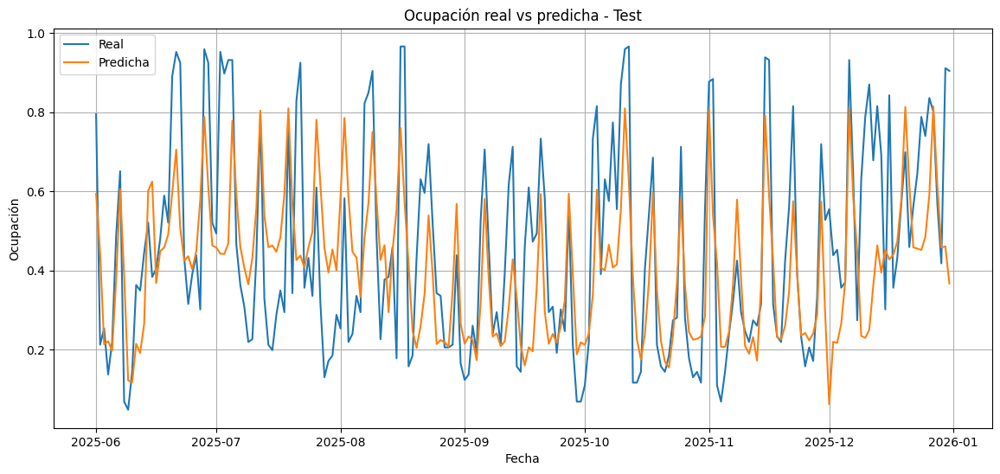

In [ ]:
#Prediciones vs Real

import matplotlib.pyplot as plt

df_resultados_test = pd.DataFrame({
    "fecha_noche": fecha_test.values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_test_Pred
}).sort_values("fecha_noche")

plt.figure(figsize=(14,6))
plt.plot(df_resultados_test["fecha_noche"], df_resultados_test["ocupacion_real"], label="Real")
plt.plot(df_resultados_test["fecha_noche"], df_resultados_test["ocupacion_pred"], label="Predicha")
plt.title("Ocupación real vs predicha - Test")
plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.legend()
plt.grid(True)
plt.show()

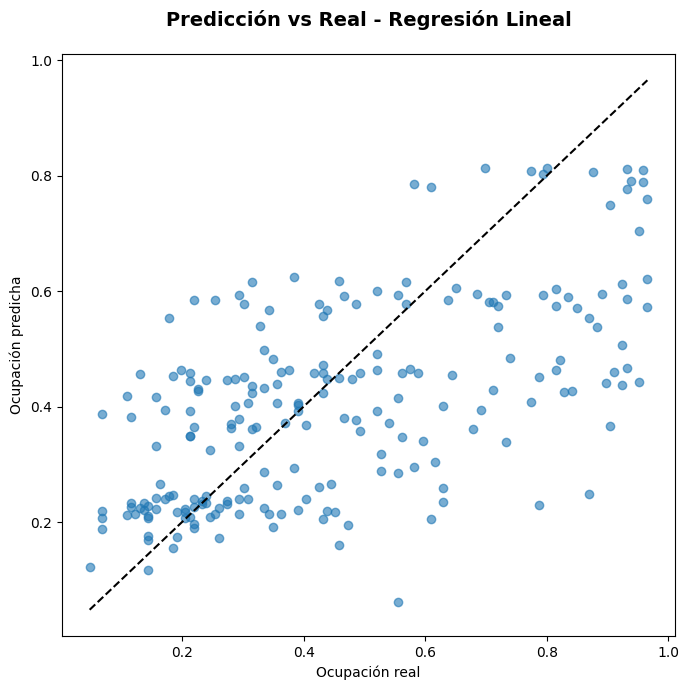

In [ ]:
# =========================================================
# Scatter Real vs Predicción - Regresión Lineal
# =========================================================
plt.figure(figsize=(7, 7))

plt.scatter(y_test, y_test_Pred, alpha=0.6)

min_val = min(y_test.min(), y_test_Pred.min())
max_val = max(y_test.max(), y_test_Pred.max())

plt.plot([min_val, max_val], [min_val, max_val],
         linestyle="--",
         linewidth=1.5,
         color="black")

plt.title(
    "Predicción vs Real - Regresión Lineal",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Ocupación real")
plt.ylabel("Ocupación predicha")

plt.grid(False)
plt.tight_layout()
plt.show()

In [ ]:
df_resultados_test = pd.DataFrame({
    "fecha_noche": fecha_test.values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_test_Pred
})

df_resultados_test.head()

,fecha_noche,ocupacion_real,ocupacion_pred
0,2025-06-01,0.794521,0.593475
1,2025-06-02,0.212329,0.445018
2,2025-06-03,0.253425,0.213315
3,2025-06-04,0.136986,0.221045
4,2025-06-05,0.219178,0.196929


In [ ]:
vars_cont = [
    "precipitacion_mm",
    "sol_horas",
    "PIB_diario_MMM"
]

vars_cat = [
    "dow",
    "dia_mes",
    "fin_semana",
    "temporada"
]

df_export = df_resultados_test.merge(
    df_model[["fecha_noche"] + vars_cont + vars_cat],
    on="fecha_noche",
    how="left"
)

df_export.head()

,fecha_noche,ocupacion_real,ocupacion_pred,precipitacion_mm,sol_horas,PIB_diario_MMM,dow,dia_mes,fin_semana,temporada
0,2025-06-01,0.794521,0.593475,8.6,7.325417,146.021685,6,1,1,Alta
1,2025-06-02,0.212329,0.445018,5.5,11.720908,117.100880,0,2,0,Alta
2,2025-06-03,0.253425,0.213315,10.2,6.512019,123.081556,1,3,0,Baja
3,2025-06-04,0.136986,0.221045,5.3,8.657797,107.774829,2,4,0,Baja
4,2025-06-05,0.219178,0.196929,19.4,4.813147,92.332258,3,5,0,Baja


In [ ]:
df_export = df_export.sort_values("fecha_noche")

In [ ]:
df_export.to_excel("df_linear_regression.xlsx", index=False)

## Metricas de desempeño mensuales

In [ ]:
df_train_results = pd.DataFrame({
    "fecha": fecha_train.values,
    "ocupacion_real": y_train.values,
    "ocupacion_pred": y_train_Pred
})

df_test_results = pd.DataFrame({
    "fecha": fecha_test.values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_test_Pred
})

In [ ]:
capacidad_personas = 146

df_train_results["fecha"] = pd.to_datetime(df_train_results["fecha"])
df_test_results["fecha"] = pd.to_datetime(df_test_results["fecha"])

df_train_results["mes"] = df_train_results["fecha"].dt.to_period("M")
df_test_results["mes"] = df_test_results["fecha"].dt.to_period("M")

df_train_results["dias_mes"] = df_train_results["fecha"].dt.days_in_month
df_test_results["dias_mes"] = df_test_results["fecha"].dt.days_in_month

In [ ]:
df_train_results["personas_real"] = df_train_results["ocupacion_real"] * capacidad_personas
df_train_results["personas_pred"] = df_train_results["ocupacion_pred"] * capacidad_personas

df_test_results["personas_real"] = df_test_results["ocupacion_real"] * capacidad_personas
df_test_results["personas_pred"] = df_test_results["ocupacion_pred"] * capacidad_personas

In [ ]:
train_monthly = (
    df_train_results
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

test_monthly = (
    df_test_results
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

In [ ]:
lr_train_monthly = train_monthly.copy()
lr_test_monthly = test_monthly.copy()

lr_train_monthly["ocupacion_real_mensual"] = (
    lr_train_monthly["personas_real"] / (lr_train_monthly["dias_mes"] * capacidad_personas)
)

lr_train_monthly["ocupacion_pred_mensual"] = (
    lr_train_monthly["personas_pred"] / (lr_train_monthly["dias_mes"] * capacidad_personas)
)

lr_test_monthly["ocupacion_real_mensual"] = (
    lr_test_monthly["personas_real"] / (lr_test_monthly["dias_mes"] * capacidad_personas)
)

lr_test_monthly["ocupacion_pred_mensual"] = (
    lr_test_monthly["personas_pred"] / (lr_test_monthly["dias_mes"] * capacidad_personas)
)

In [ ]:
lr_train_monthly.head(30)

,mes,personas_real,personas_pred,dias_mes,ocupacion_real_mensual,ocupacion_pred_mensual
0,2023-02,911.0,1012.417359,28,0.222847,0.247656
1,2023-03,1097.0,1545.967000,31,0.242377,0.341575
2,2023-04,1348.0,1743.896653,30,0.307763,0.398150
3,2023-05,837.0,1406.546767,31,0.184932,0.310770
4,2023-06,1842.0,1936.321633,30,0.420548,0.442083
5,2023-07,2370.0,2308.818972,31,0.523641,0.510124
6,2023-08,1636.0,1834.243207,31,0.361467,0.405268
7,2023-09,1532.0,1303.450609,30,0.349772,0.297591
8,2023-10,1775.0,1511.190124,31,0.392179,0.333891
9,2023-11,2156.0,1468.110267,30,0.492237,0.335185


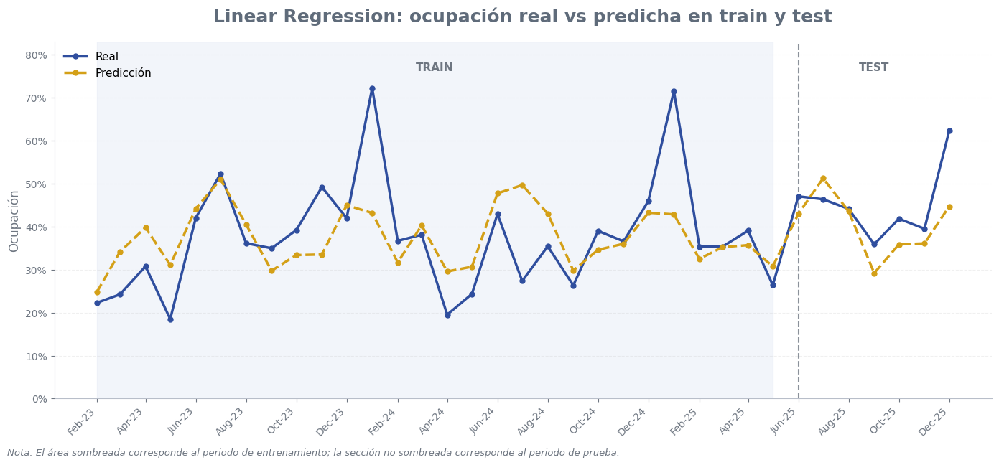

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 0. Nombre del modelo
# =========================================================
model_name = "Linear Regression"

# =========================================================
# 1. Copias y preparación
# =========================================================
df_train = lr_train_monthly.copy()
df_test = lr_test_monthly.copy()

# Si "mes" viene como Period[M], convertir a timestamp
df_train["mes"] = df_train["mes"].dt.to_timestamp()
df_test["mes"] = df_test["mes"].dt.to_timestamp()

df_train["periodo"] = "Train"
df_test["periodo"] = "Test"

# Unir train + test
df_plot = pd.concat([df_train, df_test], axis=0).sort_values("mes").reset_index(drop=True)

# Fecha de corte entre train y test
fecha_corte = df_test["mes"].min()

# =========================================================
# 2. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

# Sombrear periodo de train
ax.axvspan(
    df_train["mes"].min(),
    df_train["mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Línea real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.5,
    marker="o",
    markersize=5,
    label="Real",
    zorder=3
)

# Línea predicción
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=dorado,
    linewidth=2.5,
    linestyle="--",
    marker="o",
    markersize=5,
    label="Predicción",
    zorder=3
)

# Línea de separación Train/Test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 4. Etiquetas Train / Test
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["ocupacion_pred_mensual"].max()
)

ax.text(
    df_train["mes"].min() + (df_train["mes"].max() - df_train["mes"].min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    df_test["mes"].min() + (df_test["mes"].max() - df_test["mes"].min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 5. Eje X
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# =========================================================
# 6. Eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 7. Estilo general
# =========================================================
ax.set_title(
    f"{model_name}: ocupación real vs predicha en train y test",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(frameon=False, loc="upper left", fontsize=11)

ax.set_ylim(
    0,
    max(
        df_plot["ocupacion_real_mensual"].max(),
        df_plot["ocupacion_pred_mensual"].max()
    ) * 1.15
)

fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

In [ ]:
y_train_m = lr_train_monthly["ocupacion_real_mensual"].values
y_train_pred_m = lr_train_monthly["ocupacion_pred_mensual"].values

y_test_m = lr_test_monthly["ocupacion_real_mensual"].values
y_test_pred_m = lr_test_monthly["ocupacion_pred_mensual"].values

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

mae_train_m = mean_absolute_error(y_train_m, y_train_pred_m)
mse_train_m = mean_squared_error(y_train_m, y_train_pred_m)
rmse_train_m = np.sqrt(mse_train_m)
r2_train_m = r2_score(y_train_m, y_train_pred_m)

mae_test_m = mean_absolute_error(y_test_m, y_test_pred_m)
mse_test_m = mean_squared_error(y_test_m, y_test_pred_m)
rmse_test_m = np.sqrt(mse_test_m)
r2_test_m = r2_score(y_test_m, y_test_pred_m)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

mape_train_m = mean_absolute_percentage_error(y_train_m, y_train_pred_m)
mape_test_m = mean_absolute_percentage_error(y_test_m, y_test_pred_m)

In [ ]:
print(f"Train MAE mensual: {mae_train_m}, Test MAE mensual: {mae_test_m}")
print(f"Train MSE mensual: {mse_train_m}, Test MSE mensual: {mse_test_m}")
print(f"Train RMSE mensual: {rmse_train_m}, Test RMSE mensual: {rmse_test_m}")
print(f"Train MAPE mensual: {mape_train_m}, Test MAPE mensual: {mape_test_m}")
print(f"Train R² mensual: {r2_train_m}, Test R² mensual: {r2_test_m}")

Train MAE mensual: 0.0748461509041153, Test MAE mensual: 0.061656785968748816
Train MSE mensual: 0.011368182512632509, Test MSE mensual: 0.00631221793952791
Train RMSE mensual: 0.10662167937447106, Test RMSE mensual: 0.07944946783665646
Train MAPE mensual: 0.21245700055064878, Test MAPE mensual: 0.12885124419264685
Train R² mensual: 0.30193270725047483, Test R² mensual: -0.03180700566130845


# XGBoost

In [ ]:
df_model.head()

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion,precipitacion_mm,sol_horas,temporada,PIB_diario_MMM,dow,mes,año,dia_mes,fin_semana,temporada_num,ocupacion_lag1,ocupacion_lag7,ingresos_lag1,ingresos_lag7,ocupacion_ma7,ingresos_ma7,dow_sin,dow_cos,mes_sin,mes_cos
0,2023-02-08,64,6.603937e+06,6.062604e+06,541333.000000,26,103186.513802,94728.185677,8458.328125,253997.572436,0.438356,0.0,11.195083,Baja,116.649330,2,2,2023,8,0,0.0,0.465753,0.301370,6.688893e+06,4.416740e+06,0.528376,7.493013e+06,0.974928,-0.222521,0.866025,0.5
1,2023-02-09,48,4.925649e+06,4.635649e+06,289999.666667,20,102617.681597,96576.021875,6041.659722,246282.435833,0.328767,0.0,11.192797,Baja,109.714772,3,2,2023,9,0,0.0,0.438356,0.369863,6.603937e+06,5.598111e+06,0.547945,7.805470e+06,0.433884,-0.900969,0.866025,0.5
2,2023-02-10,44,4.212566e+06,3.987899e+06,224666.666667,15,95740.135606,90634.075000,5106.060606,280837.731111,0.301370,0.0,11.257283,Baja,122.697190,4,2,2023,10,1,0.0,0.328767,0.636986,4.925649e+06,8.838389e+06,0.542074,7.709404e+06,-0.433884,-0.900969,0.866025,0.5
3,2023-02-11,39,4.132927e+06,3.777260e+06,355666.666667,16,105972.482295,96852.824176,9119.658120,258307.925595,0.267123,0.0,11.187792,Baja,127.364460,5,2,2023,11,1,0.0,0.301370,0.821918,4.212566e+06,1.134276e+07,0.494129,7.048572e+06,-0.974928,-0.222521,0.866025,0.5
4,2023-02-12,23,2.212260e+06,2.067260e+06,145000.000000,9,96185.223602,89880.875776,6304.347826,245806.682540,0.157534,0.2,11.251803,Baja,94.361075,6,2,2023,12,1,0.0,0.267123,0.458904,4.132927e+06,6.788844e+06,0.414873,6.018595e+06,-0.781831,0.623490,0.866025,0.5


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor

In [ ]:
# =========================================================
# 1. Preparar base
# =========================================================
df = df_model.copy()

df["fecha_noche"] = pd.to_datetime(df["fecha_noche"], errors="coerce")
df["year_month"] = df["fecha_noche"].dt.to_period("M").astype(str)

# ordenar por fecha
df = df.sort_values("fecha_noche").reset_index(drop=True)

# =========================================================
# 2. Definir periodo de train y test
#    Test = junio a diciembre de 2025
# =========================================================
fecha_inicio_test = pd.Timestamp("2025-06-01")
fecha_fin_test = pd.Timestamp("2025-12-31")

train = df[df["fecha_noche"] < fecha_inicio_test].copy()
test = df[(df["fecha_noche"] >= fecha_inicio_test) & (df["fecha_noche"] <= fecha_fin_test)].copy()

print("Train:", train.shape)
print("Test:", test.shape)
print(train["fecha_noche"].min(), train["fecha_noche"].max())
print(test["fecha_noche"].min(), test["fecha_noche"].max())

Train: (843, 32)
Test: (214, 32)
2023-02-08 00:00:00 2025-05-31 00:00:00
2025-06-01 00:00:00 2025-12-31 00:00:00


In [ ]:
y_train = train["ocupacion"].copy()
y_test = test["ocupacion"].copy()

In [ ]:
# =========================================================
# 3. Definir variables
# =========================================================

variables_continuas = [
    "precipitacion_mm",
    "sol_horas",
    "PIB_diario_MMM"
]

variables_categoricas = [
    "temporada",
    "dow",
    "mes",
    "dia_mes",
    "fin_semana",
]

# columnas finales
features = variables_continuas + variables_categoricas

In [ ]:
X_train = train[features].copy()
X_test = test[features].copy()

In [ ]:
# =========================================================
# 4. Estandarizar variables continuas
# =========================================================
scaler = StandardScaler()

X_train_num = pd.DataFrame(
    scaler.fit_transform(X_train[variables_continuas]),
    columns=variables_continuas,
    index=X_train.index
)

X_test_num = pd.DataFrame(
    scaler.transform(X_test[variables_continuas]),
    columns=variables_continuas,
    index=X_test.index
)

In [ ]:
# =========================================================
# 5. Dummificar variables categóricas
# =========================================================
X_train_cat = pd.get_dummies(
    X_train[variables_categoricas].astype(str),
    drop_first=False
)

X_test_cat = pd.get_dummies(
    X_test[variables_categoricas].astype(str),
    drop_first=False
)

# alinear columnas entre train y test
X_train_cat, X_test_cat = X_train_cat.align(X_test_cat, join="left", axis=1, fill_value=0)

In [ ]:
# =========================================================
# 6. Construir matrices finales
# =========================================================
X_train_final = pd.concat([X_train_num, X_train_cat], axis=1)
X_test_final = pd.concat([X_test_num, X_test_cat], axis=1)

print("X_train_final:", X_train_final.shape)
print("X_test_final:", X_test_final.shape)

X_train_final: (843, 57)
X_test_final: (214, 57)


## Random Search

In [ ]:
import numpy as np
import pandas as pd

from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# =========================================================
# 1. Validación temporal
# =========================================================
tscv = TimeSeriesSplit(n_splits=5)

In [ ]:
# =========================================================
# 2. Modelo base
# =========================================================
xgb_base = XGBRegressor(
    objective="reg:squarederror",
    random_state=42
)

In [ ]:
# =========================================================
# 3. Random Search
# =========================================================
param_dist = {
    "n_estimators": [100, 200, 300, 400, 500, 700],
    "max_depth": [2, 3, 4, 5, 6, 8],
    "learning_rate": [0.01, 0.03, 0.05, 0.07, 0.1, 0.15],
    "subsample": [0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "min_child_weight": [1, 3, 5, 7],
    "gamma": [0, 0.1, 0.2, 0.3, 0.5],
    "reg_alpha": [0, 0.01, 0.1, 0.5, 1],
    "reg_lambda": [1, 2, 5, 10]
}

random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_dist,
    n_iter=50,
    scoring="neg_root_mean_squared_error",
    cv=tscv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_train_final, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamm...
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8, 0.9,
                                                             1.0],
                                        'gamma': [0, 0.1, 0.2, 0.3, 0.5],
                                        'learning_rate': [0.01, 0.03, 0.05,
                                                          0.07, 0.1, 0.15],
                                        'max_depth': [2, 3, 4, 5, 6, 8],
                                        'min_child_weight': [1, 3, 5, 7],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 700],
                                        'reg_alpha': [0, 0.01, 0.1, 0.5, 1],
                                        'reg_lambda': [1, 2, 5, 10],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=2)

In [ ]:
# =========================================================
# 4. Resultados Random Search
# =========================================================
best_params_random = random_search.best_params_

print("Mejores hiperparámetros Random Search:")
print(best_params_random)

print("\nMejor score CV Random Search:")
print(random_search.best_score_)

Mejores hiperparámetros Random Search:
{'subsample': 0.9, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 400, 'min_child_weight': 7, 'max_depth': 6, 'learning_rate': 0.15, 'gamma': 0.2, 'colsample_bytree': 0.6}

Mejor score CV Random Search:
-0.21740219163793134


## Grid Search

In [ ]:
tscv = TimeSeriesSplit(n_splits=3)

param_grid_local = {
    "n_estimators": [350, 400, 450],
    "max_depth": [6, 7],
    "learning_rate": [0.14, 0.15, 0.16],
    "subsample": [0.9, 1.0],
    "colsample_bytree": [0.5, 0.6],
    "min_child_weight": [6, 7, 8],
    "gamma": [0.2, 0.3],
    "reg_alpha": [0, 0.01],
    "reg_lambda": [1, 2, 3]
}

grid_search = GridSearchCV(
    estimator=XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        tree_method="hist"
    ),
    param_grid=param_grid_local,
    scoring="neg_root_mean_squared_error",
    cv=tscv,
    verbose=2,
    n_jobs=-1
)

grid_search.fit(X_train_final, y_train)

Fitting 3 folds for each of 2592 candidates, totalling 7776 fits


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, feature_weights=None,
                                    gamma=None...
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.5, 0.6], 'gamma': [0.2, 0.3],
                         'learning_rate': [0.14, 0.15, 0.16],
                         'max_depth': [6, 7], 'min_child_weight': [6, 7, 8],
                         'n_estimators': [350, 400, 450],
                         'reg_alpha': [0, 0.01], 'reg_lambda': [1, 2, 3],
                         'subsample': [0.9, 1.0]},
             scoring='neg_root_mean_squared_error', verbose=2)

In [ ]:
# =========================================================
# 6. Resultados Grid Search
# =========================================================
best_params_grid = grid_search.best_params_

print("\nMejores hiperparámetros Grid Search:")
print(best_params_grid)

print("\nMejor score CV Grid Search:")
print(grid_search.best_score_)


Mejores hiperparámetros Grid Search:
{'colsample_bytree': 0.6, 'gamma': 0.2, 'learning_rate': 0.16, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 350, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.9}

Mejor score CV Grid Search:
-0.2154527814483356


In [ ]:
# =========================================================
# Mejores hiperparámetros
# =========================================================
best_params = random_search.best_params_

print("Mejores hiperparámetros:")
print(best_params)

print("\nMejor score CV:")
print(random_search.best_score_)

Mejores hiperparámetros:
{'subsample': 0.9, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 400, 'min_child_weight': 7, 'max_depth': 6, 'learning_rate': 0.15, 'gamma': 0.2, 'colsample_bytree': 0.6}

Mejor score CV:
-0.21740219163793134


In [ ]:
# =========================================================
# 7. Mejor modelo final
# =========================================================
best_model = grid_search.best_estimator_

In [ ]:
# =========================================================
# 8. Predicciones
# =========================================================
y_pred_train = best_model.predict(X_train_final)
y_pred_test = best_model.predict(X_test_final)

# Acotar predicciones entre 0 y 1
y_pred_train = np.clip(y_pred_train, 0, 1)
y_pred_test = np.clip(y_pred_test, 0, 1)

In [ ]:
# =========================================================
# 9. Métricas de desempeño
#    MAPE en número natural
# =========================================================
def mape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def metricas_modelo(y_true, y_pred, nombre="Modelo"):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape_val = mape(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"\nMétricas - {nombre}")
    print(f"MAE : {mae:.4f}")
    print(f"MSE : {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAPE: {mape_val:.2f}")
    print(f"R²  : {r2:.4f}")

    return {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape_val,
        "R2": r2
    }

metricas_train = metricas_modelo(y_train, y_pred_train, "Train")
metricas_test = metricas_modelo(y_test, y_pred_test, "Test")


Métricas - Train
MAE : 0.1331
MSE : 0.0284
RMSE: 0.1686
MAPE: 72.49
R²  : 0.5982

Métricas - Test
MAE : 0.1551
MSE : 0.0407
RMSE: 0.2017
MAPE: 43.61
R²  : 0.3917


In [ ]:
# =========================================================
# 10. Tabla resumen de métricas
# =========================================================
metricas_resumen = pd.DataFrame([
    {"dataset": "Train", **metricas_train},
    {"dataset": "Test", **metricas_test}
])

print("\nResumen de métricas:")
print(metricas_resumen)


Resumen de métricas:
  dataset       MAE       MSE      RMSE       MAPE        R2
0   Train  0.133148  0.028429  0.168608  72.487641  0.598229
1    Test  0.155113  0.040687  0.201711  43.614277  0.391699


In [ ]:
# =========================================================
# 11. Resultados completos de búsquedas
# =========================================================
results_random = pd.DataFrame(random_search.cv_results_).sort_values("rank_test_score")
results_grid = pd.DataFrame(grid_search.cv_results_).sort_values("rank_test_score")

print("\nTop 10 Random Search:")
print(results_random[[
    "rank_test_score", "mean_test_score", "std_test_score", "params"
]].head(10))

print("\nTop 10 Grid Search:")
print(results_grid[[
    "rank_test_score", "mean_test_score", "std_test_score", "params"
]].head(10))


Top 10 Random Search:
    rank_test_score  mean_test_score  std_test_score  \
38                1        -0.217402        0.032270   
18                2        -0.217948        0.030679   
42                3        -0.218703        0.028986   
37                4        -0.218773        0.032374   
1                 5        -0.218973        0.032650   
27                6        -0.219101        0.032675   
14                7        -0.219272        0.033116   
20                8        -0.219583        0.033093   
16                9        -0.219736        0.031611   
28               10        -0.219874        0.030915   

                                               params  
38  {'subsample': 0.9, 'reg_lambda': 2, 'reg_alpha...  
18  {'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha...  
42  {'subsample': 0.9, 'reg_lambda': 2, 'reg_alpha...  
37  {'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha...  
1   {'subsample': 0.9, 'reg_lambda': 2, 'reg_alpha...  
27  {'subsample': 0.9, '

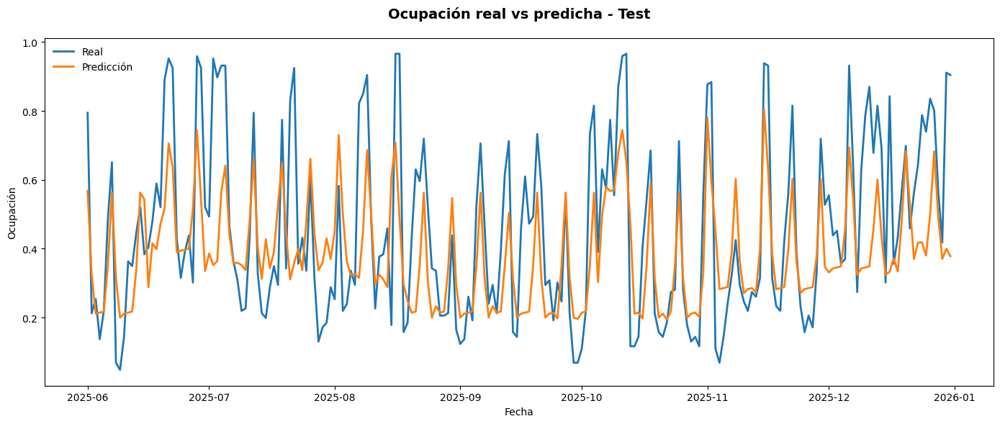

In [ ]:
# =========================================================
# 11. Predicción vs Real en test (serie temporal)
# =========================================================
df_result_test = test[["fecha_noche"]].copy()
df_result_test["real"] = y_test.values
df_result_test["pred"] = y_pred_test

plt.figure(figsize=(14, 6))

plt.plot(df_result_test["fecha_noche"], df_result_test["real"], label="Real", linewidth=2)
plt.plot(df_result_test["fecha_noche"], df_result_test["pred"], label="Predicción", linewidth=2)

plt.title("Ocupación real vs predicha - Test", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.legend(frameon=False)
plt.grid(False)
plt.tight_layout()
plt.show()

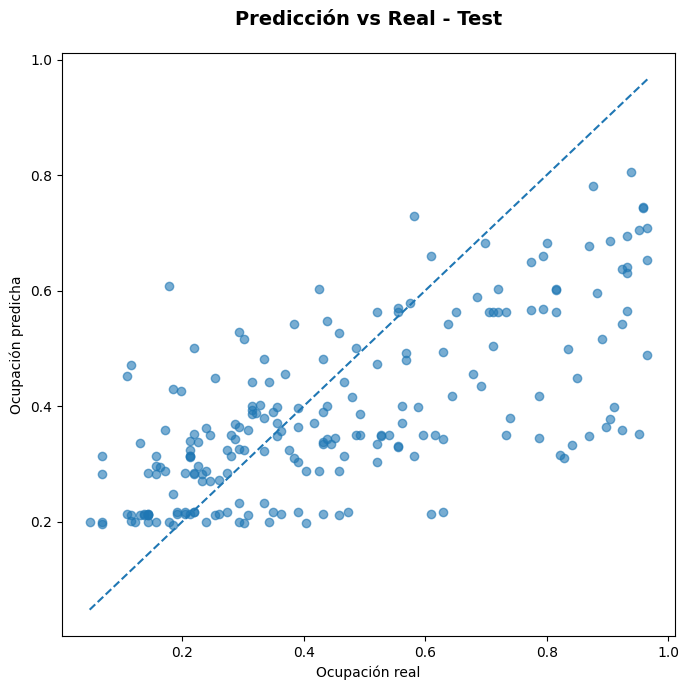

In [ ]:
# =========================================================
# 12. Scatter Real vs Predicción
# =========================================================
plt.figure(figsize=(7, 7))

plt.scatter(y_test, y_pred_test, alpha=0.6)

min_val = min(y_test.min(), y_pred_test.min())
max_val = max(y_test.max(), y_pred_test.max())

plt.plot([min_val, max_val], [min_val, max_val], linestyle="--", linewidth=1.5)

plt.title("Predicción vs Real - Test", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Ocupación real")
plt.ylabel("Ocupación predicha")
plt.grid(False)
plt.tight_layout()
plt.show()

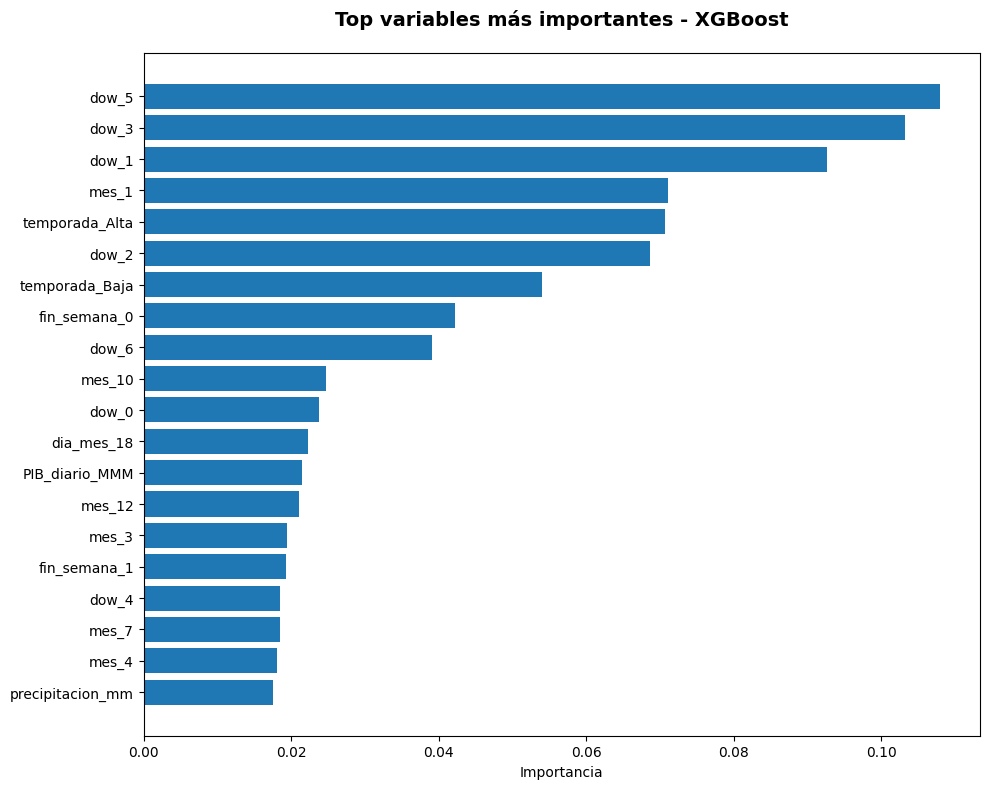

,variable,importance
10,dow_5,0.108011
8,dow_3,0.103243
6,dow_1,0.092705
12,mes_1,0.071064
3,temporada_Alta,0.070712
7,dow_2,0.068628
4,temporada_Baja,0.053945
55,fin_semana_0,0.042183
11,dow_6,0.039053
13,mes_10,0.024736


In [ ]:
# =========================================================
# 13. Importancia de variables
# =========================================================
importancias = pd.DataFrame({
    "variable": X_train_final.columns,
    "importance": best_model.feature_importances_
}).sort_values("importance", ascending=False)

top_n = 20
top_imp = importancias.head(top_n).sort_values("importance", ascending=True)

plt.figure(figsize=(10, 8))
plt.barh(top_imp["variable"], top_imp["importance"])
plt.title("Top variables más importantes - XGBoost", fontsize=14, fontweight="bold", pad=20)
plt.xlabel("Importancia")
plt.grid(False)
plt.tight_layout()
plt.show()

importancias.head(20)

## Metricas de desempeño mensuales

In [ ]:
df_train_results = pd.DataFrame({
    "fecha": train["fecha_noche"].values,
    "ocupacion_real": y_train.values,
    "ocupacion_pred": y_pred_train
})

df_test_results = pd.DataFrame({
    "fecha": test["fecha_noche"].values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_pred_test
})

In [ ]:
capacidad_personas = 146

In [ ]:
df_train_results["fecha"] = pd.to_datetime(df_train_results["fecha"])
df_test_results["fecha"] = pd.to_datetime(df_test_results["fecha"])

df_train_results["mes"] = df_train_results["fecha"].dt.to_period("M")
df_test_results["mes"] = df_test_results["fecha"].dt.to_period("M")

In [ ]:
df_train_results["dias_mes"] = df_train_results["fecha"].dt.days_in_month
df_test_results["dias_mes"] = df_test_results["fecha"].dt.days_in_month

In [ ]:
df_train_results["personas_real"] = df_train_results["ocupacion_real"] * capacidad_personas
df_train_results["personas_pred"] = df_train_results["ocupacion_pred"] * capacidad_personas

df_test_results["personas_real"] = df_test_results["ocupacion_real"] * capacidad_personas
df_test_results["personas_pred"] = df_test_results["ocupacion_pred"] * capacidad_personas

In [ ]:
train_monthly = (
    df_train_results
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

test_monthly = (
    df_test_results
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

In [ ]:
xgb_train_monthly = train_monthly.copy()
xgb_test_monthly = test_monthly.copy()

xgb_train_monthly["ocupacion_real_mensual"] = (
    xgb_train_monthly["personas_real"] / (xgb_train_monthly["dias_mes"] * capacidad_personas)
)

xgb_train_monthly["ocupacion_pred_mensual"] = (
    xgb_train_monthly["personas_pred"] / (xgb_train_monthly["dias_mes"] * capacidad_personas)
)

xgb_test_monthly["ocupacion_real_mensual"] = (
    xgb_test_monthly["personas_real"] / (xgb_test_monthly["dias_mes"] * capacidad_personas)
)

xgb_test_monthly["ocupacion_pred_mensual"] = (
    xgb_test_monthly["personas_pred"] / (xgb_test_monthly["dias_mes"] * capacidad_personas)
)

In [ ]:
xgb_train_monthly.head(30)
xgb_test_monthly.head(30)

,mes,personas_real,personas_pred,dias_mes,ocupacion_real_mensual,ocupacion_pred_mensual
0,2025-06,2061.0,1780.706055,30,0.470548,0.406554
1,2025-07,2099.0,1938.662476,31,0.463765,0.428339
2,2025-08,1998.0,1737.891235,31,0.441449,0.383980
3,2025-09,1573.0,1258.284546,30,0.359132,0.287280
4,2025-10,1894.0,1677.590942,31,0.418471,0.370656
5,2025-11,1731.0,1759.332031,30,0.395205,0.401674
6,2025-12,2820.0,1951.752197,31,0.623067,0.431231


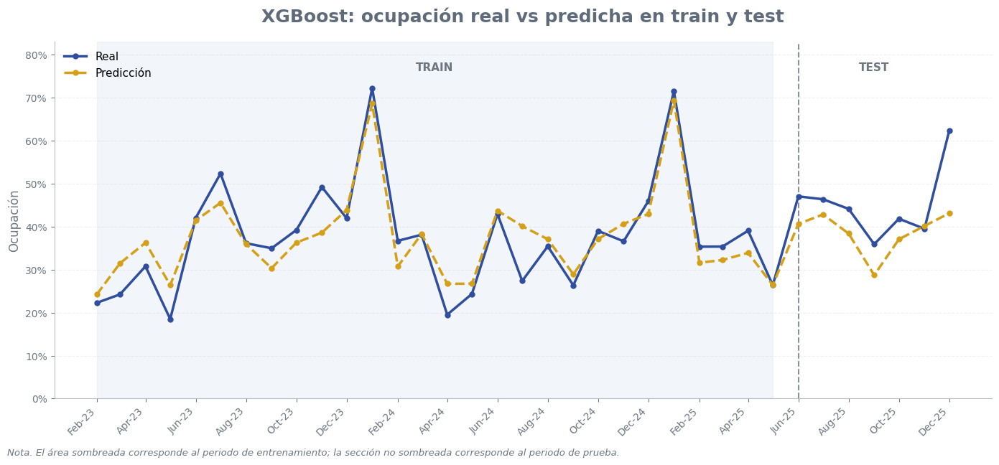

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 0. Nombre del modelo
# =========================================================
model_name = "XGBoost"

# =========================================================
# 1. Copias y preparación
# =========================================================
df_train = xgb_train_monthly.copy()
df_test = xgb_test_monthly.copy()

# Convertir "mes" a timestamp si viene como Period
if str(df_train["mes"].dtype).startswith("period"):
    df_train["mes"] = df_train["mes"].dt.to_timestamp()
else:
    df_train["mes"] = pd.to_datetime(df_train["mes"])

if str(df_test["mes"].dtype).startswith("period"):
    df_test["mes"] = df_test["mes"].dt.to_timestamp()
else:
    df_test["mes"] = pd.to_datetime(df_test["mes"])

df_train["periodo"] = "Train"
df_test["periodo"] = "Test"

# Unir train + test
df_plot = pd.concat([df_train, df_test], axis=0).sort_values("mes").reset_index(drop=True)

# Fecha de corte entre train y test
fecha_corte = df_test["mes"].min()

# =========================================================
# 2. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

# Sombrear periodo de train
ax.axvspan(
    df_train["mes"].min(),
    df_train["mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Línea real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.5,
    marker="o",
    markersize=5,
    label="Real",
    zorder=3
)

# Línea predicción
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=dorado,
    linewidth=2.5,
    linestyle="--",
    marker="o",
    markersize=5,
    label="Predicción",
    zorder=3
)

# Línea de separación Train/Test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 4. Etiquetas Train / Test
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["ocupacion_pred_mensual"].max()
)

ax.text(
    df_train["mes"].min() + (df_train["mes"].max() - df_train["mes"].min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    df_test["mes"].min() + (df_test["mes"].max() - df_test["mes"].min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 5. Eje X
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# =========================================================
# 6. Eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 7. Estilo general
# =========================================================
ax.set_title(
    f"{model_name}: ocupación real vs predicha en train y test",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(frameon=False, loc="upper left", fontsize=11)

ax.set_ylim(
    0,
    max(
        df_plot["ocupacion_real_mensual"].max(),
        df_plot["ocupacion_pred_mensual"].max()
    ) * 1.15
)

fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

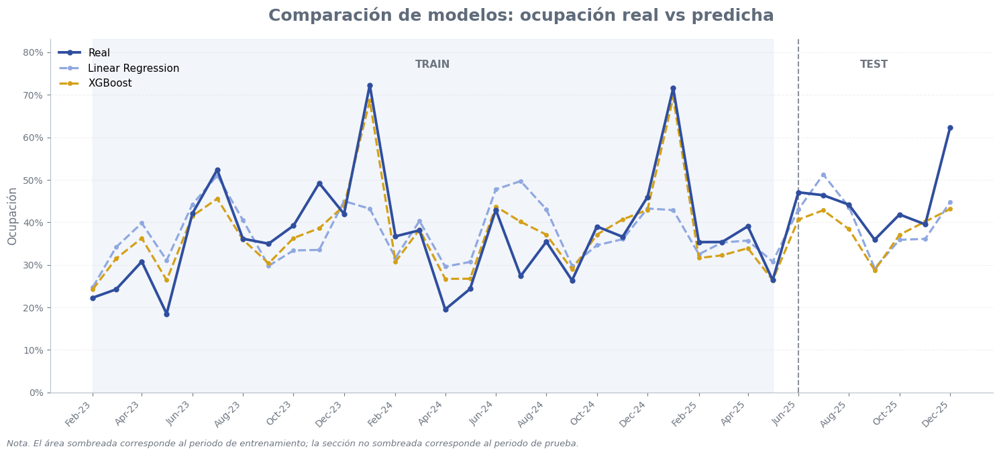

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 1. Función para preparar train + test por modelo
# =========================================================
def preparar_modelo(train_df, test_df, nombre_modelo):
    df_train = train_df.copy()
    df_test = test_df.copy()

    # Asegurar tipo fecha
    if str(df_train["mes"].dtype).startswith("period"):
        df_train["mes"] = df_train["mes"].dt.to_timestamp()
    else:
        df_train["mes"] = pd.to_datetime(df_train["mes"])

    if str(df_test["mes"].dtype).startswith("period"):
        df_test["mes"] = df_test["mes"].dt.to_timestamp()
    else:
        df_test["mes"] = pd.to_datetime(df_test["mes"])

    df_train["periodo"] = "Train"
    df_test["periodo"] = "Test"

    df_full = pd.concat([df_train, df_test], axis=0).sort_values("mes").reset_index(drop=True)

    # Renombrar predicción según modelo
    df_full = df_full[["mes", "periodo", "ocupacion_real_mensual", "ocupacion_pred_mensual"]].copy()
    df_full = df_full.rename(columns={"ocupacion_pred_mensual": f"pred_{nombre_modelo}"})

    return df_full


# =========================================================
# 2. Preparar bases
# =========================================================
lr_full = preparar_modelo(lr_train_monthly, lr_test_monthly, "lr")
xgb_full = preparar_modelo(xgb_train_monthly, xgb_test_monthly, "xgb")

# Tomamos la serie real desde LR (debería ser igual en ambos)
df_plot = lr_full.merge(
    xgb_full[["mes", "pred_xgb"]],
    on="mes",
    how="left"
)

# Fecha de corte
fecha_corte = df_plot.loc[df_plot["periodo"] == "Test", "mes"].min()

# =========================================================
# 3. Colores
# =========================================================
azul_oscuro = "#2F4E9E"   # Real
azul_claro = "#8FA8E0"    # Linear Regression
dorado = "#D4A017"        # XGBoost
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 4. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(15, 6.8))

# Sombrear train
ax.axvspan(
    df_plot["mes"].min(),
    df_plot.loc[df_plot["periodo"] == "Train", "mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Línea real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.8,
    marker="o",
    markersize=5,
    label="Real",
    zorder=4
)

# Linear Regression
ax.plot(
    df_plot["mes"],
    df_plot["pred_lr"],
    color=azul_claro,
    linewidth=2.3,
    linestyle="--",
    marker="o",
    markersize=4,
    label="Linear Regression",
    zorder=3
)

# XGBoost
ax.plot(
    df_plot["mes"],
    df_plot["pred_xgb"],
    color=dorado,
    linewidth=2.3,
    linestyle="--",
    marker="o",
    markersize=4,
    label="XGBoost",
    zorder=3
)

# Línea de corte entre train y test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 5. Etiquetas TRAIN / TEST
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["pred_lr"].max(),
    df_plot["pred_xgb"].max()
)

mes_train = df_plot.loc[df_plot["periodo"] == "Train", "mes"]
mes_test = df_plot.loc[df_plot["periodo"] == "Test", "mes"]

ax.text(
    mes_train.min() + (mes_train.max() - mes_train.min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    mes_test.min() + (mes_test.max() - mes_test.min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 6. Formato de ejes
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 7. Estilo general
# =========================================================
ax.set_title(
    "Comparación de modelos: ocupación real vs predicha",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(
    frameon=False,
    loc="upper left",
    fontsize=11
)

ax.set_ylim(0, y_top * 1.15)

# Nota al pie
fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

In [ ]:
y_train_m = xgb_train_monthly["ocupacion_real_mensual"].values
y_train_pred_m = xgb_train_monthly["ocupacion_pred_mensual"].values

y_test_m = xgb_test_monthly["ocupacion_real_mensual"].values
y_test_pred_m = xgb_test_monthly["ocupacion_pred_mensual"].values

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

mae_train_m = mean_absolute_error(y_train_m, y_train_pred_m)
mse_train_m = mean_squared_error(y_train_m, y_train_pred_m)
rmse_train_m = np.sqrt(mse_train_m)
r2_train_m = r2_score(y_train_m, y_train_pred_m)

mae_test_m = mean_absolute_error(y_test_m, y_test_pred_m)
mse_test_m = mean_squared_error(y_test_m, y_test_pred_m)
rmse_test_m = np.sqrt(mse_test_m)
r2_test_m = r2_score(y_test_m, y_test_pred_m)

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

mape_train_m = mean_absolute_percentage_error(y_train_m, y_train_pred_m)
mape_test_m = mean_absolute_percentage_error(y_test_m, y_test_pred_m)

In [ ]:
print(f"Train MAE mensual: {mae_train_m:.4f}, Test MAE mensual: {mae_test_m:.4f}")
print(f"Train MSE mensual: {mse_train_m:.4f}, Test MSE mensual: {mse_test_m:.4f}")
print(f"Train RMSE mensual: {rmse_train_m:.4f}, Test RMSE mensual: {rmse_test_m:.4f}")
print(f"Train MAPE mensual: {mape_train_m:.4f}, Test MAPE mensual: {mape_test_m:.4f}")
print(f"Train R² mensual: {r2_train_m:.4f}, Test R² mensual: {r2_test_m:.4f}")

Train MAE mensual: 0.0395, Test MAE mensual: 0.0678
Train MSE mensual: 0.0025, Test MSE mensual: 0.0076
Train RMSE mensual: 0.0502, Test RMSE mensual: 0.0870
Train MAPE mensual: 0.1253, Test MAPE mensual: 0.1402
Train R² mensual: 0.8453, Test R² mensual: -0.2364


# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import numpy as np
import pandas as pd

In [ ]:
tscv = TimeSeriesSplit(n_splits=3)

## Random Search

In [ ]:
# =========================================================
# 3. Random Search Random Forest
# =========================================================
rf = RandomForestRegressor(
    random_state=42,
    n_jobs=-1
)

param_dist = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [3, 5, 7, 10, None],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": ["sqrt", "log2", None]
}

random_search_rf = RandomizedSearchCV(
    rf,
    param_distributions=param_dist,
    n_iter=30,
    scoring="neg_root_mean_squared_error",
    cv=tscv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

random_search_rf.fit(X_train_final, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'max_depth': [3, 5, 7, 10, None],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 500]},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=2)

In [ ]:
best_params_rf = random_search_rf.best_params_

print("Mejores hiperparámetros Random Forest:")
print(best_params_rf)

Mejores hiperparámetros Random Forest:
{'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}


## Grid Search

In [ ]:
# =========================================================
# Grid Search localizado
#    Basado en:
#    {'n_estimators': 500,
#     'min_samples_split': 10,
#     'min_samples_leaf': 1,
#     'max_features': 'log2',
#     'max_depth': None}
# =========================================================
param_grid_rf = {
    "n_estimators": [400, 500, 600],
    "min_samples_split": [8, 10, 12],
    "min_samples_leaf": [1, 2],
    "max_features": ["log2", "sqrt"],
    "max_depth": [10, 15, 20, None]
}

grid_search_rf = GridSearchCV(
    estimator=RandomForestRegressor(
        random_state=42,
        n_jobs=-1
    ),
    param_grid=param_grid_rf,
    scoring="neg_root_mean_squared_error",
    cv=tscv,
    verbose=2,
    n_jobs=-1
)

grid_search_rf.fit(X_train_final, y_train)


Fitting 3 folds for each of 144 candidates, totalling 432 fits


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
             estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 15, 20, None],
                         'max_features': ['log2', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [400, 500, 600]},
             scoring='neg_root_mean_squared_error', verbose=2)

In [ ]:
# =========================================================
# 3. Resultados Grid Search
# =========================================================
best_params_rf_grid = grid_search_rf.best_params_

print("Mejores hiperparámetros Random Forest - Grid Search:")
print(best_params_rf_grid)

print("\nMejor score CV Random Forest - Grid Search:")
print(grid_search_rf.best_score_)

Mejores hiperparámetros Random Forest - Grid Search:
{'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 400}

Mejor score CV Random Forest - Grid Search:
-0.21797847792438704


In [ ]:
# =========================================================
# 4. Mejor modelo final
# =========================================================
best_rf = grid_search_rf.best_estimator_

In [ ]:
# =========================================================
# 5. Predicciones
# =========================================================
y_pred_train_rf = best_rf.predict(X_train_final)
y_pred_test_rf = best_rf.predict(X_test_final)

# Acotar entre 0 y 1
y_pred_train_rf = np.clip(y_pred_train_rf, 0, 1)
y_pred_test_rf = np.clip(y_pred_test_rf, 0, 1)

In [ ]:
# =========================================================
# 6. Métricas de desempeño
#    MAPE en número natural
# =========================================================
def mape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def metricas_modelo(y_true, y_pred, nombre="Modelo"):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape_val = mape(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"\nMétricas - {nombre}")
    print(f"MAE : {mae:.4f}")
    print(f"MSE : {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAPE: {mape_val:.2f}")
    print(f"R²  : {r2:.4f}")

    return {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape_val,
        "R2": r2
    }

metricas_train_rf = metricas_modelo(y_train, y_pred_train_rf, "Random Forest Train")
metricas_test_rf = metricas_modelo(y_test, y_pred_test_rf, "Random Forest Test")


Métricas - Random Forest Train
MAE : 0.1045
MSE : 0.0177
RMSE: 0.1331
MAPE: 56.50
R²  : 0.7496

Métricas - Random Forest Test
MAE : 0.1524
MSE : 0.0390
RMSE: 0.1975
MAPE: 42.33
R²  : 0.4166


In [ ]:
# =========================================================
# 7. Tabla resumen de métricas
# =========================================================
metricas_resumen_rf = pd.DataFrame([
    {"dataset": "Train", **metricas_train_rf},
    {"dataset": "Test", **metricas_test_rf}
])

print("\nResumen de métricas Random Forest:")
print(metricas_resumen_rf)


Resumen de métricas Random Forest:
  dataset       MAE       MSE      RMSE       MAPE        R2
0   Train  0.104547  0.017721  0.133119  56.498241  0.749563
1    Test  0.152402  0.039018  0.197531  42.326787  0.416647


In [ ]:
# =========================================================
# 8. Top resultados Grid Search
# =========================================================
results_rf_grid = pd.DataFrame(grid_search_rf.cv_results_).sort_values("rank_test_score")

print("\nTop 10 combinaciones Random Forest - Grid Search:")
print(results_rf_grid[[
    "rank_test_score", "mean_test_score", "std_test_score", "params"
]].head(10))


Top 10 combinaciones Random Forest - Grid Search:
     rank_test_score  mean_test_score  std_test_score  \
57                 1        -0.217978        0.032349   
58                 2        -0.218003        0.031960   
59                 3        -0.218093        0.031759   
56                 4        -0.218178        0.031539   
131                5        -0.218283        0.031710   
95                 6        -0.218293        0.031722   
128                7        -0.218313        0.031090   
91                 8        -0.218349        0.031293   
55                 9        -0.218353        0.031659   
92                10        -0.218364        0.031096   

                                                params  
57   {'max_depth': 15, 'max_features': 'sqrt', 'min...  
58   {'max_depth': 15, 'max_features': 'sqrt', 'min...  
59   {'max_depth': 15, 'max_features': 'sqrt', 'min...  
56   {'max_depth': 15, 'max_features': 'sqrt', 'min...  
131  {'max_depth': None, 'max_featur

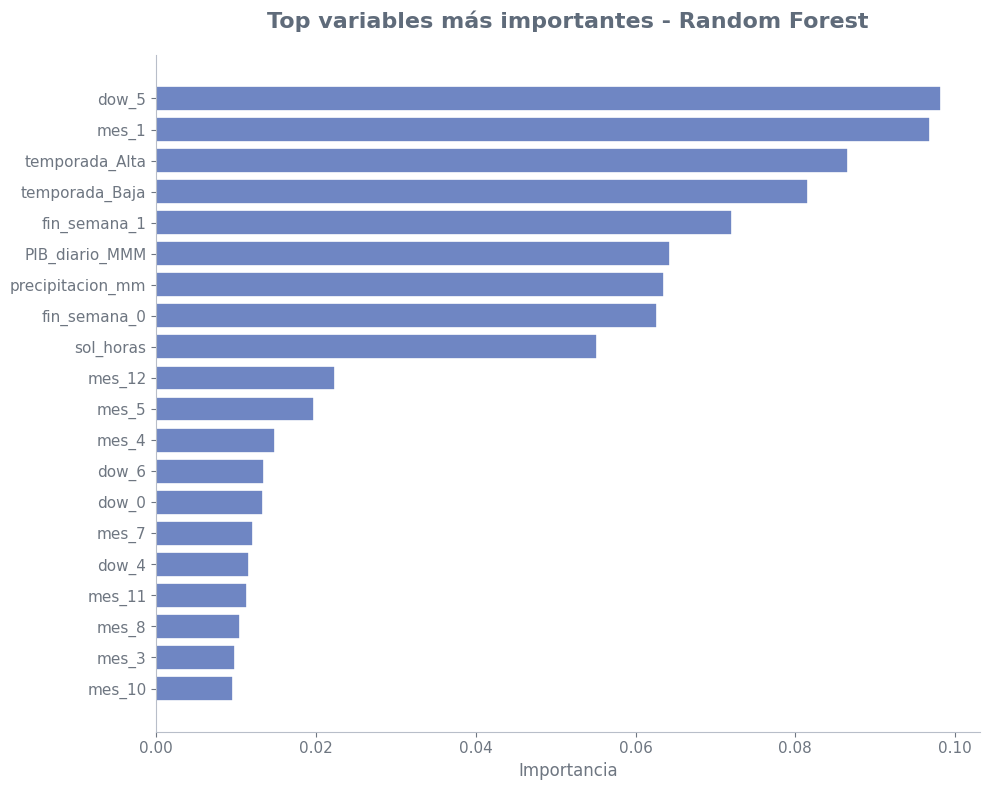

,variable,importance
10,dow_5,0.098215
12,mes_1,0.096829
3,temporada_Alta,0.086653
4,temporada_Baja,0.081545
56,fin_semana_1,0.072138
2,PIB_diario_MMM,0.064342
0,precipitacion_mm,0.063618
55,fin_semana_0,0.062724
1,sol_horas,0.055158
15,mes_12,0.022410


In [ ]:
# =========================================================
# Importancia de variables - Random Forest
# =========================================================
import pandas as pd
import matplotlib.pyplot as plt

# Colores del estilo usado en la presentación
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
azul = "#6F86C3"

importancias_rf = pd.DataFrame({
    "variable": X_train_final.columns,
    "importance": best_rf.feature_importances_
}).sort_values("importance", ascending=False)

top_n = 20
top_imp_rf = importancias_rf.head(top_n).sort_values("importance", ascending=True)

fig, ax = plt.subplots(figsize=(10, 8))

ax.barh(
    top_imp_rf["variable"],
    top_imp_rf["importance"],
    color=azul,
    edgecolor="white",
    linewidth=1.2
)

ax.set_title(
    "Top variables más importantes - Random Forest",
    fontsize=16,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("Importancia", fontsize=12, color=gris_texto)
ax.set_ylabel("")

ax.tick_params(axis="x", labelsize=11, colors=gris_texto)
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

plt.tight_layout()
plt.show()

importancias_rf.head(20)

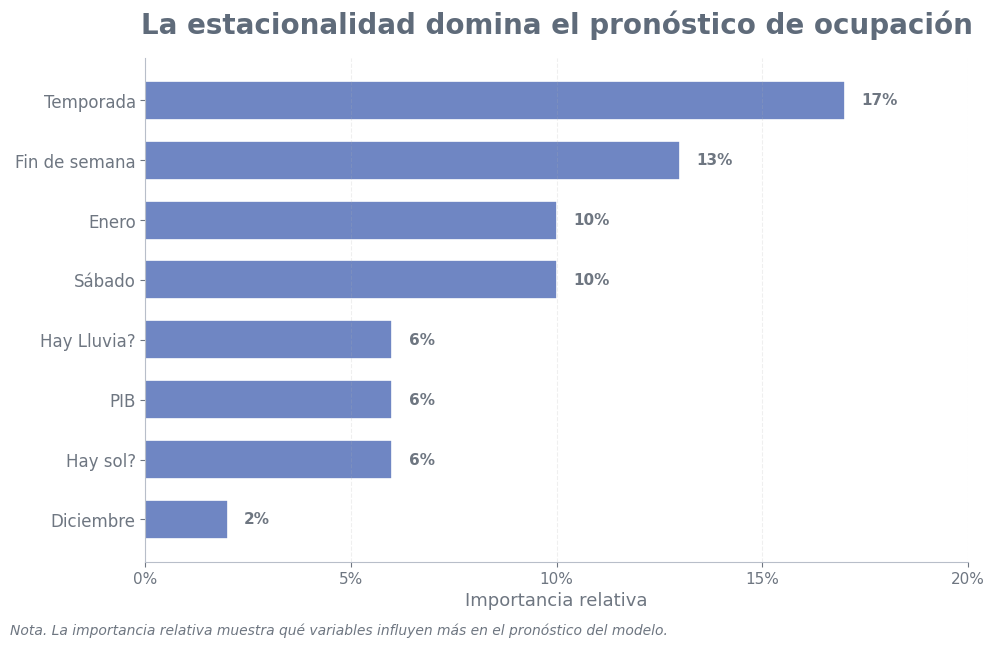

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Base de datos
# =========================================================
df_imp = pd.DataFrame({
    "variable": [
        "Temporada",
        "Fin de semana",
        "Sábado",
        "Enero",
        "PIB",
        "Hay Lluvia?",
        "Hay sol?",
        "Diciembre"
    ],
    "importancia": [0.17, 0.13, 0.10, 0.10, 0.06, 0.06, 0.06, 0.02]
})

# Ordenar de menor a mayor para gráfico horizontal
df_imp = df_imp.sort_values("importancia", ascending=True)

# =========================================================
# 2. Colores
# =========================================================
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
azul = "#6F86C3"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(10, 6.5))

bars = ax.barh(
    df_imp["variable"],
    df_imp["importancia"],
    color=azul,
    edgecolor="white",
    linewidth=1.2,
    height=0.65
)

# Etiquetas al final de cada barra
for bar, value in zip(bars, df_imp["importancia"]):
    ax.text(
        value + 0.004,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.0%}",
        va="center",
        ha="left",
        fontsize=11,
        color=gris_texto,
        fontweight="bold"
    )

# =========================================================
# 4. Estilo
# =========================================================
ax.set_title(
    "La estacionalidad domina el pronóstico de ocupación",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_xlabel("Importancia relativa", fontsize=13, color=gris_texto)
ax.set_ylabel("")

ax.tick_params(axis="x", labelsize=11, colors=gris_texto)
ax.tick_params(axis="y", labelsize=12, colors=gris_texto)

# Formato eje X
ax.set_xlim(0, 0.20)
ax.set_xticks([0, 0.05, 0.10, 0.15, 0.20])
ax.set_xticklabels(["0%", "5%", "10%", "15%", "20%"])

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

# Grid suave
ax.grid(axis="x", linestyle="--", alpha=0.20)

# Nota al pie
fig.text(
    0.01,
    0.01,
    "Nota. La importancia relativa muestra qué variables influyen más en el pronóstico del modelo.",
    ha="left",
    va="bottom",
    fontsize=10,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

## Mestricas de desempeño mensuales

In [ ]:
# =========================================================
# 1. Construir base de resultados
# =========================================================
df_train_results_rf = pd.DataFrame({
    "fecha": fecha_train.values,
    "ocupacion_real": y_train.values,
    "ocupacion_pred": y_pred_train_rf
})

df_test_results_rf = pd.DataFrame({
    "fecha": fecha_test.values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_pred_test_rf
})

In [ ]:
# =========================================================
# 2. Preparar fechas
# =========================================================
df_train_results_rf["fecha"] = pd.to_datetime(df_train_results_rf["fecha"])
df_test_results_rf["fecha"] = pd.to_datetime(df_test_results_rf["fecha"])

df_train_results_rf["mes"] = df_train_results_rf["fecha"].dt.to_period("M")
df_test_results_rf["mes"] = df_test_results_rf["fecha"].dt.to_period("M")

df_train_results_rf["dias_mes"] = df_train_results_rf["fecha"].dt.days_in_month
df_test_results_rf["dias_mes"] = df_test_results_rf["fecha"].dt.days_in_month

In [ ]:
# =========================================================
# 3. Convertir ocupación a personas
# =========================================================
capacidad_personas = 146

df_train_results_rf["personas_real"] = (
    df_train_results_rf["ocupacion_real"] * capacidad_personas
)

df_train_results_rf["personas_pred"] = (
    df_train_results_rf["ocupacion_pred"] * capacidad_personas
)

df_test_results_rf["personas_real"] = (
    df_test_results_rf["ocupacion_real"] * capacidad_personas
)

df_test_results_rf["personas_pred"] = (
    df_test_results_rf["ocupacion_pred"] * capacidad_personas
)

In [ ]:
# =========================================================
# 4. Agregación mensual
# =========================================================
train_monthly_rf = (
    df_train_results_rf
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

test_monthly_rf = (
    df_test_results_rf
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

In [ ]:
# =========================================================
# 5. Calcular ocupación mensual
# =========================================================
train_monthly_rf["ocupacion_real_mensual"] = (
    train_monthly_rf["personas_real"] /
    (train_monthly_rf["dias_mes"] * capacidad_personas)
)

train_monthly_rf["ocupacion_pred_mensual"] = (
    train_monthly_rf["personas_pred"] /
    (train_monthly_rf["dias_mes"] * capacidad_personas)
)

test_monthly_rf["ocupacion_real_mensual"] = (
    test_monthly_rf["personas_real"] /
    (test_monthly_rf["dias_mes"] * capacidad_personas)
)

test_monthly_rf["ocupacion_pred_mensual"] = (
    test_monthly_rf["personas_pred"] /
    (test_monthly_rf["dias_mes"] * capacidad_personas)
)

In [ ]:
# =========================================================
# 6. Variables métricas
# =========================================================
y_train_m_rf = train_monthly_rf["ocupacion_real_mensual"].values
y_train_pred_m_rf = train_monthly_rf["ocupacion_pred_mensual"].values

y_test_m_rf = test_monthly_rf["ocupacion_real_mensual"].values
y_test_pred_m_rf = test_monthly_rf["ocupacion_pred_mensual"].values

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

mae_train_m_rf = mean_absolute_error(y_train_m_rf, y_train_pred_m_rf)
mse_train_m_rf = mean_squared_error(y_train_m_rf, y_train_pred_m_rf)
rmse_train_m_rf = np.sqrt(mse_train_m_rf)
r2_train_m_rf = r2_score(y_train_m_rf, y_train_pred_m_rf)

mae_test_m_rf = mean_absolute_error(y_test_m_rf, y_test_pred_m_rf)
mse_test_m_rf = mean_squared_error(y_test_m_rf, y_test_pred_m_rf)
rmse_test_m_rf = np.sqrt(mse_test_m_rf)
r2_test_m_rf = r2_score(y_test_m_rf, y_test_pred_m_rf)

mape_train_m_rf = mean_absolute_percentage_error(
    y_train_m_rf,
    y_train_pred_m_rf
)

mape_test_m_rf = mean_absolute_percentage_error(
    y_test_m_rf,
    y_test_pred_m_rf
)

In [ ]:
print("Random Forest - Métricas Mensuales")

print(f"Train MAE mensual: {mae_train_m_rf}")
print(f"Test MAE mensual: {mae_test_m_rf}")

print(f"Train MSE mensual: {mse_train_m_rf}")
print(f"Test MSE mensual: {mse_test_m_rf}")

print(f"Train RMSE mensual: {rmse_train_m_rf}")
print(f"Test RMSE mensual: {rmse_test_m_rf}")

print(f"Train MAPE mensual: {mape_train_m_rf}")
print(f"Test MAPE mensual: {mape_test_m_rf}")

print(f"Train R² mensual: {r2_train_m_rf}")
print(f"Test R² mensual: {r2_test_m_rf}")

Random Forest - Métricas Mensuales
Train MAE mensual: 0.034001912463610263
Test MAE mensual: 0.06305809727168672
Train MSE mensual: 0.001775321763460075
Test MSE mensual: 0.007243955757125471
Train RMSE mensual: 0.04213456732256871
Test RMSE mensual: 0.08511143141273957
Train MAPE mensual: 0.1037194463185472
Test MAPE mensual: 0.12936499785035208
Train R² mensual: 0.8909857353362541
Test R² mensual: -0.184110620150995


In [ ]:
train_monthly_rf.head(30)
test_monthly_rf.head(30)

,mes,personas_real,personas_pred,dias_mes,ocupacion_real_mensual,ocupacion_pred_mensual
0,2025-06,2061.0,1833.742594,30,0.470548,0.418663
1,2025-07,2099.0,2017.904973,31,0.463765,0.445847
2,2025-08,1998.0,1753.503980,31,0.441449,0.387429
3,2025-09,1573.0,1272.800246,30,0.359132,0.290594
4,2025-10,1894.0,1707.417800,31,0.418471,0.377247
5,2025-11,1731.0,1677.124860,30,0.395205,0.382905
6,2025-12,2820.0,1935.076653,31,0.623067,0.427547


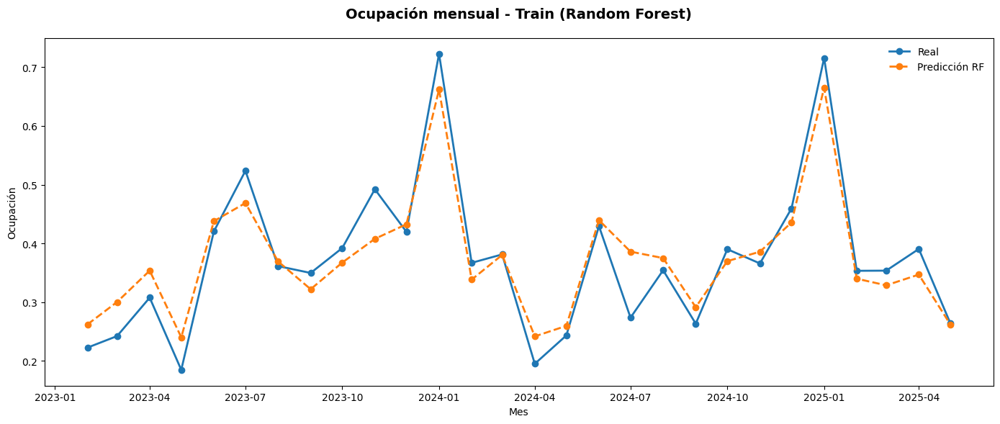

In [ ]:
import matplotlib.pyplot as plt

# =========================================================
# 1. Asegurar formato de fecha
# =========================================================
train_monthly_rf["mes"] = train_monthly_rf["mes"].dt.to_timestamp()

# =========================================================
# 2. Gráfico
# =========================================================
plt.figure(figsize=(14, 6))

plt.plot(
    train_monthly_rf["mes"],
    train_monthly_rf["ocupacion_real_mensual"],
    marker="o",
    linewidth=2,
    label="Real"
)

plt.plot(
    train_monthly_rf["mes"],
    train_monthly_rf["ocupacion_pred_mensual"],
    marker="o",
    linewidth=2,
    linestyle="--",
    label="Predicción RF"
)

# =========================================================
# 3. Formato
# =========================================================
plt.title(
    "Ocupación mensual - Train (Random Forest)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Mes")
plt.ylabel("Ocupación")

plt.legend(frameon=False)
plt.grid(False)

plt.tight_layout()
plt.show()

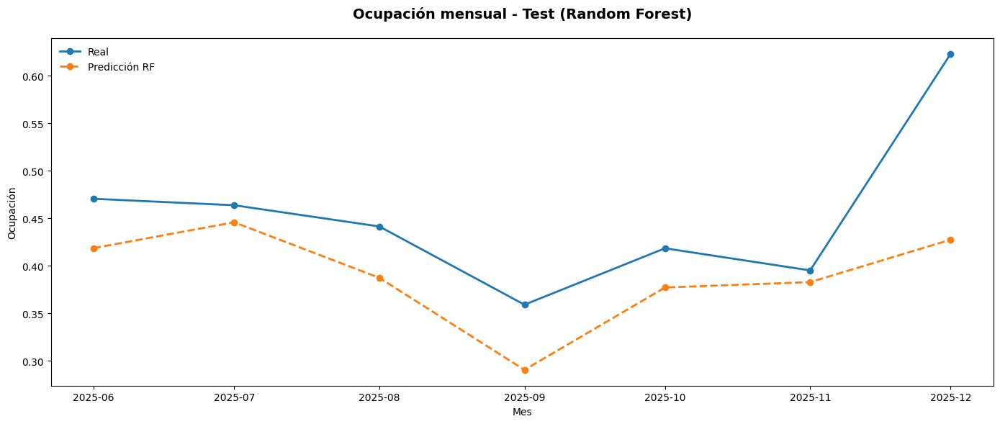

In [ ]:
import matplotlib.pyplot as plt

# =========================================================
# 1. Asegurar formato de fecha
# =========================================================
test_monthly_rf["mes"] = test_monthly_rf["mes"].dt.to_timestamp()

# =========================================================
# 2. Gráfico
# =========================================================
plt.figure(figsize=(14, 6))

plt.plot(
    test_monthly_rf["mes"],
    test_monthly_rf["ocupacion_real_mensual"],
    marker="o",
    linewidth=2,
    label="Real"
)

plt.plot(
    test_monthly_rf["mes"],
    test_monthly_rf["ocupacion_pred_mensual"],
    marker="o",
    linewidth=2,
    linestyle="--",
    label="Predicción RF"
)

# =========================================================
# 3. Formato
# =========================================================
plt.title(
    "Ocupación mensual - Test (Random Forest)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Mes")
plt.ylabel("Ocupación")

plt.legend(frameon=False)
plt.grid(False)

plt.tight_layout()
plt.show()

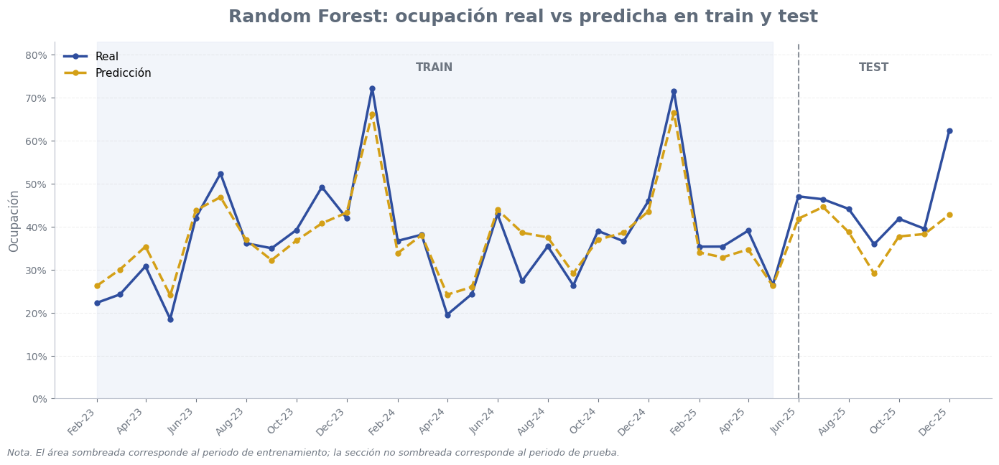

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 0. Nombre del modelo
# =========================================================
model_name = "Random Forest"

# =========================================================
# 1. Copias y preparación
# =========================================================
df_train = train_monthly_rf.copy()
df_test = test_monthly_rf.copy()

# Convertir "mes" a timestamp si viene como Period
if str(df_train["mes"].dtype).startswith("period"):
    df_train["mes"] = df_train["mes"].dt.to_timestamp()
else:
    df_train["mes"] = pd.to_datetime(df_train["mes"])

if str(df_test["mes"].dtype).startswith("period"):
    df_test["mes"] = df_test["mes"].dt.to_timestamp()
else:
    df_test["mes"] = pd.to_datetime(df_test["mes"])

df_train["periodo"] = "Train"
df_test["periodo"] = "Test"

# Unir train + test
df_plot = pd.concat([df_train, df_test], axis=0).sort_values("mes").reset_index(drop=True)

# Fecha de corte entre train y test
fecha_corte = df_test["mes"].min()

# =========================================================
# 2. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

# Sombrear periodo de train
ax.axvspan(
    df_train["mes"].min(),
    df_train["mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Línea real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.5,
    marker="o",
    markersize=5,
    label="Real",
    zorder=3
)

# Línea predicción
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=dorado,
    linewidth=2.5,
    linestyle="--",
    marker="o",
    markersize=5,
    label="Predicción",
    zorder=3
)

# Línea de separación Train/Test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 4. Etiquetas Train / Test
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["ocupacion_pred_mensual"].max()
)

ax.text(
    df_train["mes"].min() + (df_train["mes"].max() - df_train["mes"].min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    df_test["mes"].min() + (df_test["mes"].max() - df_test["mes"].min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 5. Eje X
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# =========================================================
# 6. Eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 7. Estilo general
# =========================================================
ax.set_title(
    f"{model_name}: ocupación real vs predicha en train y test",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(frameon=False, loc="upper left", fontsize=11)

ax.set_ylim(
    0,
    max(
        df_plot["ocupacion_real_mensual"].max(),
        df_plot["ocupacion_pred_mensual"].max()
    ) * 1.15
)

fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

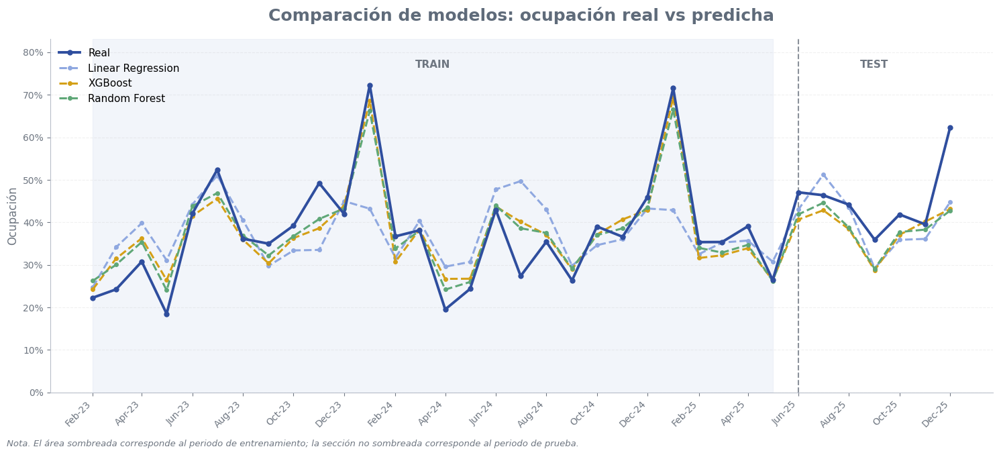

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 1. Función para preparar cada modelo
# =========================================================
def preparar_modelo(train_df, test_df, nombre_modelo):
    df_train = train_df.copy()
    df_test = test_df.copy()

    # Asegurar tipo fecha
    if str(df_train["mes"].dtype).startswith("period"):
        df_train["mes"] = df_train["mes"].dt.to_timestamp()
    else:
        df_train["mes"] = pd.to_datetime(df_train["mes"])

    if str(df_test["mes"].dtype).startswith("period"):
        df_test["mes"] = df_test["mes"].dt.to_timestamp()
    else:
        df_test["mes"] = pd.to_datetime(df_test["mes"])

    df_train["periodo"] = "Train"
    df_test["periodo"] = "Test"

    df_full = (
        pd.concat([df_train, df_test], axis=0)
        .sort_values("mes")
        .reset_index(drop=True)
    )

    df_full = df_full[["mes", "periodo", "ocupacion_real_mensual", "ocupacion_pred_mensual"]].copy()
    df_full = df_full.rename(columns={"ocupacion_pred_mensual": f"pred_{nombre_modelo}"})

    return df_full

# =========================================================
# 2. Preparar bases de cada modelo
# =========================================================
lr_full = preparar_modelo(lr_train_monthly, lr_test_monthly, "lr")
xgb_full = preparar_modelo(xgb_train_monthly, xgb_test_monthly, "xgb")
rf_full = preparar_modelo(train_monthly_rf, test_monthly_rf, "rf")

# =========================================================
# 3. Unir todo en una sola base
# =========================================================
df_plot = (
    lr_full
    .merge(xgb_full[["mes", "pred_xgb"]], on="mes", how="left")
    .merge(rf_full[["mes", "pred_rf"]], on="mes", how="left")
)

# Fecha de corte entre train y test
fecha_corte = df_plot.loc[df_plot["periodo"] == "Test", "mes"].min()

# =========================================================
# 4. Colores
# =========================================================
azul_oscuro = "#2F4E9E"   # Real
azul_claro = "#8FA8E0"    # Linear Regression
dorado = "#D4A017"        # XGBoost
verde = "#5FA777"         # Random Forest

gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 5. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(15, 6.8))

# Sombrear train
ax.axvspan(
    df_plot["mes"].min(),
    df_plot.loc[df_plot["periodo"] == "Train", "mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Serie real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.8,
    marker="o",
    markersize=5,
    label="Real",
    zorder=5
)

# Linear Regression
ax.plot(
    df_plot["mes"],
    df_plot["pred_lr"],
    color=azul_claro,
    linewidth=2.2,
    linestyle="--",
    marker="o",
    markersize=4,
    label="Linear Regression",
    zorder=4
)

# XGBoost
ax.plot(
    df_plot["mes"],
    df_plot["pred_xgb"],
    color=dorado,
    linewidth=2.2,
    linestyle="--",
    marker="o",
    markersize=4,
    label="XGBoost",
    zorder=4
)

# Random Forest
ax.plot(
    df_plot["mes"],
    df_plot["pred_rf"],
    color=verde,
    linewidth=2.2,
    linestyle="--",
    marker="o",
    markersize=4,
    label="Random Forest",
    zorder=4
)

# Línea de corte entre train y test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 6. Etiquetas TRAIN / TEST
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["pred_lr"].max(),
    df_plot["pred_xgb"].max(),
    df_plot["pred_rf"].max()
)

mes_train = df_plot.loc[df_plot["periodo"] == "Train", "mes"]
mes_test = df_plot.loc[df_plot["periodo"] == "Test", "mes"]

ax.text(
    mes_train.min() + (mes_train.max() - mes_train.min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    mes_test.min() + (mes_test.max() - mes_test.min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 7. Ejes
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 8. Estilo general
# =========================================================
ax.set_title(
    "Comparación de modelos: ocupación real vs predicha",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(
    frameon=False,
    loc="upper left",
    fontsize=11
)

ax.set_ylim(0, y_top * 1.15)

# Nota al pie
fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

# SARIMAX

In [ ]:
import pandas as pd
import numpy as np
import itertools
import warnings
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

warnings.filterwarnings("ignore")

In [ ]:
# =========================================================
# 1. Preparar base
# =========================================================
df = df_model.copy()

df["fecha_noche"] = pd.to_datetime(df["fecha_noche"], errors="coerce")
df = df.sort_values("fecha_noche").reset_index(drop=True)
df = df.set_index("fecha_noche")

In [ ]:
# =========================================================
# 2. Definir target y exógenas
# =========================================================
y = df["ocupacion"].copy()

# Exógenas reducidas para disminuir overfitting

vars_exog = [
    "precipitacion_mm",
    "sol_horas",
    "PIB_diario_MMM",
    "fin_semana",
    "temporada_num",
    "mes_sin",
    "mes_cos"
]

exog = df[vars_exog].copy()

In [ ]:
# =========================================================
# 3. Split Train / Test
# =========================================================
fecha_inicio_test = "2025-06-01"

y_train = y[y.index < fecha_inicio_test].copy()
y_test = y[y.index >= fecha_inicio_test].copy()

exog_train = exog.loc[y_train.index].copy()
exog_test = exog.loc[y_test.index].copy()

print("Train:", y_train.shape)
print("Test :", y_test.shape)

Train: (843,)
Test : (214,)


In [ ]:
# =========================================================
# 4. Limpiar nulos e infinitos
# =========================================================
y_train = y_train.replace([np.inf, -np.inf], np.nan)
y_test = y_test.replace([np.inf, -np.inf], np.nan)

exog_train = exog_train.replace([np.inf, -np.inf], np.nan)
exog_test = exog_test.replace([np.inf, -np.inf], np.nan)

idx_train_valid = exog_train.dropna().index.intersection(y_train.dropna().index)
idx_test_valid = exog_test.dropna().index.intersection(y_test.dropna().index)

y_train = y_train.loc[idx_train_valid]
exog_train = exog_train.loc[idx_train_valid]

y_test = y_test.loc[idx_test_valid]
exog_test = exog_test.loc[idx_test_valid]

print("Train limpio:", y_train.shape, exog_train.shape)
print("Test limpio :", y_test.shape, exog_test.shape)

Train limpio: (843,) (843, 7)
Test limpio : (214,) (214, 7)


In [ ]:
# =========================================================
# 5. Funciones de métricas
# =========================================================
def mape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

def metricas_modelo(y_true, y_pred, nombre="Modelo"):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape_val = mape(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"\nMétricas - {nombre}")
    print(f"MAE : {mae:.4f}")
    print(f"MSE : {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAPE: {mape_val:.4f}")
    print(f"R²  : {r2:.4f}")

    return {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape_val,
        "R2": r2
    }

## Grid Search

In [ ]:
# =========================================================
# 6. Grid Search SARIMAX reducido
# =========================================================
p_values = [0, 1]
d_values = [0, 1]
q_values = [0, 1]

P_values = [0, 1]
D_values = [0]
Q_values = [0]

s = 7
trend_values = ["n", "c"]

In [ ]:
# =========================================================
# 7. Búsqueda de modelos
# =========================================================
resultados = []
errores = []

total_combinaciones = (
    len(p_values) * len(d_values) * len(q_values) *
    len(P_values) * len(D_values) * len(Q_values) *
    len(trend_values)
)

print("Total combinaciones:", total_combinaciones)

contador = 0

for p, d, q in itertools.product(p_values, d_values, q_values):
    for P, D, Q in itertools.product(P_values, D_values, Q_values):
        for trend in trend_values:

            contador += 1
            print(
                f"Probando {contador}/{total_combinaciones}: "
                f"order=({p},{d},{q}), seasonal=({P},{D},{Q},{s}), trend={trend}"
            )

            try:
                model = SARIMAX(
                    endog=y_train,
                    exog=exog_train,
                    order=(p, d, q),
                    seasonal_order=(P, D, Q, s),
                    trend=trend,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )

                fitted = model.fit(disp=False)

                forecast_test = fitted.get_forecast(
                    steps=len(y_test),
                    exog=exog_test
                )

                pred_test = forecast_test.predicted_mean
                pred_test.index = y_test.index
                pred_test = np.clip(pred_test, 0, 1)

                rmse = np.sqrt(mean_squared_error(y_test, pred_test))
                mae = mean_absolute_error(y_test, pred_test)
                mape_val = mape(y_test, pred_test)
                r2 = r2_score(y_test, pred_test)

                resultados.append({
                    "order": (p, d, q),
                    "seasonal_order": (P, D, Q, s),
                    "trend": trend,
                    "rmse": rmse,
                    "mae": mae,
                    "mape": mape_val,
                    "r2": r2,
                    "aic": fitted.aic,
                    "bic": fitted.bic
                })

            except Exception as e:
                errores.append({
                    "order": (p, d, q),
                    "seasonal_order": (P, D, Q, s),
                    "trend": trend,
                    "error": str(e)
                })

Total combinaciones: 32
Probando 1/32: order=(0,0,0), seasonal=(0,0,0,7), trend=n
Probando 2/32: order=(0,0,0), seasonal=(0,0,0,7), trend=c
Probando 3/32: order=(0,0,0), seasonal=(1,0,0,7), trend=n
Probando 4/32: order=(0,0,0), seasonal=(1,0,0,7), trend=c
Probando 5/32: order=(0,0,1), seasonal=(0,0,0,7), trend=n
Probando 6/32: order=(0,0,1), seasonal=(0,0,0,7), trend=c
Probando 7/32: order=(0,0,1), seasonal=(1,0,0,7), trend=n
Probando 8/32: order=(0,0,1), seasonal=(1,0,0,7), trend=c
Probando 9/32: order=(0,1,0), seasonal=(0,0,0,7), trend=n
Probando 10/32: order=(0,1,0), seasonal=(0,0,0,7), trend=c
Probando 11/32: order=(0,1,0), seasonal=(1,0,0,7), trend=n
Probando 12/32: order=(0,1,0), seasonal=(1,0,0,7), trend=c
Probando 13/32: order=(0,1,1), seasonal=(0,0,0,7), trend=n
Probando 14/32: order=(0,1,1), seasonal=(0,0,0,7), trend=c
Probando 15/32: order=(0,1,1), seasonal=(1,0,0,7), trend=n
Probando 16/32: order=(0,1,1), seasonal=(1,0,0,7), trend=c
Probando 17/32: order=(1,0,0), seasonal=(

In [ ]:
# =========================================================
# 8. Revisar resultados
# =========================================================
print("Número de modelos exitosos:", len(resultados))
print("Número de modelos con error:", len(errores))

if len(errores) > 0:
    errores_df = pd.DataFrame(errores)
    print("\nPrimeros errores:")
    print(errores_df.head())

if len(resultados) == 0:
    raise ValueError("No hubo combinaciones exitosas en SARIMAX. Revisa errores_df.")

Número de modelos exitosos: 32
Número de modelos con error: 0


In [ ]:
# =========================================================
# 9. Seleccionar mejor modelo (por MAPE)
# =========================================================
resultados_df = pd.DataFrame(resultados)

resultados_df = resultados_df.sort_values(["mape", "rmse"]).reset_index(drop=True)

print("Top 10 mejores combinaciones (por MAPE):")
print(resultados_df.head(10))

print("\nResumen top 5:")
print(resultados_df.head(5)[["order", "seasonal_order", "trend", "mape", "rmse", "r2", "aic"]])

best_row = resultados_df.iloc[0]

best_order = best_row["order"]
best_seasonal = best_row["seasonal_order"]
best_trend = best_row["trend"]

print("\nMejor combinación encontrada (por MAPE):")
print("order:", best_order)
print("seasonal_order:", best_seasonal)
print("trend:", best_trend)
print("MAPE:", best_row["mape"])

Top 10 mejores combinaciones (por MAPE):
       order seasonal_order trend      rmse       mae      mape        r2  \
0  (1, 1, 1)   (0, 0, 0, 7)     n  0.231096  0.184250  0.475434  0.201554   
1  (1, 1, 1)   (1, 0, 0, 7)     c  0.228234  0.181873  0.489975  0.221207   
2  (0, 1, 0)   (1, 0, 0, 7)     n  0.240090  0.185168  0.491626  0.138196   
3  (1, 1, 1)   (0, 0, 0, 7)     c  0.220947  0.179945  0.507623  0.270145   
4  (1, 0, 1)   (1, 0, 0, 7)     n  0.219759  0.180011  0.519002  0.277973   
5  (1, 0, 1)   (0, 0, 0, 7)     n  0.219293  0.180041  0.523653  0.281028   
6  (1, 0, 1)   (1, 0, 0, 7)     c  0.216929  0.178848  0.528581  0.296449   
7  (0, 0, 0)   (0, 0, 0, 7)     n  0.217701  0.179583  0.529072  0.291432   
8  (0, 0, 0)   (1, 0, 0, 7)     n  0.218201  0.180067  0.529542  0.288172   
9  (0, 0, 0)   (0, 0, 0, 7)     c  0.217663  0.179532  0.529802  0.291680   

          aic         bic  
0 -454.649293 -407.315274  
1 -515.234128 -458.519327  
2 -322.934965 -280.388080  

In [ ]:
# =========================================================
# 10. Entrenar mejor modelo final
# =========================================================
best_model = SARIMAX(
    endog=y_train,
    exog=exog_train,
    order=best_order,
    seasonal_order=best_seasonal,
    trend=best_trend,
    enforce_stationarity=False,
    enforce_invertibility=False
)

best_results = best_model.fit(disp=False)

In [ ]:
# =========================================================
# 11. Predicciones
# =========================================================
y_pred_train = best_results.fittedvalues.copy()
y_pred_train.index = y_train.index
y_pred_train = np.clip(y_pred_train, 0, 1)

forecast_test = best_results.get_forecast(
    steps=len(y_test),
    exog=exog_test
)

y_pred_test = forecast_test.predicted_mean
y_pred_test.index = y_test.index
y_pred_test = np.clip(y_pred_test, 0, 1)

In [ ]:
# =========================================================
# 12. Métricas
# =========================================================
metricas_train_sarimax = metricas_modelo(y_train, y_pred_train, "SARIMAX Train")
metricas_test_sarimax = metricas_modelo(y_test, y_pred_test, "SARIMAX Test")


Métricas - SARIMAX Train
MAE : 0.1375
MSE : 0.0332
RMSE: 0.1821
MAPE: 0.6573
R²  : 0.5312

Métricas - SARIMAX Test
MAE : 0.1842
MSE : 0.0534
RMSE: 0.2311
MAPE: 0.4754
R²  : 0.2016


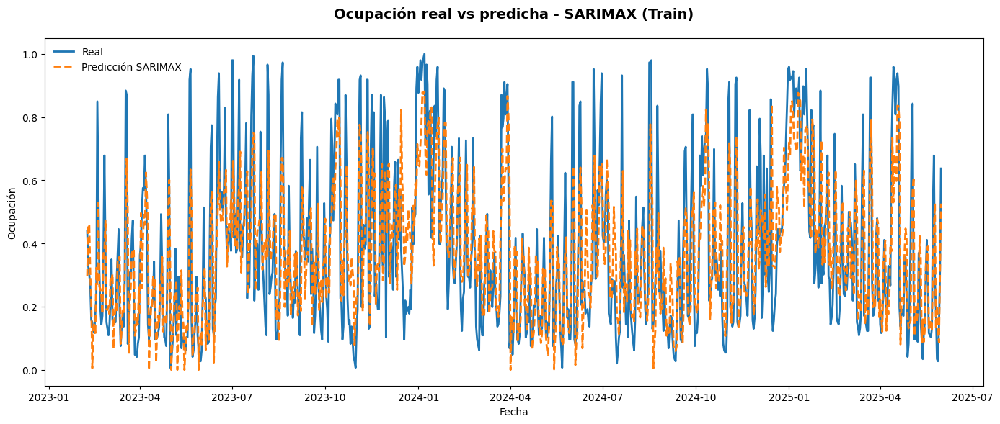

In [ ]:
# =========================================================
# 13. Serie temporal Train
# =========================================================
df_result_train_sarimax = pd.DataFrame({
    "fecha_noche": y_train.index,
    "real": y_train.values,
    "pred": y_pred_train.values
})

plt.figure(figsize=(14, 6))

plt.plot(
    df_result_train_sarimax["fecha_noche"],
    df_result_train_sarimax["real"],
    label="Real",
    linewidth=2
)

plt.plot(
    df_result_train_sarimax["fecha_noche"],
    df_result_train_sarimax["pred"],
    label="Predicción SARIMAX",
    linewidth=2,
    linestyle="--"
)

plt.title(
    "Ocupación real vs predicha - SARIMAX (Train)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.legend(frameon=False)
plt.grid(False)
plt.tight_layout()
plt.show()

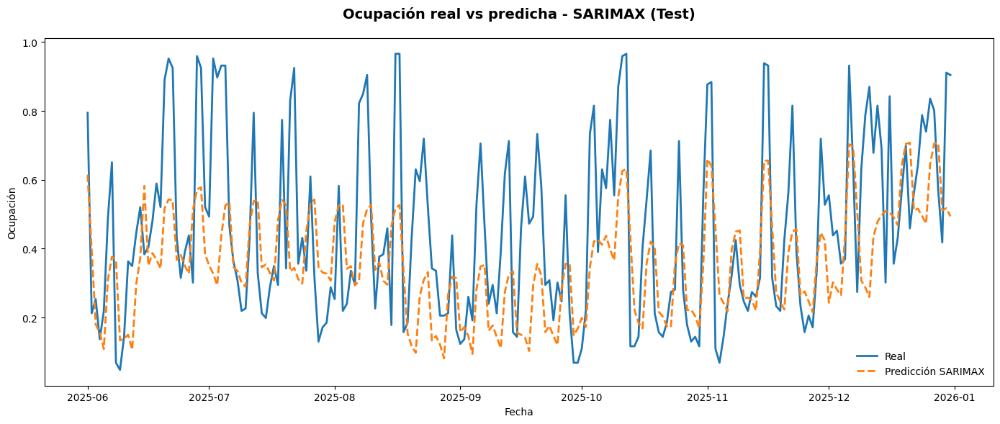

In [ ]:
# =========================================================
# 14. Serie temporal Test
# =========================================================
df_result_test_sarimax = pd.DataFrame({
    "fecha_noche": y_test.index,
    "real": y_test.values,
    "pred": y_pred_test.values
})

plt.figure(figsize=(14, 6))

plt.plot(
    df_result_test_sarimax["fecha_noche"],
    df_result_test_sarimax["real"],
    label="Real",
    linewidth=2
)

plt.plot(
    df_result_test_sarimax["fecha_noche"],
    df_result_test_sarimax["pred"],
    label="Predicción SARIMAX",
    linewidth=2,
    linestyle="--"
)

plt.title(
    "Ocupación real vs predicha - SARIMAX (Test)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Fecha")
plt.ylabel("Ocupación")
plt.legend(frameon=False)
plt.grid(False)
plt.tight_layout()
plt.show()

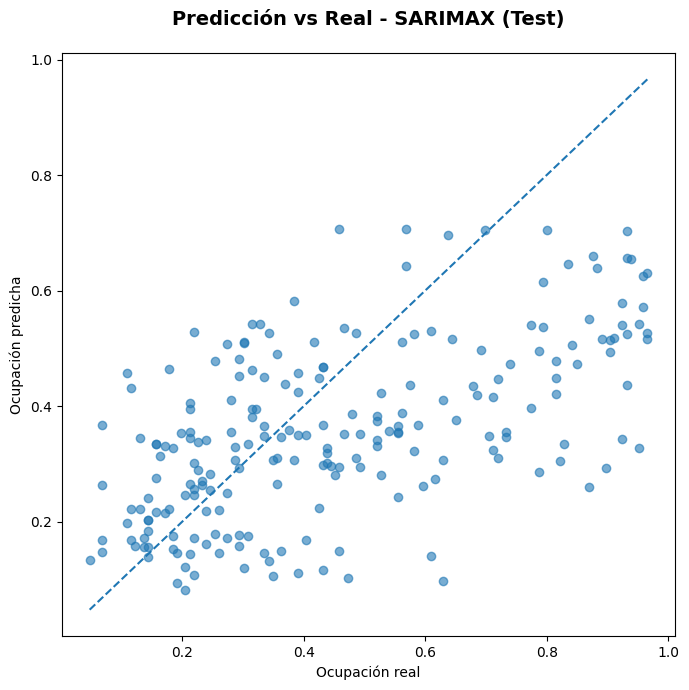

In [ ]:
# =========================================================
# 15. Scatter Real vs Predicción
# =========================================================
plt.figure(figsize=(7, 7))

plt.scatter(y_test, y_pred_test, alpha=0.6)

min_val = min(y_test.min(), y_pred_test.min())
max_val = max(y_test.max(), y_pred_test.max())

plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    linestyle="--",
    linewidth=1.5
)

plt.title(
    "Predicción vs Real - SARIMAX (Test)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Ocupación real")
plt.ylabel("Ocupación predicha")
plt.grid(False)
plt.tight_layout()
plt.show()

In [ ]:
# =========================================================
# 16. Resumen del mejor modelo
# =========================================================
print(best_results.summary())

                               SARIMAX Results                                
Dep. Variable:              ocupacion   No. Observations:                  843
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 237.325
Date:                Wed, 29 Apr 2026   AIC                           -454.649
Time:                        21:00:58   BIC                           -407.315
Sample:                             0   HQIC                          -436.508
                                - 843                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
precipitacion_mm    -0.0013      0.001     -1.269      0.204      -0.003       0.001
sol_horas            0.0005      0.003      0.148      0.883      -0.006       0.007
PIB_diario_MMM       0.0017 

## Metricas de desempeño mensuales

In [ ]:
# =========================================================
# 17. Construir base de resultados mensuales
# =========================================================
df_train_results_sarimax = pd.DataFrame({
    "fecha": y_train.index.values,
    "ocupacion_real": y_train.values,
    "ocupacion_pred": y_pred_train.values
})

df_test_results_sarimax = pd.DataFrame({
    "fecha": y_test.index.values,
    "ocupacion_real": y_test.values,
    "ocupacion_pred": y_pred_test.values
})

In [ ]:
# =========================================================
# 18. Preparar fechas
# =========================================================
df_train_results_sarimax["fecha"] = pd.to_datetime(df_train_results_sarimax["fecha"])
df_test_results_sarimax["fecha"] = pd.to_datetime(df_test_results_sarimax["fecha"])

df_train_results_sarimax["mes"] = df_train_results_sarimax["fecha"].dt.to_period("M")
df_test_results_sarimax["mes"] = df_test_results_sarimax["fecha"].dt.to_period("M")

df_train_results_sarimax["dias_mes"] = df_train_results_sarimax["fecha"].dt.days_in_month
df_test_results_sarimax["dias_mes"] = df_test_results_sarimax["fecha"].dt.days_in_month

In [ ]:
# =========================================================
# 19. Convertir ocupación a personas
# =========================================================
capacidad_personas = 146

df_train_results_sarimax["personas_real"] = (
    df_train_results_sarimax["ocupacion_real"] * capacidad_personas
)

df_train_results_sarimax["personas_pred"] = (
    df_train_results_sarimax["ocupacion_pred"] * capacidad_personas
)

df_test_results_sarimax["personas_real"] = (
    df_test_results_sarimax["ocupacion_real"] * capacidad_personas
)

df_test_results_sarimax["personas_pred"] = (
    df_test_results_sarimax["ocupacion_pred"] * capacidad_personas
)

In [ ]:
# =========================================================
# 20. Agregación mensual
# =========================================================
train_monthly_sarimax = (
    df_train_results_sarimax
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

test_monthly_sarimax = (
    df_test_results_sarimax
    .groupby("mes", as_index=False)
    .agg(
        personas_real=("personas_real", "sum"),
        personas_pred=("personas_pred", "sum"),
        dias_mes=("dias_mes", "first")
    )
)

In [ ]:
# =========================================================
# 21. Calcular ocupación mensual
# =========================================================
train_monthly_sarimax["ocupacion_real_mensual"] = (
    train_monthly_sarimax["personas_real"] /
    (train_monthly_sarimax["dias_mes"] * capacidad_personas)
)

train_monthly_sarimax["ocupacion_pred_mensual"] = (
    train_monthly_sarimax["personas_pred"] /
    (train_monthly_sarimax["dias_mes"] * capacidad_personas)
)

test_monthly_sarimax["ocupacion_real_mensual"] = (
    test_monthly_sarimax["personas_real"] /
    (test_monthly_sarimax["dias_mes"] * capacidad_personas)
)

test_monthly_sarimax["ocupacion_pred_mensual"] = (
    test_monthly_sarimax["personas_pred"] /
    (test_monthly_sarimax["dias_mes"] * capacidad_personas)
)

In [ ]:
# =========================================================
# 22. Variables métricas
# =========================================================
y_train_m_sarimax = train_monthly_sarimax["ocupacion_real_mensual"].values
y_train_pred_m_sarimax = train_monthly_sarimax["ocupacion_pred_mensual"].values

y_test_m_sarimax = test_monthly_sarimax["ocupacion_real_mensual"].values
y_test_pred_m_sarimax = test_monthly_sarimax["ocupacion_pred_mensual"].values

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]))

mae_train_m_sarimax = mean_absolute_error(y_train_m_sarimax, y_train_pred_m_sarimax)
mse_train_m_sarimax = mean_squared_error(y_train_m_sarimax, y_train_pred_m_sarimax)
rmse_train_m_sarimax = np.sqrt(mse_train_m_sarimax)
r2_train_m_sarimax = r2_score(y_train_m_sarimax, y_train_pred_m_sarimax)

mae_test_m_sarimax = mean_absolute_error(y_test_m_sarimax, y_test_pred_m_sarimax)
mse_test_m_sarimax = mean_squared_error(y_test_m_sarimax, y_test_pred_m_sarimax)
rmse_test_m_sarimax = np.sqrt(mse_test_m_sarimax)
r2_test_m_sarimax = r2_score(y_test_m_sarimax, y_test_pred_m_sarimax)

mape_train_m_sarimax = mean_absolute_percentage_error(
    y_train_m_sarimax,
    y_train_pred_m_sarimax
)

mape_test_m_sarimax = mean_absolute_percentage_error(
    y_test_m_sarimax,
    y_test_pred_m_sarimax
)

print("SARIMAX - Métricas Mensuales")

print(f"Train MAE mensual: {mae_train_m_sarimax}")
print(f"Test MAE mensual: {mae_test_m_sarimax}")

print(f"Train MSE mensual: {mse_train_m_sarimax}")
print(f"Test MSE mensual: {mse_test_m_sarimax}")

print(f"Train RMSE mensual: {rmse_train_m_sarimax}")
print(f"Test RMSE mensual: {rmse_test_m_sarimax}")

print(f"Train MAPE mensual: {mape_train_m_sarimax}")
print(f"Test MAPE mensual: {mape_test_m_sarimax}")

print(f"Train R² mensual: {r2_train_m_sarimax}")
print(f"Test R² mensual: {r2_test_m_sarimax}")

SARIMAX - Métricas Mensuales
Train MAE mensual: 0.029156808026874766
Test MAE mensual: 0.09594864393406596
Train MSE mensual: 0.0012857432852723329
Test MSE mensual: 0.010669824548155992
Train RMSE mensual: 0.03585726265726837
Test RMSE mensual: 0.10329484279554324
Train MAPE mensual: 0.07780713737647438
Test MAPE mensual: 0.21478157862617583
Train R² mensual: 0.9210484760142106
Test R² mensual: -0.7441095702705944


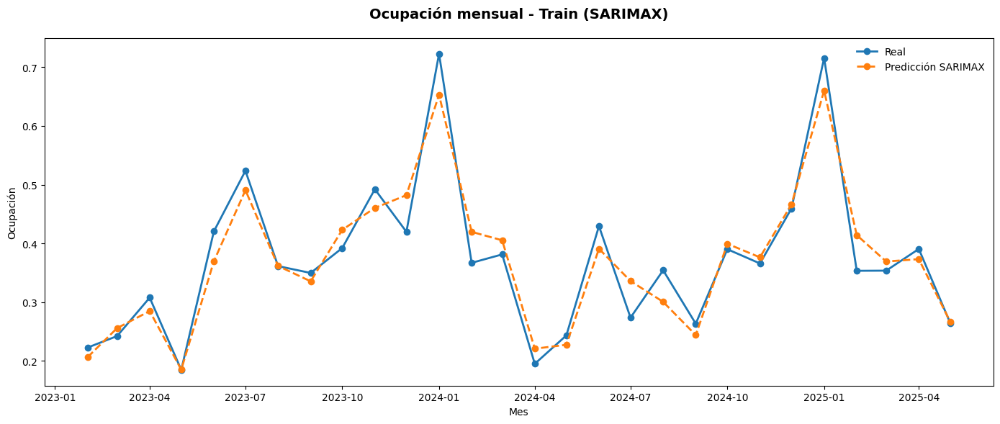

In [ ]:
# =========================================================
# 23. Gráfico Train mensual
# =========================================================
train_monthly_sarimax["mes"] = train_monthly_sarimax["mes"].dt.to_timestamp()

plt.figure(figsize=(14, 6))

plt.plot(
    train_monthly_sarimax["mes"],
    train_monthly_sarimax["ocupacion_real_mensual"],
    marker="o",
    linewidth=2,
    label="Real"
)

plt.plot(
    train_monthly_sarimax["mes"],
    train_monthly_sarimax["ocupacion_pred_mensual"],
    marker="o",
    linewidth=2,
    linestyle="--",
    label="Predicción SARIMAX"
)

plt.title(
    "Ocupación mensual - Train (SARIMAX)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Mes")
plt.ylabel("Ocupación")

plt.legend(frameon=False)
plt.grid(False)

plt.tight_layout()
plt.show()

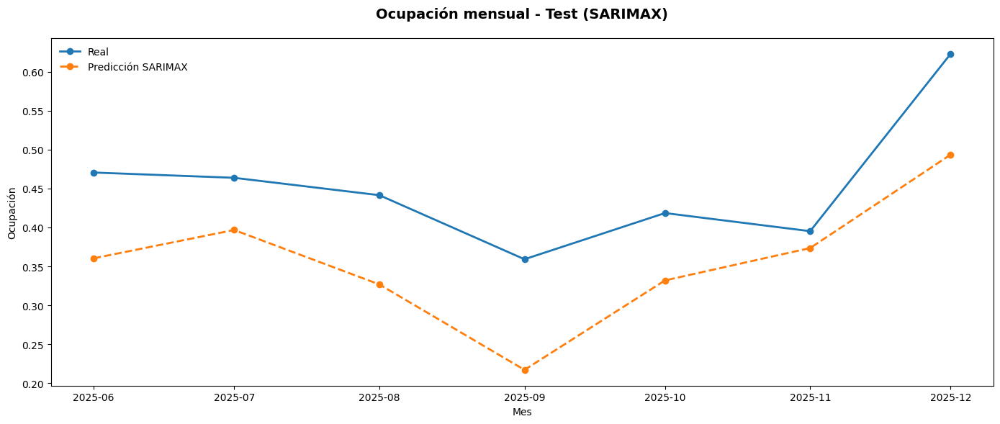

In [ ]:
# =========================================================
# 24. Gráfico Test mensual
# =========================================================
test_monthly_sarimax["mes"] = test_monthly_sarimax["mes"].dt.to_timestamp()

plt.figure(figsize=(14, 6))

plt.plot(
    test_monthly_sarimax["mes"],
    test_monthly_sarimax["ocupacion_real_mensual"],
    marker="o",
    linewidth=2,
    label="Real"
)

plt.plot(
    test_monthly_sarimax["mes"],
    test_monthly_sarimax["ocupacion_pred_mensual"],
    marker="o",
    linewidth=2,
    linestyle="--",
    label="Predicción SARIMAX"
)

plt.title(
    "Ocupación mensual - Test (SARIMAX)",
    fontsize=14,
    fontweight="bold",
    pad=20
)

plt.xlabel("Mes")
plt.ylabel("Ocupación")

plt.legend(frameon=False)
plt.grid(False)

plt.tight_layout()
plt.show()

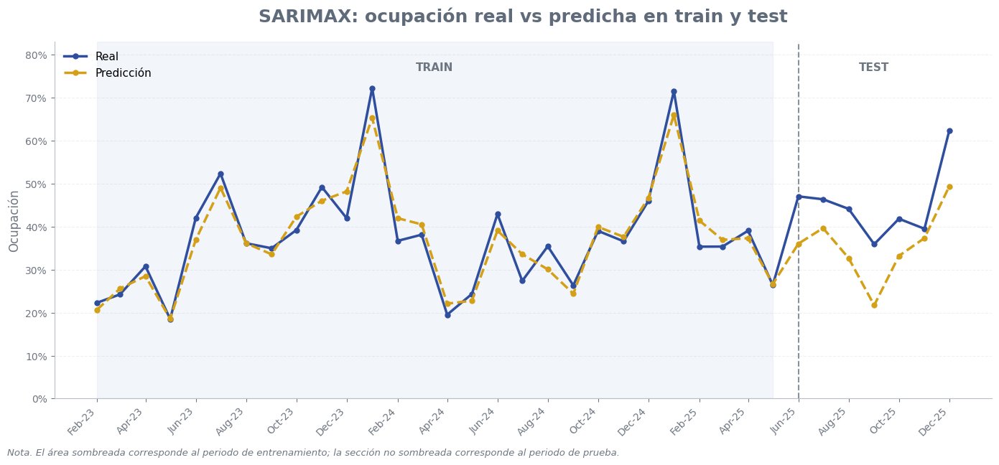

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 0. Nombre del modelo
# =========================================================
model_name = "SARIMAX"

# =========================================================
# 1. Copias y preparación
# =========================================================
df_train = train_monthly_sarimax.copy()
df_test = test_monthly_sarimax.copy()

# Convertir "mes" a timestamp si viene como Period
if str(df_train["mes"].dtype).startswith("period"):
    df_train["mes"] = df_train["mes"].dt.to_timestamp()
else:
    df_train["mes"] = pd.to_datetime(df_train["mes"])

if str(df_test["mes"].dtype).startswith("period"):
    df_test["mes"] = df_test["mes"].dt.to_timestamp()
else:
    df_test["mes"] = pd.to_datetime(df_test["mes"])

df_train["periodo"] = "Train"
df_test["periodo"] = "Test"

# Unir train + test
df_plot = pd.concat([df_train, df_test], axis=0).sort_values("mes").reset_index(drop=True)

# Fecha de corte entre train y test
fecha_corte = df_test["mes"].min()

# =========================================================
# 2. Colores
# =========================================================
azul_oscuro = "#2F4E9E"
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

# Sombrear periodo de train
ax.axvspan(
    df_train["mes"].min(),
    df_train["mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Línea real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.5,
    marker="o",
    markersize=5,
    label="Real",
    zorder=3
)

# Línea predicción
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=dorado,
    linewidth=2.5,
    linestyle="--",
    marker="o",
    markersize=5,
    label="Predicción",
    zorder=3
)

# Línea de separación Train/Test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 4. Etiquetas Train / Test
# =========================================================
y_top = max(
    df_plot["ocupacion_real_mensual"].max(),
    df_plot["ocupacion_pred_mensual"].max()
)

ax.text(
    df_train["mes"].min() + (df_train["mes"].max() - df_train["mes"].min()) / 2,
    y_top * 1.05,
    "TRAIN",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    df_test["mes"].min() + (df_test["mes"].max() - df_test["mes"].min()) / 2,
    y_top * 1.05,
    "TEST",
    ha="center",
    va="bottom",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 5. Eje X
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# =========================================================
# 6. Eje Y
# =========================================================
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 7. Estilo general
# =========================================================
ax.set_title(
    f"{model_name}: ocupación real vs predicha en train y test",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(frameon=False, loc="upper left", fontsize=11)

ax.set_ylim(
    0,
    max(
        df_plot["ocupacion_real_mensual"].max(),
        df_plot["ocupacion_pred_mensual"].max()
    ) * 1.15
)

fig.text(
    0.01,
    0.01,
    "Nota. El área sombreada corresponde al periodo de entrenamiento; la sección no sombreada corresponde al periodo de prueba.",
    ha="left",
    va="bottom",
    fontsize=9.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

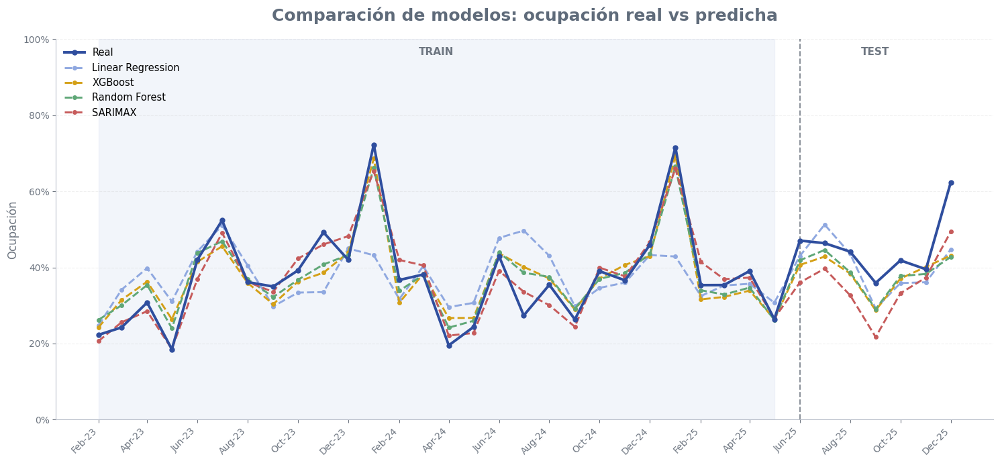

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick

# =========================================================
# 1. Función para preparar cada modelo
# =========================================================
def preparar_modelo(train_df, test_df, nombre_modelo):
    df_train = train_df.copy()
    df_test = test_df.copy()

    # Asegurar tipo fecha
    if str(df_train["mes"].dtype).startswith("period"):
        df_train["mes"] = df_train["mes"].dt.to_timestamp()
    else:
        df_train["mes"] = pd.to_datetime(df_train["mes"])

    if str(df_test["mes"].dtype).startswith("period"):
        df_test["mes"] = df_test["mes"].dt.to_timestamp()
    else:
        df_test["mes"] = pd.to_datetime(df_test["mes"])

    df_train["periodo"] = "Train"
    df_test["periodo"] = "Test"

    df_full = (
        pd.concat([df_train, df_test], axis=0)
        .sort_values("mes")
        .reset_index(drop=True)
    )

    df_full = df_full[
        ["mes", "periodo", "ocupacion_real_mensual", "ocupacion_pred_mensual"]
    ].copy()

    df_full = df_full.rename(
        columns={"ocupacion_pred_mensual": f"pred_{nombre_modelo}"}
    )

    return df_full

# =========================================================
# 2. Preparar bases de cada modelo
# =========================================================
lr_full = preparar_modelo(lr_train_monthly, lr_test_monthly, "lr")
xgb_full = preparar_modelo(xgb_train_monthly, xgb_test_monthly, "xgb")
rf_full = preparar_modelo(train_monthly_rf, test_monthly_rf, "rf")
sarimax_full = preparar_modelo(train_monthly_sarimax, test_monthly_sarimax, "sarimax")

# =========================================================
# 3. Unir todo en una sola base
# =========================================================
df_plot = (
    lr_full
    .merge(xgb_full[["mes", "pred_xgb"]], on="mes", how="left")
    .merge(rf_full[["mes", "pred_rf"]], on="mes", how="left")
    .merge(sarimax_full[["mes", "pred_sarimax"]], on="mes", how="left")
)

# Fecha de corte entre train y test
fecha_corte = df_plot.loc[df_plot["periodo"] == "Test", "mes"].min()

# =========================================================
# 4. Colores
# =========================================================
azul_oscuro = "#2F4E9E"   # Real
azul_claro = "#8FA8E0"    # Linear Regression
dorado = "#D4A017"        # XGBoost
verde = "#5FA777"         # Random Forest
rojo = "#C65B5B"          # SARIMAX

gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_train = "#DCE3F2"

# =========================================================
# 5. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(15, 7))

# Sombrear periodo train
ax.axvspan(
    df_plot["mes"].min(),
    df_plot.loc[df_plot["periodo"] == "Train", "mes"].max(),
    color=gris_train,
    alpha=0.35,
    zorder=0
)

# Serie real
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_real_mensual"],
    color=azul_oscuro,
    linewidth=2.8,
    marker="o",
    markersize=5,
    label="Real",
    zorder=5
)

# Linear Regression
ax.plot(
    df_plot["mes"],
    df_plot["pred_lr"],
    color=azul_claro,
    linewidth=2.1,
    linestyle="--",
    marker="o",
    markersize=4,
    label="Linear Regression",
    zorder=4
)

# XGBoost
ax.plot(
    df_plot["mes"],
    df_plot["pred_xgb"],
    color=dorado,
    linewidth=2.1,
    linestyle="--",
    marker="o",
    markersize=4,
    label="XGBoost",
    zorder=4
)

# Random Forest
ax.plot(
    df_plot["mes"],
    df_plot["pred_rf"],
    color=verde,
    linewidth=2.1,
    linestyle="--",
    marker="o",
    markersize=4,
    label="Random Forest",
    zorder=4
)

# SARIMAX
ax.plot(
    df_plot["mes"],
    df_plot["pred_sarimax"],
    color=rojo,
    linewidth=2.1,
    linestyle="--",
    marker="o",
    markersize=4,
    label="SARIMAX",
    zorder=4
)

# Línea de corte train/test
ax.axvline(
    fecha_corte,
    color=gris_texto,
    linestyle="--",
    linewidth=1.5,
    alpha=0.8
)

# =========================================================
# 6. Etiquetas TRAIN / TEST
# =========================================================
ax.text(
    df_plot.loc[df_plot["periodo"] == "Train", "mes"].min() +
    (df_plot.loc[df_plot["periodo"] == "Train", "mes"].max() -
     df_plot.loc[df_plot["periodo"] == "Train", "mes"].min()) / 2,
    0.98,
    "TRAIN",
    ha="center",
    va="top",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

ax.text(
    df_plot.loc[df_plot["periodo"] == "Test", "mes"].min() +
    (df_plot.loc[df_plot["periodo"] == "Test", "mes"].max() -
     df_plot.loc[df_plot["periodo"] == "Test", "mes"].min()) / 2,
    0.98,
    "TEST",
    ha="center",
    va="top",
    fontsize=11,
    fontweight="bold",
    color=gris_texto
)

# =========================================================
# 7. Formato de ejes
# =========================================================
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%y"))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# =========================================================
# 8. Estilo general
# =========================================================
ax.set_title(
    "Comparación de modelos: ocupación real vs predicha",
    fontsize=18,
    fontweight="bold",
    color=gris_titulo,
    pad=20
)

ax.set_xlabel("")
ax.set_ylabel("Ocupación", fontsize=12, color=gris_texto)

ax.tick_params(axis="x", labelsize=10, colors=gris_texto)
ax.tick_params(axis="y", labelsize=10, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(axis="y", linestyle="--", alpha=0.18)
ax.grid(axis="x", visible=False)

ax.legend(
    frameon=False,
    loc="upper left",
    fontsize=10.5
)

# Eje Y hasta 100%
ax.set_ylim(0, 1.0)

plt.tight_layout()
plt.show()

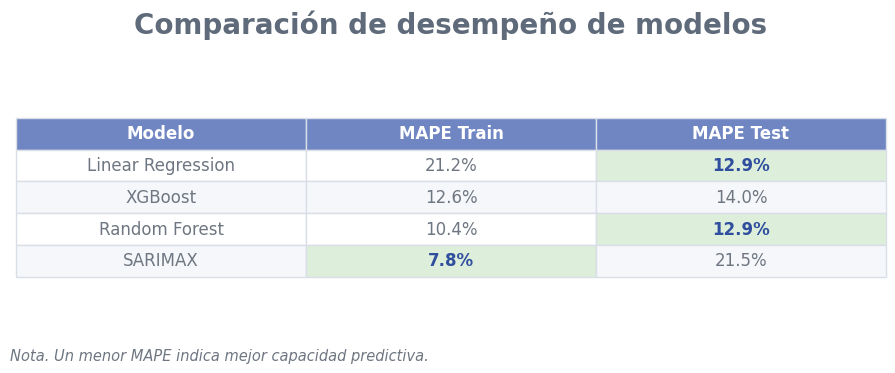

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Base de resultados
# =========================================================
df_mape = pd.DataFrame({
    "Modelo": ["Linear Regression", "XGBoost", "Random Forest", "SARIMAX"],
    "MAPE Train": [21.2, 12.6, 10.4, 7.8],
    "MAPE Test": [12.9, 14.0, 12.9, 21.5]
})

# Formato para mostrar %
df_show = df_mape.copy()
df_show["MAPE Train"] = df_show["MAPE Train"].map(lambda x: f"{x:.1f}%")
df_show["MAPE Test"] = df_show["MAPE Test"].map(lambda x: f"{x:.1f}%")

# =========================================================
# 2. Colores (mismo look & feel)
# =========================================================
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_borde = "#D9DEE7"
gris_fila = "#F5F7FA"
azul_header = "#6F86C3"
azul_oscuro = "#2F4E9E"
blanco = "#FFFFFF"
verde_suave = "#DDEEDB"

# =========================================================
# 3. Crear figura
# =========================================================
fig, ax = plt.subplots(figsize=(9, 3.8))
ax.axis("off")

# =========================================================
# 4. Título
# =========================================================
ax.set_title(
    "Comparación de desempeño de modelos",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

# =========================================================
# 5. Tabla
# =========================================================
table = ax.table(
    cellText=df_show.values,
    colLabels=df_show.columns,
    cellLoc="center",
    colLoc="center",
    loc="center"
)

table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2.0)

# =========================================================
# 6. Estilo general
# =========================================================
for (row, col), cell in table.get_celld().items():
    cell.set_edgecolor(gris_borde)
    cell.set_linewidth(1)

    # Encabezado
    if row == 0:
        cell.set_facecolor(azul_header)
        cell.get_text().set_color(blanco)
        cell.get_text().set_fontweight("bold")

    # Filas del cuerpo
    else:
        if row % 2 == 1:
            cell.set_facecolor(blanco)
        else:
            cell.set_facecolor(gris_fila)

        cell.get_text().set_color(gris_texto)

# =========================================================
# 7. Resaltar mejores resultados
# =========================================================
# Índices en df_mape (0-based)
best_train = df_mape["MAPE Train"].min()
best_test = df_mape["MAPE Test"].min()

for i in range(len(df_mape)):
    # Tabla: fila 0 = header, entonces sumamos 1
    table_row = i + 1

    # Mejor train
    if df_mape.loc[i, "MAPE Train"] == best_train:
        cell = table[table_row, 1]
        cell.set_facecolor(verde_suave)
        cell.get_text().set_color(azul_oscuro)
        cell.get_text().set_fontweight("bold")

    # Mejor test (en este caso hay empate entre LR y RF)
    if df_mape.loc[i, "MAPE Test"] == best_test:
        cell = table[table_row, 2]
        cell.set_facecolor(verde_suave)
        cell.get_text().set_color(azul_oscuro)
        cell.get_text().set_fontweight("bold")

# =========================================================
# 8. Nota al pie
# =========================================================
fig.text(
    0.01,
    0.03,
    "Nota. Un menor MAPE indica mejor capacidad predictiva.",
    ha="left",
    va="bottom",
    fontsize=10.5,
    color=gris_texto,
    style="italic"
)

plt.tight_layout(rect=[0, 0.06, 1, 1])
plt.show()

# Predicción ocupacion 2026 Random Forest

In [ ]:
X_train_final.head()

,precipitacion_mm,sol_horas,PIB_diario_MMM,temporada_Alta,temporada_Baja,dow_0,dow_1,dow_2,dow_3,dow_4,dow_5,dow_6,mes_1,mes_10,mes_11,mes_12,mes_2,mes_3,mes_4,mes_5,mes_6,mes_7,mes_8,mes_9,dia_mes_1,dia_mes_10,dia_mes_11,dia_mes_12,dia_mes_13,dia_mes_14,dia_mes_15,dia_mes_16,dia_mes_17,dia_mes_18,dia_mes_19,dia_mes_2,dia_mes_20,dia_mes_21,dia_mes_22,dia_mes_23,dia_mes_24,dia_mes_25,dia_mes_26,dia_mes_27,dia_mes_28,dia_mes_29,dia_mes_3,dia_mes_30,dia_mes_31,dia_mes_4,dia_mes_5,dia_mes_6,dia_mes_7,dia_mes_8,dia_mes_9,fin_semana_0,fin_semana_1
0,-0.820236,0.661057,0.435373,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False
1,-0.820236,0.660046,0.042137,False,True,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False
2,-0.820236,0.688568,0.778328,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
3,-0.820236,0.657832,1.042994,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
4,-0.795194,0.686144,-0.828522,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


### Predicción Clima 2026

In [ ]:
import pandas as pd
import requests

# Coveñas aprox: 9.40, -75.68
url = (
    "https://archive-api.open-meteo.com/v1/archive"
    "?latitude=9.40"
    "&longitude=-75.68"
    "&start_date=2023-01-01"
    "&end_date=2026-02-28"
    "&daily=precipitation_sum,sunshine_duration"
    "&timezone=America/Bogota"
)

r = requests.get(url, timeout=60)
r.raise_for_status()
data = r.json()

clima_act = pd.DataFrame({
    "fecha": pd.to_datetime(data["daily"]["time"]),
    "precipitacion_mm": data["daily"]["precipitation_sum"],
    "sol_segundos": data["daily"]["sunshine_duration"],
})

clima_act["sol_horas"] = clima_act["sol_segundos"] / 3600
clima_act = clima_act[["fecha", "precipitacion_mm", "sol_horas"]]

clima_act.head()

,fecha,precipitacion_mm,sol_horas
0,2023-01-01,5.4,10.837633
1,2023-01-02,4.0,9.772928
2,2023-01-03,0.7,10.899886
3,2023-01-04,1.1,11.193842
4,2023-01-05,0.0,11.346292


In [ ]:
clima_act.to_excel("clima_act.xlsx", index=False)

In [ ]:
clima = clima_act.copy()

clima["fecha"] = pd.to_datetime(clima["fecha"])
clima["year"] = clima["fecha"].dt.year
clima["mes_dia"] = clima["fecha"].dt.strftime("%m-%d")

In [ ]:
clima_hist = clima[clima["year"].isin([2023, 2024, 2025])].copy()

clima_promedio = (
    clima_hist
    .groupby("mes_dia", as_index=False)[["precipitacion_mm", "sol_horas"]]
    .mean()
)

clima_promedio.head()

,mes_dia,precipitacion_mm,sol_horas
0,01-01,2.666667,10.378731
1,01-02,5.366667,10.396451
2,01-03,10.766667,10.156583
3,01-04,4.133333,9.733752
4,01-05,6.233333,9.873952


In [ ]:
cal_2026 = pd.DataFrame({
    "fecha": pd.date_range("2026-01-01", "2026-12-31", freq="D")
})

cal_2026["year"] = cal_2026["fecha"].dt.year
cal_2026["mes_dia"] = cal_2026["fecha"].dt.strftime("%m-%d")

In [ ]:
clima_real_2026 = clima[clima["year"] == 2026][["fecha", "precipitacion_mm", "sol_horas"]].copy()

cal_2026 = cal_2026.merge(
    clima_real_2026,
    on="fecha",
    how="left"
)

cal_2026.head()

,fecha,year,mes_dia,precipitacion_mm,sol_horas
0,2026-01-01,2026,01-01,1.4,10.186478
1,2026-01-02,2026,01-02,1.3,9.255392
2,2026-01-03,2026,01-03,18.5,6.639350
3,2026-01-04,2026,01-04,13.4,5.947558
4,2026-01-05,2026,01-05,8.3,5.782853


In [ ]:
cal_2026 = cal_2026.merge(
    clima_promedio,
    on="mes_dia",
    how="left",
    suffixes=("", "_hist")
)

cal_2026.head()

,fecha,year,mes_dia,precipitacion_mm,sol_horas,precipitacion_mm_hist,sol_horas_hist
0,2026-01-01,2026,01-01,1.4,10.186478,2.666667,10.378731
1,2026-01-02,2026,01-02,1.3,9.255392,5.366667,10.396451
2,2026-01-03,2026,01-03,18.5,6.639350,10.766667,10.156583
3,2026-01-04,2026,01-04,13.4,5.947558,4.133333,9.733752
4,2026-01-05,2026,01-05,8.3,5.782853,6.233333,9.873952


In [ ]:
fecha_corte = pd.to_datetime("2026-03-01")

cal_2026["precipitacion_mm_final"] = np.where(
    cal_2026["fecha"] < fecha_corte,
    cal_2026["precipitacion_mm"],
    cal_2026["precipitacion_mm_hist"]
)

cal_2026["sol_horas_final"] = np.where(
    cal_2026["fecha"] < fecha_corte,
    cal_2026["sol_horas"],
    cal_2026["sol_horas_hist"]
)

In [ ]:
clima_2026_final = cal_2026[[
    "fecha",
    "precipitacion_mm_final",
    "sol_horas_final"
]].rename(columns={
    "precipitacion_mm_final": "precipitacion_mm",
    "sol_horas_final": "sol_horas"
})

clima_2026_final.head()

,fecha,precipitacion_mm,sol_horas
0,2026-01-01,1.4,10.186478
1,2026-01-02,1.3,9.255392
2,2026-01-03,18.5,6.639350
3,2026-01-04,13.4,5.947558
4,2026-01-05,8.3,5.782853


In [ ]:
clima_hasta_2025 = clima[clima["year"] < 2026][["fecha", "precipitacion_mm", "sol_horas"]].copy()

clima_final = pd.concat(
    [clima_hasta_2025, clima_2026_final],
    ignore_index=True
).sort_values("fecha").reset_index(drop=True)

clima_final.tail()

,fecha,precipitacion_mm,sol_horas
1456,2026-12-27,4.633333,10.738990
1457,2026-12-28,2.200000,10.715008
1458,2026-12-29,2.866667,8.824621
1459,2026-12-30,7.033333,9.213454
1460,2026-12-31,1.600000,10.328019


In [ ]:
clima_final[
    (clima_final["fecha"] >= "2026-03-01") &
    (clima_final["fecha"] <= "2026-03-10")
]

,fecha,precipitacion_mm,sol_horas
1155,2026-03-01,0.400000,11.126446
1156,2026-03-02,0.666667,10.940556
1157,2026-03-03,0.900000,11.202106
1158,2026-03-04,0.500000,11.181698
1159,2026-03-05,3.666667,11.223112
1160,2026-03-06,1.166667,11.038499
1161,2026-03-07,0.533333,11.140320
1162,2026-03-08,0.433333,11.266499
1163,2026-03-09,0.800000,11.188093
1164,2026-03-10,0.433333,11.226231


In [ ]:
clima_final.to_excel("clima_final.xlsx", index=False)

### Predicción PIB 2026 (tres escenarios)

In [ ]:
crecimiento_pib_pesimista = 0.01
crecimiento_pib_base = 0.025
crecimiento_pib_optimista = 0.045

crecimiento_pib = crecimiento_pib_base

In [ ]:
import pandas as pd
import numpy as np

pib = pib_diario.copy()

pib["fecha_noche"] = pd.to_datetime(pib["fecha_noche"], errors="coerce")
pib["PIB_diario_MMM"] = pd.to_numeric(pib["PIB_diario_MMM"], errors="coerce")

pib["year"] = pib["fecha_noche"].dt.year
pib["mes_dia"] = pib["fecha_noche"].dt.strftime("%m-%d")

In [ ]:
pib_2025 = pib[pib["year"] == 2025][["fecha_noche", "mes_dia", "PIB_diario_MMM"]].copy()

pib_2025.head()

,fecha_noche,mes_dia,PIB_diario_MMM
730,2025-01-01,01-01,105.792674
731,2025-01-02,01-02,88.804790
732,2025-01-03,01-03,104.714601
733,2025-01-04,01-04,130.760425
734,2025-01-05,01-05,123.163327


In [ ]:
cal_2026_pib = pd.DataFrame({
    "fecha": pd.date_range("2026-01-01", "2026-12-31", freq="D")
})

cal_2026_pib["mes_dia"] = cal_2026_pib["fecha"].dt.strftime("%m-%d")

In [ ]:
cal_2026_pib = cal_2026_pib.merge(
    pib_2025[["mes_dia", "PIB_diario_MMM"]],
    on="mes_dia",
    how="left"
)

cal_2026_pib.head()

,fecha,mes_dia,PIB_diario_MMM
0,2026-01-01,01-01,105.792674
1,2026-01-02,01-02,88.804790
2,2026-01-03,01-03,104.714601
3,2026-01-04,01-04,130.760425
4,2026-01-05,01-05,123.163327


In [ ]:
cal_2026_pib["PIB_diario_MMM_2026"] = cal_2026_pib["PIB_diario_MMM"] * (1 + crecimiento_pib)

In [ ]:
pib_2026_estimado = cal_2026_pib[["fecha", "PIB_diario_MMM_2026"]].rename(
    columns={"PIB_diario_MMM_2026": "PIB_diario_MMM"}
)

pib_2026_estimado.head()

,fecha,PIB_diario_MMM
0,2026-01-01,108.437491
1,2026-01-02,91.024910
2,2026-01-03,107.332466
3,2026-01-04,134.029436
4,2026-01-05,126.242410


In [ ]:
pib_historico = pib[pib["year"] < 2026][["fecha_noche", "PIB_diario_MMM"]].copy()
pib_historico = pib_historico.rename(columns={"fecha_noche": "fecha"})

pib_final = pd.concat(
    [pib_historico, pib_2026_estimado],
    ignore_index=True
).sort_values("fecha").reset_index(drop=True)

pib_final.tail()

,fecha,PIB_diario_MMM
1455,2026-12-27,135.409198
1456,2026-12-28,136.800191
1457,2026-12-29,109.117504
1458,2026-12-30,112.996714
1459,2026-12-31,99.374818


In [ ]:
clima_final["fecha"] = pd.to_datetime(clima_final["fecha"], errors="coerce")
pib_final["fecha"] = pd.to_datetime(pib_final["fecha"], errors="coerce")

clima_PIB_2026 = (
    clima_final
    .merge(pib_final, on="fecha", how="left")
)

# dejar solo 2026
clima_PIB_2026 = clima_PIB_2026[
    clima_PIB_2026["fecha"].dt.year == 2026
].reset_index(drop=True)

clima_PIB_2026.head()

,fecha,precipitacion_mm,sol_horas,PIB_diario_MMM
0,2026-01-01,1.4,10.186478,108.437491
1,2026-01-02,1.3,9.255392,91.024910
2,2026-01-03,18.5,6.639350,107.332466
3,2026-01-04,13.4,5.947558,134.029436
4,2026-01-05,8.3,5.782853,126.242410


In [ ]:
clima_PIB_2026["fecha"] = pd.to_datetime(clima_PIB_2026["fecha"], errors="coerce")

clima_PIB_2026["dow"] = clima_PIB_2026["fecha"].dt.dayofweek
clima_PIB_2026["dia_mes"] = clima_PIB_2026["fecha"].dt.day
clima_PIB_2026["fin_semana"] = clima_PIB_2026["dow"].isin([4, 5, 6]).astype(int)

clima_PIB_2026.head()

,fecha,precipitacion_mm,sol_horas,PIB_diario_MMM,dow,dia_mes,fin_semana
0,2026-01-01,1.4,10.186478,108.437491,3,1,0
1,2026-01-02,1.3,9.255392,91.024910,4,2,1
2,2026-01-03,18.5,6.639350,107.332466,5,3,1
3,2026-01-04,13.4,5.947558,134.029436,6,4,1
4,2026-01-05,8.3,5.782853,126.242410,0,5,0


### Temporada 2026

In [ ]:
import pandas as pd

calendario_2026 = pd.DataFrame({
    "fecha": pd.date_range("2026-01-01", "2026-12-31", freq="D")
})

calendario_2026["año"] = calendario_2026["fecha"].dt.year
calendario_2026["mes"] = calendario_2026["fecha"].dt.month
calendario_2026["dia"] = calendario_2026["fecha"].dt.day
calendario_2026["dow"] = calendario_2026["fecha"].dt.dayofweek  # lunes=0, domingo=6

calendario_2026["temporada"] = "Baja"

In [ ]:
# Alta: 15 dic - 15 ene
calendario_2026.loc[
    ((calendario_2026["mes"] == 12) & (calendario_2026["dia"] >= 15)) |
    ((calendario_2026["mes"] == 1) & (calendario_2026["dia"] <= 15)),
    "temporada"
] = "Alta"

# Alta: 15 jun - 15 ago
calendario_2026.loc[
    ((calendario_2026["mes"] == 6) & (calendario_2026["dia"] >= 15)) |
    (calendario_2026["mes"] == 7) |
    ((calendario_2026["mes"] == 8) & (calendario_2026["dia"] <= 15)),
    "temporada"
] = "Alta"

# Activar estas lineas si se quiere temporada media
#calendario_2026.loc[
#    calendario_2026["temporada"] == "Baja",
#    "temporada"
#] = "Media"

# Baja en meses flojos
calendario_2026.loc[
    calendario_2026["mes"].isin([2, 3, 4, 5, 9, 10, 11]),
    "temporada"
] = "Baja"

In [ ]:
# Semana Santa: 29 de marzo al 5 de abril de 2026
calendario_2026.loc[
    (calendario_2026["fecha"] >= "2026-03-29") &
    (calendario_2026["fecha"] <= "2026-04-05"),
    "temporada"
] = "Alta"

In [ ]:
calendario_2026.loc[
    (calendario_2026["fecha"] >= "2026-10-05") &
    (calendario_2026["fecha"] <= "2026-10-12"),
    "temporada"
] = "Alta"

In [ ]:
lunes_festivos_2026 = pd.to_datetime([
    "2026-01-12",  # Reyes Magos
    "2026-03-23",  # San José
    "2026-05-18",  # Ascensión
    "2026-06-08",  # Corpus Christi
    "2026-06-15",  # Sagrado Corazón
    "2026-06-29",  # San Pedro y San Pablo
    "2026-08-17",  # Asunción de la Virgen
    "2026-10-12",  # Día de la Raza
    "2026-11-02",  # Todos los Santos
    "2026-11-16",  # Independencia de Cartagena
])

for lunes in lunes_festivos_2026:
    sabado = lunes - pd.Timedelta(days=2)
    domingo = lunes - pd.Timedelta(days=1)

    calendario_2026.loc[
        calendario_2026["fecha"].isin([sabado, domingo, lunes]),
        "temporada"
    ] = "Alta"

In [ ]:
map_temporada = {
    "Baja": 0,
    "Media": 1,
    "Alta": 2
}

calendario_2026["temporada_num"] = calendario_2026["temporada"].map(map_temporada)

In [ ]:
calendario_2026[["fecha", "temporada", "temporada_num"]].head(20)

,fecha,temporada,temporada_num
0,2026-01-01,Alta,2
1,2026-01-02,Alta,2
2,2026-01-03,Alta,2
3,2026-01-04,Alta,2
4,2026-01-05,Alta,2
5,2026-01-06,Alta,2
6,2026-01-07,Alta,2
7,2026-01-08,Alta,2
8,2026-01-09,Alta,2
9,2026-01-10,Alta,2


In [ ]:
calendario_2026.to_excel("calendario_2026.xlsx", index=False)

In [ ]:
clima_PIB_2026["fecha"] = pd.to_datetime(clima_PIB_2026["fecha"], errors="coerce")

clima_PIB_2026 = clima_PIB_2026.merge(
    calendario_2026[["fecha", "temporada"]],
    on="fecha",
    how="left"
)

clima_PIB_2026.head()

,fecha,precipitacion_mm,sol_horas,PIB_diario_MMM,dow,dia_mes,fin_semana,temporada
0,2026-01-01,1.4,10.186478,108.437491,3,1,0,Alta
1,2026-01-02,1.3,9.255392,91.024910,4,2,1,Alta
2,2026-01-03,18.5,6.639350,107.332466,5,3,1,Alta
3,2026-01-04,13.4,5.947558,134.029436,6,4,1,Alta
4,2026-01-05,8.3,5.782853,126.242410,0,5,0,Alta


### Pronostico Ocupacion 2026

In [ ]:
import pandas as pd

# =========================================================
# 1. Partir de la base original 2026
# =========================================================
df_pred_2026 = clima_PIB_2026.copy()

df_pred_2026["fecha"] = pd.to_datetime(df_pred_2026["fecha"], errors="coerce")

# =========================================================
# 2. Construir variables temporales exactamente como en train
# =========================================================
df_pred_2026["dow"] = df_pred_2026["fecha"].dt.dayofweek
df_pred_2026["mes"] = df_pred_2026["fecha"].dt.month
df_pred_2026["dia_mes"] = df_pred_2026["fecha"].dt.day
df_pred_2026["fin_semana"] = (df_pred_2026["dow"] >= 4).astype(int)

# Si temporada ya existe, déjala; si no, constrúyela según tu lógica
# Ejemplo de referencia: alta en ene, jun, jul, dic
if "temporada" not in df_pred_2026.columns:
    df_pred_2026["temporada"] = df_pred_2026["mes"].isin([1, 6, 7, 12]).map({True: "Alta", False: "Baja"})

# =========================================================
# 3. Seleccionar variables base
# =========================================================
vars_cont = ["precipitacion_mm", "sol_horas", "PIB_diario_MMM"]
vars_cat = ["dow", "mes", "dia_mes", "fin_semana", "temporada"]

X_pred_base = df_pred_2026[vars_cont + vars_cat].copy()

# =========================================================
# 4. Escalar continuas
# =========================================================
X_pred_base[vars_cont] = scaler.transform(X_pred_base[vars_cont])

# =========================================================
# 5. Crear dummies exactamente como en train
# =========================================================
X_pred = pd.get_dummies(
    X_pred_base,
    columns=vars_cat,
    drop_first=False
)

# =========================================================
# 6. Alinear columnas con el modelo
# =========================================================
cols_modelo = list(best_rf.feature_names_in_)

for col in cols_modelo:
    if col not in X_pred.columns:
        X_pred[col] = 0

X_pred = X_pred[cols_modelo].copy()

print(X_pred.shape)
print(X_pred.head())

(365, 57)
   precipitacion_mm  sol_horas  PIB_diario_MMM  temporada_Alta  \
0         -0.644942   0.214941       -0.030294            True   
1         -0.657463  -0.196887       -1.017706            True   
2          1.496146  -1.353987       -0.092956            True   
3          0.857576  -1.659972        1.420943            True   
4          0.219006  -1.732823        0.979366            True   

   temporada_Baja  dow_0  dow_1  dow_2  dow_3  dow_4  dow_5  dow_6  mes_1  \
0           False  False  False  False   True  False  False  False   True   
1           False  False  False  False  False   True  False  False   True   
2           False  False  False  False  False  False   True  False   True   
3           False  False  False  False  False  False  False   True   True   
4           False   True  False  False  False  False  False  False   True   

   mes_10  mes_11  mes_12  mes_2  mes_3  mes_4  mes_5  mes_6  mes_7  mes_8  \
0   False   False   False  False  False  False  Fals

In [ ]:
print("¿Coinciden columnas?:", list(X_pred.columns) == list(best_rf.feature_names_in_))

¿Coinciden columnas?: True


In [ ]:
y_pred_2026 = best_rf.predict(X_pred)

pred_2026 = df_pred_2026[["fecha"]].copy()
pred_2026["ocupacion_pred"] = y_pred_2026

pred_2026.head()

,fecha,ocupacion_pred
0,2026-01-01,0.704736
1,2026-01-02,0.726883
2,2026-01-03,0.809380
3,2026-01-04,0.708182
4,2026-01-05,0.623296


In [ ]:
import pandas as pd

# =========================================================
# 1. Copia y preparación
# =========================================================
df_forecast_2026 = pred_2026.copy()

df_forecast_2026["fecha"] = pd.to_datetime(df_forecast_2026["fecha"], errors="coerce")
df_forecast_2026["mes"] = df_forecast_2026["fecha"].dt.to_period("M")

# Capacidad del hotel
capacidad_personas = 146

# =========================================================
# 2. Personas predichas por día
# =========================================================
df_forecast_2026["personas_pred_dia"] = (
    df_forecast_2026["ocupacion_pred"] * capacidad_personas
)

# =========================================================
# 3. Agregación mensual
# =========================================================
forecast_mensual_2026 = (
    df_forecast_2026
    .groupby("mes", as_index=False)
    .agg(
        personas_pred_mes=("personas_pred_dia", "sum"),
        dias_mes=("fecha", "count")
    )
)

# =========================================================
# 4. Capacidad mensual y ocupación mensual
# =========================================================
forecast_mensual_2026["capacidad_mes"] = (
    forecast_mensual_2026["dias_mes"] * capacidad_personas
)

forecast_mensual_2026["ocupacion_pred_mensual"] = (
    forecast_mensual_2026["personas_pred_mes"] / forecast_mensual_2026["capacidad_mes"]
)

# =========================================================
# 5. Formatos útiles
# =========================================================
forecast_mensual_2026["mes"] = forecast_mensual_2026["mes"].dt.to_timestamp()
forecast_mensual_2026["ocupacion_pred_pct"] = (
    forecast_mensual_2026["ocupacion_pred_mensual"] * 100
)

forecast_mensual_2026["personas_pred_mes"] = forecast_mensual_2026["personas_pred_mes"].round(0)
forecast_mensual_2026["capacidad_mes"] = forecast_mensual_2026["capacidad_mes"].round(0)

forecast_mensual_2026

,mes,personas_pred_mes,dias_mes,capacidad_mes,ocupacion_pred_mensual,ocupacion_pred_pct
0,2026-01-01,2848.0,31,4526,0.629160,62.915969
1,2026-02-01,1301.0,28,4088,0.318300,31.829983
2,2026-03-01,1551.0,31,4526,0.342608,34.260777
3,2026-04-01,1338.0,30,4380,0.305568,30.556824
4,2026-05-01,1205.0,31,4526,0.266343,26.634294
5,2026-06-01,1859.0,30,4380,0.424350,42.435014
6,2026-07-01,1985.0,31,4526,0.438639,43.863865
7,2026-08-01,1679.0,31,4526,0.370901,37.090132
8,2026-09-01,1239.0,30,4380,0.282817,28.281684
9,2026-10-01,1776.0,31,4526,0.392406,39.240562


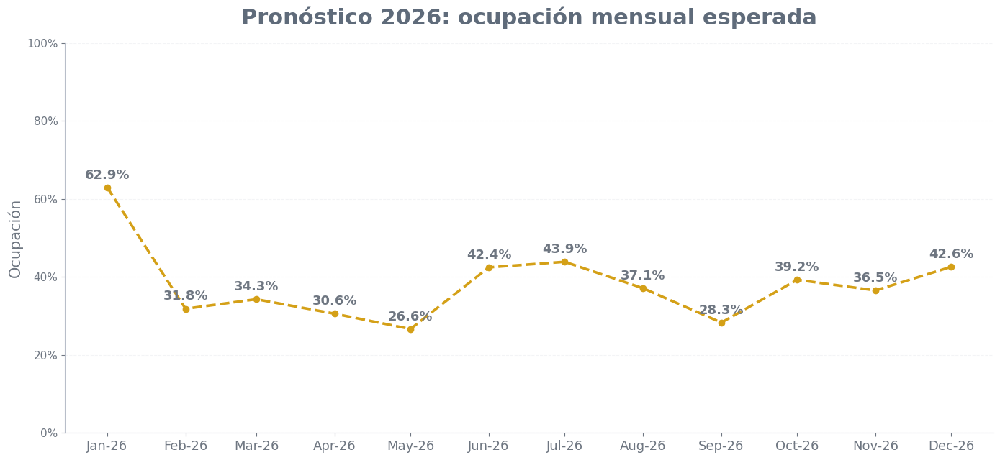

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1. Copia y preparación de la base mensual
# =========================================================
df_plot = forecast_mensual_2026.copy()

# Asegurar formato fecha
if str(df_plot["mes"].dtype) == "period[M]":
    df_plot["mes"] = df_plot["mes"].dt.to_timestamp()
else:
    df_plot["mes"] = pd.to_datetime(df_plot["mes"], errors="coerce")

# =========================================================
# 2. Colores estilo presentación
# =========================================================
dorado_pred = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_grid = "#C9CED6"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=dorado_pred,
    marker="o",
    markersize=6,
    linewidth=2.6,
    linestyle="--"
)

# =========================================================
# 4. Etiquetas de datos
# =========================================================
for x, y in zip(df_plot["mes"], df_plot["ocupacion_pred_mensual"]):
    ax.text(
        x,
        y + 0.015,
        f"{y:.1%}",
        ha="center",
        va="bottom",
        fontsize=13,   # antes 10
        color=gris_texto,
        fontweight="bold"
    )

# =========================================================
# 5. Formato visual
# =========================================================
ax.set_title(
    "Pronóstico 2026: ocupación mensual esperada",
    fontsize=22,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_ylabel("Ocupación", fontsize=15, color=gris_texto)
ax.set_xlabel("")

ax.yaxis.set_major_formatter(PercentFormatter(1.0))
ax.set_ylim(0, 1.0)

# Mostrar etiquetas del eje X en formato Ene-26, Feb-26...
ax.set_xticks(df_plot["mes"])
ax.set_xticklabels(df_plot["mes"].dt.strftime("%b-%y"))

# Eje X horizontal y más grande
ax.tick_params(axis="x", labelsize=13, colors=gris_texto, rotation=0)
ax.tick_params(axis="y", labelsize=11, colors=gris_texto)

# Grid suave
ax.grid(axis="y", linestyle="--", alpha=0.22, color=gris_grid)
ax.grid(axis="x", visible=False)

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

plt.tight_layout()
plt.show()

### Pronostico Ingresos 2026

In [ ]:
import pandas as pd
import numpy as np

df_ingresos = df_model.copy()

df_ingresos["fecha_noche"] = pd.to_datetime(df_ingresos["fecha_noche"], errors="coerce")

df_ingresos_2025 = df_ingresos[
    df_ingresos["fecha_noche"].dt.year == 2025
].copy()

df_ingresos_2025.head()

,fecha_noche,personas,ingresos,ingresos_alojamiento,ingresos_consumos_extra,cuartos_ocupados,ingreso_por_huesped,ingreso_alojamiento_por_huesped,ingreso_consumo_extra_por_huesped,ingreso_por_cuarto,ocupacion,precipitacion_mm,sol_horas,temporada,PIB_diario_MMM,dow,mes,año,dia_mes,fin_semana,temporada_num,ocupacion_lag1,ocupacion_lag7,ingresos_lag1,ingresos_lag7,ocupacion_ma7,ingresos_ma7,dow_sin,dow_cos,mes_sin,mes_cos
692,2025-01-01,140,3.033326e+07,2.708393e+07,3.249327e+06,43,216666.107840,193456.626548,23209.481293,705424.537154,0.958904,2.5,9.000000,Alta,105.792674,2,1,2025,1,0,2.0,0.952055,0.438356,3.174643e+07,9.663320e+06,0.671233,1.880060e+07,0.974928,-0.222521,0.5,0.866025
693,2025-01-02,134,2.902272e+07,2.597445e+07,3.048274e+06,41,216587.494936,193839.182925,22748.312011,707871.324913,0.917808,11.9,10.176444,Alta,88.804790,3,1,2025,2,0,2.0,0.958904,0.547945,3.033326e+07,1.366444e+07,0.745597,2.175345e+07,0.433884,-0.900969,0.5,0.866025
694,2025-01-03,135,2.951355e+07,2.681543e+07,2.698124e+06,42,218618.919541,198632.817249,19986.102293,702703.669955,0.924658,31.5,8.247269,Alta,104.714601,4,1,2025,3,1,2.0,0.917808,0.582192,2.902272e+07,1.247544e+07,0.798434,2.394749e+07,-0.433884,-0.900969,0.5,0.866025
695,2025-01-04,135,2.923052e+07,2.666233e+07,2.568190e+06,43,216522.403598,197498.770441,19023.633157,679779.639203,0.924658,11.3,6.743547,Alta,130.760425,5,1,2025,4,1,2.0,0.924658,0.609589,2.951355e+07,1.488052e+07,0.847358,2.638151e+07,-0.974928,-0.222521,0.5,0.866025
696,2025-01-05,138,2.833357e+07,2.629841e+07,2.035167e+06,43,205315.757005,190568.172464,14747.584541,658920.336434,0.945205,18.4,7.000000,Alta,123.163327,6,1,2025,5,1,2.0,0.924658,0.732877,2.923052e+07,2.205964e+07,0.892368,2.843151e+07,-0.781831,0.623490,0.5,0.866025


In [ ]:
# Promedio ingreso_por_huesped por temporada y dia de la semana

prom_ingreso_huesped_2025 = (
    df_ingresos_2025
    .groupby(["temporada", "dow"], as_index=False)["ingreso_por_huesped"]
    .mean()
    .rename(columns={"ingreso_por_huesped": "ingreso_por_huesped_prom_2025"})
)

prom_ingreso_huesped_2025.head(20)

,temporada,dow,ingreso_por_huesped_prom_2025
0,Alta,0,133835.907730
1,Alta,1,138421.502950
2,Alta,2,141791.496477
3,Alta,3,138728.696250
4,Alta,4,138700.306860
5,Alta,5,145134.884638
6,Alta,6,142735.932651
7,Baja,0,122346.492481
8,Baja,1,119401.927804
9,Baja,2,122040.936307


In [ ]:
# Ajusta promedio por inflacion para calcular 2026

inflacion_2026 = 0.058  # 5.8%

prom_ingreso_huesped_2025["ingreso_por_huesped_2026"] = (
    prom_ingreso_huesped_2025["ingreso_por_huesped_prom_2025"] * (1 + inflacion_2026)
)

prom_ingreso_huesped_2025.head()

,temporada,dow,ingreso_por_huesped_prom_2025,ingreso_por_huesped_2026
0,Alta,0,133835.907730,141598.390379
1,Alta,1,138421.502950,146449.950121
2,Alta,2,141791.496477,150015.403273
3,Alta,3,138728.696250,146774.960632
4,Alta,4,138700.306860,146744.924658


In [ ]:
pred_2026.head()

,fecha,ocupacion_pred
0,2026-01-01,0.704736
1,2026-01-02,0.726883
2,2026-01-03,0.809380
3,2026-01-04,0.708182
4,2026-01-05,0.623296


In [ ]:
# =========================================================
# 1. Asegurar mismo formato de fecha
# =========================================================
pred_2026["fecha"] = pd.to_datetime(pred_2026["fecha"], errors="coerce")
clima_PIB_2026["fecha"] = pd.to_datetime(clima_PIB_2026["fecha"], errors="coerce")

# =========================================================
# 2. Traer temporada y dow desde clima_PIB_2026
# =========================================================
pred_2026 = pred_2026.merge(
    clima_PIB_2026[["fecha", "temporada", "dow"]],
    on="fecha",
    how="left"
)

# =========================================================
# 3. Revisar
# =========================================================
pred_2026.head()

,fecha,ocupacion_pred,temporada,dow
0,2026-01-01,0.704736,Alta,3
1,2026-01-02,0.726883,Alta,4
2,2026-01-03,0.809380,Alta,5
3,2026-01-04,0.708182,Alta,6
4,2026-01-05,0.623296,Alta,0


In [ ]:
# =========================================================
# 1. Preparar tabla de ingreso por huésped
# =========================================================
tabla_iph_2025 = (
    prom_ingreso_huesped_2025[["temporada", "dow", "ingreso_por_huesped_2026"]]
    .drop_duplicates()
)

# Asegurar tipos consistentes
pred_2026["temporada"] = pred_2026["temporada"].astype(str)
tabla_iph_2025["temporada"] = tabla_iph_2025["temporada"].astype(str)

pred_2026["dow"] = pd.to_numeric(pred_2026["dow"], errors="coerce")
tabla_iph_2025["dow"] = pd.to_numeric(tabla_iph_2025["dow"], errors="coerce")

# =========================================================
# 2. Cruce por temporada y dow
# =========================================================
pred_2026 = pred_2026.merge(
    tabla_iph_2025,
    on=["temporada", "dow"],
    how="left"
)

# =========================================================
# 3. Revisar
# =========================================================
pred_2026.head()

,fecha,ocupacion_pred,temporada,dow,ingreso_por_huesped_2026
0,2026-01-01,0.704736,Alta,3,146774.960632
1,2026-01-02,0.726883,Alta,4,146744.924658
2,2026-01-03,0.809380,Alta,5,153552.707947
3,2026-01-04,0.708182,Alta,6,151014.616745
4,2026-01-05,0.623296,Alta,0,141598.390379


In [ ]:
# Personas predichas por día
pred_2026["personas_pred_dia"] = pred_2026["ocupacion_pred"] * 146

# Ingreso predicho por día
pred_2026["ingreso_pred_dia"] = (
    pred_2026["personas_pred_dia"] * pred_2026["ingreso_por_huesped_2026"]
)

pred_2026.head()

,fecha,ocupacion_pred,temporada,dow,ingreso_por_huesped_2026,personas_pred_dia,ingreso_pred_dia
0,2026-01-01,0.704736,Alta,3,146774.960632,102.891453,1.510189e+07
1,2026-01-02,0.726883,Alta,4,146744.924658,106.124857,1.557328e+07
2,2026-01-03,0.809380,Alta,5,153552.707947,118.169489,1.814525e+07
3,2026-01-04,0.708182,Alta,6,151014.616745,103.394578,1.561409e+07
4,2026-01-05,0.623296,Alta,0,141598.390379,91.001144,1.288562e+07


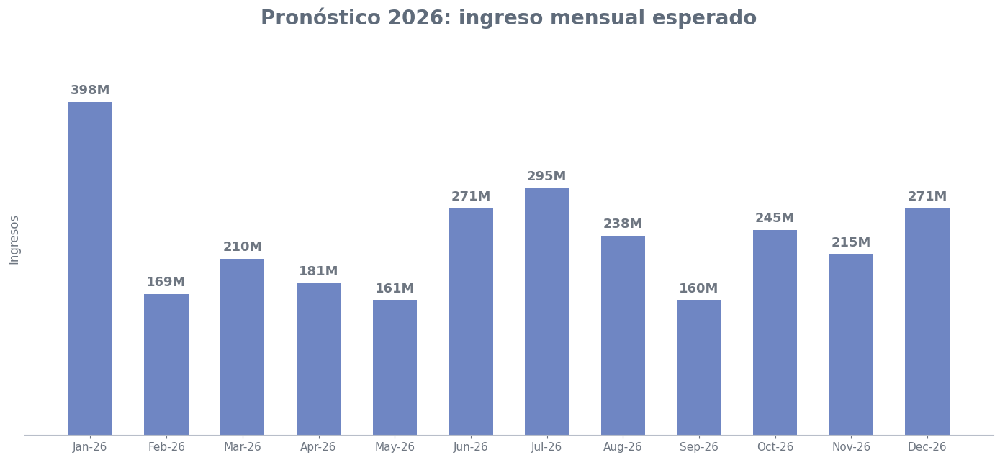

,mes,ingreso_pred_mes
0,2026-01-01,3.975574e+08
1,2026-02-01,1.686324e+08
2,2026-03-01,2.102473e+08
3,2026-04-01,1.814757e+08
4,2026-05-01,1.606704e+08
5,2026-06-01,2.707641e+08
6,2026-07-01,2.949449e+08
7,2026-08-01,2.382550e+08
8,2026-09-01,1.603591e+08
9,2026-10-01,2.445686e+08


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar base
# =========================================================
df_ing_2026 = pred_2026.copy()

df_ing_2026["fecha"] = pd.to_datetime(df_ing_2026["fecha"], errors="coerce")
df_ing_2026["mes"] = df_ing_2026["fecha"].dt.to_period("M")

# =========================================================
# 2. Agrupar ingreso mensual
# =========================================================
ingreso_mensual_2026 = (
    df_ing_2026
    .groupby("mes", as_index=False)
    .agg(
        ingreso_pred_mes=("ingreso_pred_dia", "sum")
    )
)

ingreso_mensual_2026["mes"] = ingreso_mensual_2026["mes"].dt.to_timestamp()

# =========================================================
# 3. Función formato millones
# =========================================================
def formato_millones(x):
    valor_m = x / 1_000_000
    return f"{valor_m:,.0f}M".replace(",", ".")

# =========================================================
# 4. Colores estilo presentación
# =========================================================
azul_medio = "#6F86C3"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 5. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

bars = ax.bar(
    ingreso_mensual_2026["mes"].dt.strftime("%b-%y"),
    ingreso_mensual_2026["ingreso_pred_mes"],
    color=azul_medio,
    edgecolor="none",
    width=0.58
)

# Etiquetas sobre barras
for bar, valor in zip(bars, ingreso_mensual_2026["ingreso_pred_mes"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + ingreso_mensual_2026["ingreso_pred_mes"].max() * 0.015,
        formato_millones(valor),
        ha="center",
        va="bottom",
        fontsize=13,   # <- agrandado
        fontweight="bold",
        color=gris_texto
    )

# =========================================================
# 6. Estilo
# =========================================================
ax.set_title(
    "Pronóstico 2026: ingreso mensual esperado",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_xlabel("")
ax.set_ylabel("Ingresos", fontsize=12, color=gris_texto)

# Quitar eje Y para look más limpio
ax.set_yticks([])
ax.spines["left"].set_visible(False)

ax.tick_params(axis="x", labelsize=11, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

# Dar aire arriba a las etiquetas
ax.set_ylim(0, ingreso_mensual_2026["ingreso_pred_mes"].max() * 1.18)

plt.tight_layout()
plt.show()

# =========================================================
# 7. Ver tabla resultante
# =========================================================
ingreso_mensual_2026

In [ ]:
ingreso_anual_2026 = pred_2026["ingreso_pred_dia"].sum()
print(f"Ingreso anual proyectado 2026: COP {ingreso_anual_2026:,.0f}".replace(",", "."))

Ingreso anual proyectado 2026: COP 2.813.531.931


# Cálculo oportunidad

## Ocupación

In [ ]:
import pandas as pd

file_path = "/content/drive/MyDrive/Tesis/calendario_2026_con_ocupacion_optima.xlsx"

df = pd.read_excel(file_path)

df.head()

,fecha,año,mes,dia,dow,temporada,temporada_num,ocupacion_optima
0,2026-01-01,2026,1,1,3,Alta,2,0.90
1,2026-01-02,2026,1,2,4,Alta,2,0.93
2,2026-01-03,2026,1,3,5,Alta,2,0.96
3,2026-01-04,2026,1,4,6,Alta,2,0.92
4,2026-01-05,2026,1,5,0,Alta,2,0.88


In [ ]:
# =========================================================
# 1. Preparar tabla de ingreso por huésped
# =========================================================
tabla_iph_2025 = (
    prom_ingreso_huesped_2025[["temporada", "dow", "ingreso_por_huesped_2026"]]
    .drop_duplicates()
)

# Asegurar tipos consistentes
df["temporada"] = df["temporada"].astype(str)
tabla_iph_2025["temporada"] = tabla_iph_2025["temporada"].astype(str)

df["dow"] = pd.to_numeric(df["dow"], errors="coerce")
tabla_iph_2025["dow"] = pd.to_numeric(tabla_iph_2025["dow"], errors="coerce")

# =========================================================
# 2. Cruce por temporada y dow
# =========================================================
df = df.merge(
    tabla_iph_2025,
    on=["temporada", "dow"],
    how="left"
)

df.head()

,fecha,año,mes,dia,dow,temporada,temporada_num,ocupacion_optima,ingreso_por_huesped_2026
0,2026-01-01,2026,1,1,3,Alta,2,0.90,146774.960632
1,2026-01-02,2026,1,2,4,Alta,2,0.93,146744.924658
2,2026-01-03,2026,1,3,5,Alta,2,0.96,153552.707947
3,2026-01-04,2026,1,4,6,Alta,2,0.92,151014.616745
4,2026-01-05,2026,1,5,0,Alta,2,0.88,141598.390379


In [ ]:
import pandas as pd

# =========================================================
# 1. Preparar base
# =========================================================
df_opt = df.copy()

df_opt["fecha"] = pd.to_datetime(df_opt["fecha"], errors="coerce")
df_opt["mes"] = df_opt["fecha"].dt.to_period("M")

# =========================================================
# 2. Personas óptimas por día
# =========================================================
df_opt["personas_optimas_dia"] = 146 * df_opt["ocupacion_optima"]

# =========================================================
# 3. Agregación mensual
# =========================================================
ocupacion_optima_mensual_2026 = (
    df_opt
    .groupby("mes", as_index=False)
    .agg(
        personas_optimas_mes=("personas_optimas_dia", "sum"),
        dias_mes=("fecha", "count")
    )
)

# =========================================================
# 4. Capacidad mensual
# =========================================================
ocupacion_optima_mensual_2026["capacidad_mes"] = (
    146 * ocupacion_optima_mensual_2026["dias_mes"]
)

# =========================================================
# 5. Ocupación óptima mensual
# =========================================================
ocupacion_optima_mensual_2026["ocupacion_optima_mensual"] = (
    ocupacion_optima_mensual_2026["personas_optimas_mes"] /
    ocupacion_optima_mensual_2026["capacidad_mes"]
)

# =========================================================
# 6. Formatos útiles
# =========================================================
ocupacion_optima_mensual_2026["mes"] = ocupacion_optima_mensual_2026["mes"].dt.to_timestamp()
ocupacion_optima_mensual_2026["ocupacion_optima_pct"] = (
    ocupacion_optima_mensual_2026["ocupacion_optima_mensual"] * 100
)

ocupacion_optima_mensual_2026

,mes,personas_optimas_mes,dias_mes,capacidad_mes,ocupacion_optima_mensual,ocupacion_optima_pct
0,2026-01-01,3218.127530,31,4526,0.711031,71.103127
1,2026-02-01,1524.240000,28,4088,0.372857,37.285714
2,2026-03-01,2070.280000,31,4526,0.457419,45.741935
3,2026-04-01,1971.000000,30,4380,0.450000,45.000000
4,2026-05-01,1982.680000,31,4526,0.438065,43.806452
5,2026-06-01,2632.243135,30,4380,0.600969,60.096875
6,2026-07-01,2801.594000,31,4526,0.619000,61.900000
7,2026-08-01,2143.280000,31,4526,0.473548,47.354839
8,2026-09-01,1601.620000,30,4380,0.365667,36.566667
9,2026-10-01,2279.060000,31,4526,0.503548,50.354839


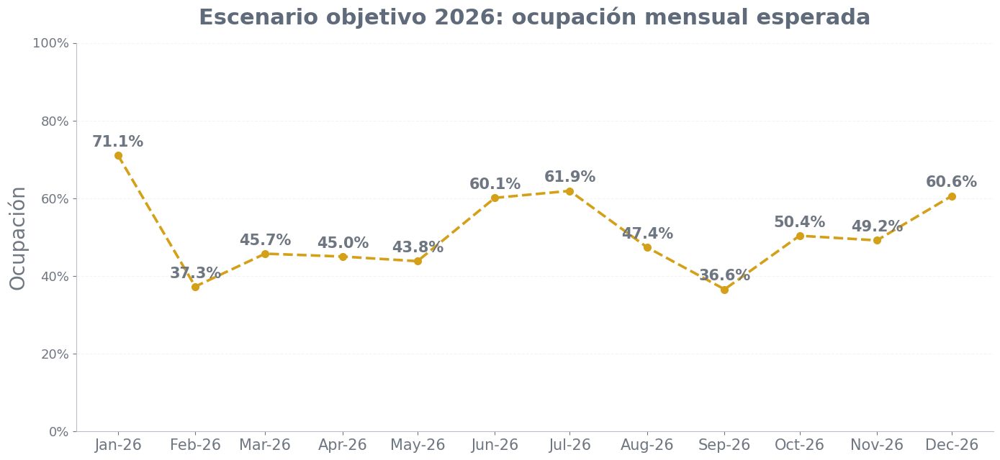

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1. Copia y preparación de la base
# =========================================================
df_plot = ocupacion_optima_mensual_2026.copy()

# Asegurar formato fecha
if str(df_plot["mes"].dtype) == "period[M]":
    df_plot["mes"] = df_plot["mes"].dt.to_timestamp()
else:
    df_plot["mes"] = pd.to_datetime(df_plot["mes"], errors="coerce")

# =========================================================
# 2. Colores estilo presentación
# =========================================================
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_grid = "#C9CED6"

# =========================================================
# 3. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_optima_mensual"],
    color=dorado,
    marker="o",
    markersize=7,
    linewidth=2.6,
    linestyle="--"
)

# =========================================================
# 4. Etiquetas de datos
# =========================================================
for x, y in zip(df_plot["mes"], df_plot["ocupacion_optima_mensual"]):
    ax.text(
        x,
        y + 0.015,
        f"{y:.1%}",
        ha="center",
        va="bottom",
        fontsize=15,
        color=gris_texto,
        fontweight="bold"
    )

# =========================================================
# 5. Formato visual
# =========================================================
ax.set_title(
    "Escenario objetivo 2026: ocupación mensual esperada",
    fontsize=22,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_ylabel("Ocupación", fontsize=20, color=gris_texto)
ax.set_xlabel("")

ax.yaxis.set_major_formatter(PercentFormatter(1.0))
ax.set_ylim(0, 1.0)

# Etiquetas eje X horizontales
ax.set_xticks(df_plot["mes"])
ax.set_xticklabels(df_plot["mes"].dt.strftime("%b-%y"), rotation=0)

ax.tick_params(axis="x", labelsize=15, colors=gris_texto)
ax.tick_params(axis="y", labelsize=13, colors=gris_texto)

# Grid suave
ax.grid(axis="y", linestyle="--", alpha=0.22, color=gris_grid)
ax.grid(axis="x", visible=False)

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

plt.tight_layout()
plt.show()

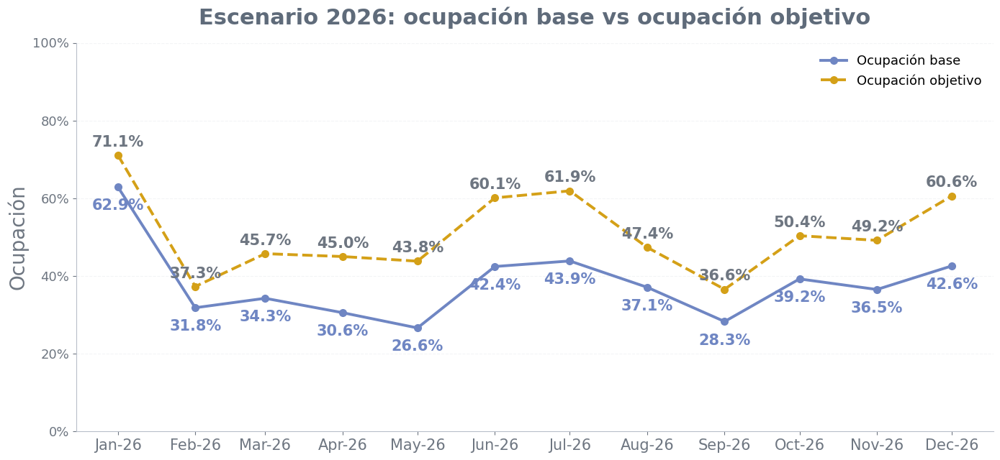

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# =========================================================
# 1. Preparar bases
# =========================================================
df_base = forecast_mensual_2026.copy()
df_opt = ocupacion_optima_mensual_2026.copy()

# Asegurar formato fecha
if str(df_base["mes"].dtype) == "period[M]":
    df_base["mes"] = df_base["mes"].dt.to_timestamp()
else:
    df_base["mes"] = pd.to_datetime(df_base["mes"], errors="coerce")

if str(df_opt["mes"].dtype) == "period[M]":
    df_opt["mes"] = df_opt["mes"].dt.to_timestamp()
else:
    df_opt["mes"] = pd.to_datetime(df_opt["mes"], errors="coerce")

# =========================================================
# 2. Unir bases
# =========================================================
df_plot = df_base.merge(
    df_opt[["mes", "ocupacion_optima_mensual"]],
    on="mes",
    how="left"
)

# =========================================================
# 3. Colores estilo presentación
# =========================================================
azul_base = "#6F86C3"
dorado_obj = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"
gris_grid = "#C9CED6"

# =========================================================
# 4. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

# Línea base
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_pred_mensual"],
    color=azul_base,
    marker="o",
    markersize=7,
    linewidth=2.8,
    linestyle="-",
    label="Ocupación base"
)

# Línea objetivo
ax.plot(
    df_plot["mes"],
    df_plot["ocupacion_optima_mensual"],
    color=dorado_obj,
    marker="o",
    markersize=7,
    linewidth=2.8,
    linestyle="--",
    label="Ocupación objetivo"
)

# =========================================================
# 5. Etiquetas de datos
# =========================================================
for x, y in zip(df_plot["mes"], df_plot["ocupacion_pred_mensual"]):
    ax.text(
        x,
        y - 0.03,
        f"{y:.1%}",
        ha="center",
        va="top",
        fontsize=15,
        color=azul_base,
        fontweight="bold"
    )

for x, y in zip(df_plot["mes"], df_plot["ocupacion_optima_mensual"]):
    ax.text(
        x,
        y + 0.015,
        f"{y:.1%}",
        ha="center",
        va="bottom",
        fontsize=15,
        color=gris_texto,
        fontweight="bold"
    )

# =========================================================
# 6. Formato visual
# =========================================================
ax.set_title(
    "Escenario 2026: ocupación base vs ocupación objetivo",
    fontsize=22,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_ylabel("Ocupación", fontsize=20, color=gris_texto)
ax.set_xlabel("")

ax.yaxis.set_major_formatter(PercentFormatter(1.0))
ax.set_ylim(0, 1.0)

# Eje X horizontal
ax.set_xticks(df_plot["mes"])
ax.set_xticklabels(df_plot["mes"].dt.strftime("%b-%y"), rotation=0)

ax.tick_params(axis="x", labelsize=15, colors=gris_texto)
ax.tick_params(axis="y", labelsize=13, colors=gris_texto)

# Grid suave
ax.grid(axis="y", linestyle="--", alpha=0.22, color=gris_grid)
ax.grid(axis="x", visible=False)

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color(gris_eje)
ax.spines["bottom"].set_color(gris_eje)

# Leyenda
ax.legend(
    frameon=False,
    loc="upper right",
    fontsize=13
)

plt.tight_layout()
plt.show()

## Ingreso

In [ ]:
import pandas as pd

# =========================================================
# 1. Preparar base diaria
# =========================================================
df_ing = df.copy()

df_ing["fecha"] = pd.to_datetime(df_ing["fecha"], errors="coerce")
df_ing["mes"] = df_ing["fecha"].dt.to_period("M")

# =========================================================
# 2. Calcular personas e ingreso óptimo diario
# =========================================================
df_ing["personas_optimas_dia"] = 146 * df_ing["ocupacion_optima"]

df_ing["ingreso_optimo_dia"] = (
    df_ing["personas_optimas_dia"] * df_ing["ingreso_por_huesped_2026"]
)

# =========================================================
# 3. Agrupar ingreso óptimo por mes
# =========================================================
ingreso_optimo_mensual_2026 = (
    df_ing
    .groupby("mes", as_index=False)
    .agg(
        ingreso_optimo_mes=("ingreso_optimo_dia", "sum")
    )
)

ingreso_optimo_mensual_2026["mes"] = ingreso_optimo_mensual_2026["mes"].dt.to_timestamp()

# =========================================================
# 4. Calcular ingreso óptimo anual
# =========================================================
ingreso_optimo_anual_2026 = df_ing["ingreso_optimo_dia"].sum()

# =========================================================
# 5. Mostrar resultados
# =========================================================
print("Ingreso óptimo anual 2026: COP {:,.0f}".format(ingreso_optimo_anual_2026).replace(",", "."))

ingreso_optimo_mensual_2026

Ingreso óptimo anual 2026: COP 3.756.630.121


,mes,ingreso_optimo_mes
0,2026-01-01,4.531816e+08
1,2026-02-01,1.975090e+08
2,2026-03-01,2.797734e+08
3,2026-04-01,2.684764e+08
4,2026-05-01,2.627509e+08
5,2026-06-01,3.817107e+08
6,2026-07-01,4.149150e+08
7,2026-08-01,3.019243e+08
8,2026-09-01,2.073943e+08
9,2026-10-01,3.091081e+08


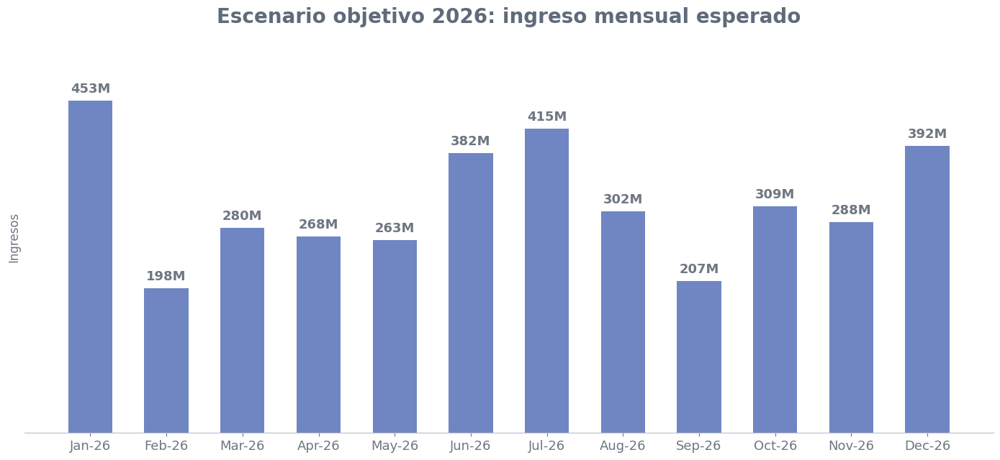

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Preparar base
# =========================================================
df_plot = ingreso_optimo_mensual_2026.copy()

# Asegurar formato fecha
if str(df_plot["mes"].dtype) == "period[M]":
    df_plot["mes"] = df_plot["mes"].dt.to_timestamp()
else:
    df_plot["mes"] = pd.to_datetime(df_plot["mes"], errors="coerce")

# =========================================================
# 2. Función formato millones
# =========================================================
def formato_millones(x):
    valor_m = x / 1_000_000
    return f"{valor_m:,.0f}M".replace(",", ".")

# =========================================================
# 3. Colores estilo presentación
# =========================================================
azul_medio = "#6F86C3"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 4. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.5))

bars = ax.bar(
    df_plot["mes"].dt.strftime("%b-%y"),
    df_plot["ingreso_optimo_mes"],
    color=azul_medio,
    edgecolor="none",
    width=0.58
)

# =========================================================
# 5. Etiquetas sobre barras
# =========================================================
for bar, valor in zip(bars, df_plot["ingreso_optimo_mes"]):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + df_plot["ingreso_optimo_mes"].max() * 0.015,
        formato_millones(valor),
        ha="center",
        va="bottom",
        fontsize=13,
        fontweight="bold",
        color=gris_texto
    )

# =========================================================
# 6. Estilo
# =========================================================
ax.set_title(
    "Escenario objetivo 2026: ingreso mensual esperado",
    fontsize=20,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_xlabel("")
ax.set_ylabel("Ingresos", fontsize=12, color=gris_texto)

# Ocultar eje Y para look limpio
ax.set_yticks([])
ax.spines["left"].set_visible(False)

# Eje X
ax.tick_params(axis="x", labelsize=13, colors=gris_texto)

# Bordes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

# Espacio arriba para etiquetas
ax.set_ylim(0, df_plot["ingreso_optimo_mes"].max() * 1.18)

plt.tight_layout()
plt.show()

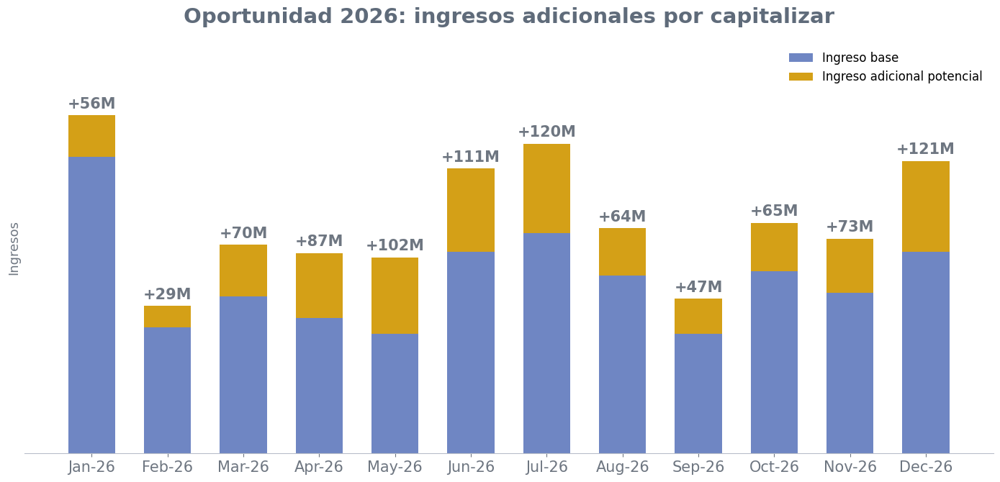

Ingreso base anual 2026: COP 2.813.531.931
Ingreso óptimo anual 2026: COP 3.756.630.121
Oportunidad anual adicional: COP 943.098.190
Oportunidad anual adicional: 943M COP


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. Copiar y preparar bases
# =========================================================
df_base = ingreso_mensual_2026.copy()
df_opt = ingreso_optimo_mensual_2026.copy()

# Asegurar formato fecha
if str(df_base["mes"].dtype) == "period[M]":
    df_base["mes"] = df_base["mes"].dt.to_timestamp()
else:
    df_base["mes"] = pd.to_datetime(df_base["mes"], errors="coerce")

if str(df_opt["mes"].dtype) == "period[M]":
    df_opt["mes"] = df_opt["mes"].dt.to_timestamp()
else:
    df_opt["mes"] = pd.to_datetime(df_opt["mes"], errors="coerce")

# =========================================================
# 2. Unir bases
# =========================================================
df_plot = df_base.merge(
    df_opt,
    on="mes",
    how="inner"
)

# Renombrar para mayor claridad
df_plot = df_plot.rename(columns={
    "ingreso_pred_mes": "ingreso_base_mes",
    "ingreso_optimo_mes": "ingreso_optimo_mes"
})

# =========================================================
# 3. Calcular oportunidad mensual
# =========================================================
df_plot["oportunidad_mes"] = (
    df_plot["ingreso_optimo_mes"] - df_plot["ingreso_base_mes"]
)

# Si quieres evitar negativos por cualquier razón:
df_plot["oportunidad_mes"] = df_plot["oportunidad_mes"].clip(lower=0)

# =========================================================
# 4. Función formato millones
# =========================================================
def formato_millones(x):
    valor_m = x / 1_000_000
    return f"{valor_m:,.0f}M".replace(",", ".")

# =========================================================
# 5. Colores estilo presentación
# =========================================================
azul_medio = "#6F86C3"
dorado = "#D4A017"
gris_titulo = "#5F6B7A"
gris_texto = "#6E7681"
gris_eje = "#B8BEC9"

# =========================================================
# 6. Gráfico
# =========================================================
fig, ax = plt.subplots(figsize=(14, 6.8))

x_labels = df_plot["mes"].dt.strftime("%b-%y")

# Barra base
bars_base = ax.bar(
    x_labels,
    df_plot["ingreso_base_mes"],
    color=azul_medio,
    edgecolor="none",
    width=0.62,
    label="Ingreso base"
)

# Barra oportunidad apilada encima
bars_opp = ax.bar(
    x_labels,
    df_plot["oportunidad_mes"],
    bottom=df_plot["ingreso_base_mes"],
    color=dorado,
    edgecolor="none",
    width=0.62,
    label="Ingreso adicional potencial"
)

# =========================================================
# 7. Etiquetas de oportunidad
# =========================================================
for base, opp in zip(df_plot["ingreso_base_mes"], df_plot["oportunidad_mes"]):
    if opp > 0:
        ax.text(
            x_labels.iloc[list(df_plot["ingreso_base_mes"]).index(base)],
            base + opp + df_plot["ingreso_optimo_mes"].max() * 0.012,
            f"+{formato_millones(opp)}",
            ha="center",
            va="bottom",
            fontsize=15,
            fontweight="bold",
            color=gris_texto
        )

# =========================================================
# 8. Título y estilo
# =========================================================
ax.set_title(
    "Oportunidad 2026: ingresos adicionales por capitalizar",
    fontsize=21,
    fontweight="bold",
    color=gris_titulo,
    pad=18
)

ax.set_xlabel("")
ax.set_ylabel("Ingresos", fontsize=13, color=gris_texto)

# Limpiar eje Y para mantener look ejecutivo
ax.set_yticks([])
ax.spines["left"].set_visible(False)

ax.tick_params(axis="x", labelsize=15, colors=gris_texto)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color(gris_eje)

ax.grid(False)

# Leyenda
leg = ax.legend(
    frameon=False,
    fontsize=12,
    loc="upper right"
)

# Dar aire arriba
ax.set_ylim(0, df_plot["ingreso_optimo_mes"].max() * 1.22)

plt.tight_layout()
plt.show()

# =========================================================
# 9. Resumen anual
# =========================================================
ingreso_base_anual = df_plot["ingreso_base_mes"].sum()
ingreso_optimo_anual = df_plot["ingreso_optimo_mes"].sum()
oportunidad_anual = df_plot["oportunidad_mes"].sum()

print(f"Ingreso base anual 2026: COP {ingreso_base_anual:,.0f}".replace(",", "."))
print(f"Ingreso óptimo anual 2026: COP {ingreso_optimo_anual:,.0f}".replace(",", "."))
print(f"Oportunidad anual adicional: COP {oportunidad_anual:,.0f}".replace(",", "."))
print(f"Oportunidad anual adicional: {oportunidad_anual / 1_000_000:,.0f}M COP".replace(",", "."))